<a href="https://colab.research.google.com/github/ahmedengu/feature_importance/blob/master/Forex/EURUSD/EURUSD_1H_High.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from IPython.display import clear_output
import pandas as pd

try:
  from findatapy.market import Market, MarketDataRequest, MarketDataGenerator
except:
  # install
  !apt-get install default-jre build-essential swig
  !pip  install h2o==3.24.0.5 yfinance==0.1.43
  !pip  install git+https://github.com/ahmedengu/findatapy.git
  clear_output(wait=True)

  !wget http://prdownloads.sourceforge.net/ta-lib/ta-lib-0.4.0-src.tar.gz
  !tar -xzvf ta-lib-0.4.0-src.tar.gz
  %cd ta-lib
  !./configure --prefix=/usr
  clear_output(wait=True)
  !make
  clear_output(wait=True)
  !make install
  clear_output(wait=True)
  !pip install Ta-Lib==0.4.17
  clear_output(wait=True)

     |████████████████████████████████| 727kB 2.8MB/s 
  Created wheel for Ta-Lib: filename=TA_Lib-0.4.17-cp36-cp36m-linux_x86_64.whl size=2405588 sha256=1258dd984387ee288896d325da9d8631f0305358b211b004b91eed82b7ca2f20
  Stored in directory: /root/.cache/pip/wheels/2a/2e/ec/71c565b2e0091e03a2b56abfbfd062f14a01a8d7b20ffe8bd5
Successfully built Ta-Lib


In [0]:
# Experiment Config
import pandas as pd
from IPython.display import display
from IPython.core.debugger import set_trace

data_ticker = "EURUSD"
data_resample = '1H'
data_label = 'High'
data_label_name = 'y'
start_date = '1 Jan 2018'
finish_date = '1 Jan 2019'
is_duka = True
is_yahoo = False
kaggle_file = 'bitstamp' # default None
kaggle_folder = '1 Day/Stocks'

folds = 0 # should be 0, corss validation cause overfitting

models_summary = {}
for metric in ['accuracy','F1','auc','logloss','mean_per_class_error','rmse','mse']:
  models_summary.update({metric:pd.DataFrame()})

best_models = {}
ensemble_model_threshold = 0.05
split_percentages = [0.2,0.1] # validation size, test size

# feature elimination config
model_selected_features = 50
PCA_k = 50
HCF_threshold = 0.90
LVF_threshold = 0.1
GLRM_k = 20
select_k = 50
select_percentile = 10
select_alpha = 0.1
select_rfe = 50
cv_rfe = 5

features_to_include = ['All', 'DLF', 'XGBF', 'RFE', 'Fwe', 'Super_learner'] # True for all , ['All','Fwe','RFE','RFECV','Percentile','KBest','LVF','HCF','PCA','XGBF','GLMF','DLF','GLRM'] 
algos_to_include = [None, 'GLM' ,'XGBoost' ,'DeepLearning'] # [None, 'DRF', 'GLM' ,'XGBoost' ,'GBM' ,'DeepLearning' ,'StackedEnsemble'], None for all
is_EDA = True
is_minmax = True # use minmax
max_models_num = 10

# pandas options
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [3]:
# random seed
from numpy.random import seed
seed(1)
from tensorflow import set_random_seed
set_random_seed(1)
import pandas as pd
import gc
import os

resample_how= {'Open': 'first', 'High': 'max', 'Low': 'min', 'Close': 'last',
                             'Volume': 'sum', 'Date': 'first'}

if is_duka:
  from findatapy.util import DataConstants

  DataConstants.market_thread_no.update({'dukascopy': 64})

  # Download dataset
  from findatapy.market import Market, MarketDataRequest, MarketDataGenerator

  market = Market(market_data_generator=MarketDataGenerator(log_every_day=30))

  md_request = MarketDataRequest(start_date=start_date, finish_date=finish_date,
                                       fields=['temp', 'ask', 'bid', 'askv', 'bidv'], vendor_fields=['temp', 'ask', 'bid', 'askv', 'bidv'],
                                       freq='tick', data_source='dukascopy',
                                       tickers=[data_ticker], vendor_tickers=[data_ticker])

  temp_dataset = market.fetch_market(md_request)
  full_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bid'].resample(data_resample).ohlc())
  full_dataset.columns = ['Open', 'High', 'Low', 'Close']
  temp_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bidv'].resample(data_resample).sum())
  temp_dataset.columns = ['Volume']
  full_dataset['Volume'] = temp_dataset['Volume']

  del temp_dataset, md_request, market, DataConstants, Market, MarketDataRequest, MarketDataGenerator

  gc.collect()

elif is_yahoo:
  import yfinance as yf
  from datetime import datetime

  full_dataset = yf.download(data_ticker, start=str(datetime.strptime(start_date, '%d %b %Y')).split(' ')[0], end=str(datetime.strptime(finish_date, '%d %b %Y')).split(' ')[0])
  full_dataset['Date']=full_dataset.index
  del yf,datetime

elif data_ticker == 'EURUSD':
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2014.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2015.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2016.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2017.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2018.zip
  !unzip -qq -o \*.zip
  full_dataset = pd.read_csv('DAT_ASCII_EURUSD_M1_2014.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';')
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2015.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2016.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2017.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2018.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset['Date'] = pd.to_datetime(full_dataset['Date'])
  full_dataset.index = full_dataset['Date']
  full_dataset = full_dataset.dropna()
  full_dataset = full_dataset.sort_index()
  full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]


    
elif data_ticker == 'APPLUSUSD':
  full_dataset=pd.read_csv('https://github.com/kyleconroy/apple-stock/raw/master/apple_stock_data.csv',index_col =0,parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > '2007-04-01']


elif data_ticker == 'COMI':
  full_dataset=pd.read_csv('https://static.mubasher.info/File.MubasherCharts/File.Historical_Stock_Charts_Dir/44507230b2b03e2da37352abf1a659545b44.csv',index_col =0,names =['Open', 'High', 'Low', 'Close','Volume'],parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Volume'] = full_dataset['Volume'] * full_dataset['Close'] 
  full_dataset = full_dataset.drop_duplicates()
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]
  
elif kaggle_file is not None:
  if not os.path.isfile('kaggle.json'):
    from google.colab import files
    files.upload()
    
    import time
    time.sleep(10)
    !ls
    !mkdir -p ~/.kaggle
    !cp kaggle.json ~/.kaggle/
    !ls ~/.kaggle

    !chmod 600 /root/.kaggle/kaggle.json
    del files
    
  !kaggle datasets download $data_ticker
  !unzip -qq -o \*.zip
  !unzip -qq -o \*.zip

  if data_ticker == 'mczielinski/bitcoin-historical-data':
    
    full_dataset = pd.read_csv([file for file in os.listdir() if kaggle_file in file][0])
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Volume_(Currency)','Weighted_Price']
    full_dataset.index=pd.to_datetime(full_dataset['Date'], unit='s')

    resample_how.update({'Volume_(Currency)': 'sum', 'Weighted_Price': 'last'})

    full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()[1:-1]
    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]
  
  elif data_ticker == 'borismarjanovic/daily-and-intraday-stock-price-data':
    
    full_dataset = pd.read_csv(kaggle_folder + '/' + [file for file in os.listdir(kaggle_folder) if kaggle_file in file][0])
    if 'Time' in full_dataset.columns:
      full_dataset['Date'] = pd.to_datetime(full_dataset['Date'] + ' ' + full_dataset['Time'])
      full_dataset = full_dataset.drop('Time',axis=1)
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'OpenInt']
    full_dataset.index=pd.to_datetime(full_dataset['Date'])

    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]

  
gc.collect()
full_dataset = full_dataset.dropna()

full_dataset = full_dataset.drop('Date',axis=1, errors='ignore')
full_dataset = full_dataset.sort_index()
full_dataset = full_dataset[-100000:]
display(full_dataset)
display(full_dataset.describe())
full_dataset.to_pickle('full_dataset')
del full_dataset, set_random_seed, seed
gc.collect()

2019-12-08 05:51:44,530 - findatapy.market.datavendorweb - INFO - Request Dukascopy data
2019-12-08 05:51:44,531 - findatapy.market.datavendorweb - INFO - About to download from Dukascopy... for EURUSD
2019-12-08 05:51:49,939 - numexpr.utils - INFO - NumExpr defaulting to 4 threads.
2019-12-08 05:55:17,355 - findatapy.market.datavendorweb - INFO - Downloading... 2018-01-30 00:00:00
2019-12-08 06:02:41,456 - findatapy.market.datavendorweb - INFO - Downloading... 2018-03-30 00:00:00
2019-12-08 06:06:17,577 - findatapy.market.datavendorweb - INFO - Downloading... 2018-04-30 00:00:00
2019-12-08 06:10:00,050 - findatapy.market.datavendorweb - INFO - Downloading... 2018-05-30 00:00:00
2019-12-08 06:13:53,023 - findatapy.market.datavendorweb - INFO - Downloading... 2018-06-30 00:00:00
2019-12-08 06:17:29,650 - findatapy.market.datavendorweb - INFO - Downloading... 2018-07-30 00:00:00
2019-12-08 06:21:13,840 - findatapy.market.datavendorweb - INFO - Downloading... 2018-08-30 00:00:00
2019-12-0

/usr/local/lib/python3.6/dist-packages/findatapy/market/ioengine.py:264: FutureWarning: to_msgpack is deprecated and will be removed in a future version.
It is recommended to use pyarrow for on-the-wire transmission of pandas objects.
  r.set(fname, data_frame.to_msgpack(compress='blosc'))


2019-12-08 06:36:30,893 - findatapy.market.ioengine - WARNING - Couldn't push MarketDataRequest_436__abstract_curve_key-None__category-None__category_key-backtest_default-cat_dukascopy_tick_NYC_EURUSD__cut-NYC__data_source-dukascopy__environment-backtest__expiry_date-NaT__fields-temp_ask_bid_askv_bidv__finish_date-2019-01-01 00:00:00__freq-tick__freq_mult-1__gran_freq-None__resample-None__resample_how-last__start_date-2018-01-01 00:00:00__tickers-EURUSD__trade_side-trade__vendor_fields-temp_ask_bid_askv_bidv__vendor_tickers-EURUSD to Redis: Error 111 connecting to 127.0.0.1:6379. Connection refused.


,Open,High,Low,Close,Volume
Date,,,,,
2018-01-01 22:00:00,1.20102,1.20166,1.20007,1.20136,1687.290039
2018-01-01 23:00:00,1.20137,1.20158,1.20026,1.20106,6885.930176
2018-01-02 00:00:00,1.20105,1.20177,1.20092,1.20160,4362.529785
2018-01-02 01:00:00,1.20159,1.20231,1.20139,1.20154,5860.189941
2018-01-02 02:00:00,1.20153,1.20163,1.20078,1.20095,6161.259766
...,...,...,...,...,...
2018-12-31 18:00:00,1.14515,1.14549,1.14424,1.14452,11589.769531
2018-12-31 19:00:00,1.14452,1.14563,1.14446,1.14534,8138.859863
2018-12-31 20:00:00,1.14536,1.14612,1.14536,1.14561,5789.660156


,Open,High,Low,Close,Volume
count,6221.000000,6221.000000,6221.000000,6221.000000,6221.000000
mean,1.181234,1.182019,1.180465,1.181227,10596.013672
std,0.036889,0.036928,0.036841,0.036890,5908.182617
min,1.121740,1.122470,1.121560,1.121770,5.250000
25%,1.152390,1.153310,1.151610,1.152380,6075.970215
50%,1.169200,1.169930,1.168530,1.169190,10352.379883
75%,1.223890,1.224710,1.223120,1.223900,14169.230469
max,1.254880,1.255530,1.254320,1.254880,146464.656250


0

In [4]:
# OHLC EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('full_dataset')))
  del pp

/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/pandas_profiling/describe.py:392: FutureWarning: The join_axes-keyword is deprecated. Use .reindex or .reindex_like on the result to achieve the same functionality.
  variable_stats = pd.concat(ldesc, join_axes=pd.Index([names]), axis=1)


Number of variables,6
Number of observations,6221
Total Missing (%),0.0%
Total size in memory,170.2 KiB
Average record size in memory,28.0 B
Numeric,2
Categorical,0
Boolean,0
Date,1
Text (Unique),0
Rejected,3


In [5]:
# features
from talib._ta_lib import *
import talib
import numpy as np
import os

def fe(last_index = None):
  features_dataset = pd.read_pickle('full_dataset').sort_index()
  if last_index is not None:
    features_dataset = features_dataset[:-last_index]


  periods = np.resize([2, 3, 3, 2], len(features_dataset['Close'])).astype(float)
  timeperiods = [8, 12, 14, 20, 24, 30]
  matypes = [0,1,2,3,4,5,6,8]
  nbdevs = [2, 3, 4, 5]

  # date features
  features_dataset['day'] = features_dataset.index.day
  features_dataset['dayofweek'] = features_dataset.index.dayofweek
  features_dataset['dayofyear'] = features_dataset.index.dayofyear
  features_dataset['days_in_month'] = features_dataset.index.days_in_month
  features_dataset['hour'] = features_dataset.index.hour
  features_dataset['is_month_end'] = pd.factorize(features_dataset.index.is_month_end)[0]
  features_dataset['is_month_start'] = pd.factorize(features_dataset.index.is_month_start)[0]
  features_dataset['is_quarter_end'] = pd.factorize(features_dataset.index.is_quarter_end)[0]
  features_dataset['is_quarter_start'] = pd.factorize(features_dataset.index.is_quarter_start)[0]
  features_dataset['minute'] = features_dataset.index.minute
  features_dataset['month'] = features_dataset.index.month
  features_dataset['quarter'] = features_dataset.index.quarter
  features_dataset['second'] = features_dataset.index.second
  features_dataset['week'] = features_dataset.index.week
  features_dataset['weekday'] = features_dataset.index.weekday
  features_dataset['weekday_name'] = pd.factorize(features_dataset.index.weekday_name)[0]
  features_dataset['weekofyear'] = features_dataset.index.weekofyear

  # Overlap Studies
  features_dataset['HT_TRENDLINE'] = HT_TRENDLINE(features_dataset['Close'])
  features_dataset['mama'], features_dataset['fama'] = MAMA(features_dataset['Close'])
  features_dataset['SAREXT'] = SAREXT(features_dataset['High'], features_dataset['Low'], startvalue=-4e37,
                                      offsetonreverse=-4e37, accelerationinitlong=-4e37,
                                      accelerationlong=-4e37, accelerationmaxlong=-4e37, accelerationinitshort=-4e37,
                                      accelerationshort=-4e37, accelerationmaxshort=-4e37)

  for timeperiod in timeperiods:
      features_dataset['DEMA_' + str(timeperiod)] = DEMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['EMA_' + str(timeperiod)] = EMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['KAMA_' + str(timeperiod)] = KAMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MIDPOINT_' + str(timeperiod)] = MIDPOINT(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MIDPRICE_' + str(timeperiod)] = MIDPRICE(features_dataset['High'], features_dataset['Low'],
                                                                timeperiod=timeperiod)
      features_dataset['SAR_' + str(timeperiod / 100)] = SAR(features_dataset['High'], features_dataset['Low'],
                                                            acceleration=timeperiod / 100,
                                                            maximum=timeperiod / 100)
      features_dataset['SMA_' + str(timeperiod)] = SMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['TEMA_' + str(timeperiod)] = TEMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['TRIMA_' + str(timeperiod)] = TRIMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['WMA_' + str(timeperiod)] = WMA(features_dataset['Close'], timeperiod=timeperiod)

      for matype in matypes:
          features_dataset['MA_' + str(timeperiod) + '_' + str(matype)] = MA(features_dataset['Close'],
                                                                            timeperiod=timeperiod, matype=matype)
          features_dataset['MAVP_' + str(timeperiod) + '_' + str(matype)] = MAVP(features_dataset['Close'], periods,
                                                                                minperiod=2,
                                                                                maxperiod=timeperiod, matype=matype)
          features_dataset['T3_' + str(timeperiod) + '_' + str(matype)] = T3(features_dataset['Close'],
                                                                            timeperiod=timeperiod,
                                                                            vfactor=matype / 10)

          for nbdev in nbdevs:
              features_dataset['BBANDS_upperband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
              features_dataset['BBANDS_middleband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
              features_dataset['BBANDS_lowerband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)] = BBANDS(
                  features_dataset['Close'], timeperiod=timeperiod, nbdevup=nbdev, nbdevdn=nbdev, matype=matype)

              
  gc.collect()
  # Momentum Indicators
  features_dataset['BOP'] = BOP(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                features_dataset['Close'])

  for timeperiod in timeperiods:
      features_dataset['ADX_' + str(timeperiod)] = ADX(features_dataset['High'], features_dataset['Low'],
                                                      features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['ADXR_' + str(timeperiod)] = ADXR(features_dataset['High'], features_dataset['Low'],
                                                        features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['aroondown_' + str(timeperiod)], features_dataset['aroonup_' + str(timeperiod)] = AROON(
          features_dataset['High'],
          features_dataset['Low'],
          timeperiod=timeperiod)
      features_dataset['AROONOSC_' + str(timeperiod)] = AROONOSC(features_dataset['High'], features_dataset['Low'],
                                                                timeperiod=timeperiod)
      features_dataset['CCI_' + str(timeperiod)] = CCI(features_dataset['High'], features_dataset['Low'],
                                                      features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['CMO_' + str(timeperiod)] = CMO(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['DX_' + str(timeperiod)] = DX(features_dataset['High'], features_dataset['Low'],
                                                    features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MACDFIX_' + str(timeperiod)], features_dataset['MACDFIX_signal_' + str(timeperiod)], features_dataset[
          'MACDFIX_hist_' + str(timeperiod)] = MACDFIX(features_dataset['Close'], signalperiod=timeperiod)
      features_dataset['MFI_' + str(timeperiod)] = MFI(features_dataset['High'], features_dataset['Low'],
                                                      features_dataset['Close'], features_dataset['Volume'],
                                                      timeperiod=timeperiod)
      features_dataset['MINUS_DI_' + str(timeperiod)] = MINUS_DI(features_dataset['High'], features_dataset['Low'],
                                                                features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MINUS_DM_' + str(timeperiod)] = MINUS_DM(features_dataset['High'], features_dataset['Low'],
                                                                timeperiod=timeperiod)
      features_dataset['MOM_' + str(timeperiod)] = MOM(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['PLUS_DI_' + str(timeperiod)] = PLUS_DI(features_dataset['High'], features_dataset['Low'],
                                                              features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['PLUS_DM_' + str(timeperiod)] = PLUS_DM(features_dataset['High'], features_dataset['Low'],
                                                              timeperiod=timeperiod)
      features_dataset['ROC_' + str(timeperiod)] = ROC(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['ROCP_' + str(timeperiod)] = ROCP(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['ROCR_' + str(timeperiod)] = ROCR(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['ROCR100_' + str(timeperiod)] = ROCR100(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['RSI_' + str(timeperiod)] = RSI(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['TRIX_' + str(timeperiod)] = TRIX(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['WILLR_' + str(timeperiod)] = WILLR(features_dataset['High'], features_dataset['Low'],
                                                          features_dataset['Close'], timeperiod=timeperiod)

      
  gc.collect()
  features_dataset['APO'] = APO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

  features_dataset['MACD'], features_dataset['MACD_signal'], features_dataset['MACD_hist'] = MACD(
      features_dataset['Close'], fastperiod=12,
      slowperiod=26,
      signalperiod=9)
  features_dataset['MACDEXT'], features_dataset['MACDEXT_signal'], features_dataset['MACDEXT_hist'] = MACDEXT(
      features_dataset['Close'],
      fastperiod=12,
      fastmatype=0,
      slowperiod=26,
      slowmatype=0,
      signalperiod=9,
      signalmatype=0)

  features_dataset['PPO'] = PPO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

  features_dataset['STOCH_slowk'], features_dataset['STOCH_slowd'] = STOCH(features_dataset['High'],
                                                                          features_dataset['Low'],
                                                                          features_dataset['Close'], fastk_period=5,
                                                                          slowk_period=3, slowk_matype=0,
                                                                          slowd_period=3, slowd_matype=0)
  features_dataset['STOCHF_fastk'], features_dataset['STOCHF_fastd'] = STOCHF(features_dataset['High'],
                                                                              features_dataset['Low'],
                                                                              features_dataset['Close'], fastk_period=5,
                                                                              fastd_period=3, fastd_matype=0)
  features_dataset['STOCHRSI_fastk'], features_dataset['STOCHRSI_fastd'] = STOCHRSI(features_dataset['Close'],
                                                                                    timeperiod=14,
                                                                                    fastk_period=5, fastd_period=3,
                                                                                    fastd_matype=0)
  features_dataset['ULTOSC'] = ULTOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                      timeperiod1=7, timeperiod2=14, timeperiod3=28)

  # Volume Indicators
  features_dataset['AD'] = AD(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                              features_dataset['Volume'])
  features_dataset['ADOSC'] = ADOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                    features_dataset['Volume'], fastperiod=3, slowperiod=10)
  features_dataset['OBV'] = OBV(features_dataset['Close'], features_dataset['Volume'])

  gc.collect()
  # Volatility Indicators
  for timeperiod in timeperiods:
      features_dataset['ATR_' + str(timeperiod)] = ATR(features_dataset['High'], features_dataset['Low'],
                                                      features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['NATR_' + str(timeperiod)] = NATR(features_dataset['High'], features_dataset['Low'],
                                                        features_dataset['Close'], timeperiod=timeperiod)

  features_dataset['TRANGE'] = TRANGE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

  # Price Transform
  features_dataset['AVGPRICE'] = AVGPRICE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
  features_dataset['MEDPRICE'] = MEDPRICE(features_dataset['High'], features_dataset['Low'])
  features_dataset['TYPPRICE'] = TYPPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])
  features_dataset['WCLPRICE'] = WCLPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

  gc.collect()
  # Cycle Indicators
  features_dataset['HT_DCPERIOD'] = HT_DCPERIOD(features_dataset['Close'])
  features_dataset['HT_DCPHASE'] = HT_DCPHASE(features_dataset['Close'])
  features_dataset['HT_PHASOR_inphase'], features_dataset['HT_PHASOR_quadrature'] = HT_PHASOR(features_dataset['Close'])
  features_dataset['HT_SINE_sine'], features_dataset['HT_SINE_leadsine'] = HT_SINE(features_dataset['Close'])
  features_dataset['HT_TRENDMODE'] = HT_TRENDMODE(features_dataset['Close'])

  # Pattern Recognition
  features_dataset['CDL2CROWS'] = CDL2CROWS(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDL3BLACKCROWS'] = CDL3BLACKCROWS(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDL3INSIDE'] = CDL3INSIDE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                              features_dataset['Close'])
  features_dataset['CDL3LINESTRIKE'] = CDL3LINESTRIKE(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDL3OUTSIDE'] = CDL3OUTSIDE(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDL3STARSINSOUTH'] = CDL3STARSINSOUTH(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDL3WHITESOLDIERS'] = CDL3WHITESOLDIERS(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLABANDONEDBABY'] = CDLABANDONEDBABY(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'],
                                                          penetration=0)
  features_dataset['CDLADVANCEBLOCK'] = CDLADVANCEBLOCK(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLBELTHOLD'] = CDLBELTHOLD(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLBREAKAWAY'] = CDLBREAKAWAY(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLCLOSINGMARUBOZU'] = CDLCLOSINGMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLCONCEALBABYSWALL'] = CDLCONCEALBABYSWALL(features_dataset['Open'], features_dataset['High'],
                                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLCOUNTERATTACK'] = CDLCOUNTERATTACK(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLDARKCLOUDCOVER'] = CDLDARKCLOUDCOVER(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'],
                                                            penetration=0)
  features_dataset['CDLDOJI'] = CDLDOJI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                        features_dataset['Close'])
  features_dataset['CDLDOJISTAR'] = CDLDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLDRAGONFLYDOJI'] = CDLDRAGONFLYDOJI(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLENGULFING'] = CDLENGULFING(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLEVENINGDOJISTAR'] = CDLEVENINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'],
                                                              penetration=0)
  features_dataset['CDLEVENINGSTAR'] = CDLEVENINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'], penetration=0)
  features_dataset['CDLGAPSIDESIDEWHITE'] = CDLGAPSIDESIDEWHITE(features_dataset['Open'], features_dataset['High'],
                                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLGRAVESTONEDOJI'] = CDLGRAVESTONEDOJI(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLHAMMER'] = CDLHAMMER(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDLHANGINGMAN'] = CDLHANGINGMAN(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLHARAMI'] = CDLHARAMI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDLHARAMICROSS'] = CDLHARAMICROSS(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLHIGHWAVE'] = CDLHIGHWAVE(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLHIKKAKE'] = CDLHIKKAKE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                              features_dataset['Close'])
  features_dataset['CDLHIKKAKEMOD'] = CDLHIKKAKEMOD(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLHOMINGPIGEON'] = CDLHOMINGPIGEON(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLIDENTICAL3CROWS'] = CDLIDENTICAL3CROWS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLINNECK'] = CDLINNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDLINVERTEDHAMMER'] = CDLINVERTEDHAMMER(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLKICKING'] = CDLKICKING(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                              features_dataset['Close'])
  features_dataset['CDLKICKINGBYLENGTH'] = CDLKICKINGBYLENGTH(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLLADDERBOTTOM'] = CDLLADDERBOTTOM(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLLONGLEGGEDDOJI'] = CDLLONGLEGGEDDOJI(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLLONGLINE'] = CDLLONGLINE(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLMARUBOZU'] = CDLMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLMATCHINGLOW'] = CDLMATCHINGLOW(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLMATHOLD'] = CDLMATHOLD(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                              features_dataset['Close'], penetration=0)
  features_dataset['CDLMORNINGDOJISTAR'] = CDLMORNINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'],
                                                              penetration=0)
  features_dataset['CDLMORNINGSTAR'] = CDLMORNINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'], penetration=0)
  features_dataset['CDLONNECK'] = CDLONNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDLPIERCING'] = CDLPIERCING(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLRICKSHAWMAN'] = CDLRICKSHAWMAN(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLRISEFALL3METHODS'] = CDLRISEFALL3METHODS(features_dataset['Open'], features_dataset['High'],
                                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSEPARATINGLINES'] = CDLSEPARATINGLINES(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSHOOTINGSTAR'] = CDLSHOOTINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSHORTLINE'] = CDLSHORTLINE(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSPINNINGTOP'] = CDLSPINNINGTOP(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSTALLEDPATTERN'] = CDLSTALLEDPATTERN(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSTICKSANDWICH'] = CDLSTICKSANDWICH(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLTAKURI'] = CDLTAKURI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDLTASUKIGAP'] = CDLTASUKIGAP(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLTHRUSTING'] = CDLTHRUSTING(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLUNIQUE3RIVER'] = CDLUNIQUE3RIVER(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLUPSIDEGAP2CROWS'] = CDLUPSIDEGAP2CROWS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLXSIDEGAP3METHODS'] = CDLXSIDEGAP3METHODS(features_dataset['Open'], features_dataset['High'],
                                                                features_dataset['Low'], features_dataset['Close'])
  gc.collect()

  # Statistic Functions
  for timeperiod in timeperiods:
      features_dataset['BETA_' + str(timeperiod)] = BETA(features_dataset['High'], features_dataset['Low'],
                                                        timeperiod=timeperiod)
      features_dataset['CORREL_' + str(timeperiod)] = CORREL(features_dataset['High'], features_dataset['Low'],
                                                            timeperiod=timeperiod)
      features_dataset['LINEARREG_' + str(timeperiod)] = LINEARREG(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['LINEARREG_ANGLE_' + str(timeperiod)] = LINEARREG_ANGLE(features_dataset['Close'],
                                                                              timeperiod=timeperiod)
      features_dataset['LINEARREG_INTERCEPT_' + str(timeperiod)] = LINEARREG_INTERCEPT(features_dataset['Close'],
                                                                                      timeperiod=timeperiod)
      features_dataset['LINEARREG_SLOPE_' + str(timeperiod)] = LINEARREG_SLOPE(features_dataset['Close'],
                                                                              timeperiod=timeperiod)
      features_dataset['STDDEV_' + str(timeperiod)] = STDDEV(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)
      features_dataset['TSF_' + str(timeperiod)] = TSF(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['VAR_' + str(timeperiod)] = VAR(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)

      
  gc.collect()
  # Math Transform
  features_dataset['ACOS'] = ACOS(features_dataset['Close'])
  features_dataset['ASIN'] = ASIN(features_dataset['Close'])
  features_dataset['ATAN'] = ATAN(features_dataset['Close'])
  features_dataset['CEIL'] = CEIL(features_dataset['Close'])
  features_dataset['COS'] = COS(features_dataset['Close'])
  features_dataset['COSH'] = COSH(features_dataset['Close'])
  features_dataset['EXP'] = EXP(features_dataset['Close'])
  features_dataset['FLOOR'] = FLOOR(features_dataset['Close'])
  features_dataset['LN'] = LN(features_dataset['Close'])
  features_dataset['LOG10'] = LOG10(features_dataset['Close'])
  features_dataset['SIN'] = SIN(features_dataset['Close'])
  features_dataset['SINH'] = SINH(features_dataset['Close'])
  features_dataset['SQRT'] = SQRT(features_dataset['Close'])
  features_dataset['TAN'] = TAN(features_dataset['Close'])
  features_dataset['TANH'] = TANH(features_dataset['Close'])

  gc.collect()
  # Math Operator
  features_dataset['ADD'] = ADD(features_dataset['High'], features_dataset['Low'])
  features_dataset['DIV'] = DIV(features_dataset['High'], features_dataset['Low'])
  features_dataset['MULT'] = MULT(features_dataset['High'], features_dataset['Low'])
  features_dataset['SUB'] = SUB(features_dataset['High'], features_dataset['Low'])

  for timeperiod in timeperiods:
      features_dataset['MAX_' + str(timeperiod)] = MAX(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MIN_' + str(timeperiod)] = MIN(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MINMAX_min_' + str(timeperiod)], features_dataset['MINMAX_max_' + str(timeperiod)] = MINMAX(
          features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['SUM_' + str(timeperiod)] = SUM(features_dataset['Close'], timeperiod=timeperiod)
      
  gc.collect()


  features_dataset = features_dataset.drop(features_dataset.std()[(features_dataset.std() == 0)].index, axis=1)
  features_dataset = features_dataset[50:].replace([np.inf, -np.inf], np.nan).dropna(axis=1)
  features_dataset.to_pickle('features_dataset' if last_index is None else 'features_dataset_' + str(last_index))
  if last_index is None:
    display(features_dataset)
    display(features_dataset.describe())

  del periods, timeperiods, matypes, nbdevs, features_dataset
  gc.collect()

fe()

,Open,High,Low,Close,Volume,day,dayofweek,dayofyear,days_in_month,hour,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBANDS_lowerband_12_2_5,MA_12_3,MAVP_12_3,BBANDS_upperband_12_3_2,BBANDS_middleband_12_3_2,BBANDS_lowerband_12_3_2,BBANDS_upperband_12_3_3,BBANDS_middleband_12_3_3,BBANDS_lowerband_12_3_3,BBANDS_upperband_12_3_4,BBANDS_middleband_12_3_4,BBANDS_lowerband_12_3_4,BBANDS_upperband_12_3_5,BBANDS_middleband_12_

,Open,High,Low,Close,Volume,day,dayofweek,dayofyear,days_in_month,hour,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBANDS_lowerband_12_2_5,MA_12_3,MAVP_12_3,BBANDS_upperband_12_3_2,BBANDS_middleband_12_3_2,BBANDS_lowerband_12_3_2,BBANDS_upperband_12_3_3,BBANDS_middleband_12_3_3,BBANDS_lowerband_12_3_3,BBANDS_upperband_12_3_4,BBANDS_middleband_12_3_4,BBANDS_lowerband_12_3_4,BBANDS_upperband_12_3_5,BBANDS_middleband_12_

In [6]:
# features EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('features_dataset')))
  del pp

Output hidden; open in https://colab.research.google.com to view.

In [7]:
# check features data leakage
fe(100)
long_df = pd.read_pickle('features_dataset')[:-100]
short_df =  pd.read_pickle('features_dataset_100')
if False in (long_df.index.values == short_df.index.values):
  print('mismatch INDEX', long_df.index.values == short_df.index.values)

for aCol in long_df.columns.values:
  try:
    if False in (long_df[aCol].values == short_df[aCol].values):
      print('mismatch, ', aCol, long_df[aCol].values == short_df[aCol].values)
  except:
    print('mismatch exception, ', aCol)

for name in dir():
  if any( n in name for n in talib.get_functions()):
    del globals()[name]

del talib, long_df, short_df
gc.collect()
print('Nothing should be printed above')

Nothing should be printed above


In [8]:
# label and scale
import numpy as np
from sklearn.preprocessing import minmax_scale
import os
import pandas as pd

features_dataset = pd.read_pickle('features_dataset')
label_df = features_dataset[[data_label]]
longs = label_df[data_label].values[1:] > label_df[data_label].values[:-1] 
shorts = label_df[data_label].values[1:] <= label_df[data_label].values[:-1] 
label_df = label_df[:-1]
label_df[data_label_name] = (longs*1 + shorts*0).astype(int)
scaled_df = features_dataset
scaled_df = pd.DataFrame((minmax_scale(scaled_df, axis=0, feature_range=(0, 1)) if is_minmax else scaled_df), columns=scaled_df.columns,
                         index=scaled_df.index)
categorical_columns = features_dataset.select_dtypes(exclude=['float64', 'float32', 'float16', 'float_']).columns

scaled_df[categorical_columns] = features_dataset[categorical_columns]
scaled_df = scaled_df[:-1]
scaled_df[data_label_name] = label_df[data_label_name]

display(scaled_df)
scaled_df.to_pickle('scaled_df') 

label_df[-50:].to_pickle('predict_df')
del features_dataset, categorical_columns, scaled_df, label_df, minmax_scale, shorts, longs
gc.collect()

,Open,High,Low,Close,Volume,day,dayofweek,dayofyear,days_in_month,hour,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBANDS_lowerband_12_2_5,MA_12_3,MAVP_12_3,BBANDS_upperband_12_3_2,BBANDS_middleband_12_3_2,BBANDS_lowerband_12_3_2,BBANDS_upperband_12_3_3,BBANDS_middleband_12_3_3,BBANDS_lowerband_12_3_3,BBANDS_upperband_12_3_4,BBANDS_middleband_12_3_4,BBANDS_lowerband_12_3_4,BBANDS_upperband_12_3_5,BBANDS_middleband_12_

0

In [9]:
# load data into h2o
import h2o
import pandas as pd
from h2o.automl import H2OAutoML
import matplotlib.pyplot as plt
import matplotlib as mpl
import time
import gc
import numpy as np

def load_h2o():
  global train_hf, index_splits
  try:
    h2o.cluster().shutdown()
    time.sleep(5)
  except:
    pass

  h2o.init(min_mem_size="9g",nthreads=-1)
  h2o.remove_all()
  train_hf = h2o.H2OFrame(pd.read_pickle('scaled_df'))
  
  gc.collect()
  train_hf[data_label_name] = train_hf[data_label_name].ascharacter().asfactor()
  index_splits = [int(len(train_hf)*(1-(split_percentages[0]+split_percentages[1]))),int(len(train_hf)*(1-split_percentages[1]))]
  gc.collect()


try:
  load_h2o()
except:
  pass

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.4" 2019-07-16; OpenJDK Runtime Environment (build 11.0.4+11-post-Ubuntu-1ubuntu218.04.3); OpenJDK 64-Bit Server VM (build 11.0.4+11-post-Ubuntu-1ubuntu218.04.3, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.6/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpwpv5ulod
  JVM stdout: /tmp/tmpwpv5ulod/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpwpv5ulod/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O cluster uptime:,01 secs
H2O cluster timezone:,Etc/UTC
H2O data parsing timezone:,UTC
H2O cluster version:,3.24.0.5
H2O cluster version age:,5 months and 19 days !!!
H2O cluster name:,H2O_from_python_unknownUser_dkx3uq
H2O cluster total nodes:,1
H2O cluster free memory:,9 Gb
H2O cluster total cores:,4
H2O cluster allowed cores:,4
H2O cluster status:,"accepting new members, healthy"


Parse progress: |█████████████████████████████████████████████████████████| 100%


In [0]:
# define the model
%matplotlib inline
from h2o.exceptions import H2OJobCancelled
from sklearn.metrics import accuracy_score

def model_train(feature_name='All', model_algo = None,features_list=None,training_frame=None, 
                nfolds=0,max_models=None):
  
  global train_hf, models_summary, features_to_include, max_models_num,best_models
  if features_to_include is not True and feature_name not in features_to_include:
    return []
  
  nfolds = nfolds or folds
  gc.collect()
  model_algo = [model_algo] if isinstance(model_algo,str) else model_algo
  for _ in range(3):
    try:
      aml = H2OAutoML(seed=1, nfolds=nfolds, max_models=(max_models or max_models_num),
                      include_algos=model_algo, keep_cross_validation_predictions=True)
      t_hf = (training_frame or train_hf)
      validation_frame =  t_hf[index_splits[0]:index_splits[1],:] if split_percentages[0] != 0 else None

      aml.train(x=(features_list or list(t_hf.columns[:-1])), y=data_label_name, training_frame=t_hf[:index_splits[0],:], validation_frame=validation_frame, leaderboard_frame=t_hf[index_splits[1]:,:])
      if aml.leader is None:
        return None
      break
    except (KeyboardInterrupt, H2OJobCancelled):
      raise Exception('Stopped')
    except Exception as e:
      print(e)
      load_h2o()
      
  
  important_features = None
  try:
    display(aml.leaderboard.as_data_frame())
    important_features = aml.leader.varimp(use_pandas=True)
    display(important_features)
    important_features = list(important_features['variable'].values)
    aml.leader.varimp_plot()
    display(aml.leader)
    model_performance = aml.leader.model_performance(test_data=t_hf[index_splits[1]:,:])
    for k in models_summary:
      result = getattr(model_performance, k)()
      result = result[0][1] if isinstance(result,list) else result
      models_summary[k] = models_summary[k].append(pd.DataFrame({(model_algo[0] if model_algo is not None else 'All'):[result]},index=[feature_name]))
      display((k,result))
  except Exception as e:
    print(e)
  
  try:
    best_models[str(feature_name) + '_' + str(model_algo)] = {'id':aml.leader.model_id ,'AUC':getattr(model_performance, "auc")(),
                                                              'path': h2o.save_model(aml.leader,force=True)}
    predicted = aml.leader.predict(t_hf).as_data_frame()

    # predicted['predict'] = (predicted['p1'] >= aml.leader.find_threshold_by_max_metric('f1', train=False, valid=True, xval=False)).astype(int)
    predicted.to_csv(str(feature_name) + '_' + str(model_algo) + '.csv', )
    predicted = predicted[['predict']]
    print(predicted)
    start_idx = max(-index_splits[1],-20)
    predicted = predicted[start_idx:]
    predict_df = pd.read_pickle('predict_df')[start_idx:]

    predicted.index = predict_df.index
    predicted[data_label] = predict_df[data_label]

    up_mask = predicted['predict'] == 1
    down_mask = predicted['predict'] == 0

    plt.plot(predicted[data_label], color='tab:blue', label='Actual')
    plt.scatter(predicted.index[up_mask], predicted[data_label][up_mask], marker=mpl.markers.CARETUPBASE, color='tab:green', s=100, label='Up')
    plt.scatter(predicted.index[down_mask], predicted[data_label][down_mask],marker=mpl.markers.CARETDOWNBASE, color='tab:red', s=100, label='Down')
    plt.xticks(rotation = '60')
    
    plt.legend(loc='upper left')
    plt.show()
  except Exception as e:
    print(e)
  
  try:
    display(model_performance)
    model_performance.plot()
  except Exception as e:
    print(e)

  try:
    aml.leader.std_coef_plot()
  except Exception as e:
    print(e)
  
  try:
    aml.leader.plot()
  except Exception as e:
    print(e)
  
  import json
  from PIL import Image
  try:
    model_path = aml.leader.download_mojo(get_genmodel_jar=True)

    try:
      !wget -c https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip && unzip -n h2o-3.24.0.5.zip 

      !java -Xmx6g -cp h2o-3.24.0.5/h2o.jar hex.genmodel.tools.PrintMojo --tree 0 -i $model_path -o model.gv --levels 3 -f 9
      !dot -Tpng model.gv -o model.png

      display(Image.open('model.png'))
    except Exception as e:
      pass

    try:
      !unzip -o -qq $model_path

      with open('experimental/modelDetails.json') as f:
          display(json.load(f)['parameters'])
    except:
      pass
  
  except Exception as e:
    print(e)

  try:
    del aml, predicted, Image, json, model_performance
  except Exception as e:
    print(e)

  gc.collect()

  return important_features

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20191208_064724_mod...,0.775904,0.591931,0.281157,0.451272,0.203647
1,DeepLearning_grid_1_AutoML_20191208_064724_mod...,0.771660,0.605922,0.307540,0.457965,0.209732
2,DeepLearning_grid_1_AutoML_20191208_064724_mod...,0.771613,0.594006,0.308712,0.450764,0.203188
3,DeepLearning_grid_1_AutoML_20191208_064724_mod...,0.771050,0.599314,0.302797,0.448038,0.200738
4,DeepLearning_grid_1_AutoML_20191208_064724_mod...,0.766533,0.603207,0.306641,0.456331,0.208238
5,DeepLearning_grid_1_AutoML_20191208_064724_mod...,0.762615,0.600382,0.316075,0.454470,0.206543
6,DeepLearning_grid_1_AutoML_20191208_064724_mod...,0.758288,0.663611,0.299925,0.459227,0.210890
7,DeepLearning_grid_1_AutoML_20191208_064724_mod...,0.747797,0.727736,0.315575,0.476665,0.227210
8,DeepLearning_grid_1_AutoML_20191208_064724_mod...,0.729954,0.659906,0.327680,0.468422,0.219419
9,DeepLearning_1_AutoML_20191208_064724,0.713216,0.641414,0.423750,0.475024,0.225648


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.014929
1,CDLCLOSINGMARUBOZU,0.581779,0.581779,0.008686
2,CDLLONGLINE,0.459694,0.459694,0.006863
3,STOCHF_fastk,0.400420,0.400420,0.005978
4,CDLDRAGONFLYDOJI,0.357275,0.357275,0.005334
...,...,...,...,...
947,CDLMORNINGDOJISTAR,0.039014,0.039014,0.000582
948,CDLHOMINGPIGEON,0.038329,0.038329,0.000572
949,CDLPIERCING,0.037271,0.037271,0.000556
950,CDLRISEFALL3METHODS,0.036537,0.036537,0.000545


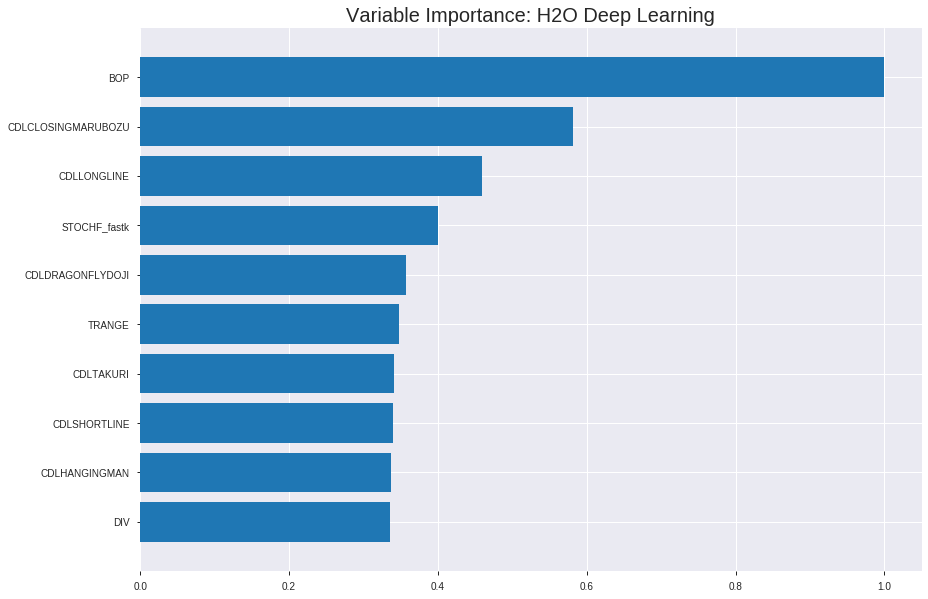

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20191208_064724_model_8


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.1997636181934466
RMSE: 0.4469492344701427
LogLoss: 0.581697185573366
Mean Per-Class Error: 0.29702140028999047
AUC: 0.7738923545588401
pr_auc: 0.7265371001137885
Gini: 0.5477847091176802
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.48761661306047144: 


,0,1,Error,Rate
0,1313.0,1028.0,0.4391,(1028.0/2341.0)
1,340.0,1638.0,0.1719,(340.0/1978.0)
Total,1653.0,2666.0,0.3167,(1368.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4876166,0.7054264,210.0
max f2,0.2884365,0.8295542,304.0
max f0point5,0.5047920,0.6839779,195.0
max accuracy,0.5047920,0.7059505,195.0
max precision,0.9814359,1.0,0.0
max recall,0.0893069,1.0,373.0
max specificity,0.9814359,1.0,0.0
max absolute_mcc,0.4940527,0.4065313,204.0
max min_per_class_accuracy,0.4940527,0.6703741,204.0
max mean_per_class_accuracy,0.4940527,0.7029786,204.0


Gains/Lift Table: Avg response rate: 45.80 %, avg score: 49.46 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.9223182,1.8857662,1.8857662,0.8636364,0.9459859,0.8636364,0.9459859,0.0192113,0.0192113,88.5766155,88.5766155
,2,0.0201436,0.8916368,1.9804007,1.9325395,0.9069767,0.9035903,0.8850575,0.9250317,0.0197169,0.0389282,98.0400687,93.2539544
,3,0.0300996,0.8660371,1.9804007,1.9483705,0.9069767,0.8782458,0.8923077,0.9095564,0.0197169,0.0586451,98.0400687,94.8370537
,4,0.0400556,0.8445373,1.9296212,1.9437103,0.8837209,0.8551126,0.8901734,0.8960241,0.0192113,0.0778564,92.9621182,94.3710293
,5,0.0500116,0.8237863,2.0311802,1.9611233,0.9302326,0.8337969,0.8981481,0.8836363,0.0202224,0.0980789,103.1180191,96.1123282
,6,0.1000232,0.7356370,1.7084012,1.8347622,0.7824074,0.7784399,0.8402778,0.8310381,0.0854398,0.1835187,70.8401210,83.4762246
,7,0.1500347,0.6784685,1.6780746,1.7825330,0.7685185,0.7055235,0.8163580,0.7891999,0.0839232,0.2674419,67.8074561,78.2533018
,8,0.2000463,0.6305775,1.4253525,1.6932379,0.6527778,0.6539862,0.7754630,0.7553965,0.0712841,0.3387260,42.5352488,69.3237885
,9,0.3000695,0.5510318,1.4506247,1.6123668,0.6643519,0.5881558,0.7384259,0.6996496,0.1450961,0.4838220,45.0624696,61.2366822
,10,0.4000926,0.5070385,1.2888826,1.5314958,0.5902778,0.5266881,0.7013889,0.6564092,0.1289181,0.6127401,28.8882569,53.1495759




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.19979272840824494
RMSE: 0.44698179874380223
LogLoss: 0.5835854692840307
Mean Per-Class Error: 0.2942448870845633
AUC: 0.7717145577951352
pr_auc: 0.7259278265323851
Gini: 0.5434291155902704
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.43016399868322724: 


,0,1,Error,Rate
0,318.0,339.0,0.516,(339.0/657.0)
1,60.0,517.0,0.104,(60.0/577.0)
Total,378.0,856.0,0.3233,(399.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4301640,0.7215632,240.0
max f2,0.2695684,0.8306141,317.0
max f0point5,0.5004105,0.6894460,191.0
max accuracy,0.4938809,0.7025932,196.0
max precision,0.9630979,1.0,0.0
max recall,0.1298648,1.0,373.0
max specificity,0.9630979,1.0,0.0
max absolute_mcc,0.4909882,0.4150842,200.0
max min_per_class_accuracy,0.4931148,0.6347032,197.0
max mean_per_class_accuracy,0.4909882,0.7057551,200.0


Gains/Lift Table: Avg response rate: 46.76 %, avg score: 48.93 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.9298667,2.1386482,2.1386482,1.0,0.9436370,1.0,0.9436370,0.0225303,0.0225303,113.8648180,113.8648180
,2,0.0202593,0.8966585,1.9604275,2.0531023,0.9166667,0.9119217,0.96,0.9284136,0.0190641,0.0415945,96.0427499,105.3102253
,3,0.0299838,0.8714138,1.9604275,2.0230456,0.9166667,0.8851795,0.9459459,0.9143917,0.0190641,0.0606586,96.0427499,102.3045576
,4,0.0405186,0.8500199,1.3160912,1.8392374,0.6153846,0.8621791,0.86,0.9008164,0.0138648,0.0745234,31.6091188,83.9237435
,5,0.0502431,0.8217774,1.2475448,1.7247163,0.5833333,0.8327864,0.8064516,0.8876493,0.0121317,0.0866551,24.7544772,72.4716274
,6,0.1004862,0.7389592,1.7247163,1.7247163,0.8064516,0.7799079,0.8064516,0.8337786,0.0866551,0.1733102,72.4716274,72.4716274
,7,0.1499190,0.6886148,1.7529903,1.7340391,0.8196721,0.7146030,0.8108108,0.7944829,0.0866551,0.2599653,75.2990312,73.4039065
,8,0.2001621,0.6403694,1.3797730,1.6451140,0.6451613,0.6643256,0.7692308,0.7618118,0.0693241,0.3292894,37.9773020,64.5113985
,9,0.2998379,0.5490408,1.4779276,1.5895358,0.6910569,0.5958724,0.7432432,0.7066482,0.1473137,0.4766031,47.7927604,58.9535810
,10,0.4003241,0.4941949,1.3280315,1.5238951,0.6209677,0.5158220,0.7125506,0.6587485,0.1334489,0.6100520,32.8031531,52.3895060



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 07:08:49,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-12-08 07:08:52,2 min 47.857 sec,660 obs/sec,0.4834452,1,2088.0,0.5014017,0.6959784,-0.0127688,0.5209000,0.4728588,0.9428831,0.5346145,0.5086044,0.7107036,-0.0390811,0.5606639,0.5306340,1.8096254,0.5267423
,2019-12-08 07:09:23,3 min 19.308 sec,1108 obs/sec,8.1310489,17,35118.0,0.4911868,0.6742888,0.0280765,0.5960688,0.4626078,1.1268307,0.4512619,0.4913821,0.6757756,0.0300982,0.6372514,0.0916422,1.1873099,0.3978930
,2019-12-08 07:09:53,3 min 49.122 sec,1098 obs/sec,14.8874740,31,64299.0,0.4740594,0.6379806,0.0946757,0.6880555,0.6219093,1.7368899,0.4112063,0.5163606,0.7382058,-0.0710144,0.7221879,0.6671360,1.8096254,0.3670989
,2019-12-08 07:10:24,4 min 19.613 sec,1060 obs/sec,21.1416995,44,91311.0,0.4631335,0.6174714,0.1359256,0.7426538,0.6824781,1.8857662,0.3329474,0.4706581,0.6334672,0.1101838,0.7407337,0.7079313,1.6451140,0.3476499
,2019-12-08 07:10:53,4 min 48.783 sec,1035 obs/sec,26.9205835,56,116270.0,0.4600774,0.6083643,0.1472918,0.7559907,0.7005997,1.9353916,0.3283167,0.4631534,0.6154997,0.1383342,0.7535196,0.7046938,1.9741368,0.3144246
,2019-12-08 07:11:25,5 min 20.527 sec,1014 obs/sec,33.1544339,69,143194.0,0.4496786,0.5878109,0.1854025,0.7645177,0.7142204,1.8857662,0.3209076,0.4574349,0.6034306,0.1594807,0.7666841,0.7242875,2.1386482,0.3071313
,2019-12-08 07:11:55,5 min 51.117 sec,996 obs/sec,38.9154897,81,168076.0,0.4481069,0.5842468,0.1910869,0.7679936,0.7159651,1.8361407,0.3308636,0.4657825,0.6215355,0.1285237,0.7598414,0.7179922,1.9741368,0.3282010
,2019-12-08 07:12:27,6 min 22.602 sec,989 obs/sec,45.1558231,94,195028.0,0.4513874,0.5890645,0.1791995,0.7731093,0.7246107,1.8857662,0.3320213,0.4609404,0.6092804,0.1465487,0.7692956,0.7257811,2.1386482,0.3038898
,2019-12-08 07:12:58,6 min 54.394 sec,981 obs/sec,51.3611947,107,221829.0,0.4437876,0.5745987,0.2066059,0.7711817,0.7248445,1.9353916,0.3357259,0.4520335,0.5924658,0.1792133,0.7684515,0.7229481,1.9741368,0.3119935


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0149292
CDLCLOSINGMARUBOZU,0.5817792,0.5817792,0.0086855
CDLLONGLINE,0.4596943,0.4596943,0.0068629
STOCHF_fastk,0.4004202,0.4004202,0.0059780
CDLDRAGONFLYDOJI,0.3572746,0.3572746,0.0053338
---,---,---,---
CDLMORNINGDOJISTAR,0.0390139,0.0390139,0.0005824
CDLHOMINGPIGEON,0.0383288,0.0383288,0.0005722
CDLPIERCING,0.0372712,0.0372712,0.0005564
CDLRISEFALL3METHODS,0.0365373,0.0365373,0.0005455



See the whole table with table.as_data_frame()


('accuracy', 0.7228525121555915)

('F1', 0.759493670886076)

('auc', 0.7759039565848426)

('logloss', 0.5919305969039339)

('mean_per_class_error', 0.28095748932500364)

('rmse', 0.451272384234383)

('mse', 0.2036467647725846)

deeplearning prediction progress: |███████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
6165        1
6166        1
6167        1
6168        1
6169        1

[6170 rows x 1 columns]


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


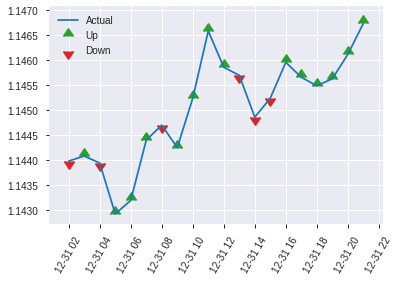


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.2036467647725846
RMSE: 0.451272384234383
LogLoss: 0.5919305969039339
Mean Per-Class Error: 0.28095748932500364
AUC: 0.7759039565848426
pr_auc: 0.7647919597890461
Gini: 0.5518079131696851
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4788503526655693: 


,0,1,Error,Rate
0,176.0,123.0,0.4114,(123.0/299.0)
1,48.0,270.0,0.1509,(48.0/318.0)
Total,224.0,393.0,0.2771,(171.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4788504,0.7594937,211.0
max f2,0.2656650,0.8580858,334.0
max f0point5,0.4966363,0.7264297,192.0
max accuracy,0.4826008,0.7228525,209.0
max precision,0.9570047,1.0,0.0
max recall,0.1731460,1.0,373.0
max specificity,0.9570047,1.0,0.0
max absolute_mcc,0.4788504,0.4548738,211.0
max min_per_class_accuracy,0.4931137,0.6254181,195.0
max mean_per_class_accuracy,0.4826008,0.7190425,209.0


Gains/Lift Table: Avg response rate: 51.54 %, avg score: 49.18 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.9038113,1.9402516,1.9402516,1.0,0.9250586,1.0,0.9250586,0.0220126,0.0220126,94.0251572,94.0251572
,2,0.0210697,0.8824210,1.2935010,1.6417513,0.6666667,0.8943652,0.8461538,0.9108924,0.0125786,0.0345912,29.3501048,64.1751330
,3,0.0307942,0.8573469,1.9402516,1.7360146,1.0,0.8692415,0.8947368,0.8977395,0.0188679,0.0534591,94.0251572,73.6014565
,4,0.0405186,0.8308489,1.6168763,1.7074214,0.8333333,0.8437455,0.88,0.8847809,0.0157233,0.0691824,61.6876310,70.7421384
,5,0.0502431,0.8170568,1.6168763,1.6898965,0.8333333,0.8236498,0.8709677,0.8729491,0.0157233,0.0849057,61.6876310,68.9896531
,6,0.1004862,0.7346773,1.5647190,1.6273078,0.8064516,0.7765132,0.8387097,0.8247311,0.0786164,0.1635220,56.4719010,62.7307770
,7,0.1507293,0.6696328,1.6273078,1.6273078,0.8387097,0.6951665,0.8387097,0.7815429,0.0817610,0.2452830,62.7307770,62.7307770
,8,0.2009724,0.6283583,1.5021302,1.5960134,0.7741935,0.6502258,0.8225806,0.7487136,0.0754717,0.3207547,50.2130250,59.6013390
,9,0.2998379,0.5207455,1.3995257,1.5312256,0.7213115,0.5629661,0.7891892,0.6874672,0.1383648,0.4591195,39.9525724,53.1225565
,10,0.4003241,0.4952210,1.3143640,1.4767907,0.6774194,0.5072455,0.7611336,0.6422293,0.1320755,0.5911950,31.4363968,47.6790670


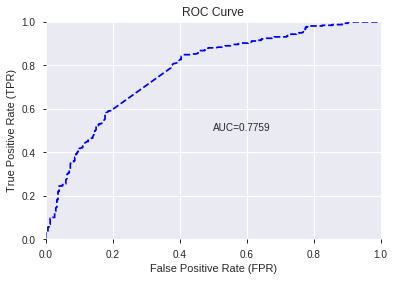

This function is available for GLM models only


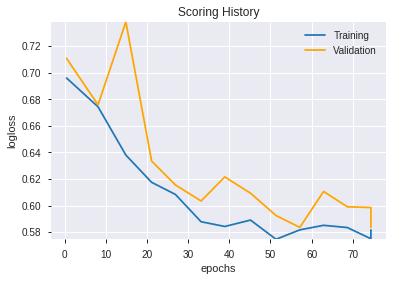

--2019-12-08 07:19:58--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.81.24
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.81.24|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 368257676 (351M) [application/zip]
Saving to: ‘h2o-3.24.0.5.zip’

h2o-3.24.0.5.zip    100%[===================>] 351.20M  58.0MB/s    in 5.8s    

2019-12-08 07:20:04 (60.5 MB/s) - ‘h2o-3.24.0.5.zip’ saved [368257676/368257676]

Archive:  h2o-3.24.0.5.zip
   creating: h2o-3.24.0.5/
   creating: h2o-3.24.0.5/bindings/
   creating: h2o-3.24.0.5/bindings/java/
 extracting: h2o-3.24.0.5/bindings/java/h2o-bindings-3.24.0.zip  
  inflating: h2o-3.24.0.5/h2o.jar    
   creating: h2o-3.24.0.5/python/
  inflating: h2o-3.24.0.5/python/h2o-3.24.0.5-py2.py3-none-any.whl  
   creating: h2o-3.24.0.5/R/
  inflating: h2o-3.24.0.5/R/h2o_3.24.0.5.tar.gz  
ERROR: Unkno

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20191208_064724_model_8',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20191208_064724_model_8',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_2_sid_afcd',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl

952

['BOP',
 'CDLCLOSINGMARUBOZU',
 'CDLLONGLINE',
 'STOCHF_fastk',
 'CDLDRAGONFLYDOJI',
 'TRANGE',
 'CDLTAKURI',
 'CDLSHORTLINE',
 'CDLHANGINGMAN',
 'DIV',
 'SUB',
 'CDLENGULFING',
 'WILLR_8',
 'ULTOSC',
 'CDLHARAMI',
 'STOCHRSI_fastk',
 'STOCH_slowd',
 'CDLGRAVESTONEDOJI',
 'CDLMARUBOZU',
 'CCI_8',
 'STOCHRSI_fastd',
 'CORREL_30',
 'CDLHAMMER',
 'aroonup_8',
 'WILLR_12',
 'CORREL_20',
 'BETA_8',
 'PLUS_DM_8',
 'PLUS_DI_8',
 'weekday_name',
 'HT_TRENDMODE',
 'WILLR_14',
 'dayofweek',
 'WILLR_20',
 'MINUS_DI_8',
 'MFI_20',
 'ADOSC',
 'CCI_12',
 'weekday',
 'AROONOSC_8',
 'CDL3INSIDE',
 'aroondown_8',
 'CCI_14',
 'HT_PHASOR_quadrature',
 'MINUS_DI_12',
 'CDLHIKKAKE',
 'aroonup_24',
 'CDL3LINESTRIKE',
 'is_month_end',
 'Volume']

In [11]:
# DeepLearning
features_list = model_train(feature_name='All',model_algo="DeepLearning")
display(len(features_list),features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20191208_072058_model_8,0.770635,0.581785,0.279159,0.444487,0.197569
1,DeepLearning_grid_1_AutoML_20191208_072058_model_5,0.766012,0.615884,0.312157,0.457975,0.209741
2,DeepLearning_grid_1_AutoML_20191208_072058_model_9,0.764934,0.587439,0.291564,0.447623,0.200366
3,DeepLearning_grid_1_AutoML_20191208_072058_model_6,0.764098,0.584848,0.291864,0.445950,0.198872
4,DeepLearning_1_AutoML_20191208_072058,0.758424,0.595670,0.296881,0.451303,0.203674
5,DeepLearning_grid_1_AutoML_20191208_072058_model_3,0.734803,0.691287,0.319019,0.469527,0.220455
6,DeepLearning_grid_1_AutoML_20191208_072058_model_2,0.730669,0.757672,0.342357,0.491347,0.241422
7,DeepLearning_grid_1_AutoML_20191208_072058_model_7,0.722503,0.740136,0.388607,0.483856,0.234116
8,DeepLearning_grid_1_AutoML_20191208_072058_model_1,0.716760,0.862143,0.325808,0.502388,0.252394
9,DeepLearning_grid_1_AutoML_20191208_072058_model_4,0.714836,0.673066,0.412044,0.477757,0.228252


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.041989
1,CDLCLOSINGMARUBOZU,0.751378,0.751378,0.031550
2,CORREL_30,0.683229,0.683229,0.028688
3,CORREL_20,0.652583,0.652583,0.027401
4,CDLLONGLINE,0.592969,0.592969,0.024898
5,CDLHANGINGMAN,0.581348,0.581348,0.024410
6,HT_TRENDMODE,0.571487,0.571487,0.023996
7,STOCH_slowd,0.532727,0.532727,0.022369
8,STOCHRSI_fastd,0.517511,0.517511,0.021730
9,DIV,0.517332,0.517332,0.021722


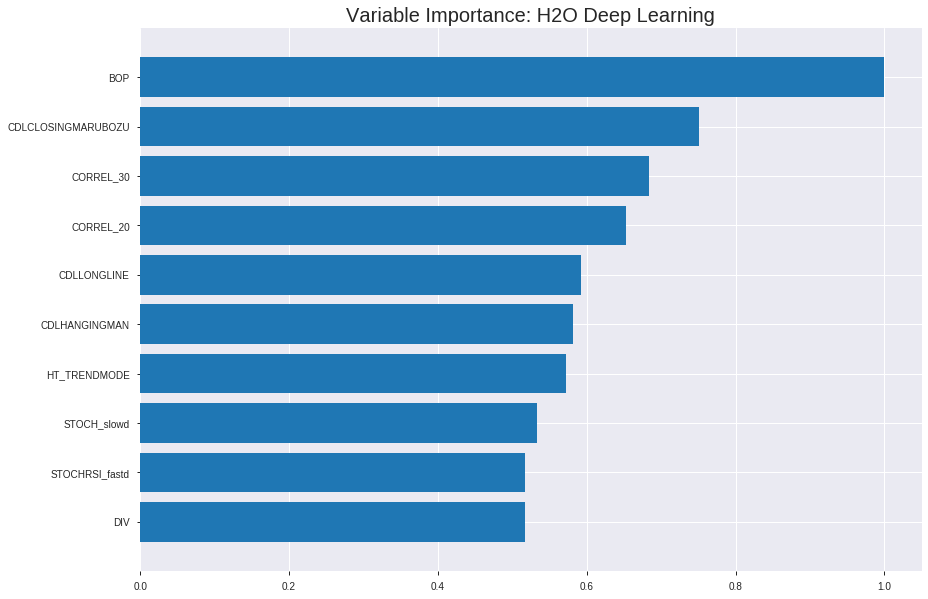

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20191208_072058_model_8


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.19208494863639022
RMSE: 0.43827496921041503
LogLoss: 0.5674886975346718
Mean Per-Class Error: 0.2882052859109323
AUC: 0.7786528576407981
pr_auc: 0.7278612985211724
Gini: 0.5573057152815961
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.385218961781118: 


,0,1,Error,Rate
0,1243.0,1098.0,0.469,(1098.0/2341.0)
1,275.0,1703.0,0.139,(275.0/1978.0)
Total,1518.0,2801.0,0.3179,(1373.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3852190,0.7127014,247.0
max f2,0.1764107,0.8244999,339.0
max f0point5,0.5559936,0.6880734,163.0
max accuracy,0.5136494,0.7128965,187.0
max precision,0.9829683,1.0,0.0
max recall,0.0339311,1.0,395.0
max specificity,0.9829683,1.0,0.0
max absolute_mcc,0.5136494,0.4228995,187.0
max min_per_class_accuracy,0.5065379,0.7082912,190.0
max mean_per_class_accuracy,0.5136494,0.7117947,187.0


Gains/Lift Table: Avg response rate: 45.80 %, avg score: 48.07 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.9596518,1.9850170,1.9850170,0.9090909,0.9685239,0.9090909,0.9685239,0.0202224,0.0202224,98.5017005,98.5017005
,2,0.0201436,0.9438113,1.7772827,1.8823437,0.8139535,0.9515774,0.8620690,0.9601480,0.0176946,0.0379171,77.7282667,88.2343712
,3,0.0300996,0.9318595,1.9296212,1.8979816,0.8837209,0.9381819,0.8692308,0.9528823,0.0192113,0.0571284,92.9621182,89.7981644
,4,0.0400556,0.9155027,1.8788417,1.8932243,0.8604651,0.9234916,0.8670520,0.9455771,0.0187058,0.0758342,87.8841677,89.3224311
,5,0.0500116,0.9044434,1.8280622,1.8802522,0.8372093,0.9095532,0.8611111,0.9384057,0.0182002,0.0940344,82.8062172,88.0252219
,6,0.1000232,0.8113168,1.7791634,1.8297078,0.8148148,0.8581409,0.8379630,0.8982733,0.0889788,0.1830131,77.9163390,82.9707804
,7,0.1500347,0.7364426,1.6073124,1.7555760,0.7361111,0.7719834,0.8040123,0.8561767,0.0803842,0.2633974,60.7312381,75.5575996
,8,0.2000463,0.6857141,1.6679657,1.7336734,0.7638889,0.7126405,0.7939815,0.8202926,0.0834176,0.3468150,66.7965678,73.3673417
,9,0.3000695,0.5967869,1.4354614,1.6342694,0.6574074,0.6390377,0.7484568,0.7598743,0.1435794,0.4903943,43.5461371,63.4269402
,10,0.4000926,0.5455451,1.2231748,1.5314958,0.5601852,0.5691639,0.7013889,0.7121967,0.1223458,0.6127401,22.3174831,53.1495759




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.19621703831565468
RMSE: 0.4429639243952657
LogLoss: 0.5754509201005975
Mean Per-Class Error: 0.29569969057398127
AUC: 0.7674266465130879
pr_auc: 0.7308261897953535
Gini: 0.5348532930261758
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.39525941820018795: 


,0,1,Error,Rate
0,346.0,311.0,0.4734,(311.0/657.0)
1,79.0,498.0,0.1369,(79.0/577.0)
Total,425.0,809.0,0.316,(390.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3952594,0.7186147,247.0
max f2,0.2105891,0.8298632,330.0
max f0point5,0.5451652,0.6819048,168.0
max accuracy,0.4716637,0.7009724,209.0
max precision,0.9744223,1.0,0.0
max recall,0.0650759,1.0,388.0
max specificity,0.9744223,1.0,0.0
max absolute_mcc,0.4394940,0.4133312,225.0
max min_per_class_accuracy,0.5047462,0.6940639,192.0
max mean_per_class_accuracy,0.4716637,0.7043003,209.0


Gains/Lift Table: Avg response rate: 46.76 %, avg score: 48.60 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.9558583,2.1386482,2.1386482,1.0,0.9660745,1.0,0.9660745,0.0225303,0.0225303,113.8648180,113.8648180
,2,0.0202593,0.9377479,2.1386482,2.1386482,1.0,0.9457175,1.0,0.9563031,0.0207972,0.0433276,113.8648180,113.8648180
,3,0.0299838,0.9186995,1.7822068,2.0230456,0.8333333,0.9298595,0.9459459,0.9477268,0.0173310,0.0606586,78.2206817,102.3045576
,4,0.0405186,0.9028705,1.8096254,1.9675563,0.8461538,0.9105441,0.92,0.9380593,0.0190641,0.0797227,80.9625383,96.7556326
,5,0.0502431,0.8929883,1.9604275,1.9661766,0.9166667,0.8977738,0.9193548,0.9302621,0.0190641,0.0987868,96.0427499,96.6176553
,6,0.1004862,0.7990261,1.5867390,1.7764578,0.7419355,0.8522105,0.8306452,0.8912363,0.0797227,0.1785095,58.6738972,77.6457763
,7,0.1499190,0.7318176,1.5426315,1.6993583,0.7213115,0.7621195,0.7945946,0.8486627,0.0762565,0.2547660,54.2631474,69.9358284
,8,0.2001621,0.6823358,1.5867390,1.6710895,0.7419355,0.7101099,0.7813765,0.8138842,0.0797227,0.3344887,58.6738972,67.1089469
,9,0.2998379,0.6030284,1.3562159,1.5664153,0.6341463,0.6412293,0.7324324,0.7564881,0.1351820,0.4696707,35.6215919,56.6415289
,10,0.4003241,0.5518106,1.2935372,1.4979196,0.6048387,0.5749263,0.7004049,0.7109139,0.1299827,0.5996534,29.3537206,49.7919576



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 07:27:06,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-12-08 07:27:09,1 min 43.066 sec,1778 obs/sec,1.2308405,1,5316.0,0.4675868,0.6247885,0.1192286,0.7546385,0.7065529,1.8857662,0.3609632,0.4674537,0.6253452,0.1222590,0.7532756,0.7190737,2.1386482,0.3136143
,2019-12-08 07:27:22,1 min 55.849 sec,2539 obs/sec,8.5964344,7,37128.0,0.4382750,0.5674887,0.2261941,0.7786529,0.7278613,1.9850170,0.3178977,0.4429639,0.5754509,0.2118192,0.7674266,0.7308262,2.1386482,0.3160454
,2019-12-08 07:27:35,2 min 8.330 sec,2875 obs/sec,17.2776106,14,74622.0,0.4403428,0.5701720,0.2188749,0.7874435,0.7375882,1.8857662,0.2947442,0.4492698,0.5881705,0.1892189,0.7624133,0.7143647,1.9741368,0.3014587
,2019-12-08 07:27:46,2 min 19.946 sec,3075 obs/sec,25.9266034,21,111977.0,0.4312061,0.5486446,0.2509539,0.7956756,0.7475524,1.9850170,0.3121093,0.4457239,0.5839866,0.2019666,0.7661051,0.7250367,2.1386482,0.3119935
,2019-12-08 07:27:59,2 min 32.564 sec,3228 obs/sec,35.7740218,29,154508.0,0.4292046,0.5415645,0.2578914,0.8024301,0.7514102,1.9353916,0.2908081,0.4542437,0.6050993,0.1711673,0.7455716,0.6953356,2.1386482,0.3354943
,2019-12-08 07:28:11,2 min 45.017 sec,3330 obs/sec,45.6232924,37,197047.0,0.4203795,0.5249181,0.2880954,0.8237829,0.7842080,2.0842679,0.2787682,0.4543995,0.6035638,0.1705985,0.7468273,0.6860574,1.3160912,0.3103728
,2019-12-08 07:28:23,2 min 57.175 sec,3418 obs/sec,55.5380875,45,239869.0,0.4061706,0.4935271,0.3354070,0.8414698,0.8042692,2.1835187,0.2678861,0.4519285,0.5985400,0.1795944,0.7484298,0.6943639,1.6451140,0.3322528
,2019-12-08 07:28:25,2 min 58.378 sec,3416 obs/sec,55.5380875,45,239869.0,0.4382750,0.5674887,0.2261941,0.7786529,0.7278613,1.9850170,0.3178977,0.4429639,0.5754509,0.2118192,0.7674266,0.7308262,2.1386482,0.3160454


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0419893
CDLCLOSINGMARUBOZU,0.7513780,0.7513780,0.0315498
CORREL_30,0.6832290,0.6832290,0.0286883
CORREL_20,0.6525834,0.6525834,0.0274015
CDLLONGLINE,0.5929686,0.5929686,0.0248983
---,---,---,---
CCI_12,0.3728026,0.3728026,0.0156537
is_month_end,0.3629670,0.3629670,0.0152407
WILLR_14,0.3572915,0.3572915,0.0150024
CDL3LINESTRIKE,0.3426589,0.3426589,0.0143880



See the whole table with table.as_data_frame()


('accuracy', 0.7228525121555915)

('F1', 0.745156482861401)

('auc', 0.7706348204707516)

('logloss', 0.5817854680780846)

('mean_per_class_error', 0.27915904166929595)

('rmse', 0.44448748590476866)

('mse', 0.19756912512594194)

deeplearning prediction progress: |███████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           0
4           1
...       ...
6165        0
6166        0
6167        1
6168        1
6169        1

[6170 rows x 1 columns]


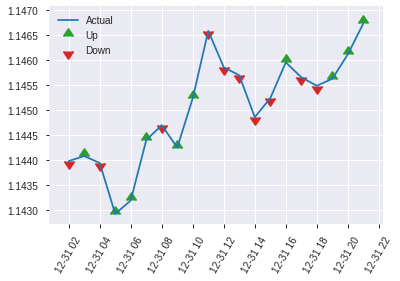


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.19756912512594194
RMSE: 0.44448748590476866
LogLoss: 0.5817854680780846
Mean Per-Class Error: 0.27915904166929595
AUC: 0.7706348204707516
pr_auc: 0.7613697647898974
Gini: 0.5412696409415032
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4554099976493396: 


,0,1,Error,Rate
0,196.0,103.0,0.3445,(103.0/299.0)
1,68.0,250.0,0.2138,(68.0/318.0)
Total,264.0,353.0,0.2771,(171.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4554100,0.7451565,220.0
max f2,0.1012844,0.8526089,376.0
max f0point5,0.5058748,0.7249675,194.0
max accuracy,0.4554100,0.7228525,220.0
max precision,0.9904656,1.0,0.0
max recall,0.0873321,1.0,380.0
max specificity,0.9904656,1.0,0.0
max absolute_mcc,0.4554100,0.4461382,220.0
max min_per_class_accuracy,0.5023249,0.7090301,198.0
max mean_per_class_accuracy,0.4554100,0.7208410,220.0


Gains/Lift Table: Avg response rate: 51.54 %, avg score: 48.66 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.9654513,1.6630728,1.6630728,0.8571429,0.9742514,0.8571429,0.9742514,0.0188679,0.0188679,66.3072776,66.3072776
,2,0.0210697,0.9414589,1.9402516,1.7910015,1.0,0.9511331,0.9230769,0.9635814,0.0188679,0.0377358,94.0251572,79.1001451
,3,0.0307942,0.9299686,1.9402516,1.8381331,1.0,0.9367031,0.9473684,0.9550935,0.0188679,0.0566038,94.0251572,83.8133069
,4,0.0405186,0.9168776,0.9701258,1.6298113,0.5,0.9239592,0.84,0.9476213,0.0094340,0.0660377,-2.9874214,62.9811321
,5,0.0502431,0.8950808,1.2935010,1.5647190,0.6666667,0.9074691,0.8064516,0.9398499,0.0125786,0.0786164,29.3501048,56.4719010
,6,0.1004862,0.8049869,1.7524853,1.6586022,0.9032258,0.8565573,0.8548387,0.8982036,0.0880503,0.1666667,75.2485291,65.8602151
,7,0.1507293,0.7500458,1.5647190,1.6273078,0.8064516,0.7736840,0.8387097,0.8566971,0.0786164,0.2452830,56.4719010,62.7307770
,8,0.2009724,0.6743976,1.6273078,1.6273078,0.8387097,0.7052564,0.8387097,0.8188369,0.0817610,0.3270440,62.7307770,62.7307770
,9,0.2998379,0.6022182,1.3677183,1.5417134,0.7049180,0.6344142,0.7945946,0.7580273,0.1352201,0.4622642,36.7718321,54.1713412
,10,0.4003241,0.5549083,1.1265977,1.4375143,0.5806452,0.5788743,0.7408907,0.7130577,0.1132075,0.5754717,12.6597687,43.7514323


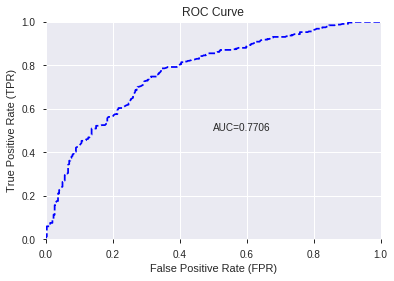

This function is available for GLM models only


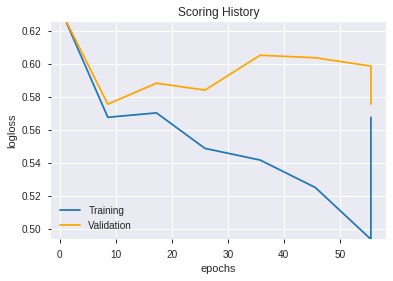

--2019-12-08 07:29:55--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.104.35
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.104.35|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20191208_072058_model_8',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20191208_072058_model_8',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_7_sid_afcd',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl

['BOP',
 'CDLCLOSINGMARUBOZU',
 'CORREL_30',
 'CORREL_20',
 'CDLLONGLINE',
 'CDLHANGINGMAN',
 'HT_TRENDMODE',
 'STOCH_slowd',
 'STOCHRSI_fastd',
 'DIV',
 'CCI_8',
 'TRANGE',
 'CDLENGULFING',
 'STOCHF_fastk',
 'weekday',
 'weekday_name',
 'WILLR_8',
 'ULTOSC',
 'CDLDRAGONFLYDOJI',
 'STOCHRSI_fastk',
 'dayofweek',
 'SUB',
 'BETA_8',
 'MFI_20',
 'aroonup_24',
 'CDLSHORTLINE',
 'Volume',
 'WILLR_20',
 'aroonup_8',
 'WILLR_12',
 'CDLTAKURI',
 'aroondown_8',
 'MINUS_DI_8',
 'AROONOSC_8',
 'ADOSC',
 'CCI_14',
 'PLUS_DI_8',
 'CDLMARUBOZU',
 'PLUS_DM_8',
 'CDLHARAMI',
 'CDLHAMMER',
 'MINUS_DI_12',
 'CDLGRAVESTONEDOJI',
 'HT_PHASOR_quadrature',
 'CDLHIKKAKE',
 'CCI_12',
 'is_month_end',
 'WILLR_14',
 'CDL3LINESTRIKE',
 'CDL3INSIDE']

In [12]:
# DeepLearning with top DeepLearning features
model_train(feature_name='DLF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191208_073052_model_1,0.774705,0.574672,0.317473,0.441975,0.195342


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.636344,1.000000,0.138037
1,CCI_8,0.354457,0.557021,0.076889
2,STOCHF_fastk,0.307373,0.483030,0.066676
3,WILLR_8,0.301872,0.474384,0.065482
4,STOCH_slowd,0.261754,0.411341,0.056780
5,CDLCLOSINGMARUBOZU,0.177606,0.279104,0.038527
6,ULTOSC,0.175647,0.276025,0.038102
7,CDL3LINESTRIKE,0.151054,0.237378,0.032767
8,CORREL_30,0.133383,0.209608,0.028934
9,WILLR_20,0.126366,0.198581,0.027411


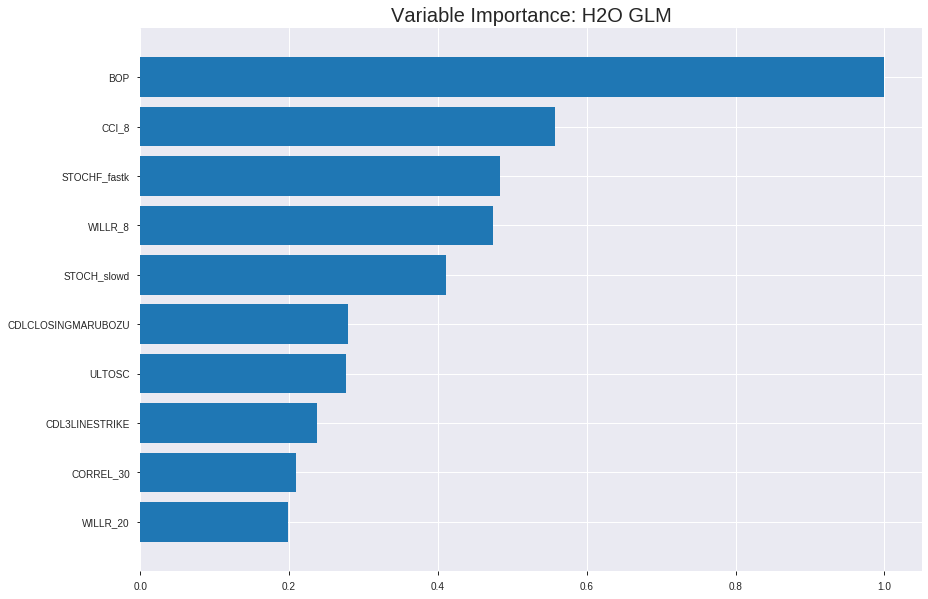

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191208_073052_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.19330506346041615
RMSE: 0.4396647170974903
LogLoss: 0.5688852156605124
Null degrees of freedom: 4318
Residual degrees of freedom: 4268
Null deviance: 5956.860179047515
Residual deviance: 4914.030492875508
AIC: 5016.030492875508
AUC: 0.7729399731951078
pr_auc: 0.72549088751146
Gini: 0.5458799463902155
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.36712321110257706: 


,0,1,Error,Rate
0,1339.0,1002.0,0.428,(1002.0/2341.0)
1,334.0,1644.0,0.1689,(334.0/1978.0)
Total,1673.0,2646.0,0.3093,(1336.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3671232,0.7110727,249.0
max f2,0.1865680,0.8218356,335.0
max f0point5,0.5026775,0.6828148,184.0
max accuracy,0.4976546,0.7082658,187.0
max precision,0.9868642,1.0,0.0
max recall,0.0392389,1.0,393.0
max specificity,0.9868642,1.0,0.0
max absolute_mcc,0.4028208,0.4176218,233.0
max min_per_class_accuracy,0.4705776,0.7022245,200.0
max mean_per_class_accuracy,0.4028208,0.7076869,233.0


Gains/Lift Table: Avg response rate: 45.80 %, avg score: 45.80 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.8852846,2.0346424,2.0346424,0.9318182,0.9172424,0.9318182,0.9172424,0.0207280,0.0207280,103.4642430,103.4642430
,2,0.0201436,0.8635699,1.7772827,1.9074416,0.8139535,0.8736742,0.8735632,0.8957086,0.0176946,0.0384226,77.7282667,90.7441628
,3,0.0300996,0.8487828,1.9804007,1.9315742,0.9069767,0.8549201,0.8846154,0.8822171,0.0197169,0.0581395,98.0400687,93.1574240
,4,0.0400556,0.8366373,1.9296212,1.9310888,0.8837209,0.8426150,0.8843931,0.8723738,0.0192113,0.0773509,92.9621182,93.1088798
,5,0.0500116,0.8193222,1.7772827,1.9004700,0.8139535,0.8292382,0.8703704,0.8637866,0.0176946,0.0950455,77.7282667,90.0469985
,6,0.1000232,0.7671680,1.7084012,1.8044356,0.7824074,0.7925679,0.8263889,0.8281772,0.0854398,0.1804853,70.8401210,80.4435597
,7,0.1500347,0.7204815,1.6780746,1.7623153,0.7685185,0.7434853,0.8070988,0.7999466,0.0839232,0.2644085,67.8074561,76.2315252
,8,0.2000463,0.6776457,1.5163324,1.7008195,0.6944444,0.6997512,0.7789352,0.7748977,0.0758342,0.3402427,51.6332435,70.0819547
,9,0.3000695,0.6055782,1.4708425,1.6241605,0.6736111,0.6399463,0.7438272,0.7299139,0.1471183,0.4873610,47.0842462,62.4160519
,10,0.4000926,0.5286600,1.2383382,1.5277049,0.5671296,0.5673248,0.6996528,0.6892667,0.1238625,0.6112235,23.8338155,52.7704928




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.1934777894062072
RMSE: 0.4398611024018914
LogLoss: 0.5702479713086196
Null degrees of freedom: 1233
Residual degrees of freedom: 1183
Null deviance: 1705.9557175251716
Residual deviance: 1407.371993189673
AIC: 1509.371993189673
AUC: 0.7739739216912124
pr_auc: 0.7321222866859003
Gini: 0.5479478433824247
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3198403565062889: 


,0,1,Error,Rate
0,328.0,329.0,0.5008,(329.0/657.0)
1,68.0,509.0,0.1179,(68.0/577.0)
Total,396.0,838.0,0.3217,(397.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3198404,0.7194346,265.0
max f2,0.2353224,0.8295351,308.0
max f0point5,0.5437632,0.6902023,158.0
max accuracy,0.4379850,0.7082658,204.0
max precision,0.9267511,1.0,0.0
max recall,0.0151294,1.0,398.0
max specificity,0.9267511,1.0,0.0
max absolute_mcc,0.4205410,0.4219604,214.0
max min_per_class_accuracy,0.4622062,0.7062405,194.0
max mean_per_class_accuracy,0.4205410,0.7108107,214.0


Gains/Lift Table: Avg response rate: 46.76 %, avg score: 45.94 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.8806255,1.9741368,1.9741368,0.9230769,0.9023134,0.9230769,0.9023134,0.0207972,0.0207972,97.4136782,97.4136782
,2,0.0202593,0.8542257,1.9604275,1.9675563,0.9166667,0.8676399,0.92,0.8856701,0.0190641,0.0398614,96.0427499,96.7556326
,3,0.0299838,0.8411874,1.7822068,1.9074430,0.8333333,0.8499184,0.8918919,0.8740750,0.0173310,0.0571924,78.2206817,90.7442972
,4,0.0405186,0.8249668,1.8096254,1.8820104,0.8461538,0.8327980,0.88,0.8633430,0.0190641,0.0762565,80.9625383,88.2010399
,5,0.0502431,0.8069679,1.7822068,1.8626936,0.8333333,0.8149422,0.8709677,0.8539751,0.0173310,0.0935875,78.2206817,86.2693576
,6,0.1004862,0.7635874,1.7592106,1.8109521,0.8225806,0.7850829,0.8467742,0.8195290,0.0883882,0.1819757,75.9210600,81.0952088
,7,0.1499190,0.7249008,1.6127511,1.7455993,0.7540984,0.7436062,0.8162162,0.7944950,0.0797227,0.2616984,61.2751087,74.5599325
,8,0.2001621,0.6809702,1.5177503,1.6884065,0.7096774,0.7035491,0.7894737,0.7716665,0.0762565,0.3379549,51.7750321,68.8406458
,9,0.2998379,0.6113556,1.3736033,1.5837557,0.6422764,0.6468187,0.7405405,0.7301630,0.1369151,0.4748700,37.3603303,58.3755679
,10,0.4003241,0.5361931,1.3452787,1.5238951,0.6290323,0.5778429,0.7125506,0.6919288,0.1351820,0.6100520,34.5278694,52.3895060



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-08 07:30:52,0.000 sec,2,.2E2,50,1.3622621,1.3649164
,2019-12-08 07:30:52,0.039 sec,4,.12E2,51,1.3535358,1.3558595
,2019-12-08 07:30:52,0.073 sec,6,.76E1,51,1.3413097,1.3431429
,2019-12-08 07:30:52,0.106 sec,8,.47E1,51,1.3250455,1.3261723
,2019-12-08 07:30:53,0.141 sec,10,.29E1,51,1.3046653,1.3048320
---,---,---,---,---,---,---,---
,2019-12-08 07:30:53,0.478 sec,36,.6E-2,51,1.1359749,1.1406769
,2019-12-08 07:30:53,0.508 sec,38,.37E-2,51,1.1347621,1.1413065
,2019-12-08 07:30:53,0.537 sec,40,.23E-2,51,1.1340327,1.1421839
,2019-12-08 07:30:53,0.547 sec,41,.14E-2,51,1.1336302,1.1430725



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7212317666126418)

('F1', 0.746031746031746)

('auc', 0.7747049914810374)

('logloss', 0.5746717347502457)

('mean_per_class_error', 0.27993205864411763)

('rmse', 0.44197455611467185)

('mse', 0.19534150825276123)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           0
4           1
...       ...
6165        1
6166        0
6167        1
6168        1
6169        1

[6170 rows x 1 columns]


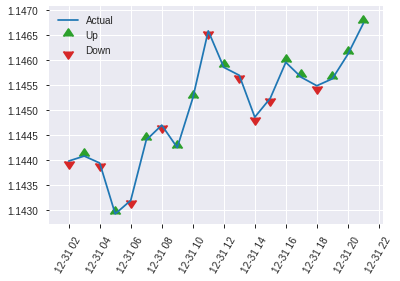


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.19534150825276123
RMSE: 0.44197455611467185
LogLoss: 0.5746717347502457
Null degrees of freedom: 616
Residual degrees of freedom: 566
Null deviance: 862.9188841257723
Residual deviance: 709.1449206818031
AIC: 811.1449206818031
AUC: 0.7747049914810374
pr_auc: 0.7679983893239234
Gini: 0.5494099829620749
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.31740453850739314: 


,0,1,Error,Rate
0,143.0,156.0,0.5217,(156.0/299.0)
1,36.0,282.0,0.1132,(36.0/318.0)
Total,179.0,438.0,0.3112,(192.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3174045,0.7460317,273.0
max f2,0.1715267,0.8525853,346.0
max f0point5,0.4439668,0.7250301,210.0
max accuracy,0.4439668,0.7212318,210.0
max precision,0.9942118,1.0,0.0
max recall,0.0630972,1.0,390.0
max specificity,0.9942118,1.0,0.0
max absolute_mcc,0.4424134,0.4417517,211.0
max min_per_class_accuracy,0.4770640,0.7090301,192.0
max mean_per_class_accuracy,0.4439668,0.7200679,210.0


Gains/Lift Table: Avg response rate: 51.54 %, avg score: 47.31 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.8993142,1.9402516,1.9402516,1.0,0.9500465,1.0,0.9500465,0.0220126,0.0220126,94.0251572,94.0251572
,2,0.0210697,0.8812285,1.6168763,1.7910015,0.8333333,0.8873530,0.9230769,0.9211110,0.0157233,0.0377358,61.6876310,79.1001451
,3,0.0307942,0.8397544,1.6168763,1.7360146,0.8333333,0.8659069,0.8947368,0.9036781,0.0157233,0.0534591,61.6876310,73.6014565
,4,0.0405186,0.8327308,1.6168763,1.7074214,0.8333333,0.8371367,0.88,0.8877082,0.0157233,0.0691824,61.6876310,70.7421384
,5,0.0502431,0.8252142,1.2935010,1.6273078,0.6666667,0.8283165,0.8387097,0.8762130,0.0125786,0.0817610,29.3501048,62.7307770
,6,0.1004862,0.7780038,1.8150741,1.7211909,0.9354839,0.8086026,0.8870968,0.8424078,0.0911950,0.1729560,81.5074052,72.1190911
,7,0.1507293,0.7295623,1.4395415,1.6273078,0.7419355,0.7510175,0.8387097,0.8119444,0.0723270,0.2452830,43.9541489,62.7307770
,8,0.2009724,0.6910582,1.6273078,1.6273078,0.8387097,0.7065330,0.8387097,0.7855915,0.0817610,0.3270440,62.7307770,62.7307770
,9,0.2998379,0.6348645,1.4631405,1.5731770,0.7540984,0.6612733,0.8108108,0.7446001,0.1446541,0.4716981,46.3140530,57.3176951
,10,0.4003241,0.5552278,1.0014202,1.4296591,0.5161290,0.5977902,0.7368421,0.7077491,0.1006289,0.5723270,0.1420166,42.9659053


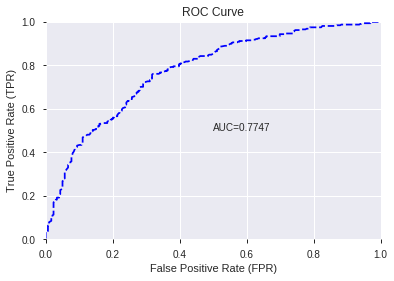

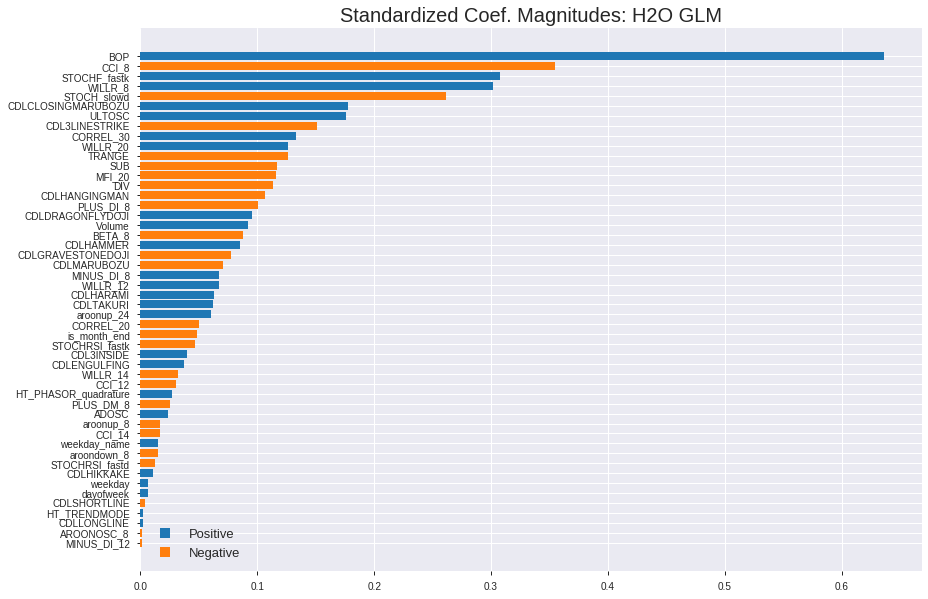

'log_likelihood'
--2019-12-08 07:31:02--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.130.123
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.130.123|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191208_073052_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191208_073052_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_12_sid_afcd',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_12_s

['BOP',
 'CCI_8',
 'STOCHF_fastk',
 'WILLR_8',
 'STOCH_slowd',
 'CDLCLOSINGMARUBOZU',
 'ULTOSC',
 'CDL3LINESTRIKE',
 'CORREL_30',
 'WILLR_20',
 'TRANGE',
 'SUB',
 'MFI_20',
 'DIV',
 'CDLHANGINGMAN',
 'PLUS_DI_8',
 'CDLDRAGONFLYDOJI',
 'Volume',
 'BETA_8',
 'CDLHAMMER',
 'CDLGRAVESTONEDOJI',
 'CDLMARUBOZU',
 'MINUS_DI_8',
 'WILLR_12',
 'CDLHARAMI',
 'CDLTAKURI',
 'aroonup_24',
 'CORREL_20',
 'is_month_end',
 'STOCHRSI_fastk',
 'CDL3INSIDE',
 'CDLENGULFING',
 'WILLR_14',
 'CCI_12',
 'HT_PHASOR_quadrature',
 'PLUS_DM_8',
 'ADOSC',
 'aroonup_8',
 'CCI_14',
 'weekday_name',
 'aroondown_8',
 'STOCHRSI_fastd',
 'CDLHIKKAKE',
 'weekday',
 'dayofweek',
 'CDLSHORTLINE',
 'HT_TRENDMODE',
 'CDLLONGLINE',
 'AROONOSC_8',
 'MINUS_DI_12']

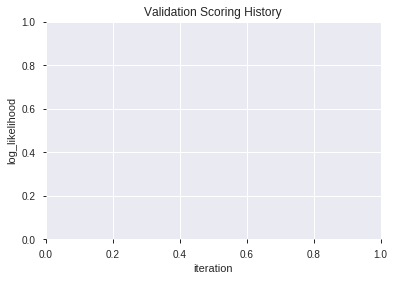

In [13]:
# GLM with top DeepLearning features
model_train(feature_name='DLF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20191208_073159_model_4,0.787788,0.567011,0.338066,0.438014,0.191856
1,XGBoost_3_AutoML_20191208_073159,0.781851,0.571538,0.300151,0.440283,0.193849
2,XGBoost_grid_1_AutoML_20191208_073159_model_3,0.781809,0.571796,0.306740,0.440667,0.194188
3,XGBoost_grid_1_AutoML_20191208_073159_model_6,0.780821,0.571199,0.301324,0.440242,0.193813
4,XGBoost_grid_1_AutoML_20191208_073159_model_1,0.777219,0.576284,0.293263,0.442318,0.195646
5,XGBoost_grid_1_AutoML_20191208_073159_model_2,0.776950,0.576492,0.312257,0.442550,0.195851
6,XGBoost_1_AutoML_20191208_073159,0.775489,0.575988,0.294435,0.442050,0.195408
7,XGBoost_2_AutoML_20191208_073159,0.774894,0.575963,0.312257,0.442386,0.195705
8,XGBoost_grid_1_AutoML_20191208_073159_model_5,0.768626,0.585750,0.300052,0.447311,0.200087
9,XGBoost_grid_1_AutoML_20191208_073159_model_7,0.768594,0.582533,0.313529,0.445329,0.198318


,variable,relative_importance,scaled_importance,percentage
0,BOP,4779.799316,1.000000,0.401548
1,STOCHF_fastk,856.056702,0.179099,0.071917
2,CCI_8,429.010803,0.089755,0.036041
3,TRANGE,416.248505,0.087085,0.034969
4,DIV,364.637756,0.076287,0.030633
5,SUB,334.453796,0.069972,0.028097
6,WILLR_8,333.228424,0.069716,0.027994
7,aroonup_8,307.093231,0.064248,0.025799
8,ADOSC,285.625427,0.059757,0.023995
9,BETA_8,252.166977,0.052757,0.021184


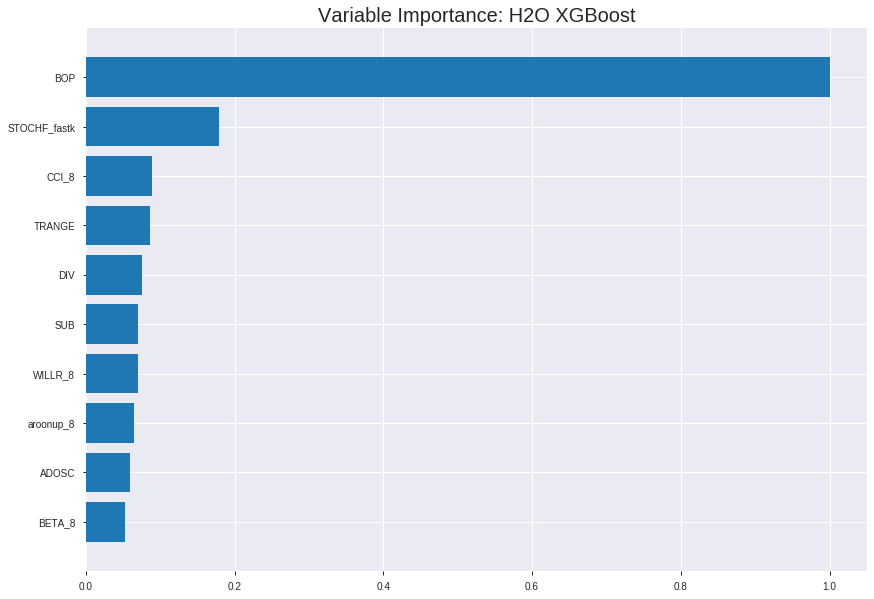

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20191208_073159_model_4


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.17589577256854613
RMSE: 0.4193992996757936
LogLoss: 0.5285355595418831
Mean Per-Class Error: 0.2598530438842648
AUC: 0.8210386874154788
pr_auc: 0.7873390278986192
Gini: 0.6420773748309576
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3772005763920871: 


,0,1,Error,Rate
0,1388.0,953.0,0.4071,(953.0/2341.0)
1,272.0,1706.0,0.1375,(272.0/1978.0)
Total,1660.0,2659.0,0.2836,(1225.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3772006,0.7358206,246.0
max f2,0.2402517,0.8413824,313.0
max f0point5,0.5968892,0.7285377,132.0
max accuracy,0.5039452,0.7409122,183.0
max precision,0.8935294,1.0,0.0
max recall,0.1017132,1.0,383.0
max specificity,0.8935294,1.0,0.0
max absolute_mcc,0.5039452,0.4794178,183.0
max min_per_class_accuracy,0.4988965,0.7371082,186.0
max mean_per_class_accuracy,0.5039452,0.7401470,183.0


Gains/Lift Table: Avg response rate: 45.80 %, avg score: 45.94 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.8525423,2.0842679,2.0842679,0.9545455,0.8664546,0.9545455,0.8664546,0.0212336,0.0212336,108.4267856,108.4267856
,2,0.0201436,0.8324998,2.0311802,2.0580291,0.9302326,0.8408438,0.9425287,0.8537964,0.0202224,0.0414560,103.1180191,105.8029125
,3,0.0300996,0.8163687,2.0819597,2.0659446,0.9534884,0.8245865,0.9461538,0.8441347,0.0207280,0.0621840,108.1959696,106.5944622
,4,0.0400556,0.8009931,2.0819597,2.0699252,0.9534884,0.8087426,0.9479769,0.8353378,0.0207280,0.0829120,108.1959696,106.9925247
,5,0.0500116,0.7873988,1.8788417,2.0318855,0.8604651,0.7940565,0.9305556,0.8271198,0.0187058,0.1016178,87.8841677,103.1885462
,6,0.1000232,0.7441067,1.9409055,1.9863955,0.8888889,0.7646049,0.9097222,0.7958623,0.0970677,0.1986855,94.0905516,98.6395489
,7,0.1500347,0.7025348,1.7690545,1.9139485,0.8101852,0.7231713,0.8765432,0.7716320,0.0884732,0.2871587,76.9054507,91.3948495
,8,0.2000463,0.6684245,1.7488367,1.8726706,0.8009259,0.6851887,0.8576389,0.7500212,0.0874621,0.3746208,74.8836741,87.2670557
,9,0.3000695,0.6093006,1.5062236,1.7505216,0.6898148,0.6383861,0.8016975,0.7128095,0.1506572,0.5252781,50.6223552,75.0521555
,10,0.4000926,0.5536046,1.2181204,1.6174213,0.5578704,0.5823630,0.7407407,0.6801978,0.1218402,0.6471183,21.8120389,61.7421264




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.19301493095740638
RMSE: 0.43933464575128417
LogLoss: 0.5686232953143006
Mean Per-Class Error: 0.2815789959613706
AUC: 0.7753931134904996
pr_auc: 0.7346168754831146
Gini: 0.5507862269809991
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4141709804534912: 


,0,1,Error,Rate
0,410.0,247.0,0.376,(247.0/657.0)
1,118.0,459.0,0.2045,(118.0/577.0)
Total,528.0,706.0,0.2958,(365.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4141710,0.7155105,226.0
max f2,0.1595617,0.8304145,356.0
max f0point5,0.5594650,0.6919374,148.0
max accuracy,0.4714854,0.7163695,196.0
max precision,0.8799278,1.0,0.0
max recall,0.0941428,1.0,388.0
max specificity,0.8799278,1.0,0.0
max absolute_mcc,0.4482334,0.4367090,207.0
max min_per_class_accuracy,0.4938013,0.7092846,184.0
max mean_per_class_accuracy,0.4482334,0.7184210,207.0


Gains/Lift Table: Avg response rate: 46.76 %, avg score: 46.08 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.8493315,2.1386482,2.1386482,1.0,0.8641738,1.0,0.8641738,0.0225303,0.0225303,113.8648180,113.8648180
,2,0.0202593,0.8268290,1.7822068,1.9675563,0.8333333,0.8354900,0.92,0.8504056,0.0173310,0.0398614,78.2206817,96.7556326
,3,0.0299838,0.8075043,1.6039861,1.8496417,0.75,0.8187581,0.8648649,0.8401415,0.0155979,0.0554593,60.3986135,84.9641669
,4,0.0405186,0.7941680,1.8096254,1.8392374,0.8461538,0.8011246,0.86,0.8299971,0.0190641,0.0745234,80.9625383,83.9237435
,5,0.0502431,0.7859881,1.7822068,1.8281993,0.8333333,0.7907987,0.8548387,0.8224103,0.0173310,0.0918544,78.2206817,82.8199251
,6,0.1004862,0.7426671,1.6557276,1.7419634,0.7741935,0.7641115,0.8145161,0.7932609,0.0831889,0.1750433,65.5727623,74.1963437
,7,0.1499190,0.7088592,1.7880501,1.7571596,0.8360656,0.7248442,0.8216216,0.7707019,0.0883882,0.2634315,78.8050118,75.7159586
,8,0.2001621,0.6749623,1.5177503,1.6970650,0.7096774,0.6896556,0.7935223,0.7503583,0.0762565,0.3396880,51.7750321,69.7064953
,9,0.2998379,0.6150795,1.4779276,1.6242166,0.6910569,0.6436324,0.7594595,0.7148792,0.1473137,0.4870017,47.7927604,62.4216591
,10,0.4003241,0.5465140,1.1728071,1.5109073,0.5483871,0.5834650,0.7064777,0.6818926,0.1178510,0.6048527,17.2807067,51.0907318



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 07:32:11,4.020 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5420236,0.5,0.6931472,0.5,0.0,1.0,0.5324149
,2019-12-08 07:32:11,4.108 sec,5.0,0.4791107,0.6519956,0.7744245,0.7213351,1.9722104,0.3172031,0.4808643,0.6553945,0.7569093,0.7021849,1.8096254,0.3128039
,2019-12-08 07:32:11,4.167 sec,10.0,0.4644359,0.6232798,0.7834354,0.7339743,1.9894282,0.3111831,0.4679779,0.6300394,0.7625835,0.7182307,2.0049827,0.3233387
,2019-12-08 07:32:11,4.233 sec,15.0,0.4545319,0.6035565,0.7882280,0.7405544,1.9936475,0.3095624,0.4599450,0.6138110,0.7629448,0.7191124,1.9741368,0.3160454
,2019-12-08 07:32:11,4.294 sec,20.0,0.4473868,0.5888975,0.7911083,0.7453489,1.9894282,0.3095624,0.4541064,0.6016305,0.7652095,0.7217357,1.9741368,0.3152350
,2019-12-08 07:32:11,4.375 sec,25.0,0.4415410,0.5766239,0.7950767,0.7470063,1.9850170,0.3056263,0.4500376,0.5927262,0.7661341,0.7252642,1.9741368,0.3128039
,2019-12-08 07:32:12,4.450 sec,30.0,0.4375401,0.5679219,0.7976710,0.7558049,1.9850170,0.3019217,0.4473792,0.5867453,0.7676364,0.7250481,1.9741368,0.3144246
,2019-12-08 07:32:12,4.523 sec,35.0,0.4341219,0.5603659,0.7998745,0.7580353,2.0842679,0.3009956,0.4447115,0.5808452,0.7704352,0.7264402,1.9741368,0.3055105
,2019-12-08 07:32:12,4.595 sec,40.0,0.4319180,0.5553463,0.8017185,0.7603203,1.9353916,0.3023848,0.4432939,0.5775355,0.7718900,0.7312726,2.1386482,0.3257699
,2019-12-08 07:32:12,4.676 sec,45.0,0.4297112,0.5505519,0.8051865,0.7652764,2.0346424,0.2996064,0.4422312,0.5751727,0.7733738,0.7292163,2.1386482,0.3047002


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,4779.7993164,1.0,0.4015481
STOCHF_fastk,856.0567017,0.1790989,0.0719168
CCI_8,429.0108032,0.0897550,0.0360409
TRANGE,416.2485046,0.0870849,0.0349688
DIV,364.6377563,0.0762873,0.0306330
---,---,---,---
aroonup_24,64.2354584,0.0134389,0.0053964
CDLGRAVESTONEDOJI,57.9084091,0.0121152,0.0048649
WILLR_14,51.3905106,0.0107516,0.0043173
aroondown_8,47.3195953,0.0098999,0.0039753



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7228525121555915)

('F1', 0.7496917385943279)

('auc', 0.7877884352453672)

('logloss', 0.567011383931142)

('mean_per_class_error', 0.2767611114616857)

('rmse', 0.43801417646049706)

('mse', 0.19185641878036744)

xgboost prediction progress: |████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
6165        0
6166        0
6167        1
6168        1
6169        1

[6170 rows x 1 columns]


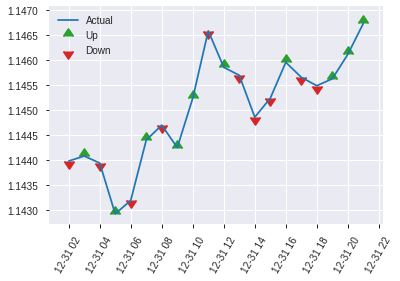


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.19185641878036744
RMSE: 0.43801417646049706
LogLoss: 0.567011383931142
Mean Per-Class Error: 0.2767611114616857
AUC: 0.7877884352453672
pr_auc: 0.7712447580676993
Gini: 0.5755768704907345
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.23274721205234528: 


,0,1,Error,Rate
0,110.0,189.0,0.6321,(189.0/299.0)
1,14.0,304.0,0.044,(14.0/318.0)
Total,124.0,493.0,0.329,(203.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2327472,0.7496917,317.0
max f2,0.2021215,0.8631285,333.0
max f0point5,0.5302438,0.7377622,175.0
max accuracy,0.4967153,0.7228525,191.0
max precision,0.8776853,1.0,0.0
max recall,0.0823095,1.0,393.0
max specificity,0.8776853,1.0,0.0
max absolute_mcc,0.4967153,0.4462948,191.0
max min_per_class_accuracy,0.4905128,0.7190635,196.0
max mean_per_class_accuracy,0.4967153,0.7232389,191.0


Gains/Lift Table: Avg response rate: 51.54 %, avg score: 46.71 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.8460549,1.3858940,1.3858940,0.7142857,0.8575339,0.7142857,0.8575339,0.0157233,0.0157233,38.5893980,38.5893980
,2,0.0210697,0.8362061,1.9402516,1.6417513,1.0,0.8405864,0.8461538,0.8497120,0.0188679,0.0345912,94.0251572,64.1751330
,3,0.0307942,0.8188324,1.9402516,1.7360146,1.0,0.8273747,0.8947368,0.8426581,0.0188679,0.0534591,94.0251572,73.6014565
,4,0.0405186,0.8054414,1.2935010,1.6298113,0.6666667,0.8117310,0.84,0.8352356,0.0125786,0.0660377,29.3501048,62.9811321
,5,0.0502431,0.7936614,1.6168763,1.6273078,0.8333333,0.8004391,0.8387097,0.8285008,0.0157233,0.0817610,61.6876310,62.7307770
,6,0.1004862,0.7407619,1.6273078,1.6273078,0.8387097,0.7646034,0.8387097,0.7965521,0.0817610,0.1635220,62.7307770,62.7307770
,7,0.1507293,0.7005560,1.8150741,1.6898965,0.9354839,0.7198569,0.8709677,0.7709871,0.0911950,0.2547170,81.5074052,68.9896531
,8,0.2009724,0.6679893,1.3769527,1.6116606,0.7096774,0.6815663,0.8306452,0.7486319,0.0691824,0.3238994,37.6952729,61.1660580
,9,0.2998379,0.6209771,1.6221775,1.6151283,0.8360656,0.6414911,0.8324324,0.7133044,0.1603774,0.4842767,62.2177544,61.5128336
,10,0.4003241,0.5632494,1.0640089,1.4767907,0.5483871,0.5928470,0.7611336,0.6830681,0.1069182,0.5911950,6.4008927,47.6790670


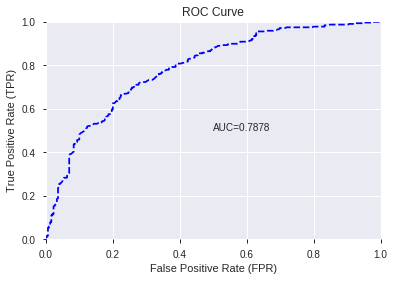

This function is available for GLM models only


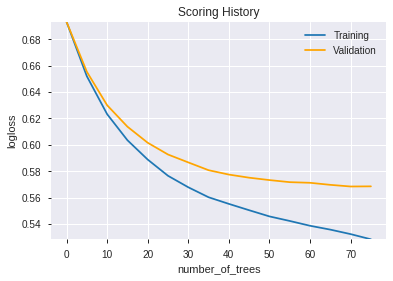

--2019-12-08 07:32:30--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.96.155
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.96.155|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
log4j:WARN No appenders could be found for logger (ml.dmlc.xgboost4j.java.Booster).
log4j:WARN Please initialize the log4j system properly.
log4j:WARN See http://logging.apache.org/log4j/1.2/faq.html#noconfig for more info.
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20191208_073159_model_4',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20191208_073159_model_4',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_17_sid_afcd',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

['BOP',
 'STOCHF_fastk',
 'CCI_8',
 'TRANGE',
 'DIV',
 'SUB',
 'WILLR_8',
 'aroonup_8',
 'ADOSC',
 'BETA_8',
 'STOCHRSI_fastd',
 'MINUS_DI_8',
 'PLUS_DM_8',
 'CORREL_30',
 'ULTOSC',
 'Volume',
 'WILLR_20',
 'MINUS_DI_12',
 'PLUS_DI_8',
 'CDLCLOSINGMARUBOZU',
 'STOCHRSI_fastk',
 'STOCH_slowd',
 'CCI_12',
 'MFI_20',
 'CCI_14',
 'HT_PHASOR_quadrature',
 'dayofweek',
 'WILLR_12',
 'CORREL_20',
 'AROONOSC_8',
 'aroonup_24',
 'CDLGRAVESTONEDOJI',
 'WILLR_14',
 'aroondown_8',
 'HT_TRENDMODE']

In [14]:
# XGBoost with top DeepLearning features
model_train(feature_name='DLF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

In [15]:
# DRF with top DeepLearning features
model_train(feature_name='DLF',model_algo="DRF",features_list = features_list[:model_selected_features])

Output hidden; open in https://colab.research.google.com to view.

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GBM_5_AutoML_20191208_073441,0.772975,0.577674,0.338639,0.443765,0.196927
1,GBM_grid_1_AutoML_20191208_073441_model_2,0.772496,0.615569,0.329779,0.461048,0.212565
2,GBM_grid_1_AutoML_20191208_073441_model_4,0.768747,0.652420,0.299252,0.479517,0.229936
3,GBM_grid_1_AutoML_20191208_073441_model_1,0.766375,0.614496,0.307440,0.460594,0.212147
4,GBM_2_AutoML_20191208_073441,0.764708,0.590255,0.304669,0.448188,0.200872
5,GBM_3_AutoML_20191208_073441,0.764603,0.589177,0.306141,0.447872,0.200590
6,GBM_grid_1_AutoML_20191208_073441_model_5,0.761863,0.693249,0.315801,0.500063,0.250063
7,GBM_1_AutoML_20191208_073441,0.758608,0.592080,0.316974,0.449483,0.202035
8,GBM_4_AutoML_20191208_073441,0.755721,0.599514,0.320418,0.452448,0.204709
9,GBM_grid_1_AutoML_20191208_073441_model_3,0.692155,0.797976,0.425123,0.506394,0.256435


,variable,relative_importance,scaled_importance,percentage
0,BOP,688.062927,1.000000,0.331466
1,STOCHF_fastk,231.325180,0.336198,0.111438
2,STOCHRSI_fastk,74.225769,0.107876,0.035757
3,CCI_8,72.304161,0.105084,0.034832
4,aroonup_8,70.359047,0.102257,0.033895
5,SUB,54.533283,0.079256,0.026271
6,DIV,48.673199,0.070739,0.023448
7,STOCHRSI_fastd,47.572388,0.069140,0.022917
8,ADOSC,46.723568,0.067906,0.022509
9,WILLR_8,45.654049,0.066352,0.021993


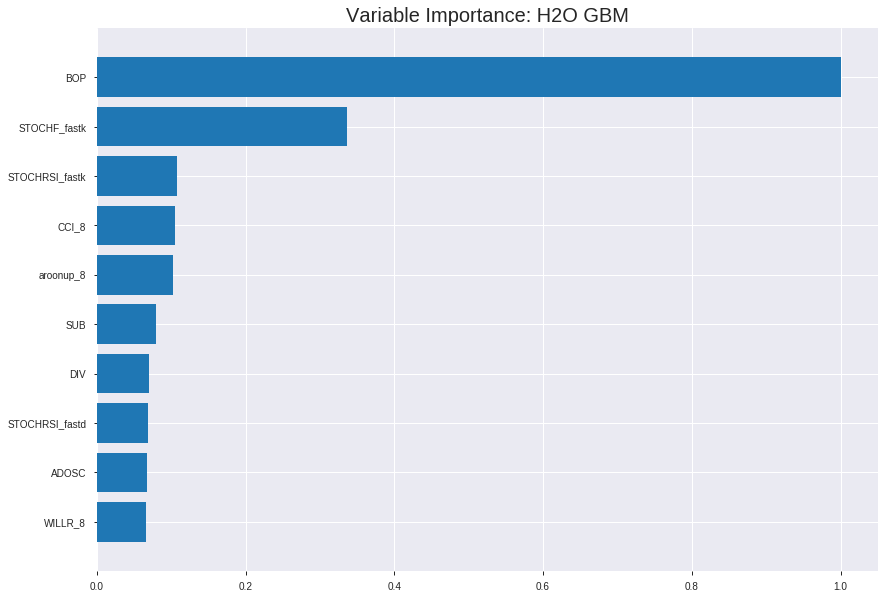

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_5_AutoML_20191208_073441


ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.15493062032041105
RMSE: 0.39361227155719
LogLoss: 0.47887338780096705
Mean Per-Class Error: 0.2200240665258899
AUC: 0.8657001903466971
pr_auc: 0.8400825172118404
Gini: 0.7314003806933942
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3553303399403808: 


,0,1,Error,Rate
0,1461.0,880.0,0.3759,(880.0/2341.0)
1,192.0,1786.0,0.0971,(192.0/1978.0)
Total,1653.0,2666.0,0.2482,(1072.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3553303,0.7691645,254.0
max f2,0.2616653,0.8588929,296.0
max f0point5,0.6017484,0.7803922,142.0
max accuracy,0.4976689,0.7811994,190.0
max precision,0.9199464,1.0,0.0
max recall,0.0953098,1.0,379.0
max specificity,0.9199464,1.0,0.0
max absolute_mcc,0.4976689,0.5595966,190.0
max min_per_class_accuracy,0.4840286,0.7770184,197.0
max mean_per_class_accuracy,0.4976689,0.7799759,190.0


Gains/Lift Table: Avg response rate: 45.80 %, avg score: 45.79 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.8778387,2.1338933,2.1338933,0.9772727,0.8930432,0.9772727,0.8930432,0.0217391,0.0217391,113.3893281,113.3893281
,2,0.0201436,0.8624756,2.1327392,2.1333229,0.9767442,0.8690787,0.9770115,0.8811987,0.0212336,0.0429727,113.2739201,113.3322873
,3,0.0300996,0.8505547,1.9804007,2.0827409,0.9069767,0.8566210,0.9538462,0.8730691,0.0197169,0.0626896,98.0400687,108.2740919
,4,0.0400556,0.8377339,2.0819597,2.0825467,0.9534884,0.8433307,0.9537572,0.8656775,0.0207280,0.0834176,108.1959696,108.2546742
,5,0.0500116,0.8273141,2.0819597,2.0824299,0.9534884,0.8325580,0.9537037,0.8590843,0.0207280,0.1041456,108.1959696,108.2429877
,6,0.1000232,0.7816051,1.9914499,2.0369399,0.9120370,0.8028049,0.9328704,0.8309446,0.0995956,0.2037412,99.1449931,103.6939904
,7,0.1500347,0.7464390,2.0217766,2.0318855,0.9259259,0.7638665,0.9305556,0.8085852,0.1011122,0.3048534,102.1776579,103.1885462
,8,0.2000463,0.7065769,1.9004700,1.9990316,0.8703704,0.7267892,0.9155093,0.7881362,0.0950455,0.3998989,90.0469985,99.9031593
,9,0.3000695,0.6239161,1.6123668,1.8701433,0.7384259,0.6655801,0.8564815,0.7472842,0.1612740,0.5611729,61.2366822,87.0143336
,10,0.4000926,0.5469789,1.3242637,1.7336734,0.6064815,0.5845027,0.7939815,0.7065888,0.1324570,0.6936299,32.4263660,73.3673417




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.1943379673930168
RMSE: 0.44083780168335923
LogLoss: 0.5709843224569794
Mean Per-Class Error: 0.28428416545982604
AUC: 0.7708691098924
pr_auc: 0.7358851837999896
Gini: 0.5417382197848
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4391614020184728: 


,0,1,Error,Rate
0,441.0,216.0,0.3288,(216.0/657.0)
1,139.0,438.0,0.2409,(139.0/577.0)
Total,580.0,654.0,0.2877,(355.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4391614,0.7116166,210.0
max f2,0.1553103,0.8316192,350.0
max f0point5,0.4861648,0.6924923,189.0
max accuracy,0.4861648,0.7131280,189.0
max precision,0.9233315,1.0,0.0
max recall,0.0802026,1.0,389.0
max specificity,0.9233315,1.0,0.0
max absolute_mcc,0.4408240,0.4311043,209.0
max min_per_class_accuracy,0.4773985,0.7105719,194.0
max mean_per_class_accuracy,0.4408240,0.7157158,209.0


Gains/Lift Table: Avg response rate: 46.76 %, avg score: 46.06 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.8800801,2.1386482,2.1386482,1.0,0.8900175,1.0,0.8900175,0.0225303,0.0225303,113.8648180,113.8648180
,2,0.0202593,0.8620390,1.2475448,1.7109185,0.5833333,0.8684956,0.8,0.8796870,0.0121317,0.0346620,24.7544772,71.0918544
,3,0.0299838,0.8465379,2.1386482,1.8496417,1.0,0.8541778,0.8648649,0.8714138,0.0207972,0.0554593,113.8648180,84.9641669
,4,0.0405186,0.8328513,1.9741368,1.8820104,0.9230769,0.8391999,0.88,0.8630382,0.0207972,0.0762565,97.4136782,88.2010399
,5,0.0502431,0.8232100,2.1386482,1.9316822,1.0,0.8278263,0.9032258,0.8562230,0.0207972,0.0970537,113.8648180,93.1682227
,6,0.1004862,0.7779178,1.7592106,1.8454464,0.8225806,0.7983849,0.8629032,0.8273039,0.0883882,0.1854419,75.9210600,84.5446414
,7,0.1499190,0.7334576,1.6127511,1.7687198,0.7540984,0.7559142,0.8270270,0.8037646,0.0797227,0.2651646,61.2751087,76.8719846
,8,0.2001621,0.6968059,1.5867390,1.7230404,0.7419355,0.7151945,0.8056680,0.7815324,0.0797227,0.3448873,58.6738972,72.3040437
,9,0.2998379,0.6300058,1.3562159,1.6010961,0.6341463,0.6647344,0.7486486,0.7427050,0.1351820,0.4800693,35.6215919,60.1096070
,10,0.4003241,0.5470019,1.1210656,1.4806026,0.5241935,0.5896465,0.6923077,0.7042854,0.1126516,0.5927210,12.1065578,48.0602586



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 07:34:48,0.005 sec,0.0,0.4982309,0.6896110,0.5,0.0,1.0,0.5420236,0.4990407,0.6912300,0.5,0.0,1.0,0.5324149
,2019-12-08 07:34:48,0.096 sec,5.0,0.4610185,0.6163280,0.7914112,0.7419433,1.9506100,0.3021533,0.4665259,0.6268528,0.7627496,0.7101153,1.9442256,0.3136143
,2019-12-08 07:34:48,0.199 sec,10.0,0.4417280,0.5775237,0.8020452,0.7592890,1.9819631,0.2965964,0.4524008,0.5979485,0.7676350,0.7233774,1.9247834,0.3257699
,2019-12-08 07:34:48,0.311 sec,15.0,0.4301273,0.5534032,0.8136540,0.7768157,2.0346424,0.2771475,0.4462630,0.5845018,0.7694103,0.7322508,2.1386482,0.3136143
,2019-12-08 07:34:48,0.412 sec,20.0,0.4224525,0.5370057,0.8217564,0.7888754,2.0842679,0.2748321,0.4428263,0.5767142,0.7715418,0.7377877,1.9741368,0.3014587
,2019-12-08 07:34:49,0.519 sec,25.0,0.4156768,0.5229415,0.8315787,0.8005325,2.0842679,0.2602454,0.4409387,0.5722104,0.7734965,0.7414575,1.9741368,0.3014587
,2019-12-08 07:34:49,0.632 sec,30.0,0.4097851,0.5109051,0.8404667,0.8099345,2.0842679,0.2572355,0.4403417,0.5704145,0.7733237,0.7384775,1.9741368,0.2901135
,2019-12-08 07:34:49,0.740 sec,35.0,0.4040482,0.4992543,0.8494584,0.8214422,2.1338933,0.2514471,0.4389957,0.5670037,0.7757914,0.7433621,1.9741368,0.3460292
,2019-12-08 07:34:49,0.856 sec,40.0,0.3985618,0.4883871,0.8580131,0.8314196,2.0842679,0.2222737,0.4392795,0.5677254,0.7745213,0.7405488,1.9741368,0.3298217
,2019-12-08 07:34:49,1.077 sec,45.0,0.3936123,0.4788734,0.8657002,0.8400825,2.1338933,0.2482056,0.4408378,0.5709843,0.7708691,0.7358852,2.1386482,0.2876823


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,688.0629272,1.0,0.3314658
STOCHF_fastk,231.3251801,0.3361977,0.1114380
STOCHRSI_fastk,74.2257690,0.1078764,0.0357573
CCI_8,72.3041611,0.1050836,0.0348316
aroonup_8,70.3590469,0.1022567,0.0338946
---,---,---,---
CDLENGULFING,0.0,0.0,0.0
CDLHANGINGMAN,0.0,0.0,0.0
CDLHARAMI,0.0,0.0,0.0
CDLMARUBOZU,0.0,0.0,0.0



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.706645056726094)

('F1', 0.7417721518987342)

('auc', 0.7729749058707222)

('logloss', 0.5776743780002268)

('mean_per_class_error', 0.29118550303948165)

('rmse', 0.4437648488858485)

('mse', 0.19692724110667997)

gbm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
6165        0
6166        0
6167        1
6168        1
6169        1

[6170 rows x 1 columns]


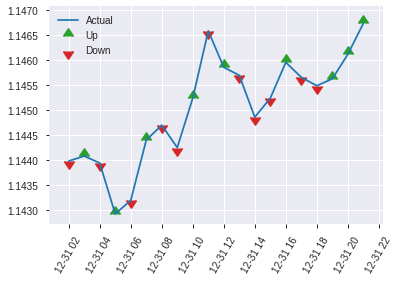


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.19692724110667997
RMSE: 0.4437648488858485
LogLoss: 0.5776743780002268
Mean Per-Class Error: 0.29118550303948165
AUC: 0.7729749058707222
pr_auc: 0.7547635830570766
Gini: 0.5459498117414443
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.23014657554935847: 


,0,1,Error,Rate
0,120.0,179.0,0.5987,(179.0/299.0)
1,25.0,293.0,0.0786,(25.0/318.0)
Total,145.0,472.0,0.3306,(204.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2301466,0.7417722,307.0
max f2,0.1572842,0.8613099,347.0
max f0point5,0.5252583,0.7281205,180.0
max accuracy,0.5252583,0.7066451,180.0
max precision,0.9203103,1.0,0.0
max recall,0.0737524,1.0,390.0
max specificity,0.9203103,1.0,0.0
max absolute_mcc,0.5252583,0.4208953,180.0
max min_per_class_accuracy,0.4734412,0.6918239,203.0
max mean_per_class_accuracy,0.5252583,0.7088145,180.0


Gains/Lift Table: Avg response rate: 51.54 %, avg score: 46.43 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.8681679,1.9402516,1.9402516,1.0,0.8843378,1.0,0.8843378,0.0220126,0.0220126,94.0251572,94.0251572
,2,0.0210697,0.8619973,0.9701258,1.4925012,0.5,0.8656538,0.7692308,0.8757144,0.0094340,0.0314465,-2.9874214,49.2501209
,3,0.0307942,0.8527643,1.2935010,1.4296591,0.6666667,0.8565416,0.7368421,0.8696598,0.0125786,0.0440252,29.3501048,42.9659053
,4,0.0405186,0.8429756,1.6168763,1.4745912,0.8333333,0.8483619,0.76,0.8645483,0.0157233,0.0597484,61.6876310,47.4591195
,5,0.0502431,0.8296866,1.6168763,1.5021302,0.8333333,0.8376508,0.7741935,0.8593424,0.0157233,0.0754717,61.6876310,50.2130250
,6,0.1004862,0.7787834,1.6898965,1.5960134,0.8709677,0.8066923,0.8225806,0.8330173,0.0849057,0.1603774,68.9896531,59.6013390
,7,0.1507293,0.7466634,1.6898965,1.6273078,0.8709677,0.7613538,0.8387097,0.8091295,0.0849057,0.2452830,68.9896531,62.7307770
,8,0.2009724,0.7059034,1.6898965,1.6429550,0.8709677,0.7245536,0.8467742,0.7879855,0.0849057,0.3301887,68.9896531,64.2954960
,9,0.2998379,0.6231913,1.3359109,1.5417134,0.6885246,0.6643128,0.7945946,0.7472069,0.1320755,0.4622642,33.5910919,54.1713412
,10,0.4003241,0.5472924,1.2517752,1.4689354,0.6451613,0.5872046,0.7570850,0.7070444,0.1257862,0.5880503,25.1775208,46.8935401


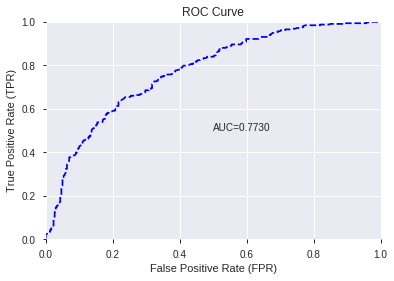

This function is available for GLM models only


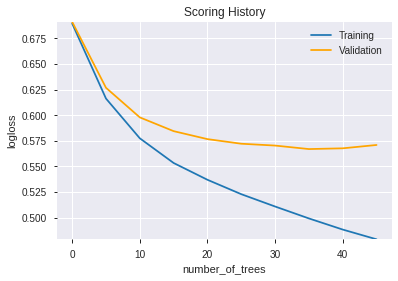

--2019-12-08 07:35:06--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.139.179
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.139.179|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip

Tree inconsistency found:
Note: this is a known issue for DRF and Isolation Forest models, please refer to https://0xdata.atlassian.net/browse/PUBDEV-6140
        Node 2 (parent)
            weight:      3531.0
            depth:       1
            colId:       23
            colName:     STOCHF_fastk
            leftward:    true
            naVsRest:    false
            splitVal:    0.8460083
            isBitset:    false
            predValue:   0.055192687
            squaredErr:  882.1376
            leftChild:   Node 5
            r

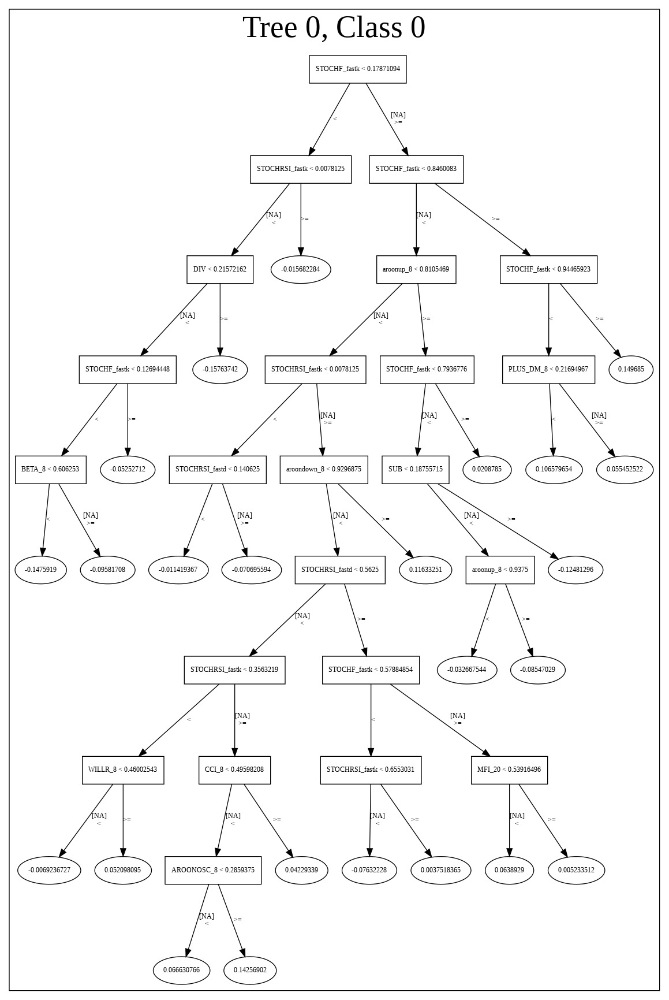

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GBM_5_AutoML_20191208_073441',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GBM_5_AutoML_20191208_073441',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_27_sid_afcd',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_27_sid_afcd',
   'type': 'Key<

['BOP',
 'STOCHF_fastk',
 'STOCHRSI_fastk',
 'CCI_8',
 'aroonup_8',
 'SUB',
 'DIV',
 'STOCHRSI_fastd',
 'ADOSC',
 'WILLR_8',
 'PLUS_DI_8',
 'MINUS_DI_12',
 'BETA_8',
 'MINUS_DI_8',
 'WILLR_20',
 'ULTOSC',
 'WILLR_12',
 'TRANGE',
 'CORREL_30',
 'PLUS_DM_8',
 'MFI_20',
 'Volume',
 'CDLDRAGONFLYDOJI',
 'CCI_14',
 'STOCH_slowd',
 'CDLCLOSINGMARUBOZU',
 'aroondown_8',
 'aroonup_24',
 'weekday',
 'CCI_12',
 'AROONOSC_8',
 'WILLR_14',
 'weekday_name',
 'HT_PHASOR_quadrature',
 'CDLGRAVESTONEDOJI',
 'HT_TRENDMODE',
 'CDLHAMMER',
 'CORREL_20',
 'CDLHIKKAKE',
 'dayofweek',
 'CDLLONGLINE',
 'CDLSHORTLINE',
 'is_month_end',
 'CDL3INSIDE',
 'CDL3LINESTRIKE',
 'CDLENGULFING',
 'CDLHANGINGMAN',
 'CDLHARAMI',
 'CDLMARUBOZU',
 'CDLTAKURI']

In [16]:
# GBM with top DeepLearning features
model_train(feature_name='DLF',model_algo="GBM",features_list = features_list[:model_selected_features])

In [17]:
# StackedEnsemble with top DeepLearning features
model_train(feature_name='DLF',model_algo="StackedEnsemble",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_3_AutoML_20191208_073604,0.781851,0.571538,0.300151,0.440283,0.193849
1,XGBoost_1_AutoML_20191208_073604,0.775489,0.575988,0.294435,0.442050,0.195408
2,XGBoost_2_AutoML_20191208_073604,0.774894,0.575963,0.312257,0.442386,0.195705
3,GLM_grid_1_AutoML_20191208_073604_model_1,0.774705,0.574672,0.317473,0.441975,0.195342
4,GBM_5_AutoML_20191208_073604,0.772975,0.577674,0.338639,0.443765,0.196927
5,GBM_2_AutoML_20191208_073604,0.764708,0.590255,0.304669,0.448188,0.200872
6,GBM_3_AutoML_20191208_073604,0.764603,0.589177,0.306141,0.447872,0.200590
7,GBM_1_AutoML_20191208_073604,0.758608,0.592080,0.316974,0.449483,0.202035
8,GBM_4_AutoML_20191208_073604,0.755721,0.599514,0.320418,0.452448,0.204709
9,DRF_1_AutoML_20191208_073604,0.752919,0.652565,0.300225,0.453761,0.205899


,variable,relative_importance,scaled_importance,percentage
0,BOP,5197.314453,1.000000,0.329134
1,STOCHF_fastk,1298.843506,0.249907,0.082253
2,STOCHRSI_fastk,559.952148,0.107739,0.035460
3,DIV,542.738037,0.104427,0.034370
4,WILLR_8,461.767578,0.088847,0.029243
5,CCI_8,392.641418,0.075547,0.024865
6,SUB,392.615448,0.075542,0.024863
7,ULTOSC,383.730988,0.073833,0.024301
8,MINUS_DI_12,372.590210,0.071689,0.023595
9,MINUS_DI_8,368.511963,0.070904,0.023337


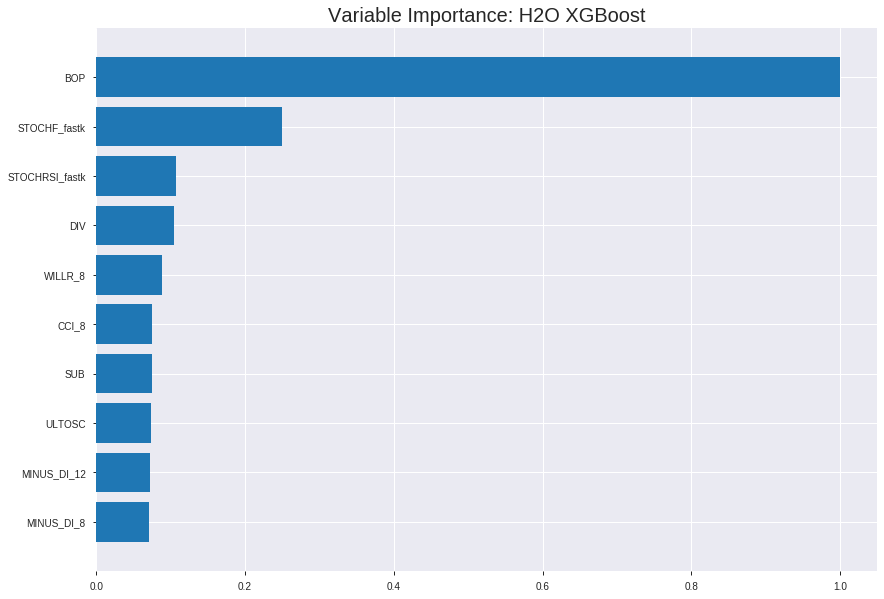

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_3_AutoML_20191208_073604


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.1608445183490555
RMSE: 0.40105425860979893
LogLoss: 0.4924835773805195
Mean Per-Class Error: 0.2300841075841087
AUC: 0.8587434872015925
pr_auc: 0.8425315365513711
Gini: 0.7174869744031851
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.39568424224853516: 


,0,1,Error,Rate
0,1511.0,830.0,0.3545,(830.0/2341.0)
1,261.0,1717.0,0.132,(261.0/1978.0)
Total,1772.0,2547.0,0.2526,(1091.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3956842,0.7588950,236.0
max f2,0.2479292,0.8595004,304.0
max f0point5,0.6068055,0.7666299,137.0
max accuracy,0.5204222,0.7712433,181.0
max precision,0.9352487,1.0,0.0
max recall,0.1280333,1.0,364.0
max specificity,0.9352487,1.0,0.0
max absolute_mcc,0.5037472,0.5389066,189.0
max min_per_class_accuracy,0.4972277,0.7676207,192.0
max mean_per_class_accuracy,0.5037472,0.7699159,189.0


Gains/Lift Table: Avg response rate: 45.80 %, avg score: 45.82 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.8783116,2.1835187,2.1835187,1.0,0.8974513,1.0,0.8974513,0.0222447,0.0222447,118.3518706,118.3518706
,2,0.0201436,0.8572425,2.1835187,2.1835187,1.0,0.8680318,1.0,0.8829106,0.0217391,0.0439838,118.3518706,118.3518706
,3,0.0300996,0.8397217,2.1835187,2.1835187,1.0,0.8481496,1.0,0.8714128,0.0217391,0.0657230,118.3518706,118.3518706
,4,0.0400556,0.8244059,2.1327392,2.1708972,0.9767442,0.8308418,0.9942197,0.8613287,0.0212336,0.0869565,113.2739201,117.0897210
,5,0.0500116,0.8092943,2.1327392,2.1633009,0.9767442,0.8177854,0.9907407,0.8526603,0.0212336,0.1081901,113.2739201,116.3300940
,6,0.1000232,0.7541354,2.1228654,2.1430832,0.9722222,0.7794111,0.9814815,0.8160357,0.1061678,0.2143579,112.2865408,114.3083174
,7,0.1500347,0.7054758,1.9307966,2.0723210,0.8842593,0.7288635,0.9490741,0.7869783,0.0965622,0.3109201,93.0796633,107.2320994
,8,0.2000463,0.6671418,1.7387279,1.9889227,0.7962963,0.6862284,0.9108796,0.7617909,0.0869565,0.3978766,73.8727858,98.8922710
,9,0.3000695,0.6080586,1.5668768,1.8482408,0.7175926,0.6374070,0.8464506,0.7203296,0.1567240,0.5546006,56.6876849,84.8240756
,10,0.4000926,0.5489891,1.2433926,1.6970287,0.5694444,0.5779785,0.7771991,0.6847418,0.1243680,0.6789687,24.3392596,69.7028716




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.1918403149441624
RMSE: 0.43799579329505256
LogLoss: 0.5653975510598487
Mean Per-Class Error: 0.273524159234375
AUC: 0.7780521196869337
pr_auc: 0.7374884370615631
Gini: 0.5561042393738673
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.45907185475031537: 


,0,1,Error,Rate
0,453.0,204.0,0.3105,(204.0/657.0)
1,137.0,440.0,0.2374,(137.0/577.0)
Total,590.0,644.0,0.2763,(341.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4590719,0.7207207,208.0
max f2,0.2144075,0.8328322,325.0
max f0point5,0.4644593,0.6995819,205.0
max accuracy,0.4644593,0.7244733,205.0
max precision,0.9056303,1.0,0.0
max recall,0.0985933,1.0,384.0
max specificity,0.9056303,1.0,0.0
max absolute_mcc,0.4620133,0.4522365,206.0
max min_per_class_accuracy,0.4889171,0.7168950,194.0
max mean_per_class_accuracy,0.4620133,0.7264758,206.0


Gains/Lift Table: Avg response rate: 46.76 %, avg score: 45.74 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.8736537,2.1386482,2.1386482,1.0,0.8886420,1.0,0.8886420,0.0225303,0.0225303,113.8648180,113.8648180
,2,0.0202593,0.8477972,1.6039861,1.8820104,0.75,0.8610035,0.88,0.8753755,0.0155979,0.0381282,60.3986135,88.2010399
,3,0.0299838,0.8210451,2.1386482,1.9652443,1.0,0.8368198,0.9189189,0.8628710,0.0207972,0.0589255,113.8648180,96.5244274
,4,0.0405186,0.8079116,1.8096254,1.9247834,0.8461538,0.8148506,0.9,0.8503857,0.0190641,0.0779896,80.9625383,92.4783362
,5,0.0502431,0.7960150,1.7822068,1.8971879,0.8333333,0.8014146,0.8870968,0.8409074,0.0173310,0.0953206,78.2206817,89.7187902
,6,0.1004862,0.7429421,1.6557276,1.7764578,0.7741935,0.7659246,0.8306452,0.8034160,0.0831889,0.1785095,65.5727623,77.6457763
,7,0.1499190,0.6946720,1.7529903,1.7687198,0.8196721,0.7185164,0.8270270,0.7754221,0.0866551,0.2651646,75.2990312,76.8719846
,8,0.2001621,0.6631414,1.4487617,1.6884065,0.6774194,0.6802492,0.7894737,0.7515325,0.0727903,0.3379549,44.8761670,68.8406458
,9,0.2998379,0.6038866,1.4605402,1.6126563,0.6829268,0.6348738,0.7540541,0.7127514,0.1455806,0.4835355,46.0540221,61.2656331
,10,0.4003241,0.5531260,1.2590429,1.5238951,0.5887097,0.5774393,0.7125506,0.6787864,0.1265165,0.6100520,25.9042880,52.3895060



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 07:36:08,0.003 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5420236,0.5,0.6931472,0.5,0.0,1.0,0.5324149
,2019-12-08 07:36:09,0.077 sec,5.0,0.4768278,0.6476137,0.7984312,0.7481163,2.1360509,0.2817782,0.4805807,0.6548467,0.7580502,0.6922265,1.8096254,0.3403566
,2019-12-08 07:36:09,0.132 sec,10.0,0.4608045,0.6165019,0.8076838,0.7730689,2.1338933,0.2806205,0.4674985,0.6291815,0.7684739,0.7177324,1.8096254,0.3192869
,2019-12-08 07:36:09,0.182 sec,15.0,0.4500137,0.5952447,0.8107513,0.7806092,2.1835187,0.2854828,0.4581911,0.6106847,0.7755830,0.7292844,1.9741368,0.2965964
,2019-12-08 07:36:09,0.239 sec,20.0,0.4410566,0.5770867,0.8146111,0.7856840,2.1338933,0.2762213,0.4515751,0.5970353,0.7773676,0.7335819,1.9741368,0.3014587
,2019-12-08 07:36:09,0.295 sec,25.0,0.4342939,0.5629796,0.8186968,0.7927098,2.1835187,0.2792313,0.4479202,0.5889373,0.7755896,0.7304520,1.9741368,0.3160454
,2019-12-08 07:36:09,0.357 sec,30.0,0.4286081,0.5509127,0.8240400,0.7980120,2.1835187,0.2736745,0.4451815,0.5827419,0.7757215,0.7314214,1.9741368,0.2990276
,2019-12-08 07:36:09,0.414 sec,35.0,0.4245045,0.5419513,0.8267718,0.7997098,2.1835187,0.2752952,0.4428499,0.5774827,0.7771552,0.7349854,1.9741368,0.3006483
,2019-12-08 07:36:09,0.478 sec,40.0,0.4210040,0.5343405,0.8305120,0.8059592,2.1835187,0.2690438,0.4416035,0.5744341,0.7774085,0.7356269,1.9741368,0.3038898
,2019-12-08 07:36:09,0.547 sec,45.0,0.4170334,0.5260475,0.8361718,0.8145867,2.1835187,0.2678861,0.4405245,0.5718034,0.7773570,0.7365240,2.1386482,0.2884927


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,5197.3144531,1.0,0.3291341
STOCHF_fastk,1298.8435059,0.2499067,0.0822528
STOCHRSI_fastk,559.9521484,0.1077387,0.0354605
DIV,542.7380371,0.1044266,0.0343704
WILLR_8,461.7675781,0.0888473,0.0292427
---,---,---,---
weekday_name,18.9607372,0.0036482,0.0012007
HT_TRENDMODE,18.2967339,0.0035204,0.0011587
is_month_end,10.7002439,0.0020588,0.0006776
CDLMARUBOZU,4.1391211,0.0007964,0.0002621



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7147487844408428)

('F1', 0.7520435967302452)

('auc', 0.7818514545339812)

('logloss', 0.5715382966099775)

('mean_per_class_error', 0.2860215393029175)

('rmse', 0.440282837059002)

('mse', 0.19384897660872372)

xgboost prediction progress: |████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
6165        0
6166        0
6167        1
6168        1
6169        1

[6170 rows x 1 columns]


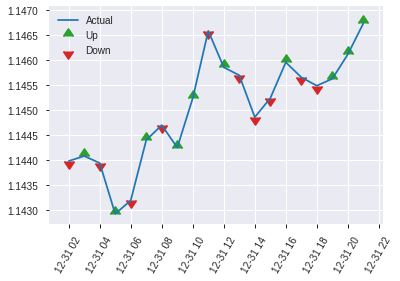


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.19384897660872372
RMSE: 0.440282837059002
LogLoss: 0.5715382966099775
Mean Per-Class Error: 0.2860215393029175
AUC: 0.7818514545339812
pr_auc: 0.7691922664472522
Gini: 0.5637029090679624
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.337792307138443: 


,0,1,Error,Rate
0,159.0,140.0,0.4682,(140.0/299.0)
1,42.0,276.0,0.1321,(42.0/318.0)
Total,201.0,416.0,0.295,(182.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3377923,0.7520436,271.0
max f2,0.1548171,0.8551198,362.0
max f0point5,0.5717825,0.7336523,151.0
max accuracy,0.4584920,0.7147488,213.0
max precision,0.9004748,1.0,0.0
max recall,0.0573261,1.0,396.0
max specificity,0.9004748,1.0,0.0
max absolute_mcc,0.4584920,0.4286111,213.0
max min_per_class_accuracy,0.4845082,0.7075472,201.0
max mean_per_class_accuracy,0.4584920,0.7139785,213.0


Gains/Lift Table: Avg response rate: 51.54 %, avg score: 46.21 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.8724685,1.6630728,1.6630728,0.8571429,0.8814468,0.8571429,0.8814468,0.0188679,0.0188679,66.3072776,66.3072776
,2,0.0210697,0.8339410,1.9402516,1.7910015,1.0,0.8537113,0.9230769,0.8686458,0.0188679,0.0377358,94.0251572,79.1001451
,3,0.0307942,0.8180300,1.2935010,1.6338961,0.6666667,0.8225392,0.8421053,0.8540858,0.0125786,0.0503145,29.3501048,63.3896061
,4,0.0405186,0.8032020,1.9402516,1.7074214,1.0,0.8119558,0.88,0.8439746,0.0188679,0.0691824,94.0251572,70.7421384
,5,0.0502431,0.7947677,1.2935010,1.6273078,0.6666667,0.7993317,0.8387097,0.8353340,0.0125786,0.0817610,29.3501048,62.7307770
,6,0.1004862,0.7490782,1.8776628,1.7524853,0.9677419,0.7720948,0.9032258,0.8037144,0.0943396,0.1761006,87.7662812,75.2485291
,7,0.1507293,0.7009573,1.4395415,1.6481707,0.7419355,0.7233611,0.8494624,0.7769300,0.0723270,0.2484277,43.9541489,64.8170690
,8,0.2009724,0.6634395,1.5647190,1.6273078,0.8064516,0.6784943,0.8387097,0.7523211,0.0786164,0.3270440,56.4719010,62.7307770
,9,0.2998379,0.6060666,1.3677183,1.5417134,0.7049180,0.6394685,0.7945946,0.7151102,0.1352201,0.4622642,36.7718321,54.1713412
,10,0.4003241,0.5555893,1.3769527,1.5003565,0.7096774,0.5831228,0.7732794,0.6819798,0.1383648,0.6006289,37.6952729,50.0356479


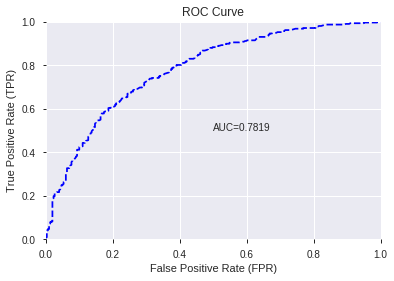

This function is available for GLM models only


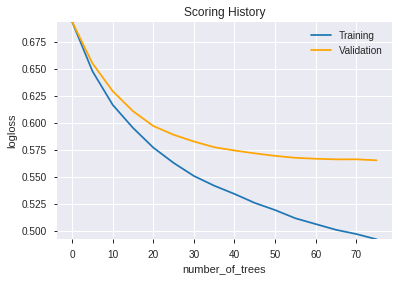

--2019-12-08 07:36:28--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.86.131
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.86.131|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.indexOf(String.java:1578)
	at java.base/java.lang.String.indexOf(String.java:1535)
	at java.base/java.lang.String.split(String.java:2274)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.j

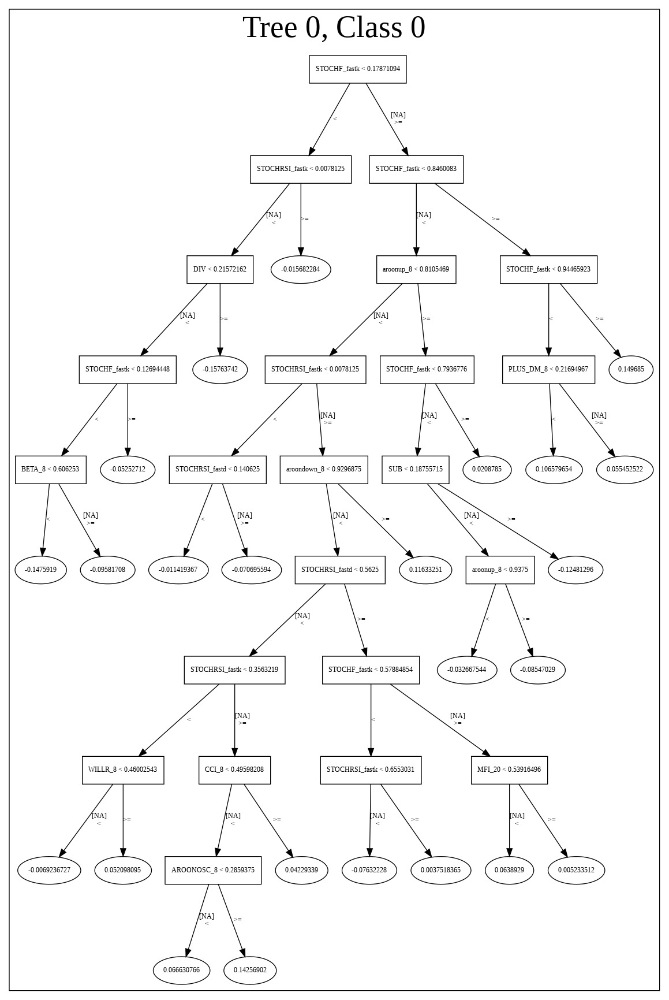

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_3_AutoML_20191208_073604',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_3_AutoML_20191208_073604',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_35_sid_afcd',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_35_sid_afcd',
   'type

['BOP',
 'STOCHF_fastk',
 'STOCHRSI_fastk',
 'DIV',
 'WILLR_8',
 'CCI_8',
 'SUB',
 'ULTOSC',
 'MINUS_DI_12',
 'MINUS_DI_8',
 'TRANGE',
 'aroonup_8',
 'PLUS_DI_8',
 'Volume',
 'ADOSC',
 'STOCHRSI_fastd',
 'BETA_8',
 'CDLCLOSINGMARUBOZU',
 'CORREL_30',
 'STOCH_slowd',
 'CCI_14',
 'MFI_20',
 'PLUS_DM_8',
 'HT_PHASOR_quadrature',
 'CCI_12',
 'CDLDRAGONFLYDOJI',
 'WILLR_20',
 'WILLR_12',
 'dayofweek',
 'CDLHANGINGMAN',
 'WILLR_14',
 'AROONOSC_8',
 'CDLGRAVESTONEDOJI',
 'CDLHAMMER',
 'aroondown_8',
 'CDLTAKURI',
 'CDLLONGLINE',
 'CORREL_20',
 'weekday',
 'aroonup_24',
 'CDLENGULFING',
 'CDLHIKKAKE',
 'weekday_name',
 'HT_TRENDMODE',
 'is_month_end',
 'CDLMARUBOZU',
 'CDLSHORTLINE']

In [18]:
# All algos with top DeepLearning features
model_train(feature_name='DLF',model_algo=None,features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191208_073726_model_1,0.773979,0.603412,0.303696,0.456425,0.208323


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.498044,1.000000,4.280680e-02
1,STOCHF_fastk,0.209714,0.421075,1.802487e-02
2,CCI_8,0.207391,0.416411,1.782522e-02
3,WILLR_8,0.165443,0.332186,1.421981e-02
4,CDLCLOSINGMARUBOZU,0.163120,0.327521,1.402013e-02
...,...,...,...,...
947,MAVP_14_1,0.000011,0.000021,9.025607e-07
948,BBANDS_upperband_24_3_5,0.000009,0.000018,7.555247e-07
949,MIN_20,0.000007,0.000013,5.636772e-07
950,BBANDS_lowerband_24_5_3,0.000003,0.000006,2.426143e-07


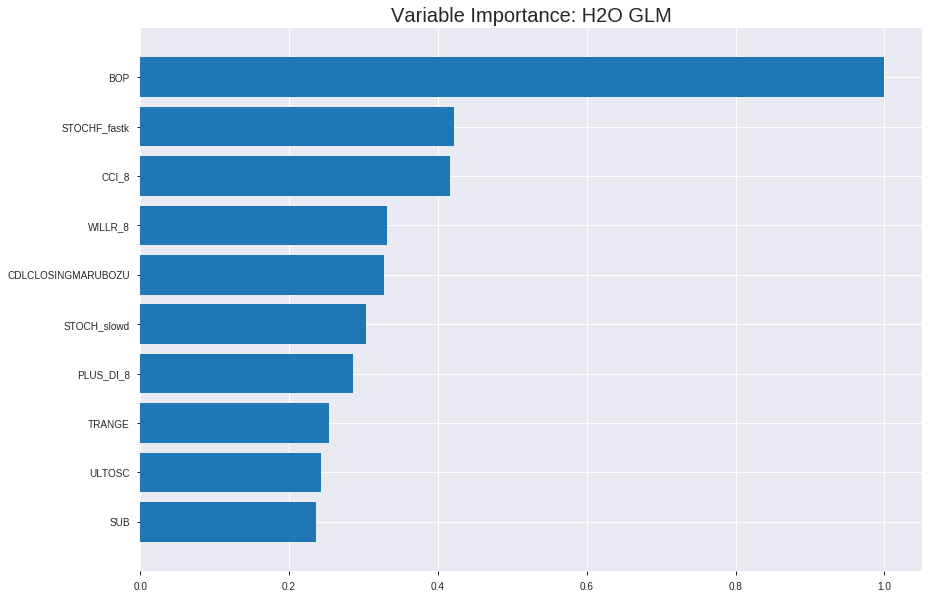

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191208_073726_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.18971324553267724
RMSE: 0.43556084021945457
LogLoss: 0.5596830166958761
Null degrees of freedom: 4318
Residual degrees of freedom: 3366
Null deviance: 5956.860179047515
Residual deviance: 4834.5418982189785
AIC: 6740.5418982189785
AUC: 0.7824413270451689
pr_auc: 0.738567443089046
Gini: 0.5648826540903378
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3725762253330342: 


,0,1,Error,Rate
0,1340.0,1001.0,0.4276,(1001.0/2341.0)
1,321.0,1657.0,0.1623,(321.0/1978.0)
Total,1661.0,2658.0,0.3061,(1322.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3725762,0.7148404,244.0
max f2,0.1948682,0.8256604,327.0
max f0point5,0.5309527,0.6927847,169.0
max accuracy,0.4800382,0.7138226,192.0
max precision,0.9792023,1.0,0.0
max recall,0.0323759,1.0,393.0
max specificity,0.9792023,1.0,0.0
max absolute_mcc,0.4800382,0.4241914,192.0
max min_per_class_accuracy,0.4696388,0.7095258,197.0
max mean_per_class_accuracy,0.4800382,0.7122963,192.0


Gains/Lift Table: Avg response rate: 45.80 %, avg score: 45.80 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.8972791,2.0842679,2.0842679,0.9545455,0.9267164,0.9545455,0.9267164,0.0212336,0.0212336,108.4267856,108.4267856
,2,0.0201436,0.8690523,1.7772827,1.9325395,0.8139535,0.8817277,0.8850575,0.9044806,0.0176946,0.0389282,77.7282667,93.2539544
,3,0.0300996,0.8441959,1.9804007,1.9483705,0.9069767,0.8545918,0.8923077,0.8879789,0.0197169,0.0586451,98.0400687,94.8370537
,4,0.0400556,0.8317339,1.9296212,1.9437103,0.8837209,0.8376388,0.8901734,0.8754667,0.0192113,0.0778564,92.9621182,94.3710293
,5,0.0500116,0.8187776,1.8280622,1.9206878,0.8372093,0.8256301,0.8796296,0.8655455,0.0182002,0.0960566,82.8062172,92.0687750
,6,0.1000232,0.7601965,1.8195989,1.8701433,0.8333333,0.7888025,0.8564815,0.8271740,0.0910010,0.1870576,81.9598921,87.0143336
,7,0.1500347,0.7144535,1.6073124,1.7825330,0.7361111,0.7384622,0.8163580,0.7976034,0.0803842,0.2674419,60.7312381,78.2533018
,8,0.2000463,0.6739301,1.5466591,1.7235645,0.7083333,0.6937823,0.7893519,0.7716481,0.0773509,0.3447927,54.6659083,72.3564534
,9,0.3000695,0.5978234,1.4860058,1.6443783,0.6805556,0.6348707,0.7530864,0.7260556,0.1486350,0.4934277,48.6005786,64.4378285
,10,0.4000926,0.5286729,1.2888826,1.5555044,0.5902778,0.5646369,0.7123843,0.6857010,0.1289181,0.6223458,28.8882569,55.5504356




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.19770862055193464
RMSE: 0.4446443753742249
LogLoss: 0.5787706928455937
Null degrees of freedom: 1233
Residual degrees of freedom: 281
Null deviance: 1705.9557175251716
Residual deviance: 1428.406069942925
AIC: 3334.4060699429247
AUC: 0.7734779959323537
pr_auc: 0.7281409768454934
Gini: 0.5469559918647073
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.30435829171091644: 


,0,1,Error,Rate
0,366.0,291.0,0.4429,(291.0/657.0)
1,84.0,493.0,0.1456,(84.0/577.0)
Total,450.0,784.0,0.3039,(375.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3043583,0.7244673,262.0
max f2,0.1597638,0.8298694,342.0
max f0point5,0.4617562,0.6903201,181.0
max accuracy,0.4246257,0.7082658,198.0
max precision,0.9124093,1.0,0.0
max recall,0.0296227,1.0,395.0
max specificity,0.9124093,1.0,0.0
max absolute_mcc,0.3085521,0.4274752,260.0
max min_per_class_accuracy,0.4037315,0.7001733,209.0
max mean_per_class_accuracy,0.3085521,0.7069540,260.0


Gains/Lift Table: Avg response rate: 46.76 %, avg score: 40.92 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.8555853,1.9741368,1.9741368,0.9230769,0.8824335,0.9230769,0.8824335,0.0207972,0.0207972,97.4136782,97.4136782
,2,0.0202593,0.8258582,1.9604275,1.9675563,0.9166667,0.8393462,0.92,0.8617516,0.0190641,0.0398614,96.0427499,96.7556326
,3,0.0299838,0.8029281,1.4257655,1.7918404,0.6666667,0.8127334,0.8378378,0.8458538,0.0138648,0.0537262,42.5765453,79.1840367
,4,0.0405186,0.7845048,1.9741368,1.8392374,0.9230769,0.7955604,0.86,0.8327775,0.0207972,0.0745234,97.4136782,83.9237435
,5,0.0502431,0.7656762,1.7822068,1.8281993,0.8333333,0.7739524,0.8548387,0.8213920,0.0173310,0.0918544,78.2206817,82.8199251
,6,0.1004862,0.7072260,1.7247163,1.7764578,0.8064516,0.7324283,0.8306452,0.7769101,0.0866551,0.1785095,72.4716274,77.6457763
,7,0.1499190,0.6602445,1.7179305,1.7571596,0.8032787,0.6829021,0.8216216,0.7459129,0.0849220,0.2634315,71.7930505,75.7159586
,8,0.2001621,0.6200211,1.4832560,1.6884065,0.6935484,0.6391831,0.7894737,0.7191224,0.0745234,0.3379549,48.3255996,68.8406458
,9,0.2998379,0.5462131,1.4083781,1.5953159,0.6585366,0.5809149,0.7459459,0.6731778,0.1403813,0.4783362,40.8378070,59.5315940
,10,0.4003241,0.4704312,1.2935372,1.5195658,0.6048387,0.5075346,0.7105263,0.6315993,0.1299827,0.6083189,29.3537206,51.9565812



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-08 07:37:30,0.000 sec,2,.2E2,830,1.3573174,1.3604634
,2019-12-08 07:37:32,2.465 sec,4,.14E2,846,1.3509385,1.3539439
,2019-12-08 07:37:34,4.863 sec,6,.1E2,895,1.3430204,1.3458826
,2019-12-08 07:37:37,7.223 sec,8,.76E1,912,1.3333938,1.3361158
,2019-12-08 07:37:39,9.605 sec,10,.55E1,918,1.3219010,1.3245103
---,---,---,---,---,---,---,---
,2019-12-08 07:38:23,53.451 sec,46,.18E-1,953,1.1156558,1.1576643
,2019-12-08 07:38:25,55.880 sec,48,.13E-1,953,1.1124015,1.1581438
,2019-12-08 07:38:28,58.272 sec,50,.97E-2,953,1.1095301,1.1589321
,2019-12-08 07:38:30,1 min 0.698 sec,52,.7E-2,953,1.1069948,1.1599745



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.713128038897893)

('F1', 0.7513513513513514)

('auc', 0.7739793020761028)

('logloss', 0.6034122933579423)

('mean_per_class_error', 0.28919248648534945)

('rmse', 0.4564246048181138)

('mse', 0.20832341988337139)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
6165        1
6166        0
6167        1
6168        1
6169        1

[6170 rows x 1 columns]


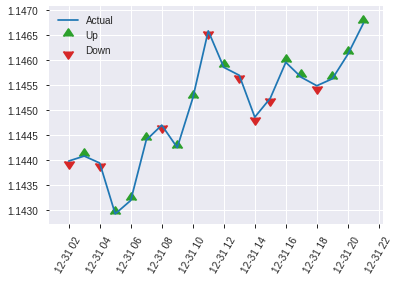


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.20832341988337139
RMSE: 0.4564246048181138
LogLoss: 0.6034122933579423
Null degrees of freedom: 616
Residual degrees of freedom: -336
Null deviance: 862.9188841257723
Residual deviance: 744.6107700037007
AIC: 2650.610770003701
AUC: 0.7739793020761028
pr_auc: 0.7663032957754645
Gini: 0.5479586041522055
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.26564153093167503: 


,0,1,Error,Rate
0,155.0,144.0,0.4816,(144.0/299.0)
1,40.0,278.0,0.1258,(40.0/318.0)
Total,195.0,422.0,0.2982,(184.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2656415,0.7513514,279.0
max f2,0.1660474,0.8561835,329.0
max f0point5,0.4177451,0.7186235,196.0
max accuracy,0.3274113,0.7131280,242.0
max precision,0.9824360,1.0,0.0
max recall,0.0375212,1.0,388.0
max specificity,0.9824360,1.0,0.0
max absolute_mcc,0.3235617,0.4280560,245.0
max min_per_class_accuracy,0.3902508,0.7044025,209.0
max mean_per_class_accuracy,0.3274113,0.7108075,242.0


Gains/Lift Table: Avg response rate: 51.54 %, avg score: 39.83 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.8714087,1.9402516,1.9402516,1.0,0.9145028,1.0,0.9145028,0.0220126,0.0220126,94.0251572,94.0251572
,2,0.0210697,0.8023132,1.6168763,1.7910015,0.8333333,0.8265004,0.9230769,0.8738863,0.0157233,0.0377358,61.6876310,79.1001451
,3,0.0307942,0.7852039,1.6168763,1.7360146,0.8333333,0.7926019,0.8947368,0.8482175,0.0157233,0.0534591,61.6876310,73.6014565
,4,0.0405186,0.7678395,1.6168763,1.7074214,0.8333333,0.7766208,0.88,0.8310343,0.0157233,0.0691824,61.6876310,70.7421384
,5,0.0502431,0.7554119,1.2935010,1.6273078,0.6666667,0.7627802,0.8387097,0.8178238,0.0125786,0.0817610,29.3501048,62.7307770
,6,0.1004862,0.6990920,1.8150741,1.7211909,0.9354839,0.7289735,0.8870968,0.7733987,0.0911950,0.1729560,81.5074052,72.1190911
,7,0.1507293,0.6364289,1.5647190,1.6690336,0.8064516,0.6642897,0.8602151,0.7370290,0.0786164,0.2515723,56.4719010,66.9033611
,8,0.2009724,0.5927674,1.6273078,1.6586022,0.8387097,0.6131680,0.8548387,0.7060638,0.0817610,0.3333333,62.7307770,65.8602151
,9,0.2998379,0.5246819,1.3359109,1.5522013,0.6885246,0.5627670,0.8,0.6588146,0.1320755,0.4654088,33.5910919,55.2201258
,10,0.4003241,0.4649279,1.0014202,1.4139485,0.5161290,0.4970085,0.7287449,0.6181993,0.1006289,0.5660377,0.1420166,41.3948514


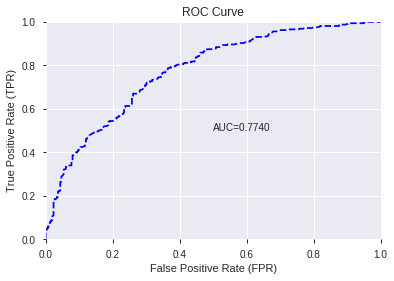

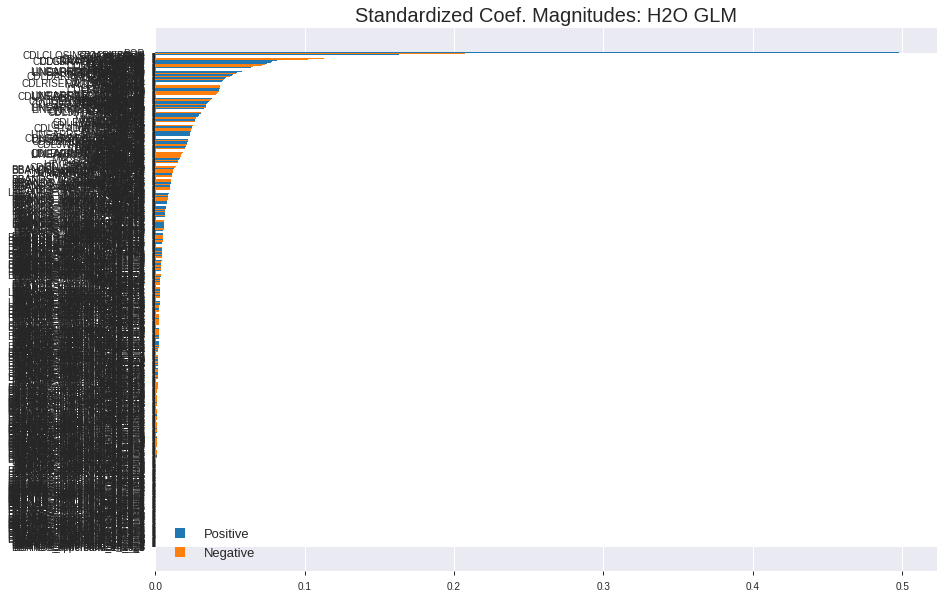

'log_likelihood'
--2019-12-08 07:38:57--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.162.171
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.162.171|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


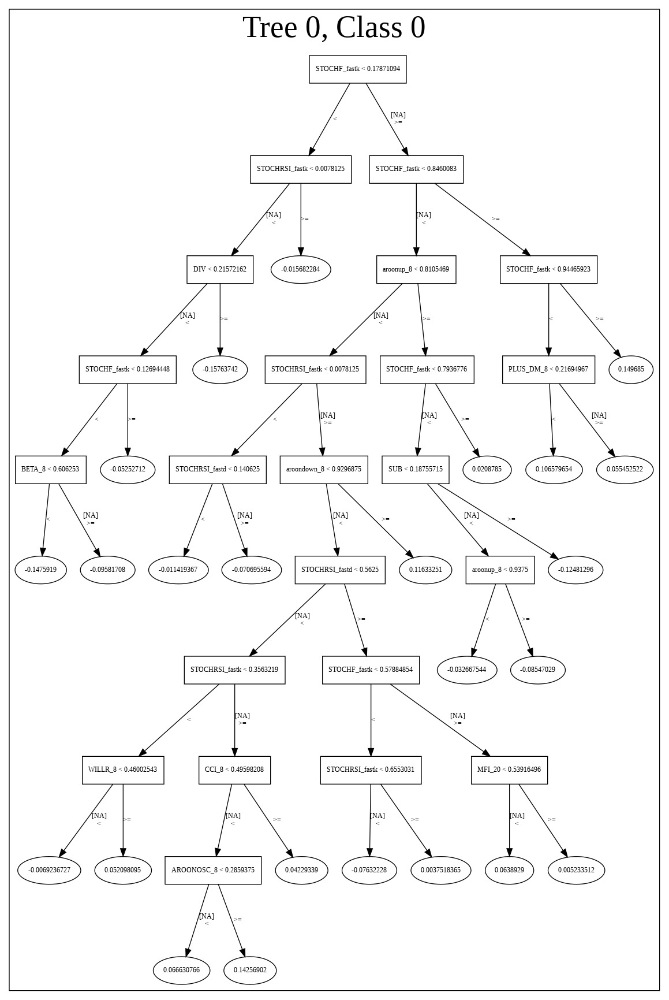

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191208_073726_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191208_073726_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_40_sid_afcd',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_40_s

['BOP',
 'STOCHF_fastk',
 'CCI_8',
 'WILLR_8',
 'CDLCLOSINGMARUBOZU',
 'STOCH_slowd',
 'PLUS_DI_8',
 'TRANGE',
 'ULTOSC',
 'SUB',
 'PLUS_DM_8',
 'DIV',
 'CDL3LINESTRIKE',
 'CDLHANGINGMAN',
 'MFI_20',
 'CDLDRAGONFLYDOJI',
 'CDLGRAVESTONEDOJI',
 'CORREL_30',
 'Volume',
 'CDLHAMMER',
 'CCI_30',
 'CDLHARAMI',
 'CCI_24',
 'CDLTHRUSTING',
 'CORREL_14',
 'CDLBELTHOLD',
 'BETA_8',
 'MFI_24',
 'CDLTAKURI',
 'WILLR_20',
 'aroondown_30',
 'STDDEV_30',
 'PLUS_DI_30',
 'LINEARREG_ANGLE_30',
 'LINEARREG_SLOPE_30',
 'ADX_24',
 'CDLHOMINGPIGEON',
 'WILLR_12',
 'CDLLONGLINE',
 'STOCHRSI_fastd',
 'CORREL_20',
 'WILLR_30',
 'CDLDOJI',
 'ADXR_12',
 'CDLDARKCLOUDCOVER',
 'AROONOSC_24',
 'CCI_12',
 'ADX_8',
 'DX_14',
 'aroonup_24']

952

['BOP',
 'STOCHF_fastk',
 'CCI_8',
 'WILLR_8',
 'CDLCLOSINGMARUBOZU',
 'STOCH_slowd',
 'PLUS_DI_8',
 'TRANGE',
 'ULTOSC',
 'SUB',
 'PLUS_DM_8',
 'DIV',
 'CDL3LINESTRIKE',
 'CDLHANGINGMAN',
 'MFI_20',
 'CDLDRAGONFLYDOJI',
 'CDLGRAVESTONEDOJI',
 'CORREL_30',
 'Volume',
 'CDLHAMMER',
 'CCI_30',
 'CDLHARAMI',
 'CCI_24',
 'CDLTHRUSTING',
 'CORREL_14',
 'CDLBELTHOLD',
 'BETA_8',
 'MFI_24',
 'CDLTAKURI',
 'WILLR_20',
 'aroondown_30',
 'STDDEV_30',
 'PLUS_DI_30',
 'LINEARREG_ANGLE_30',
 'LINEARREG_SLOPE_30',
 'ADX_24',
 'CDLHOMINGPIGEON',
 'WILLR_12',
 'CDLLONGLINE',
 'STOCHRSI_fastd',
 'CORREL_20',
 'WILLR_30',
 'CDLDOJI',
 'ADXR_12',
 'CDLDARKCLOUDCOVER',
 'AROONOSC_24',
 'CCI_12',
 'ADX_8',
 'DX_14',
 'aroonup_24']

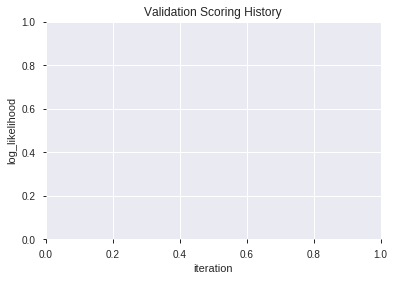

In [19]:
# GLM
features_list = model_train(feature_name='All',model_algo="GLM")
display(features_list[:model_selected_features])
display(len(features_list),features_list[:model_selected_features])

In [20]:
# DeepLearning with top GLM features
model_train(feature_name='GLMF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

[]

In [21]:
# GLM with top GLM features
model_train(feature_name='GLMF',model_algo="GLM",features_list = features_list[:model_selected_features])

[]

In [22]:
# XGBoost with top GLM features
model_train(feature_name='GLMF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

[]

In [23]:
# DRF with top GLM features
model_train(feature_name='GLMF',model_algo="DRF",features_list = features_list[:model_selected_features])

[]

In [24]:
# GBM with top GLM features
model_train(feature_name='GLMF',model_algo="GBM",features_list = features_list[:model_selected_features])

[]

In [25]:
# StackedEnsemble with top GLM features
model_train(feature_name='GLMF',model_algo="StackedEnsemble",features_list = features_list[:model_selected_features])

[]

In [26]:
# All algos with top GLM features
model_train(feature_name='GLMF',model_algo=None,features_list = features_list[:model_selected_features])

[]

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20191208_073954_model_2,0.789150,0.569792,0.286274,0.439005,0.192725
1,XGBoost_grid_1_AutoML_20191208_073954_model_4,0.788430,0.564812,0.298379,0.437132,0.191084
2,XGBoost_grid_1_AutoML_20191208_073954_model_7,0.782351,0.564791,0.319545,0.437816,0.191683
3,XGBoost_grid_1_AutoML_20191208_073954_model_3,0.776430,0.576617,0.287720,0.442489,0.195797
4,XGBoost_3_AutoML_20191208_073954,0.773474,0.580668,0.296407,0.444968,0.197997
5,XGBoost_grid_1_AutoML_20191208_073954_model_1,0.773106,0.583019,0.299452,0.445246,0.198244
6,XGBoost_2_AutoML_20191208_073954,0.772949,0.580824,0.298553,0.444802,0.197849
7,XGBoost_grid_1_AutoML_20191208_073954_model_6,0.772901,0.584133,0.309186,0.446639,0.199486
8,XGBoost_1_AutoML_20191208_073954,0.771813,0.575271,0.287547,0.442660,0.195948
9,XGBoost_grid_1_AutoML_20191208_073954_model_5,0.767853,0.595109,0.323563,0.450338,0.202805


,variable,relative_importance,scaled_importance,percentage
0,BOP,5847.206543,1.000000,0.303342
1,STOCHF_fastk,940.850708,0.160906,0.048810
2,hour,629.348999,0.107632,0.032649
3,DIV,417.020905,0.071320,0.021634
4,SUB,402.347595,0.068810,0.020873
...,...,...,...,...
339,BBANDS_lowerband_30_0_5,0.379710,0.000065,0.000020
340,BBANDS_upperband_24_0_2,0.287270,0.000049,0.000015
341,DEMA_8,0.258900,0.000044,0.000013
342,BBANDS_lowerband_12_1_3,0.228743,0.000039,0.000012


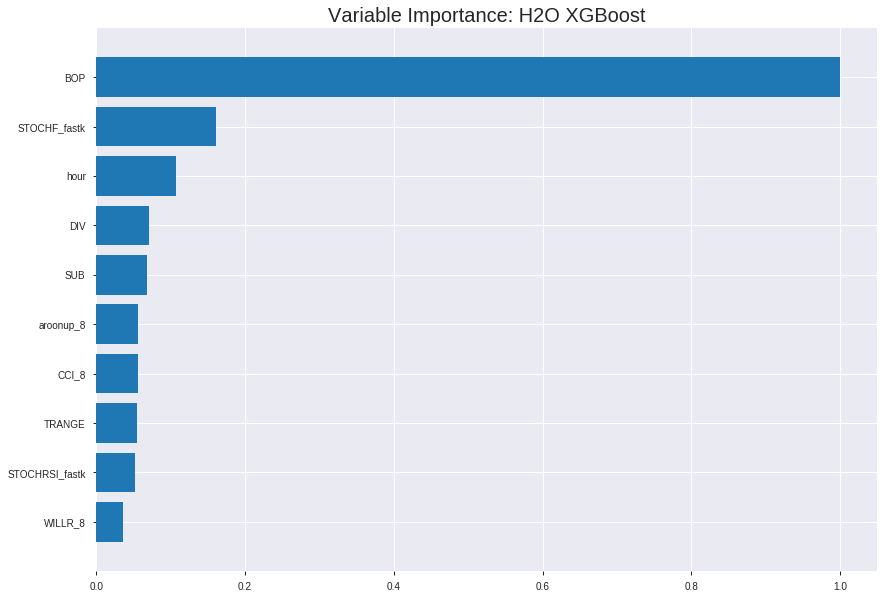

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20191208_073954_model_2


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.1525464387040614
RMSE: 0.390571937937253
LogLoss: 0.47541598087034376
Mean Per-Class Error: 0.2107103814751674
AUC: 0.8825733214872353
pr_auc: 0.8739710428141886
Gini: 0.7651466429744707
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4847121834754944: 


,0,1,Error,Rate
0,1793.0,548.0,0.2341,(548.0/2341.0)
1,372.0,1606.0,0.1881,(372.0/1978.0)
Total,2165.0,2154.0,0.213,(920.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4847122,0.7773475,195.0
max f2,0.2562550,0.8637993,303.0
max f0point5,0.5938370,0.8085382,140.0
max accuracy,0.5581339,0.7950915,157.0
max precision,0.9092791,1.0,0.0
max recall,0.1193003,1.0,373.0
max specificity,0.9092791,1.0,0.0
max absolute_mcc,0.5665583,0.5890503,153.0
max min_per_class_accuracy,0.4998954,0.7872704,188.0
max mean_per_class_accuracy,0.5034223,0.7892896,186.0


Gains/Lift Table: Avg response rate: 45.80 %, avg score: 45.85 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.8519262,2.1835187,2.1835187,1.0,0.8700405,1.0,0.8700405,0.0222447,0.0222447,118.3518706,118.3518706
,2,0.0201436,0.8353980,2.1835187,2.1835187,1.0,0.8430654,1.0,0.8567080,0.0217391,0.0439838,118.3518706,118.3518706
,3,0.0300996,0.8189364,2.1835187,2.1835187,1.0,0.8275681,1.0,0.8470694,0.0217391,0.0657230,118.3518706,118.3518706
,4,0.0400556,0.8031903,2.1835187,2.1835187,1.0,0.8106125,1.0,0.8380079,0.0217391,0.0874621,118.3518706,118.3518706
,5,0.0500116,0.7922121,2.1327392,2.1734098,0.9767442,0.7971395,0.9953704,0.8298721,0.0212336,0.1086957,113.2739201,117.3409823
,6,0.1000232,0.7460021,2.1531921,2.1633009,0.9861111,0.7689712,0.9907407,0.7994216,0.1076845,0.2163802,115.3192057,116.3300940
,7,0.1500347,0.7130867,2.0116677,2.1127565,0.9212963,0.7301409,0.9675926,0.7763280,0.1006067,0.3169869,101.1667697,111.2756525
,8,0.2000463,0.6755436,1.9712322,2.0773754,0.9027778,0.6943921,0.9513889,0.7558441,0.0985844,0.4155713,97.1232165,107.7375435
,9,0.3000695,0.6140123,1.6780746,1.9442751,0.7685185,0.6441492,0.8904321,0.7186124,0.1678463,0.5834176,67.8074561,94.4275144
,10,0.4000926,0.5475964,1.2686648,1.7753726,0.5810185,0.5807745,0.8130787,0.6841529,0.1268959,0.7103134,26.8664804,77.5372559




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.1922961118328807
RMSE: 0.4385158056819397
LogLoss: 0.5667701149787032
Mean Per-Class Error: 0.28532349923105127
AUC: 0.7794910957585158
pr_auc: 0.7512860087464759
Gini: 0.5589821915170317
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.433460533618927: 


,0,1,Error,Rate
0,421.0,236.0,0.3592,(236.0/657.0)
1,122.0,455.0,0.2114,(122.0/577.0)
Total,543.0,691.0,0.2901,(358.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4334605,0.7176656,218.0
max f2,0.2116352,0.8348375,329.0
max f0point5,0.5068159,0.6924429,178.0
max accuracy,0.5068159,0.7115073,178.0
max precision,0.8799691,1.0,0.0
max recall,0.0820369,1.0,397.0
max specificity,0.8799691,1.0,0.0
max absolute_mcc,0.4334605,0.4315649,218.0
max min_per_class_accuracy,0.4835315,0.7077626,190.0
max mean_per_class_accuracy,0.4334605,0.7146765,218.0


Gains/Lift Table: Avg response rate: 46.76 %, avg score: 45.56 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.8352712,2.1386482,2.1386482,1.0,0.8558787,1.0,0.8558787,0.0225303,0.0225303,113.8648180,113.8648180
,2,0.0202593,0.8100407,2.1386482,2.1386482,1.0,0.8230693,1.0,0.8401302,0.0207972,0.0433276,113.8648180,113.8648180
,3,0.0299838,0.7909969,1.6039861,1.9652443,0.75,0.8001640,0.9189189,0.8271682,0.0155979,0.0589255,60.3986135,96.5244274
,4,0.0405186,0.7734023,1.6451140,1.8820104,0.7692308,0.7816813,0.88,0.8153416,0.0173310,0.0762565,64.5113985,88.2010399
,5,0.0502431,0.7552458,2.1386482,1.9316822,1.0,0.7665271,0.9032258,0.8058936,0.0207972,0.0970537,113.8648180,93.1682227
,6,0.1004862,0.7113657,1.8971879,1.9144351,0.8870968,0.7330319,0.8951613,0.7694627,0.0953206,0.1923744,89.7187902,91.4435065
,7,0.1499190,0.6815758,1.6127511,1.8149609,0.7540984,0.6949712,0.8486486,0.7449007,0.0797227,0.2720971,61.2751087,81.4960888
,8,0.2001621,0.6554566,1.5522446,1.7490159,0.7258065,0.6680892,0.8178138,0.7256200,0.0779896,0.3500867,55.2244647,74.9015921
,9,0.2998379,0.6048644,1.3040538,1.6010961,0.6097561,0.6302446,0.7486486,0.6939142,0.1299827,0.4800693,30.4053768,60.1096070
,10,0.4003241,0.5485140,1.2935372,1.5238951,0.6048387,0.5760694,0.7125506,0.6643337,0.1299827,0.6100520,29.3537206,52.3895060



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 07:40:26,4.367 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5420236,0.5,0.6931472,0.5,0.0,1.0,0.5324149
,2019-12-08 07:40:27,5.205 sec,5.0,0.4789440,0.6517306,0.7920332,0.7079099,2.0209162,0.2850197,0.4822096,0.6580353,0.7557025,0.6763551,1.9135273,0.3152350
,2019-12-08 07:40:27,5.436 sec,10.0,0.4634390,0.6216554,0.8018582,0.7502240,2.0470488,0.2822413,0.4705329,0.6351081,0.7582349,0.7054593,1.9741368,0.3184765
,2019-12-08 07:40:27,5.678 sec,15.0,0.4520667,0.5993964,0.8092326,0.7717296,2.0379508,0.2942811,0.4625292,0.6191407,0.7621007,0.7177217,1.9741368,0.3257699
,2019-12-08 07:40:27,5.913 sec,20.0,0.4431330,0.5816349,0.8147999,0.7821909,2.1835187,0.2933549,0.4562476,0.6064610,0.7662923,0.7253698,1.9741368,0.3119935
,2019-12-08 07:40:28,6.167 sec,25.0,0.4359504,0.5671144,0.8201013,0.7915874,2.1835187,0.2688122,0.4515362,0.5965987,0.7691096,0.7305284,1.9741368,0.3160454
,2019-12-08 07:40:28,6.410 sec,30.0,0.4302402,0.5553292,0.8265014,0.8012301,2.1835187,0.2671915,0.4489039,0.5907755,0.7703217,0.7345828,1.9741368,0.3103728
,2019-12-08 07:40:28,6.652 sec,35.0,0.4253464,0.5450283,0.8315994,0.8081912,2.1835187,0.2771475,0.4466287,0.5856850,0.7717343,0.7374079,1.9741368,0.3079417
,2019-12-08 07:40:28,6.952 sec,40.0,0.4206033,0.5351353,0.8377271,0.8169960,2.1835187,0.2637185,0.4444383,0.5808275,0.7737273,0.7418162,2.1386482,0.3022690
,2019-12-08 07:40:29,7.218 sec,45.0,0.4163765,0.5263136,0.8440136,0.8267159,2.1835187,0.2593193,0.4433625,0.5782238,0.7743485,0.7443847,2.1386482,0.2982172


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,5847.2065430,1.0,0.3033424
STOCHF_fastk,940.8507080,0.1609060,0.0488096
hour,629.3489990,0.1076324,0.0326495
DIV,417.0209045,0.0713197,0.0216343
SUB,402.3475952,0.0688102,0.0208731
---,---,---,---
BBANDS_lowerband_30_0_5,0.3797101,0.0000649,0.0000197
BBANDS_upperband_24_0_2,0.2872695,0.0000491,0.0000149
DEMA_8,0.2589004,0.0000443,0.0000134
BBANDS_lowerband_12_1_3,0.2287428,0.0000391,0.0000119



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7260940032414911)

('F1', 0.7569832402234637)

('auc', 0.7891504175343388)

('logloss', 0.569792365499974)

('mean_per_class_error', 0.27471550871879)

('rmse', 0.4390049745557405)

('mse', 0.19272536768468634)

xgboost prediction progress: |████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
6165        0
6166        0
6167        1
6168        1
6169        1

[6170 rows x 1 columns]


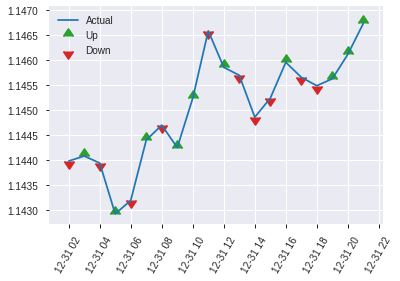


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.19272536768468634
RMSE: 0.4390049745557405
LogLoss: 0.569792365499974
Mean Per-Class Error: 0.27471550871879
AUC: 0.7891504175343388
pr_auc: 0.7777141058611626
Gini: 0.5783008350686776
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3721272945404053: 


,0,1,Error,Rate
0,172.0,127.0,0.4247,(127.0/299.0)
1,47.0,271.0,0.1478,(47.0/318.0)
Total,219.0,398.0,0.282,(174.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3721273,0.7569832,248.0
max f2,0.1679288,0.8584750,348.0
max f0point5,0.5609023,0.7380216,150.0
max accuracy,0.4703815,0.7260940,204.0
max precision,0.8702205,1.0,0.0
max recall,0.0802587,1.0,394.0
max specificity,0.8702205,1.0,0.0
max absolute_mcc,0.4213659,0.4544466,226.0
max min_per_class_accuracy,0.4873112,0.7157191,195.0
max mean_per_class_accuracy,0.4703815,0.7252845,204.0


Gains/Lift Table: Avg response rate: 51.54 %, avg score: 45.79 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.8257888,1.6630728,1.6630728,0.8571429,0.8417504,0.8571429,0.8417504,0.0188679,0.0188679,66.3072776,66.3072776
,2,0.0210697,0.7972520,1.9402516,1.7910015,1.0,0.8064769,0.9230769,0.8254704,0.0188679,0.0377358,94.0251572,79.1001451
,3,0.0307942,0.7795783,1.2935010,1.6338961,0.6666667,0.7896171,0.8421053,0.8141483,0.0125786,0.0503145,29.3501048,63.3896061
,4,0.0405186,0.7608334,1.9402516,1.7074214,1.0,0.7694095,0.88,0.8034110,0.0188679,0.0691824,94.0251572,70.7421384
,5,0.0502431,0.7484539,1.9402516,1.7524853,1.0,0.7560667,0.9032258,0.7942475,0.0188679,0.0880503,94.0251572,75.2485291
,6,0.1004862,0.7083575,1.6898965,1.7211909,0.8709677,0.7271827,0.8870968,0.7607151,0.0849057,0.1729560,68.9896531,72.1190911
,7,0.1507293,0.6741318,1.5647190,1.6690336,0.8064516,0.6928001,0.8602151,0.7380768,0.0786164,0.2515723,56.4719010,66.9033611
,8,0.2009724,0.6523729,1.5647190,1.6429550,0.8064516,0.6632734,0.8467742,0.7193759,0.0786164,0.3301887,56.4719010,64.2954960
,9,0.2998379,0.6017150,1.4313331,1.5731770,0.7377049,0.6256891,0.8108108,0.6884846,0.1415094,0.4716981,43.1333127,57.3176951
,10,0.4003241,0.5568408,1.3143640,1.5082117,0.6774194,0.5808555,0.7773279,0.6614684,0.1320755,0.6037736,31.4363968,50.8211749


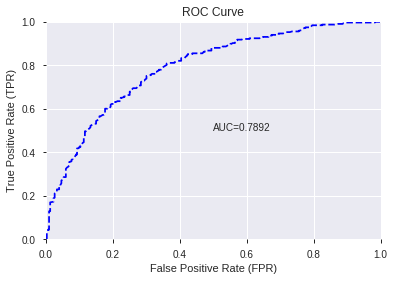

This function is available for GLM models only


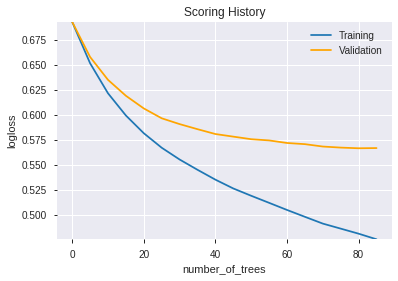

--2019-12-08 07:41:22--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.106.116
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.106.116|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at hex.genmodel.algos.tree.SharedTreeNode.findInclusiveNa(SharedTreeNode.java:129)
	at hex.genmodel.algos.tree.SharedTreeNode.findInclusiveNa(SharedTreeNode.java:129)
	at hex.genmodel.algos.tree.SharedTreeNode.findInclusiveNa(SharedTreeNode.java:129)
	at hex.genmodel.algos.tree.SharedTreeNode.findInclusiveNa(SharedTreeNode.java:129)
	at hex.genmodel.algos.tree.SharedTreeNode.calculateChildInclusiveNa(SharedTreeNode.java:133)
	at hex.genmodel.algos.tree.SharedTreeNode.setLeftChild(Shared

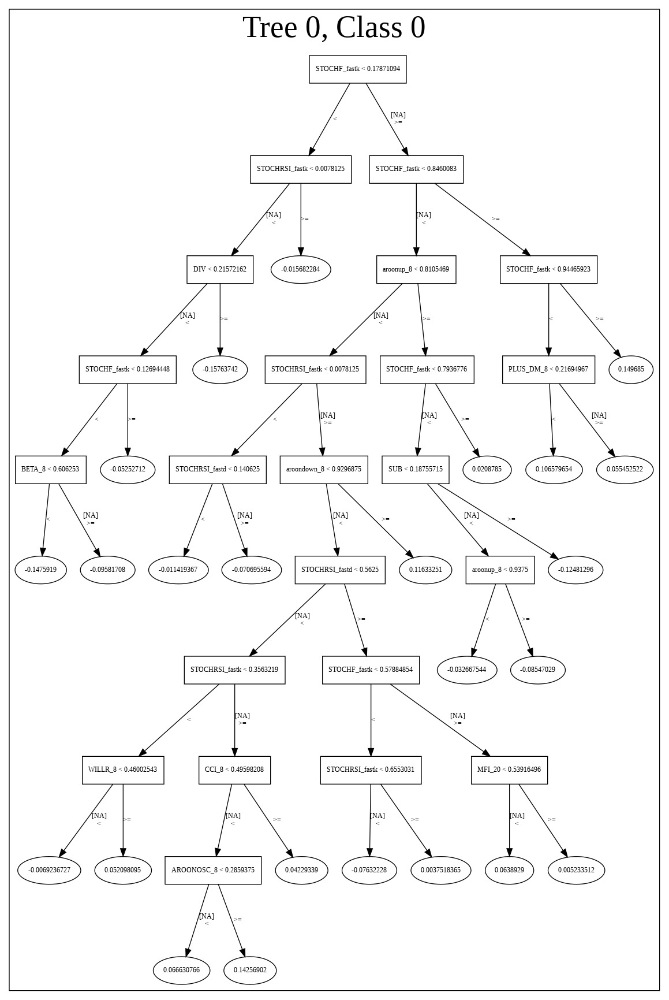

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20191208_073954_model_2',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20191208_073954_model_2',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_45_sid_afcd',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

344

['BOP',
 'STOCHF_fastk',
 'hour',
 'DIV',
 'SUB',
 'aroonup_8',
 'CCI_8',
 'TRANGE',
 'STOCHRSI_fastk',
 'WILLR_8',
 'ULTOSC',
 'ADOSC',
 'CDLCLOSINGMARUBOZU',
 'STOCHRSI_fastd',
 'Volume',
 'CDLDRAGONFLYDOJI',
 'HT_PHASOR_inphase',
 'BETA_8',
 'HT_DCPERIOD',
 'CCI_14',
 'WILLR_24',
 'MINUS_DI_14',
 'DX_8',
 'MFI_8',
 'MINUS_DI_8',
 'BETA_14',
 'CDLGRAVESTONEDOJI',
 'BETA_12',
 'STDDEV_14',
 'STDDEV_30',
 'CDLHAMMER',
 'STDDEV_8',
 'ADX_8',
 'MOM_8',
 'MFI_24',
 'CDLTAKURI',
 'MOM_24',
 'AROONOSC_30',
 'BETA_30',
 'MFI_12',
 'WILLR_12',
 'MFI_20',
 'CDLBELTHOLD',
 'DX_20',
 'dayofweek',
 'MFI_30',
 'STDDEV_20',
 'BETA_24',
 'aroonup_12',
 'ADXR_8']

In [27]:
# XGBoost
features_list = model_train(feature_name='All',model_algo="XGBoost")
display(len(features_list),features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20191208_074219_model_6,0.779154,0.578972,0.310884,0.444032,0.197165
1,DeepLearning_grid_1_AutoML_20191208_074219_model_9,0.776861,0.575580,0.288719,0.441731,0.195126
2,DeepLearning_grid_1_AutoML_20191208_074219_model_8,0.776325,0.581947,0.295408,0.445107,0.198121
3,DeepLearning_grid_1_AutoML_20191208_074219_model_5,0.770072,0.578135,0.329379,0.443302,0.196517
4,DeepLearning_1_AutoML_20191208_074219,0.769667,0.578792,0.351817,0.443841,0.196995
5,DeepLearning_grid_1_AutoML_20191208_074219_model_7,0.762274,0.621395,0.288893,0.461926,0.213375
6,DeepLearning_grid_1_AutoML_20191208_074219_model_3,0.751146,0.641343,0.348873,0.463746,0.215061
7,DeepLearning_grid_1_AutoML_20191208_074219_model_4,0.718017,0.678501,0.383390,0.475895,0.226476
8,DeepLearning_grid_1_AutoML_20191208_074219_model_1,0.715982,0.804865,0.369712,0.498457,0.248459
9,DeepLearning_grid_1_AutoML_20191208_074219_model_2,0.710397,0.792467,0.393623,0.494111,0.244146


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.064800
1,CDLCLOSINGMARUBOZU,0.870577,0.870577,0.056414
2,CCI_8,0.401667,0.401667,0.026028
3,TRANGE,0.395226,0.395226,0.025611
4,CDLBELTHOLD,0.393634,0.393634,0.025508
5,STOCHF_fastk,0.373213,0.373213,0.024184
6,STOCHRSI_fastk,0.370868,0.370868,0.024032
7,SUB,0.365651,0.365651,0.023694
8,DIV,0.359367,0.359367,0.023287
9,WILLR_8,0.352091,0.352091,0.022816


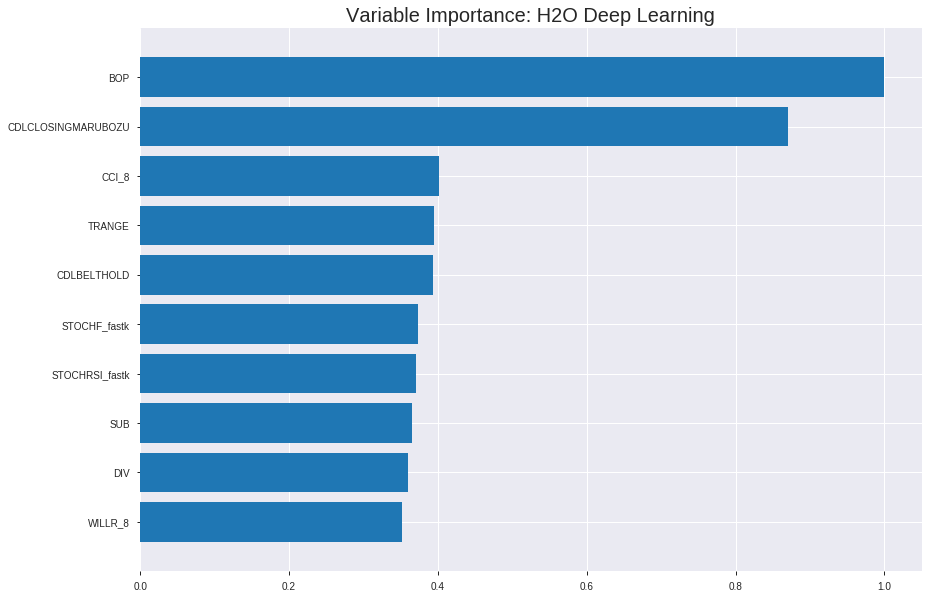

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20191208_074219_model_6


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.19117056779555278
RMSE: 0.4372305659438196
LogLoss: 0.5645395432118419
Mean Per-Class Error: 0.2899803649629047
AUC: 0.7801363913773421
pr_auc: 0.7380138043475206
Gini: 0.5602727827546843
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.30442551361300557: 


,0,1,Error,Rate
0,1275.0,1066.0,0.4554,(1066.0/2341.0)
1,304.0,1674.0,0.1537,(304.0/1978.0)
Total,1579.0,2740.0,0.3172,(1370.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3044255,0.7096227,261.0
max f2,0.1137279,0.8232829,349.0
max f0point5,0.5010815,0.6916039,176.0
max accuracy,0.5010815,0.7138226,176.0
max precision,0.9666095,1.0,0.0
max recall,0.0339730,1.0,389.0
max specificity,0.9666095,1.0,0.0
max absolute_mcc,0.5010815,0.4212085,176.0
max min_per_class_accuracy,0.4385270,0.7087968,203.0
max mean_per_class_accuracy,0.4318333,0.7100196,206.0


Gains/Lift Table: Avg response rate: 45.80 %, avg score: 43.25 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.9261210,1.9353916,1.9353916,0.8863636,0.9382956,0.8863636,0.9382956,0.0197169,0.0197169,93.5391580,93.5391580
,2,0.0201436,0.9153286,1.9296212,1.9325395,0.8837209,0.9207549,0.8850575,0.9296260,0.0192113,0.0389282,92.9621182,93.2539544
,3,0.0300996,0.9031545,1.9296212,1.9315742,0.8837209,0.9092240,0.8846154,0.9228777,0.0192113,0.0581395,92.9621182,93.1574240
,4,0.0400556,0.8901523,2.0819597,1.9689533,0.9534884,0.8977097,0.9017341,0.9166220,0.0207280,0.0788675,108.1959696,96.8953284
,5,0.0500116,0.8801260,1.8280622,1.9409055,0.8372093,0.8846067,0.8888889,0.9102486,0.0182002,0.0970677,82.8062172,94.0905516
,6,0.1000232,0.7726198,1.7791634,1.8600345,0.8148148,0.8298241,0.8518519,0.8700364,0.0889788,0.1860465,77.9163390,86.0034453
,7,0.1500347,0.7137369,1.6679657,1.7960115,0.7638889,0.7420377,0.8225309,0.8273702,0.0834176,0.2694641,66.7965678,79.6011528
,8,0.2000463,0.6708406,1.6679657,1.7640001,0.7638889,0.6908973,0.8078704,0.7932519,0.0834176,0.3528817,66.7965678,76.4000066
,9,0.3000695,0.5986907,1.4405158,1.6561720,0.6597222,0.6359645,0.7584877,0.7408228,0.1440849,0.4969666,44.0515813,65.6171981
,10,0.4000926,0.5219339,1.2130659,1.5453955,0.5555556,0.5618783,0.7077546,0.6960867,0.1213347,0.6183013,21.3065948,54.5395473




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.19803668591965956
RMSE: 0.44501313005310256
LogLoss: 0.5790926470254919
Mean Per-Class Error: 0.3023920504156017
AUC: 0.7654271160598171
pr_auc: 0.7198999804600122
Gini: 0.5308542321196341
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2726140728537006: 


,0,1,Error,Rate
0,321.0,336.0,0.5114,(336.0/657.0)
1,72.0,505.0,0.1248,(72.0/577.0)
Total,393.0,841.0,0.3306,(408.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2726141,0.7122708,280.0
max f2,0.1750414,0.8363418,331.0
max f0point5,0.4803770,0.6815723,186.0
max accuracy,0.4803770,0.7001621,186.0
max precision,0.9573892,1.0,0.0
max recall,0.0506097,1.0,388.0
max specificity,0.9573892,1.0,0.0
max absolute_mcc,0.4803770,0.3964230,186.0
max min_per_class_accuracy,0.4383805,0.6940639,204.0
max mean_per_class_accuracy,0.4676594,0.6976079,192.0


Gains/Lift Table: Avg response rate: 46.76 %, avg score: 43.69 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.9228694,1.9741368,1.9741368,0.9230769,0.9362247,0.9230769,0.9362247,0.0207972,0.0207972,97.4136782,97.4136782
,2,0.0202593,0.9152363,1.6039861,1.7964645,0.75,0.9181850,0.84,0.9275656,0.0155979,0.0363951,60.3986135,79.6464471
,3,0.0299838,0.9065140,1.7822068,1.7918404,0.8333333,0.9095151,0.8378378,0.9217114,0.0173310,0.0537262,78.2206817,79.1840367
,4,0.0405186,0.8949660,1.6451140,1.7536915,0.7692308,0.8995220,0.82,0.9159422,0.0173310,0.0710572,64.5113985,75.3691508
,5,0.0502431,0.8788582,1.9604275,1.7937049,0.9166667,0.8873744,0.8387097,0.9104129,0.0190641,0.0901213,96.0427499,79.3704925
,6,0.1004862,0.7479445,1.8626936,1.8281993,0.8709677,0.8154680,0.8548387,0.8629405,0.0935875,0.1837088,86.2693576,82.8199251
,7,0.1499190,0.7037798,1.5426315,1.7340391,0.7213115,0.7257017,0.8108108,0.8176888,0.0762565,0.2599653,54.2631474,73.4039065
,8,0.2001621,0.6689472,1.3797730,1.6451140,0.6451613,0.6868966,0.7692308,0.7848584,0.0693241,0.3292894,37.9773020,64.5113985
,9,0.2998379,0.6015593,1.4083781,1.5664153,0.6585366,0.6355322,0.7324324,0.7352175,0.1403813,0.4696707,40.8378070,56.6415289
,10,0.4003241,0.5204066,1.2417957,1.4849318,0.5806452,0.5662763,0.6943320,0.6928112,0.1247834,0.5944541,24.1795718,48.4931834



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 07:46:23,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-12-08 07:46:28,2 min 8.034 sec,3392 obs/sec,3.3134985,1,14311.0,0.4533130,0.5963362,0.1721818,0.7392905,0.6890419,1.9353916,0.3850428,0.4576890,0.6056211,0.1585464,0.7298484,0.6780303,1.8096254,0.3403566
,2019-12-08 07:46:35,2 min 15.699 sec,5132 obs/sec,13.3040056,4,57460.0,0.4419281,0.5728276,0.2132405,0.7709553,0.7248030,1.8857662,0.3285483,0.4488300,0.5879391,0.1908057,0.7610376,0.7089795,1.8096254,0.3184765
,2019-12-08 07:46:42,2 min 22.814 sec,5693 obs/sec,23.2558463,7,100442.0,0.4372306,0.5645395,0.2298776,0.7801364,0.7380138,1.9353916,0.3172031,0.4450131,0.5790926,0.2045099,0.7654271,0.7199000,1.9741368,0.3306321
,2019-12-08 07:46:49,2 min 29.595 sec,6043 obs/sec,33.2403334,10,143565.0,0.4324099,0.5534508,0.2467658,0.7901077,0.7488229,2.0346424,0.2996064,0.4503255,0.5916724,0.1854042,0.7555020,0.7027129,1.8096254,0.3192869
,2019-12-08 07:46:57,2 min 37.544 sec,6019 obs/sec,43.2438064,13,186770.0,0.4282903,0.5449258,0.2610498,0.7973785,0.7583796,2.0346424,0.3030794,0.4535361,0.5998276,0.1737474,0.7466637,0.6990411,1.9741368,0.3282010
,2019-12-08 07:47:06,2 min 45.972 sec,6296 obs/sec,56.5380875,17,244188.0,0.4247226,0.5358273,0.2733095,0.8086579,0.7731218,2.1338933,0.2824728,0.4548765,0.5993874,0.1688564,0.7475461,0.6991389,2.1386482,0.3233387
,2019-12-08 07:47:06,2 min 46.654 sec,6293 obs/sec,56.5380875,17,244188.0,0.4372306,0.5645395,0.2298776,0.7801364,0.7380138,1.9353916,0.3172031,0.4450131,0.5790926,0.2045099,0.7654271,0.7199000,1.9741368,0.3306321


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0648001
CDLCLOSINGMARUBOZU,0.8705775,0.8705775,0.0564135
CCI_8,0.4016668,0.4016668,0.0260280
TRANGE,0.3952260,0.3952260,0.0256107
CDLBELTHOLD,0.3936339,0.3936339,0.0255075
---,---,---,---
MOM_24,0.2214299,0.2214299,0.0143487
MOM_8,0.2210160,0.2210160,0.0143219
BETA_30,0.2176687,0.2176687,0.0141050
BETA_24,0.2140932,0.2140932,0.0138733



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7212317666126418)

('F1', 0.7506631299734748)

('auc', 0.7791537830504196)

('logloss', 0.578971554213244)

('mean_per_class_error', 0.2805315411960203)

('rmse', 0.4440322060446478)

('mse', 0.1971646000048766)

deeplearning prediction progress: |███████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
6165        1
6166        0
6167        1
6168        1
6169        1

[6170 rows x 1 columns]


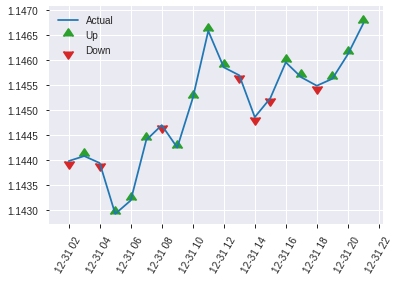


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.1971646000048766
RMSE: 0.4440322060446478
LogLoss: 0.578971554213244
Mean Per-Class Error: 0.2805315411960203
AUC: 0.7791537830504196
pr_auc: 0.7602014011591238
Gini: 0.5583075661008392
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2713280477759568: 


,0,1,Error,Rate
0,146.0,153.0,0.5117,(153.0/299.0)
1,35.0,283.0,0.1101,(35.0/318.0)
Total,181.0,436.0,0.3047,(188.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2713280,0.7506631,282.0
max f2,0.1268488,0.8548653,353.0
max f0point5,0.5017698,0.7247438,178.0
max accuracy,0.3848042,0.7212318,227.0
max precision,0.9367071,1.0,0.0
max recall,0.0515004,1.0,386.0
max specificity,0.9367071,1.0,0.0
max absolute_mcc,0.3829335,0.4425515,228.0
max min_per_class_accuracy,0.4450910,0.6989967,203.0
max mean_per_class_accuracy,0.3848042,0.7194685,227.0


Gains/Lift Table: Avg response rate: 51.54 %, avg score: 44.50 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.9200301,1.6630728,1.6630728,0.8571429,0.9283851,0.8571429,0.9283851,0.0188679,0.0188679,66.3072776,66.3072776
,2,0.0210697,0.9129395,1.6168763,1.6417513,0.8333333,0.9160043,0.8461538,0.9226708,0.0157233,0.0345912,61.6876310,64.1751330
,3,0.0307942,0.9041086,1.2935010,1.5317776,0.6666667,0.9088804,0.7894737,0.9183160,0.0125786,0.0471698,29.3501048,53.1777557
,4,0.0405186,0.8924396,1.9402516,1.6298113,1.0,0.8981514,0.84,0.9134765,0.0188679,0.0660377,94.0251572,62.9811321
,5,0.0502431,0.8735101,1.6168763,1.6273078,0.8333333,0.8815510,0.8387097,0.9072974,0.0157233,0.0817610,61.6876310,62.7307770
,6,0.1004862,0.7785909,1.8150741,1.7211909,0.9354839,0.8302604,0.8870968,0.8687789,0.0911950,0.1729560,81.5074052,72.1190911
,7,0.1507293,0.7015049,1.4395415,1.6273078,0.7419355,0.7376228,0.8387097,0.8250602,0.0723270,0.2452830,43.9541489,62.7307770
,8,0.2009724,0.6740210,1.5021302,1.5960134,0.7741935,0.6858016,0.8225806,0.7902455,0.0754717,0.3207547,50.2130250,59.6013390
,9,0.2998379,0.6035020,1.4631405,1.5522013,0.7540984,0.6367014,0.8,0.7396175,0.1446541,0.4654088,46.3140530,55.2201258
,10,0.4003241,0.5268939,1.2517752,1.4767907,0.6451613,0.5653419,0.7611336,0.6958722,0.1257862,0.5911950,25.1775208,47.6790670


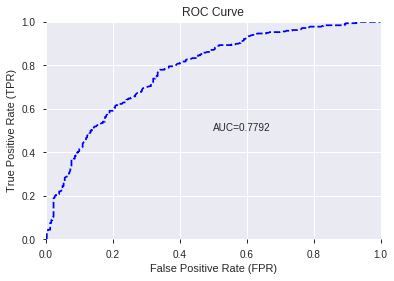

This function is available for GLM models only


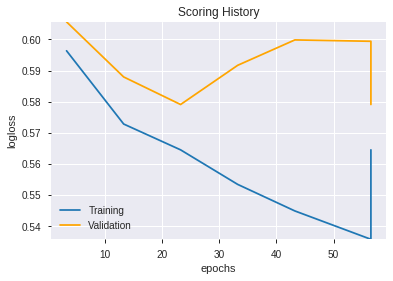

--2019-12-08 07:51:30--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.38.164
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.38.164|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


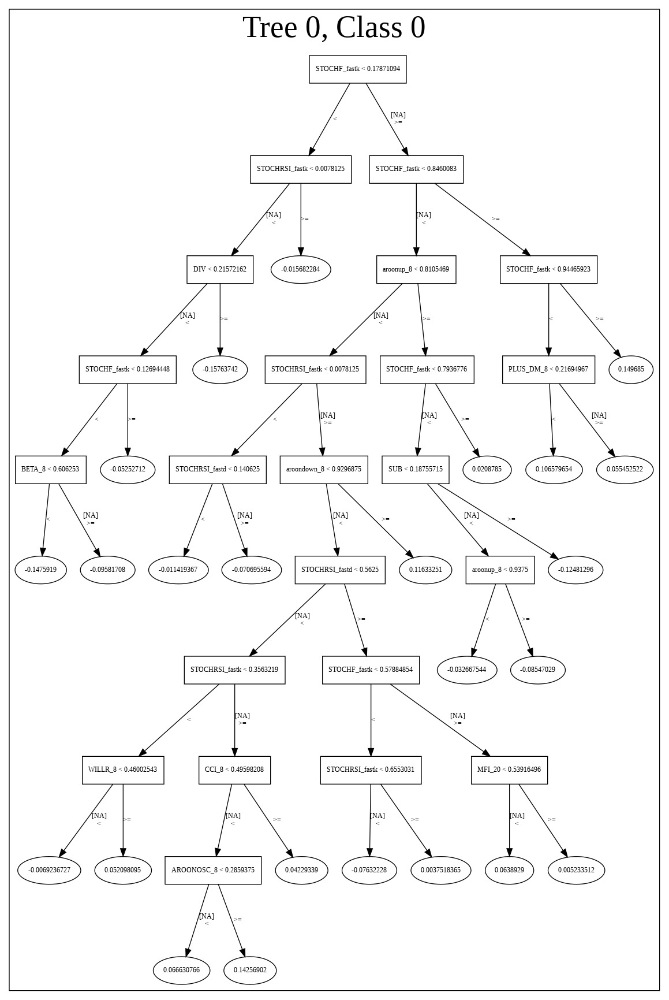

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20191208_074219_model_6',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20191208_074219_model_6',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_50_sid_afcd',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['BOP',
 'CDLCLOSINGMARUBOZU',
 'CCI_8',
 'TRANGE',
 'CDLBELTHOLD',
 'STOCHF_fastk',
 'STOCHRSI_fastk',
 'SUB',
 'DIV',
 'WILLR_8',
 'CDLDRAGONFLYDOJI',
 'CDLTAKURI',
 'CDLGRAVESTONEDOJI',
 'STDDEV_20',
 'MINUS_DI_8',
 'STDDEV_30',
 'STOCHRSI_fastd',
 'ULTOSC',
 'dayofweek',
 'aroonup_12',
 'hour',
 'WILLR_24',
 'DX_8',
 'CCI_14',
 'WILLR_12',
 'CDLHAMMER',
 'STDDEV_14',
 'HT_PHASOR_inphase',
 'MFI_8',
 'BETA_8',
 'HT_DCPERIOD',
 'aroonup_8',
 'ADOSC',
 'MFI_12',
 'MINUS_DI_14',
 'ADXR_8',
 'Volume',
 'MFI_20',
 'ADX_8',
 'DX_20',
 'AROONOSC_30',
 'BETA_12',
 'MFI_24',
 'STDDEV_8',
 'MFI_30',
 'MOM_24',
 'MOM_8',
 'BETA_30',
 'BETA_24',
 'BETA_14']

In [28]:
# DeepLearning with top XGBoost features
model_train(feature_name='XGBF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191208_075227_model_1,0.774432,0.574927,0.300625,0.441776,0.195166


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.739630,1.000000,0.155109
1,CCI_8,0.393646,0.532219,0.082552
2,STOCHF_fastk,0.324117,0.438215,0.067971
3,WILLR_8,0.264554,0.357684,0.055480
4,STDDEV_30,0.210997,0.285273,0.044248
5,CDLCLOSINGMARUBOZU,0.147900,0.199965,0.031016
6,STOCHRSI_fastd,0.139865,0.189102,0.029331
7,CDLDRAGONFLYDOJI,0.136132,0.184055,0.028549
8,MINUS_DI_8,0.134551,0.181916,0.028217
9,TRANGE,0.133387,0.180343,0.027973


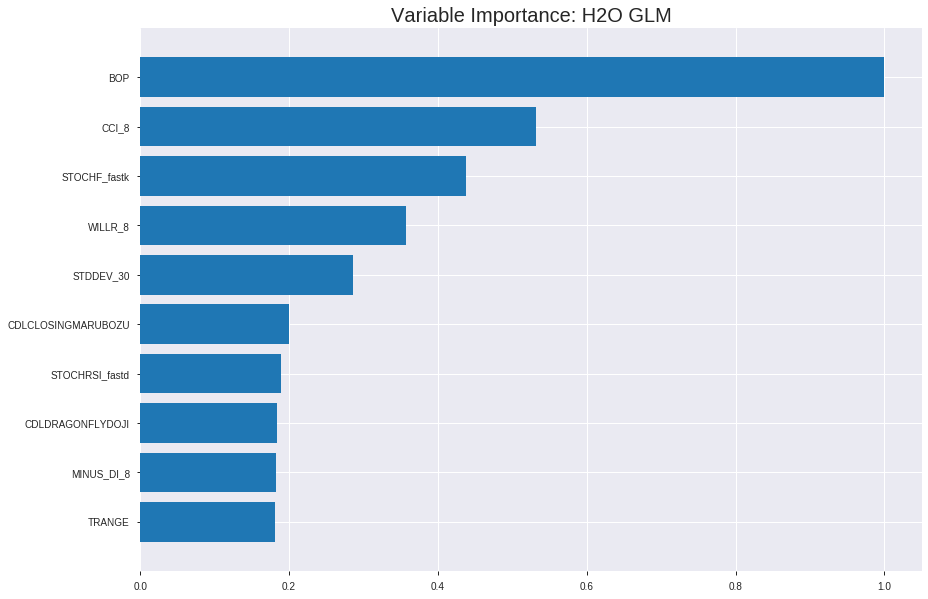

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191208_075227_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.19415751711509222
RMSE: 0.44063308672306056
LogLoss: 0.5709665345390349
Null degrees of freedom: 4318
Residual degrees of freedom: 4268
Null deviance: 5956.860179047515
Residual deviance: 4932.008925348184
AIC: 5034.008925348184
AUC: 0.770323839897998
pr_auc: 0.7248731214909788
Gini: 0.540647679795996
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.36602157790840384: 


,0,1,Error,Rate
0,1324.0,1017.0,0.4344,(1017.0/2341.0)
1,334.0,1644.0,0.1689,(334.0/1978.0)
Total,1658.0,2661.0,0.3128,(1351.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3660216,0.7087734,247.0
max f2,0.1613942,0.8209588,347.0
max f0point5,0.5539079,0.6831086,158.0
max accuracy,0.5116861,0.7054874,178.0
max precision,0.9646200,1.0,0.0
max recall,0.0368971,1.0,394.0
max specificity,0.9646200,1.0,0.0
max absolute_mcc,0.4035762,0.4122846,228.0
max min_per_class_accuracy,0.4657650,0.6992738,199.0
max mean_per_class_accuracy,0.4078364,0.7053687,226.0


Gains/Lift Table: Avg response rate: 45.80 %, avg score: 45.80 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.8823261,1.9850170,1.9850170,0.9090909,0.9067447,0.9090909,0.9067447,0.0202224,0.0202224,98.5017005,98.5017005
,2,0.0201436,0.8604920,1.9296212,1.9576375,0.8837209,0.8697926,0.8965517,0.8884810,0.0192113,0.0394338,92.9621182,95.7637460
,3,0.0300996,0.8459507,1.8788417,1.9315742,0.8604651,0.8521834,0.8846154,0.8764749,0.0187058,0.0581395,87.8841677,93.1574240
,4,0.0400556,0.8316696,1.6249442,1.8553598,0.7441860,0.8377411,0.8497110,0.8668474,0.0161780,0.0743175,62.4944153,85.5359825
,5,0.0500116,0.8223450,1.7772827,1.8398167,0.8139535,0.8266939,0.8425926,0.8588539,0.0176946,0.0920121,77.7282667,83.9816687
,6,0.1000232,0.7717230,1.8195989,1.8297078,0.8333333,0.7954816,0.8379630,0.8271677,0.0910010,0.1830131,81.9598921,82.9707804
,7,0.1500347,0.7252710,1.6376390,1.7656849,0.75,0.7477230,0.8086420,0.8006862,0.0819009,0.2649141,63.7639029,76.5684879
,8,0.2000463,0.6824800,1.5264413,1.7058740,0.6990741,0.7026735,0.78125,0.7761830,0.0763397,0.3412538,52.6441317,70.5873989
,9,0.3000695,0.6091089,1.4152436,1.6089972,0.6481481,0.6438804,0.7368827,0.7320821,0.1415571,0.4828109,41.5243606,60.8997194
,10,0.4000926,0.5351052,1.2787737,1.5264413,0.5856481,0.5723356,0.6990741,0.6921455,0.1279070,0.6107179,27.8773686,52.6441317




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.1934047006117576
RMSE: 0.43977801287894963
LogLoss: 0.568699574614084
Null degrees of freedom: 1233
Residual degrees of freedom: 1183
Null deviance: 1705.9557175251716
Residual deviance: 1403.5505501475595
AIC: 1505.5505501475595
AUC: 0.7745977857442448
pr_auc: 0.727342522708907
Gini: 0.5491955714884895
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.33897487604695686: 


,0,1,Error,Rate
0,352.0,305.0,0.4642,(305.0/657.0)
1,84.0,493.0,0.1456,(84.0/577.0)
Total,436.0,798.0,0.3152,(389.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3389749,0.7170909,254.0
max f2,0.2086927,0.8353329,322.0
max f0point5,0.4823510,0.6898979,183.0
max accuracy,0.4823510,0.7090762,183.0
max precision,0.9178420,1.0,0.0
max recall,0.0802048,1.0,380.0
max specificity,0.9178420,1.0,0.0
max absolute_mcc,0.4823510,0.4150843,183.0
max min_per_class_accuracy,0.4636705,0.7036395,192.0
max mean_per_class_accuracy,0.4537699,0.7074117,197.0


Gains/Lift Table: Avg response rate: 46.76 %, avg score: 45.73 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.8781981,1.8096254,1.8096254,0.8461538,0.8911285,0.8461538,0.8911285,0.0190641,0.0190641,80.9625383,80.9625383
,2,0.0202593,0.8614039,1.9604275,1.8820104,0.9166667,0.8664801,0.88,0.8792972,0.0190641,0.0381282,96.0427499,88.2010399
,3,0.0299838,0.8458652,1.4257655,1.7340391,0.6666667,0.8553343,0.8108108,0.8715255,0.0138648,0.0519931,42.5765453,73.4039065
,4,0.0405186,0.8379265,1.6451140,1.7109185,0.7692308,0.8420094,0.8,0.8638513,0.0173310,0.0693241,64.5113985,71.0918544
,5,0.0502431,0.8276970,1.7822068,1.7247163,0.8333333,0.8327838,0.8064516,0.8578382,0.0173310,0.0866551,78.2206817,72.4716274
,6,0.1004862,0.7625532,1.8971879,1.8109521,0.8870968,0.7917615,0.8467742,0.8247999,0.0953206,0.1819757,89.7187902,81.0952088
,7,0.1499190,0.7191741,1.5426315,1.7224788,0.7213115,0.7411186,0.8054054,0.7972077,0.0762565,0.2582322,54.2631474,72.2478805
,8,0.2001621,0.6790986,1.6212333,1.6970650,0.7580645,0.7004043,0.7935223,0.7729088,0.0814558,0.3396880,62.1233298,69.7064953
,9,0.2998379,0.6122686,1.4257655,1.6068762,0.6666667,0.6458510,0.7513514,0.7306707,0.1421144,0.4818024,42.5765453,60.6876200
,10,0.4003241,0.5316169,1.2245486,1.5109073,0.5725806,0.5752628,0.7064777,0.6916614,0.1230503,0.6048527,22.4548555,51.0907318



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-08 07:52:27,0.000 sec,2,.2E2,51,1.3650458,1.3675830
,2019-12-08 07:52:27,0.015 sec,4,.12E2,51,1.3576636,1.3598201
,2019-12-08 07:52:27,0.030 sec,6,.76E1,51,1.3472377,1.3488541
,2019-12-08 07:52:27,0.047 sec,8,.47E1,51,1.3332344,1.3341139
,2019-12-08 07:52:27,0.062 sec,10,.29E1,51,1.3154355,1.3153763
---,---,---,---,---,---,---,---
,2019-12-08 07:52:27,0.288 sec,38,.37E-2,51,1.1413923,1.1375662
,2019-12-08 07:52:27,0.297 sec,39,.23E-2,51,1.1411068,1.1378177
,2019-12-08 07:52:27,0.306 sec,40,.14E-2,51,1.1409625,1.1380368
,2019-12-08 07:52:27,0.314 sec,41,.89E-3,51,1.1408943,1.1382124



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7147487844408428)

('F1', 0.7426160337552742)

('auc', 0.7744315432994678)

('logloss', 0.5749269262023918)

('mean_per_class_error', 0.28762015944132435)

('rmse', 0.44177569167046427)

('mse', 0.19516576175091713)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
6165        1
6166        0
6167        1
6168        1
6169        1

[6170 rows x 1 columns]


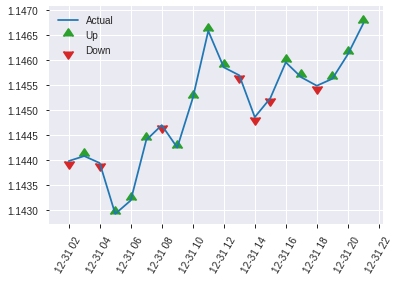


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.19516576175091713
RMSE: 0.44177569167046427
LogLoss: 0.5749269262023918
Null degrees of freedom: 616
Residual degrees of freedom: 566
Null deviance: 862.9188841257723
Residual deviance: 709.4598269337515
AIC: 811.4598269337515
AUC: 0.7744315432994678
pr_auc: 0.7691286744810726
Gini: 0.5488630865989357
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.36747928854197076: 


,0,1,Error,Rate
0,170.0,129.0,0.4314,(129.0/299.0)
1,54.0,264.0,0.1698,(54.0/318.0)
Total,224.0,393.0,0.2966,(183.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3674793,0.7426160,257.0
max f2,0.1593715,0.8547945,355.0
max f0point5,0.6263032,0.7247706,127.0
max accuracy,0.4102305,0.7147488,237.0
max precision,0.9336563,1.0,0.0
max recall,0.0608520,1.0,392.0
max specificity,0.9336563,1.0,0.0
max absolute_mcc,0.4102305,0.4306006,237.0
max min_per_class_accuracy,0.4851414,0.7090301,204.0
max mean_per_class_accuracy,0.4102305,0.7123798,237.0


Gains/Lift Table: Avg response rate: 51.54 %, avg score: 47.51 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.8861331,1.3858940,1.3858940,0.7142857,0.9108243,0.7142857,0.9108243,0.0157233,0.0157233,38.5893980,38.5893980
,2,0.0210697,0.8719917,1.6168763,1.4925012,0.8333333,0.8759200,0.7692308,0.8947146,0.0157233,0.0314465,61.6876310,49.2501209
,3,0.0307942,0.8617330,1.9402516,1.6338961,1.0,0.8659263,0.8421053,0.8856236,0.0188679,0.0503145,94.0251572,63.3896061
,4,0.0405186,0.8441807,1.9402516,1.7074214,1.0,0.8496731,0.88,0.8769955,0.0188679,0.0691824,94.0251572,70.7421384
,5,0.0502431,0.8308146,1.9402516,1.7524853,1.0,0.8415228,0.9032258,0.8701298,0.0188679,0.0880503,94.0251572,75.2485291
,6,0.1004862,0.7801435,1.8150741,1.7837797,0.9354839,0.8109958,0.9193548,0.8405628,0.0911950,0.1792453,81.5074052,78.3779671
,7,0.1507293,0.7323022,1.5021302,1.6898965,0.7741935,0.7559202,0.8709677,0.8123486,0.0754717,0.2547170,50.2130250,68.9896531
,8,0.2009724,0.6977707,1.5021302,1.6429550,0.7741935,0.7135777,0.8467742,0.7876559,0.0754717,0.3301887,50.2130250,64.2954960
,9,0.2998379,0.6301282,1.4313331,1.5731770,0.7377049,0.6663367,0.8108108,0.7476534,0.1415094,0.4716981,43.1333127,57.3176951
,10,0.4003241,0.5621813,1.0327145,1.4375143,0.5322581,0.5986700,0.7408907,0.7102567,0.1037736,0.5754717,3.2714547,43.7514323


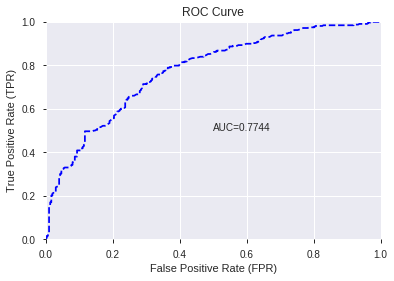

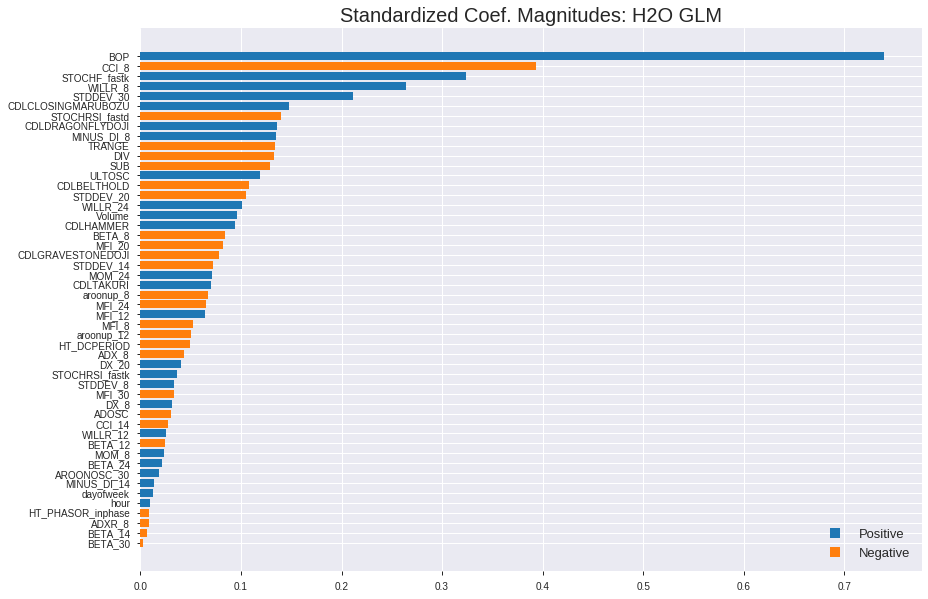

'log_likelihood'
--2019-12-08 07:52:36--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.142.212
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.142.212|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


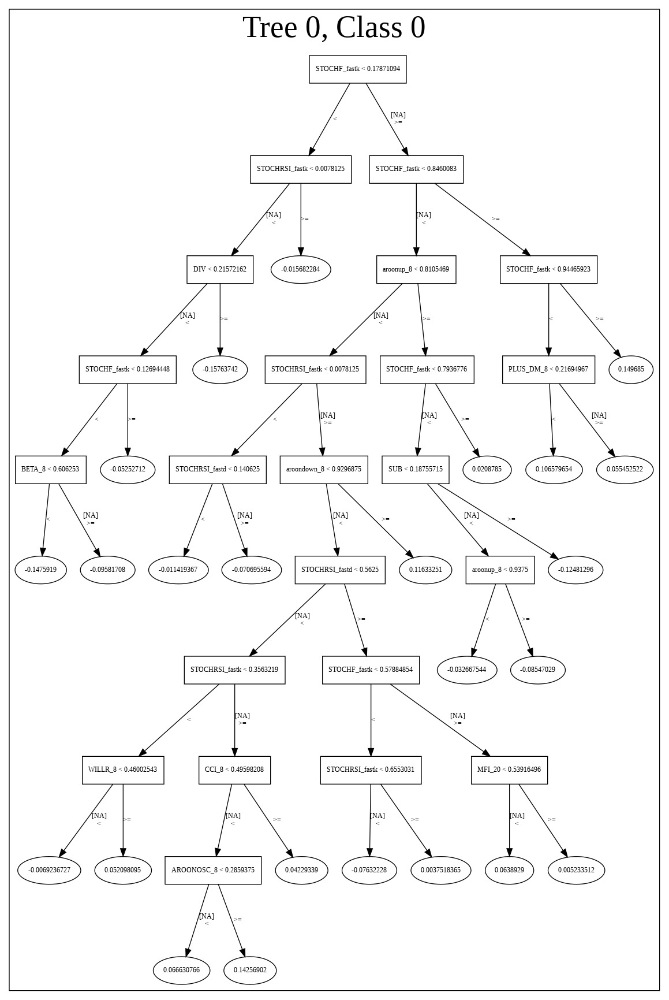

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191208_075227_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191208_075227_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_55_sid_afcd',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_55_s

['BOP',
 'CCI_8',
 'STOCHF_fastk',
 'WILLR_8',
 'STDDEV_30',
 'CDLCLOSINGMARUBOZU',
 'STOCHRSI_fastd',
 'CDLDRAGONFLYDOJI',
 'MINUS_DI_8',
 'TRANGE',
 'DIV',
 'SUB',
 'ULTOSC',
 'CDLBELTHOLD',
 'STDDEV_20',
 'WILLR_24',
 'Volume',
 'CDLHAMMER',
 'BETA_8',
 'MFI_20',
 'CDLGRAVESTONEDOJI',
 'STDDEV_14',
 'MOM_24',
 'CDLTAKURI',
 'aroonup_8',
 'MFI_24',
 'MFI_12',
 'MFI_8',
 'aroonup_12',
 'HT_DCPERIOD',
 'ADX_8',
 'DX_20',
 'STOCHRSI_fastk',
 'STDDEV_8',
 'MFI_30',
 'DX_8',
 'ADOSC',
 'CCI_14',
 'WILLR_12',
 'BETA_12',
 'MOM_8',
 'BETA_24',
 'AROONOSC_30',
 'MINUS_DI_14',
 'dayofweek',
 'hour',
 'HT_PHASOR_inphase',
 'ADXR_8',
 'BETA_14',
 'BETA_30']

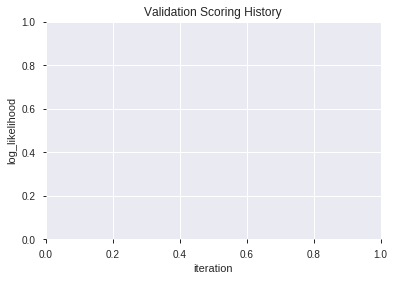

In [29]:
# GLM with top XGBoost features
model_train(feature_name='XGBF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20191208_075333_model_4,0.796002,0.558938,0.284802,0.433930,0.188295
1,XGBoost_grid_1_AutoML_20191208_075333_model_6,0.795824,0.558504,0.276740,0.433458,0.187886
2,XGBoost_3_AutoML_20191208_075333,0.793394,0.560495,0.276640,0.434865,0.189107
3,XGBoost_grid_1_AutoML_20191208_075333_model_2,0.789093,0.565155,0.311384,0.436937,0.190914
4,XGBoost_1_AutoML_20191208_075333,0.785475,0.565890,0.281257,0.436420,0.190463
5,XGBoost_grid_1_AutoML_20191208_075333_model_1,0.783834,0.570046,0.282230,0.439280,0.192967
6,XGBoost_2_AutoML_20191208_075333,0.782819,0.569090,0.272097,0.438588,0.192360
7,XGBoost_grid_1_AutoML_20191208_075333_model_3,0.782109,0.571734,0.291690,0.439990,0.193591
8,XGBoost_grid_1_AutoML_20191208_075333_model_7,0.780721,0.567970,0.288146,0.439048,0.192764
9,XGBoost_grid_1_AutoML_20191208_075333_model_5,0.770587,0.588366,0.297480,0.445155,0.198163


,variable,relative_importance,scaled_importance,percentage
0,BOP,4844.090820,1.000000,0.361084
1,STOCHF_fastk,805.325867,0.166249,0.060030
2,hour,663.189331,0.136907,0.049435
3,CCI_8,516.905579,0.106708,0.038531
4,TRANGE,487.031525,0.100541,0.036304
5,DIV,394.999695,0.081543,0.029444
6,SUB,303.369476,0.062627,0.022614
7,WILLR_8,298.394409,0.061600,0.022243
8,aroonup_8,280.773621,0.057962,0.020929
9,CCI_14,271.920197,0.056134,0.020269


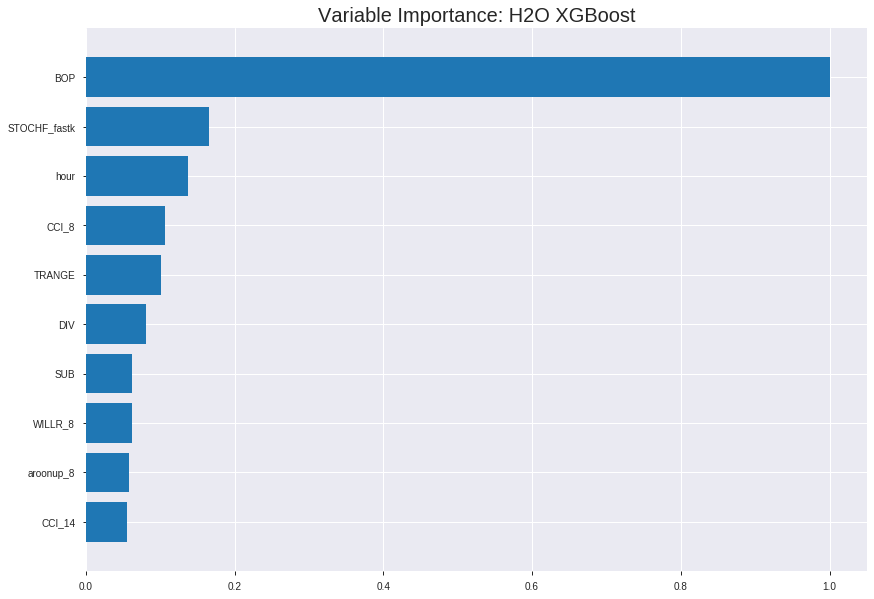

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20191208_075333_model_4


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.16848987926435297
RMSE: 0.41047518714820386
LogLoss: 0.5115527723883155
Mean Per-Class Error: 0.2444534043638502
AUC: 0.8403316446740717
pr_auc: 0.8135312174833899
Gini: 0.6806632893481435
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.37188514322042465: 


,0,1,Error,Rate
0,1398.0,943.0,0.4028,(943.0/2341.0)
1,246.0,1732.0,0.1244,(246.0/1978.0)
Total,1644.0,2675.0,0.2753,(1189.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3718851,0.7444659,250.0
max f2,0.2603661,0.8500045,302.0
max f0point5,0.5992356,0.7534878,135.0
max accuracy,0.5529768,0.7601297,161.0
max precision,0.9097586,1.0,0.0
max recall,0.0945924,1.0,384.0
max specificity,0.9097586,1.0,0.0
max absolute_mcc,0.5529768,0.5158488,161.0
max min_per_class_accuracy,0.4931905,0.7509611,192.0
max mean_per_class_accuracy,0.5107152,0.7555466,184.0


Gains/Lift Table: Avg response rate: 45.80 %, avg score: 45.89 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.8619074,2.1835187,2.1835187,1.0,0.8770308,1.0,0.8770308,0.0222447,0.0222447,118.3518706,118.3518706
,2,0.0201436,0.8413174,2.1835187,2.1835187,1.0,0.8522260,1.0,0.8647709,0.0217391,0.0439838,118.3518706,118.3518706
,3,0.0300996,0.8206031,1.9804007,2.1163335,0.9069767,0.8286093,0.9692308,0.8528098,0.0197169,0.0637007,98.0400687,111.6333515
,4,0.0400556,0.8095400,2.0311802,2.0951682,0.9302326,0.8148781,0.9595376,0.8433817,0.0202224,0.0839232,103.1180191,109.5168238
,5,0.0500116,0.7961525,1.9804007,2.0723210,0.9069767,0.8029048,0.9490741,0.8353238,0.0197169,0.1036400,98.0400687,107.2320994
,6,0.1000232,0.7452115,1.9409055,2.0066133,0.8888889,0.7708852,0.9189815,0.8031045,0.0970677,0.2007078,94.0905516,100.6613255
,7,0.1500347,0.7060511,1.8903611,1.9678625,0.8657407,0.7245710,0.9012346,0.7769267,0.0945399,0.2952477,89.0361102,96.7862537
,8,0.2000463,0.6717287,1.7690545,1.9181605,0.8101852,0.6897308,0.8784722,0.7551277,0.0884732,0.3837209,76.9054507,91.8160530
,9,0.3000695,0.6121359,1.6022579,1.8128597,0.7337963,0.6412044,0.8302469,0.7171533,0.1602629,0.5439838,60.2257939,81.2859666
,10,0.4000926,0.5494947,1.2939370,1.6831290,0.5925926,0.5818839,0.7708333,0.6833359,0.1294237,0.6734075,29.3937011,68.3129002




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.19196729301014684
RMSE: 0.4381407228393029
LogLoss: 0.5656670078305999
Mean Per-Class Error: 0.2802072864155911
AUC: 0.7771288536465051
pr_auc: 0.7378151590295585
Gini: 0.5542577072930102
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.43798109143972397: 


,0,1,Error,Rate
0,430.0,227.0,0.3455,(227.0/657.0)
1,124.0,453.0,0.2149,(124.0/577.0)
Total,554.0,680.0,0.2844,(351.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4379811,0.7207637,215.0
max f2,0.2028569,0.8318372,334.0
max f0point5,0.4981492,0.6957109,186.0
max accuracy,0.4981492,0.7171799,186.0
max precision,0.8994626,1.0,0.0
max recall,0.1027762,1.0,387.0
max specificity,0.8994626,1.0,0.0
max absolute_mcc,0.4379811,0.4409654,215.0
max min_per_class_accuracy,0.4970151,0.7157712,187.0
max mean_per_class_accuracy,0.4379811,0.7197927,215.0


Gains/Lift Table: Avg response rate: 46.76 %, avg score: 46.38 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.8698541,1.9741368,1.9741368,0.9230769,0.8820015,0.9230769,0.8820015,0.0207972,0.0207972,97.4136782,97.4136782
,2,0.0202593,0.8417555,2.1386482,2.0531023,1.0,0.8545004,0.96,0.8688010,0.0207972,0.0415945,113.8648180,105.3102253
,3,0.0299838,0.8254945,1.6039861,1.9074430,0.75,0.8319849,0.8918919,0.8568607,0.0155979,0.0571924,60.3986135,90.7442972
,4,0.0405186,0.8093553,1.8096254,1.8820104,0.8461538,0.8179112,0.88,0.8467338,0.0190641,0.0762565,80.9625383,88.2010399
,5,0.0502431,0.7872872,1.6039861,1.8281993,0.75,0.7982557,0.8548387,0.8373509,0.0155979,0.0918544,60.3986135,82.8199251
,6,0.1004862,0.7409268,1.8281993,1.8281993,0.8548387,0.7648010,0.8548387,0.8010760,0.0918544,0.1837088,82.8199251,82.8199251
,7,0.1499190,0.7062112,1.6828707,1.7802801,0.7868852,0.7231596,0.8324324,0.7753846,0.0831889,0.2668977,68.2870699,78.0280107
,8,0.2001621,0.6768564,1.4487617,1.6970650,0.6774194,0.6903798,0.7935223,0.7540474,0.0727903,0.3396880,44.8761670,69.7064953
,9,0.2998379,0.6156580,1.3909907,1.5953159,0.6504065,0.6469478,0.7459459,0.7184440,0.1386482,0.4783362,39.0990686,59.5315940
,10,0.4003241,0.5521389,1.1555599,1.4849318,0.5403226,0.5830669,0.6943320,0.6844627,0.1161179,0.5944541,15.5559904,48.4931834



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 07:53:44,3.740 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5420236,0.5,0.6931472,0.5,0.0,1.0,0.5324149
,2019-12-08 07:53:44,3.818 sec,5.0,0.4787567,0.6513001,0.7771820,0.7158375,1.9047716,0.3192869,0.4813057,0.6562450,0.7527705,0.6866886,1.9741368,0.3306321
,2019-12-08 07:53:44,3.875 sec,10.0,0.4639107,0.6222678,0.7869084,0.7327808,2.0379508,0.3287798,0.4678856,0.6298632,0.7629026,0.7066318,1.8870425,0.3144246
,2019-12-08 07:53:44,3.937 sec,15.0,0.4539195,0.6023648,0.7921950,0.7473428,1.9850170,0.3206761,0.4601584,0.6142333,0.7629910,0.7161040,1.9741368,0.3111831
,2019-12-08 07:53:44,4.010 sec,20.0,0.4465926,0.5873720,0.7954324,0.7528923,1.9850170,0.3093309,0.4541954,0.6017941,0.7657028,0.7225318,1.9741368,0.3095624
,2019-12-08 07:53:45,4.092 sec,25.0,0.4405868,0.5748249,0.7994597,0.7580352,2.0346424,0.3044686,0.4509194,0.5944588,0.7640963,0.7142121,1.8096254,0.3136143
,2019-12-08 07:53:45,4.163 sec,30.0,0.4361213,0.5652500,0.8035535,0.7662451,2.0842679,0.3035425,0.4479912,0.5879777,0.7664071,0.7214669,1.9741368,0.3103728
,2019-12-08 07:53:45,4.258 sec,35.0,0.4321833,0.5567745,0.8077299,0.7724950,2.0842679,0.3049317,0.4456557,0.5826554,0.7686506,0.7273070,1.9741368,0.3387358
,2019-12-08 07:53:45,4.339 sec,40.0,0.4292907,0.5504340,0.8107445,0.7777420,2.0842679,0.3021533,0.4442369,0.5793296,0.7697744,0.7281162,1.9741368,0.3014587
,2019-12-08 07:53:45,4.420 sec,45.0,0.4264028,0.5443242,0.8150851,0.7837886,2.1338933,0.2968280,0.4431924,0.5769473,0.7708863,0.7294634,1.9741368,0.3038898


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,4844.0908203,1.0,0.3610840
STOCHF_fastk,805.3258667,0.1662491,0.0600299
hour,663.1893311,0.1369069,0.0494349
CCI_8,516.9055786,0.1067085,0.0385307
TRANGE,487.0315247,0.1005414,0.0363039
---,---,---,---
WILLR_12,74.4374771,0.0153667,0.0055487
MFI_12,72.7362976,0.0150155,0.0054218
BETA_24,56.6598206,0.0116967,0.0042235
CDLGRAVESTONEDOJI,41.7264442,0.0086139,0.0031103



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7293354943273906)

('F1', 0.7593880389429765)

('auc', 0.7960023979302077)

('logloss', 0.5589377581751579)

('mean_per_class_error', 0.2697461138806504)

('rmse', 0.4339295620192683)

('mse', 0.188294864794234)

xgboost prediction progress: |████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           0
4           1
...       ...
6165        0
6166        0
6167        1
6168        1
6169        1

[6170 rows x 1 columns]


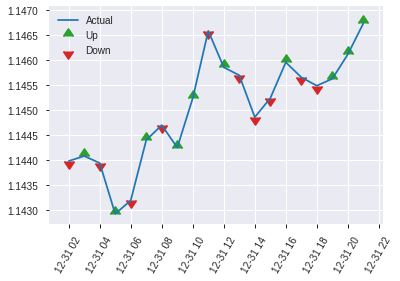


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.188294864794234
RMSE: 0.4339295620192683
LogLoss: 0.5589377581751579
Mean Per-Class Error: 0.2697461138806504
AUC: 0.7960023979302077
pr_auc: 0.7815057529788956
Gini: 0.5920047958604153
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3698243349790573: 


,0,1,Error,Rate
0,171.0,128.0,0.4281,(128.0/299.0)
1,45.0,273.0,0.1415,(45.0/318.0)
Total,216.0,401.0,0.2804,(173.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3698243,0.7593880,254.0
max f2,0.1640134,0.8597162,358.0
max f0point5,0.5548601,0.7557252,163.0
max accuracy,0.4538758,0.7293355,215.0
max precision,0.9122865,1.0,0.0
max recall,0.0747559,1.0,394.0
max specificity,0.9122865,1.0,0.0
max absolute_mcc,0.5413644,0.4656089,172.0
max min_per_class_accuracy,0.4754982,0.7190635,201.0
max mean_per_class_accuracy,0.5413644,0.7302539,172.0


Gains/Lift Table: Avg response rate: 51.54 %, avg score: 46.83 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.8644131,1.3858940,1.3858940,0.7142857,0.8833370,0.7142857,0.8833370,0.0157233,0.0157233,38.5893980,38.5893980
,2,0.0210697,0.8394357,1.9402516,1.6417513,1.0,0.8494234,0.8461538,0.8676846,0.0188679,0.0345912,94.0251572,64.1751330
,3,0.0307942,0.8241610,1.9402516,1.7360146,1.0,0.8313509,0.8947368,0.8562108,0.0188679,0.0534591,94.0251572,73.6014565
,4,0.0405186,0.8147114,1.2935010,1.6298113,0.6666667,0.8183413,0.84,0.8471221,0.0125786,0.0660377,29.3501048,62.9811321
,5,0.0502431,0.8091068,1.9402516,1.6898965,1.0,0.8110837,0.8709677,0.8401469,0.0188679,0.0849057,94.0251572,68.9896531
,6,0.1004862,0.7508330,1.6898965,1.6898965,0.8709677,0.7810811,0.8709677,0.8106140,0.0849057,0.1698113,68.9896531,68.9896531
,7,0.1507293,0.7140813,1.7524853,1.7107595,0.9032258,0.7333790,0.8817204,0.7848690,0.0880503,0.2578616,75.2485291,71.0759451
,8,0.2009724,0.6718354,1.5647190,1.6742493,0.8064516,0.6921860,0.8629032,0.7616982,0.0786164,0.3364780,56.4719010,67.4249341
,9,0.2998379,0.6127344,1.4631405,1.6046405,0.7540984,0.6416789,0.8270270,0.7221243,0.1446541,0.4811321,46.3140530,60.4640490
,10,0.4003241,0.5557369,1.3769527,1.5474881,0.7096774,0.5859940,0.7975709,0.6879539,0.1383648,0.6194969,37.6952729,54.7488096


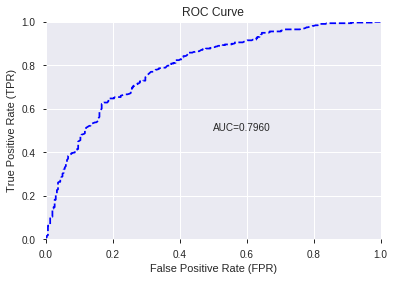

This function is available for GLM models only


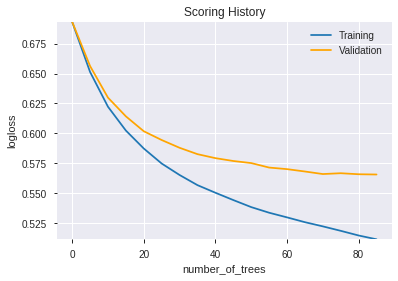

--2019-12-08 07:54:04--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 54.231.97.200
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|54.231.97.200|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
log4j:WARN No appenders could be found for logger (ml.dmlc.xgboost4j.java.Booster).
log4j:WARN Please initialize the log4j system properly.
log4j:WARN See http://logging.apache.org/log4j/1.2/faq.html#noconfig for more info.
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.

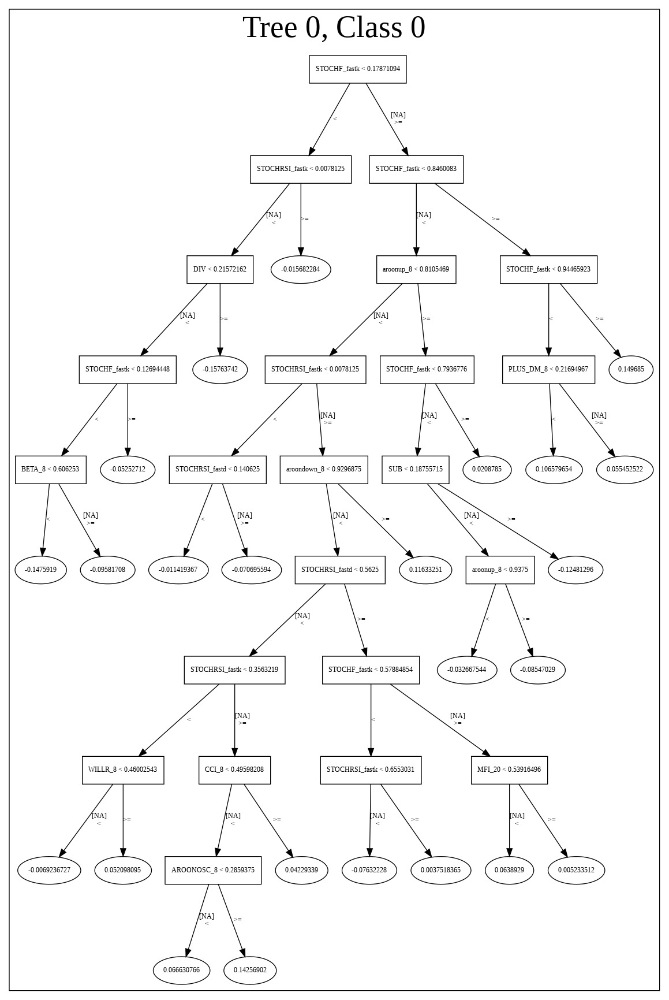

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20191208_075333_model_4',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20191208_075333_model_4',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_60_sid_afcd',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

['BOP',
 'STOCHF_fastk',
 'hour',
 'CCI_8',
 'TRANGE',
 'DIV',
 'SUB',
 'WILLR_8',
 'aroonup_8',
 'CCI_14',
 'STDDEV_30',
 'ULTOSC',
 'MINUS_DI_8',
 'Volume',
 'MOM_8',
 'ADOSC',
 'CDLCLOSINGMARUBOZU',
 'STOCHRSI_fastd',
 'WILLR_24',
 'ADX_8',
 'BETA_8',
 'STDDEV_8',
 'MINUS_DI_14',
 'DX_8',
 'STDDEV_14',
 'MFI_8',
 'STDDEV_20',
 'BETA_14',
 'DX_20',
 'MOM_24',
 'HT_PHASOR_inphase',
 'STOCHRSI_fastk',
 'MFI_20',
 'HT_DCPERIOD',
 'ADXR_8',
 'BETA_12',
 'dayofweek',
 'BETA_30',
 'MFI_30',
 'MFI_24',
 'aroonup_12',
 'AROONOSC_30',
 'WILLR_12',
 'MFI_12',
 'BETA_24',
 'CDLGRAVESTONEDOJI',
 'CDLBELTHOLD']

In [30]:
# XGBoost with top XGBoost features
model_train(feature_name='XGBF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

In [31]:
# DRF with top XGBoost features
model_train(feature_name='XGBF',model_algo="DRF",features_list = features_list[:model_selected_features])

Output hidden; open in https://colab.research.google.com to view.

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GBM_5_AutoML_20191208_075614,0.801135,0.552417,0.273769,0.430851,0.185633
1,GBM_2_AutoML_20191208_075614,0.790081,0.563268,0.297107,0.435790,0.189913
2,GBM_grid_1_AutoML_20191208_075614_model_1,0.782588,0.609865,0.302024,0.458101,0.209856
3,GBM_1_AutoML_20191208_075614,0.782477,0.571817,0.270325,0.439350,0.193029
4,GBM_grid_1_AutoML_20191208_075614_model_2,0.779785,0.614017,0.297980,0.460193,0.211778
5,GBM_grid_1_AutoML_20191208_075614_model_4,0.779722,0.648388,0.297380,0.477462,0.227970
6,GBM_grid_1_AutoML_20191208_075614_model_5,0.777771,0.693008,0.294909,0.499943,0.249943
7,GBM_3_AutoML_20191208_075614,0.769667,0.582086,0.308613,0.444292,0.197395
8,GBM_4_AutoML_20191208_075614,0.767422,0.584996,0.300851,0.444894,0.197931
9,GBM_grid_1_AutoML_20191208_075614_model_3,0.735076,0.747429,0.335868,0.483906,0.234165


,variable,relative_importance,scaled_importance,percentage
0,BOP,596.589417,1.000000,0.264414
1,STOCHRSI_fastk,214.245255,0.359117,0.094956
2,STOCHF_fastk,127.693222,0.214039,0.056595
3,hour,118.589279,0.198779,0.052560
4,CCI_8,75.206451,0.126061,0.033332
5,WILLR_8,72.842430,0.122098,0.032284
6,DIV,51.486046,0.086301,0.022819
7,STOCHRSI_fastd,47.702435,0.079959,0.021142
8,aroonup_8,47.696503,0.079949,0.021140
9,SUB,46.378292,0.077739,0.020555


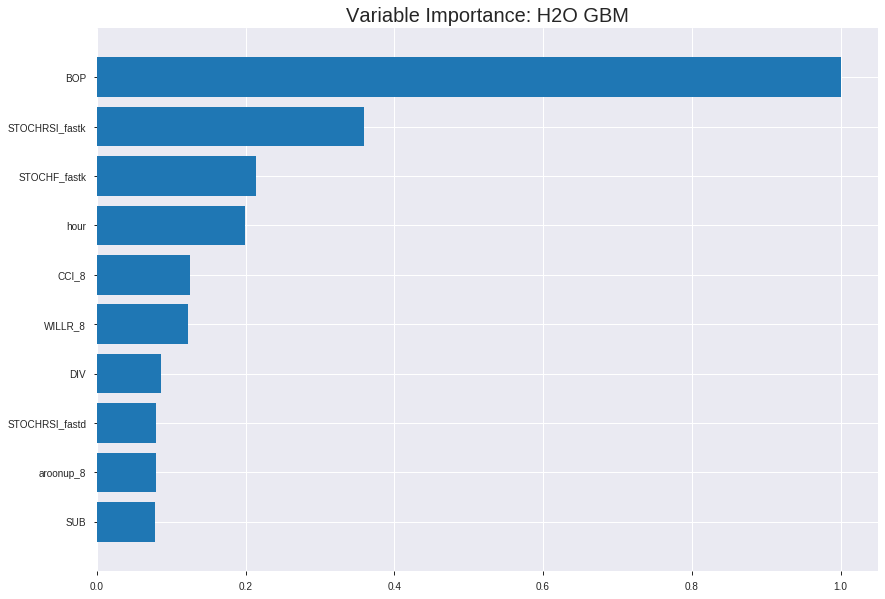

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_5_AutoML_20191208_075614


ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.14718389560342063
RMSE: 0.38364553379834965
LogLoss: 0.4608047292540884
Mean Per-Class Error: 0.20603313077772634
AUC: 0.8837767557614753
pr_auc: 0.8678553065157099
Gini: 0.7675535115229506
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4093073172131947: 


,0,1,Error,Rate
0,1648.0,693.0,0.296,(693.0/2341.0)
1,262.0,1716.0,0.1325,(262.0/1978.0)
Total,1910.0,2409.0,0.2211,(955.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4093073,0.7823114,221.0
max f2,0.2402361,0.8668522,301.0
max f0point5,0.5908341,0.8029104,139.0
max accuracy,0.5254689,0.7964807,170.0
max precision,0.9241449,1.0,0.0
max recall,0.0804221,1.0,385.0
max specificity,0.9241449,1.0,0.0
max absolute_mcc,0.5254689,0.5890725,170.0
max min_per_class_accuracy,0.4819147,0.7927199,189.0
max mean_per_class_accuracy,0.4962224,0.7939669,183.0


Gains/Lift Table: Avg response rate: 45.80 %, avg score: 45.81 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.8804863,2.1835187,2.1835187,1.0,0.8946849,1.0,0.8946849,0.0222447,0.0222447,118.3518706,118.3518706
,2,0.0201436,0.8642628,2.1835187,2.1835187,1.0,0.8721345,1.0,0.8835393,0.0217391,0.0439838,118.3518706,118.3518706
,3,0.0300996,0.8526877,2.1835187,2.1835187,1.0,0.8581004,1.0,0.8751249,0.0217391,0.0657230,118.3518706,118.3518706
,4,0.0400556,0.8418751,2.1835187,2.1835187,1.0,0.8475834,1.0,0.8682793,0.0217391,0.0874621,118.3518706,118.3518706
,5,0.0500116,0.8307255,2.1327392,2.1734098,0.9767442,0.8361563,0.9953704,0.8618845,0.0212336,0.1086957,113.2739201,117.3409823
,6,0.1000232,0.7888488,2.0723210,2.1228654,0.9490741,0.8105057,0.9722222,0.8361951,0.1036400,0.2123357,107.2320994,112.2865408
,7,0.1500347,0.7489192,1.9813410,2.0756906,0.9074074,0.7689085,0.9506173,0.8137662,0.0990900,0.3114257,98.1341048,107.5690622
,8,0.2000463,0.7088599,1.9307966,2.0394671,0.8842593,0.7283988,0.9340278,0.7924244,0.0965622,0.4079879,93.0796633,103.9467124
,9,0.3000695,0.6239993,1.7134557,1.9307966,0.7847222,0.6672459,0.8842593,0.7506982,0.1713852,0.5793731,71.3455651,93.0796633
,10,0.4000926,0.5455732,1.3192092,1.7778998,0.6041667,0.5833256,0.8142361,0.7088551,0.1319515,0.7113246,31.9209218,77.7899780




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.19245146235680194
RMSE: 0.43869290210442424
LogLoss: 0.5655220189586149
Mean Per-Class Error: 0.29145002888503757
AUC: 0.7757439545858624
pr_auc: 0.7393419320646348
Gini: 0.5514879091717249
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.298007356624074: 


,0,1,Error,Rate
0,315.0,342.0,0.5205,(342.0/657.0)
1,66.0,511.0,0.1144,(66.0/577.0)
Total,381.0,853.0,0.3306,(408.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2980074,0.7146853,280.0
max f2,0.2085248,0.8315726,324.0
max f0point5,0.5449005,0.6906188,162.0
max accuracy,0.4605886,0.7058347,198.0
max precision,0.9090138,1.0,0.0
max recall,0.0960584,1.0,383.0
max specificity,0.9090138,1.0,0.0
max absolute_mcc,0.4434777,0.4168938,208.0
max min_per_class_accuracy,0.4705304,0.7036395,193.0
max mean_per_class_accuracy,0.4434777,0.7085500,208.0


Gains/Lift Table: Avg response rate: 46.76 %, avg score: 46.19 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.8799863,1.8096254,1.8096254,0.8461538,0.8910078,0.8461538,0.8910078,0.0190641,0.0190641,80.9625383,80.9625383
,2,0.0202593,0.8655857,1.9604275,1.8820104,0.9166667,0.8725727,0.88,0.8821590,0.0190641,0.0381282,96.0427499,88.2010399
,3,0.0299838,0.8468898,2.1386482,1.9652443,1.0,0.8571552,0.9189189,0.8740496,0.0207972,0.0589255,113.8648180,96.5244274
,4,0.0405186,0.8326498,1.8096254,1.9247834,0.8461538,0.8391388,0.9,0.8649728,0.0190641,0.0779896,80.9625383,92.4783362
,5,0.0502431,0.8187302,2.1386482,1.9661766,1.0,0.8274171,0.9193548,0.8577040,0.0207972,0.0987868,113.8648180,96.6176553
,6,0.1004862,0.7703278,1.7247163,1.8454464,0.8064516,0.7946694,0.8629032,0.8261867,0.0866551,0.1854419,72.4716274,84.5446414
,7,0.1499190,0.7396137,1.6127511,1.7687198,0.7540984,0.7548741,0.8270270,0.8026728,0.0797227,0.2651646,61.2751087,76.8719846
,8,0.2001621,0.7055123,1.4142673,1.6797480,0.6612903,0.7233803,0.7854251,0.7827694,0.0710572,0.3362218,41.4267345,67.9747963
,9,0.2998379,0.6255530,1.4779276,1.6126563,0.6910569,0.6660741,0.7540541,0.7439761,0.1473137,0.4835355,47.7927604,61.2656331
,10,0.4003241,0.5338372,1.2073014,1.5109073,0.5645161,0.5815071,0.7064777,0.7031944,0.1213172,0.6048527,20.7301392,51.0907318



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 07:56:19,0.003 sec,0.0,0.4982309,0.6896110,0.5,0.0,1.0,0.5420236,0.4990407,0.6912300,0.5,0.0,1.0,0.5324149
,2019-12-08 07:56:19,0.104 sec,5.0,0.4613105,0.6169872,0.7966940,0.7473203,1.8923829,0.2850197,0.4679005,0.6295447,0.7628380,0.7178013,1.9858876,0.3095624
,2019-12-08 07:56:19,0.212 sec,10.0,0.4404227,0.5754103,0.8110143,0.7766933,2.1338933,0.2868720,0.4527877,0.5988396,0.7686506,0.7307231,2.1386482,0.3168558
,2019-12-08 07:56:19,0.322 sec,15.0,0.4271357,0.5481311,0.8242823,0.7942435,2.1338933,0.2722853,0.4444117,0.5809615,0.7757440,0.7421316,2.1386482,0.2949757
,2019-12-08 07:56:20,0.419 sec,20.0,0.4177732,0.5285759,0.8349973,0.8100833,2.1338933,0.2773790,0.4422118,0.5751707,0.7731984,0.7416095,2.1386482,0.2893031
,2019-12-08 07:56:20,0.518 sec,25.0,0.4099899,0.5126661,0.8459427,0.8244276,2.1835187,0.2771475,0.4398785,0.5698358,0.7760763,0.7417348,1.9741368,0.2893031
,2019-12-08 07:56:20,0.633 sec,30.0,0.4024077,0.4973231,0.8564976,0.8362773,2.1835187,0.2667284,0.4389809,0.5671233,0.7767503,0.7428505,2.1386482,0.2982172
,2019-12-08 07:56:20,0.739 sec,35.0,0.3957495,0.4841908,0.8666708,0.8489514,2.1835187,0.2370919,0.4386365,0.5660796,0.7764799,0.7406637,1.9741368,0.3095624
,2019-12-08 07:56:20,0.854 sec,40.0,0.3896592,0.4723944,0.8755560,0.8590605,2.1835187,0.2278305,0.4386684,0.5660360,0.7758587,0.7378048,1.8096254,0.3200972
,2019-12-08 07:56:20,0.961 sec,45.0,0.3836455,0.4608047,0.8837768,0.8678553,2.1835187,0.2211160,0.4386929,0.5655220,0.7757440,0.7393419,1.8096254,0.3306321


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,596.5894165,1.0,0.2644141
STOCHRSI_fastk,214.2452545,0.3591168,0.0949555
STOCHF_fastk,127.6932220,0.2140387,0.0565949
hour,118.5892792,0.1987787,0.0525599
CCI_8,75.2064514,0.1260607,0.0333322
---,---,---,---
BETA_30,9.4436741,0.0158294,0.0041855
MFI_30,7.2025142,0.0120728,0.0031922
CDLGRAVESTONEDOJI,6.1722288,0.0103459,0.0027356
CDLBELTHOLD,5.7314734,0.0096071,0.0025402



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7358184764991896)

('F1', 0.759018759018759)

('auc', 0.8011348099535138)

('logloss', 0.5524169716240508)

('mean_per_class_error', 0.2651816326959887)

('rmse', 0.4308514559289232)

('mse', 0.18563297707607285)

gbm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
6165        0
6166        0
6167        1
6168        1
6169        1

[6170 rows x 1 columns]


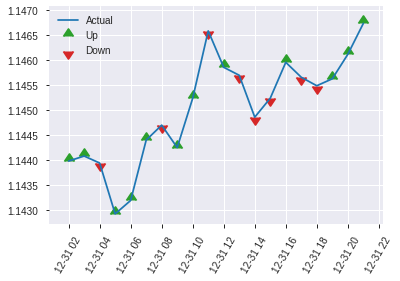


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.18563297707607285
RMSE: 0.4308514559289232
LogLoss: 0.5524169716240508
Mean Per-Class Error: 0.2651816326959887
AUC: 0.8011348099535138
pr_auc: 0.7830501909216702
Gini: 0.6022696199070277
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3889621923525942: 


,0,1,Error,Rate
0,187.0,112.0,0.3746,(112.0/299.0)
1,55.0,263.0,0.173,(55.0/318.0)
Total,242.0,375.0,0.2707,(167.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3889622,0.7590188,249.0
max f2,0.1804287,0.8689617,342.0
max f0point5,0.5954044,0.7530120,142.0
max accuracy,0.4438091,0.7358185,222.0
max precision,0.8063518,0.9024390,32.0
max recall,0.0570167,1.0,395.0
max specificity,0.9197504,0.9966555,0.0
max absolute_mcc,0.4276921,0.4713722,231.0
max min_per_class_accuracy,0.4658694,0.7257525,208.0
max mean_per_class_accuracy,0.4438091,0.7348184,222.0


Gains/Lift Table: Avg response rate: 51.54 %, avg score: 46.78 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.8851793,1.3858940,1.3858940,0.7142857,0.9014913,0.7142857,0.9014913,0.0157233,0.0157233,38.5893980,38.5893980
,2,0.0210697,0.8597908,1.9402516,1.6417513,1.0,0.8670558,0.8461538,0.8855980,0.0188679,0.0345912,94.0251572,64.1751330
,3,0.0307942,0.8467396,1.9402516,1.7360146,1.0,0.8540104,0.8947368,0.8756229,0.0188679,0.0534591,94.0251572,73.6014565
,4,0.0405186,0.8307987,1.6168763,1.7074214,0.8333333,0.8382500,0.88,0.8666534,0.0157233,0.0691824,61.6876310,70.7421384
,5,0.0502431,0.8213181,1.9402516,1.7524853,1.0,0.8253641,0.9032258,0.8586620,0.0188679,0.0880503,94.0251572,75.2485291
,6,0.1004862,0.7812890,1.6273078,1.6898965,0.8387097,0.7994096,0.8709677,0.8290358,0.0817610,0.1698113,62.7307770,68.9896531
,7,0.1507293,0.7464439,1.6273078,1.6690336,0.8387097,0.7629290,0.8602151,0.8070002,0.0817610,0.2515723,62.7307770,66.9033611
,8,0.2009724,0.7097728,1.5021302,1.6273078,0.7741935,0.7270185,0.8387097,0.7870047,0.0754717,0.3270440,50.2130250,62.7307770
,9,0.2998379,0.6332459,1.5903701,1.6151283,0.8196721,0.6688974,0.8324324,0.7480613,0.1572327,0.4842767,59.0370141,61.5128336
,10,0.4003241,0.5515917,1.1891864,1.5082117,0.6129032,0.5869076,0.7773279,0.7076097,0.1194969,0.6037736,18.9186448,50.8211749


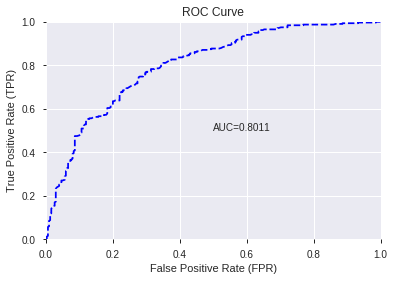

This function is available for GLM models only


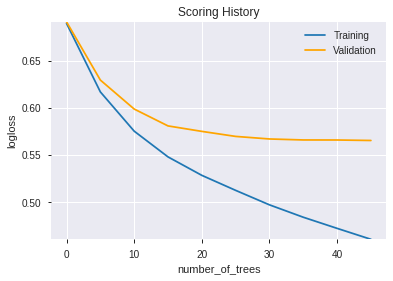

--2019-12-08 07:56:38--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.161.99
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.161.99|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip

Tree inconsistency found:
Note: this is a known issue for DRF and Isolation Forest models, please refer to https://0xdata.atlassian.net/browse/PUBDEV-6140
        Node 2 (parent)
            weight:      2513.0
            depth:       1
            colId:       3
            colName:     BOP
            leftward:    true
            naVsRest:    false
            splitVal:    0.8483372
            isBitset:    false
            predValue:   0.15205146
            squaredErr:  597.8273
            leftChild:   Node 5
            rightChild:  N

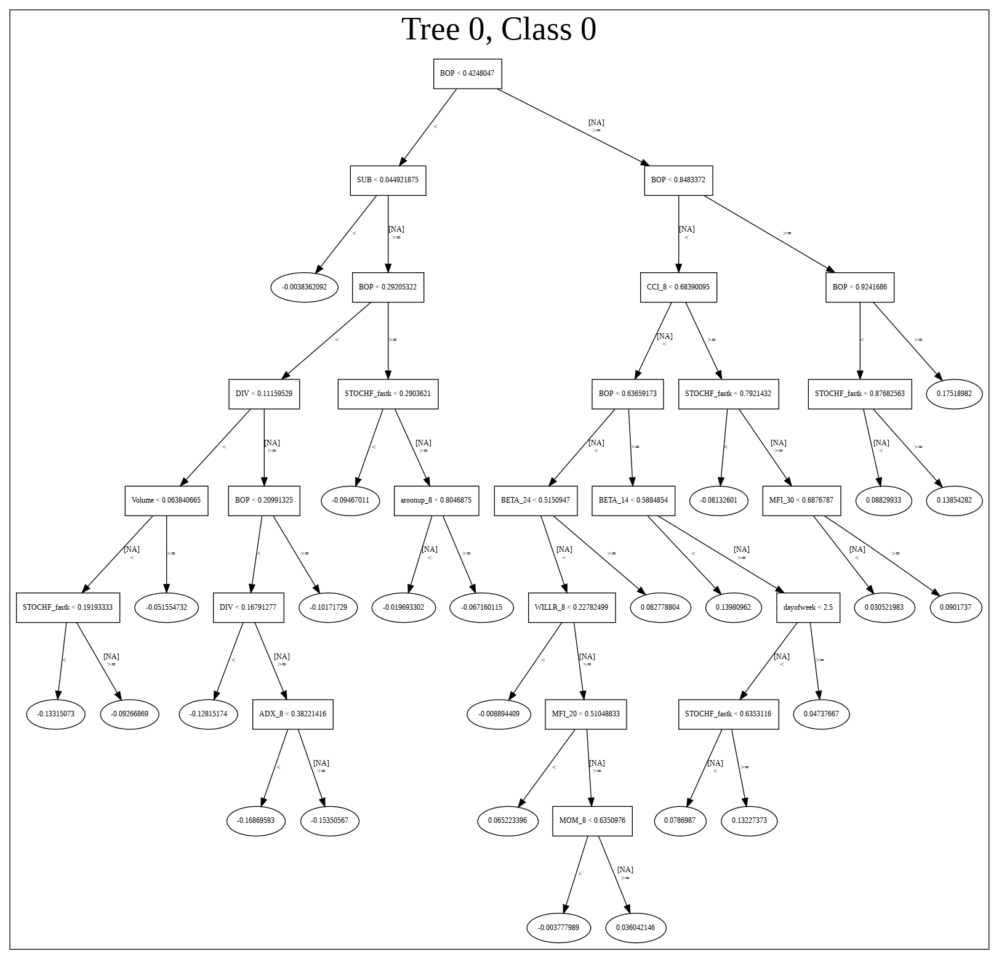

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GBM_5_AutoML_20191208_075614',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GBM_5_AutoML_20191208_075614',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_70_sid_afcd',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_70_sid_afcd',
   'type': 'Key<

['BOP',
 'STOCHRSI_fastk',
 'STOCHF_fastk',
 'hour',
 'CCI_8',
 'WILLR_8',
 'DIV',
 'STOCHRSI_fastd',
 'aroonup_8',
 'SUB',
 'CCI_14',
 'MOM_8',
 'MINUS_DI_14',
 'TRANGE',
 'WILLR_12',
 'ULTOSC',
 'CDLDRAGONFLYDOJI',
 'ADOSC',
 'aroonup_12',
 'WILLR_24',
 'CDLCLOSINGMARUBOZU',
 'HT_DCPERIOD',
 'AROONOSC_30',
 'DX_8',
 'STDDEV_20',
 'DX_20',
 'MFI_8',
 'STDDEV_8',
 'Volume',
 'STDDEV_30',
 'dayofweek',
 'BETA_8',
 'ADX_8',
 'MINUS_DI_8',
 'STDDEV_14',
 'BETA_14',
 'ADXR_8',
 'MFI_20',
 'BETA_24',
 'BETA_12',
 'MOM_24',
 'CDLHAMMER',
 'HT_PHASOR_inphase',
 'MFI_12',
 'MFI_24',
 'BETA_30',
 'MFI_30',
 'CDLGRAVESTONEDOJI',
 'CDLBELTHOLD',
 'CDLTAKURI']

In [32]:
# GBM with top XGBoost features
model_train(feature_name='XGBF',model_algo="GBM",features_list = features_list[:model_selected_features])

In [33]:
# StackedEnsemble with top XGBoost features
model_train(feature_name='XGBF',model_algo="StackedEnsemble",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GBM_5_AutoML_20191208_075736,0.801135,0.552417,0.273769,0.430851,0.185633
1,XGBoost_3_AutoML_20191208_075736,0.793394,0.560495,0.276640,0.434865,0.189107
2,GBM_2_AutoML_20191208_075736,0.790081,0.563268,0.297107,0.435790,0.189913
3,XGBoost_1_AutoML_20191208_075736,0.785475,0.565890,0.281257,0.436420,0.190463
4,XGBoost_2_AutoML_20191208_075736,0.782819,0.569090,0.272097,0.438588,0.192360
5,GBM_1_AutoML_20191208_075736,0.782477,0.571817,0.270325,0.439350,0.193029
6,GLM_grid_1_AutoML_20191208_075736_model_1,0.774432,0.574927,0.300625,0.441776,0.195166
7,GBM_3_AutoML_20191208_075736,0.769667,0.582086,0.308613,0.444292,0.197395
8,GBM_4_AutoML_20191208_075736,0.767422,0.584996,0.300851,0.444894,0.197931
9,DRF_1_AutoML_20191208_075736,0.758514,0.589760,0.314302,0.449346,0.201912


,variable,relative_importance,scaled_importance,percentage
0,BOP,596.589417,1.000000,0.264414
1,STOCHRSI_fastk,214.245255,0.359117,0.094956
2,STOCHF_fastk,127.693222,0.214039,0.056595
3,hour,118.589279,0.198779,0.052560
4,CCI_8,75.206451,0.126061,0.033332
5,WILLR_8,72.842430,0.122098,0.032284
6,DIV,51.486046,0.086301,0.022819
7,STOCHRSI_fastd,47.702435,0.079959,0.021142
8,aroonup_8,47.696503,0.079949,0.021140
9,SUB,46.378292,0.077739,0.020555


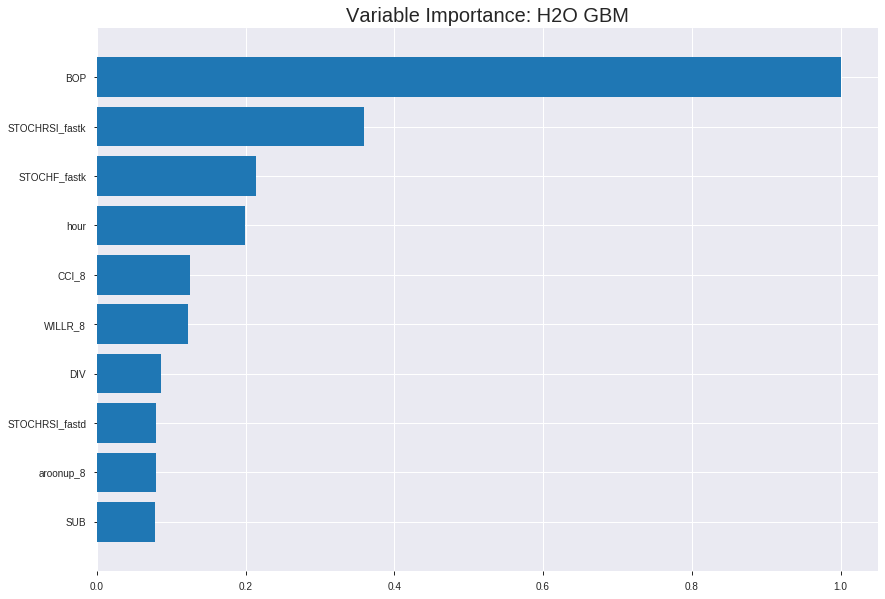

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_5_AutoML_20191208_075736


ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.14718389560342063
RMSE: 0.38364553379834965
LogLoss: 0.4608047292540884
Mean Per-Class Error: 0.20603313077772634
AUC: 0.8837767557614753
pr_auc: 0.8678553065157099
Gini: 0.7675535115229506
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4093073172131947: 


,0,1,Error,Rate
0,1648.0,693.0,0.296,(693.0/2341.0)
1,262.0,1716.0,0.1325,(262.0/1978.0)
Total,1910.0,2409.0,0.2211,(955.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4093073,0.7823114,221.0
max f2,0.2402361,0.8668522,301.0
max f0point5,0.5908341,0.8029104,139.0
max accuracy,0.5254689,0.7964807,170.0
max precision,0.9241449,1.0,0.0
max recall,0.0804221,1.0,385.0
max specificity,0.9241449,1.0,0.0
max absolute_mcc,0.5254689,0.5890725,170.0
max min_per_class_accuracy,0.4819147,0.7927199,189.0
max mean_per_class_accuracy,0.4962224,0.7939669,183.0


Gains/Lift Table: Avg response rate: 45.80 %, avg score: 45.81 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.8804863,2.1835187,2.1835187,1.0,0.8946849,1.0,0.8946849,0.0222447,0.0222447,118.3518706,118.3518706
,2,0.0201436,0.8642628,2.1835187,2.1835187,1.0,0.8721345,1.0,0.8835393,0.0217391,0.0439838,118.3518706,118.3518706
,3,0.0300996,0.8526877,2.1835187,2.1835187,1.0,0.8581004,1.0,0.8751249,0.0217391,0.0657230,118.3518706,118.3518706
,4,0.0400556,0.8418751,2.1835187,2.1835187,1.0,0.8475834,1.0,0.8682793,0.0217391,0.0874621,118.3518706,118.3518706
,5,0.0500116,0.8307255,2.1327392,2.1734098,0.9767442,0.8361563,0.9953704,0.8618845,0.0212336,0.1086957,113.2739201,117.3409823
,6,0.1000232,0.7888488,2.0723210,2.1228654,0.9490741,0.8105057,0.9722222,0.8361951,0.1036400,0.2123357,107.2320994,112.2865408
,7,0.1500347,0.7489192,1.9813410,2.0756906,0.9074074,0.7689085,0.9506173,0.8137662,0.0990900,0.3114257,98.1341048,107.5690622
,8,0.2000463,0.7088599,1.9307966,2.0394671,0.8842593,0.7283988,0.9340278,0.7924244,0.0965622,0.4079879,93.0796633,103.9467124
,9,0.3000695,0.6239993,1.7134557,1.9307966,0.7847222,0.6672459,0.8842593,0.7506982,0.1713852,0.5793731,71.3455651,93.0796633
,10,0.4000926,0.5455732,1.3192092,1.7778998,0.6041667,0.5833256,0.8142361,0.7088551,0.1319515,0.7113246,31.9209218,77.7899780




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.19245146235680194
RMSE: 0.43869290210442424
LogLoss: 0.5655220189586149
Mean Per-Class Error: 0.29145002888503757
AUC: 0.7757439545858624
pr_auc: 0.7393419320646348
Gini: 0.5514879091717249
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.298007356624074: 


,0,1,Error,Rate
0,315.0,342.0,0.5205,(342.0/657.0)
1,66.0,511.0,0.1144,(66.0/577.0)
Total,381.0,853.0,0.3306,(408.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2980074,0.7146853,280.0
max f2,0.2085248,0.8315726,324.0
max f0point5,0.5449005,0.6906188,162.0
max accuracy,0.4605886,0.7058347,198.0
max precision,0.9090138,1.0,0.0
max recall,0.0960584,1.0,383.0
max specificity,0.9090138,1.0,0.0
max absolute_mcc,0.4434777,0.4168938,208.0
max min_per_class_accuracy,0.4705304,0.7036395,193.0
max mean_per_class_accuracy,0.4434777,0.7085500,208.0


Gains/Lift Table: Avg response rate: 46.76 %, avg score: 46.19 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.8799863,1.8096254,1.8096254,0.8461538,0.8910078,0.8461538,0.8910078,0.0190641,0.0190641,80.9625383,80.9625383
,2,0.0202593,0.8655857,1.9604275,1.8820104,0.9166667,0.8725727,0.88,0.8821590,0.0190641,0.0381282,96.0427499,88.2010399
,3,0.0299838,0.8468898,2.1386482,1.9652443,1.0,0.8571552,0.9189189,0.8740496,0.0207972,0.0589255,113.8648180,96.5244274
,4,0.0405186,0.8326498,1.8096254,1.9247834,0.8461538,0.8391388,0.9,0.8649728,0.0190641,0.0779896,80.9625383,92.4783362
,5,0.0502431,0.8187302,2.1386482,1.9661766,1.0,0.8274171,0.9193548,0.8577040,0.0207972,0.0987868,113.8648180,96.6176553
,6,0.1004862,0.7703278,1.7247163,1.8454464,0.8064516,0.7946694,0.8629032,0.8261867,0.0866551,0.1854419,72.4716274,84.5446414
,7,0.1499190,0.7396137,1.6127511,1.7687198,0.7540984,0.7548741,0.8270270,0.8026728,0.0797227,0.2651646,61.2751087,76.8719846
,8,0.2001621,0.7055123,1.4142673,1.6797480,0.6612903,0.7233803,0.7854251,0.7827694,0.0710572,0.3362218,41.4267345,67.9747963
,9,0.2998379,0.6255530,1.4779276,1.6126563,0.6910569,0.6660741,0.7540541,0.7439761,0.1473137,0.4835355,47.7927604,61.2656331
,10,0.4003241,0.5338372,1.2073014,1.5109073,0.5645161,0.5815071,0.7064777,0.7031944,0.1213172,0.6048527,20.7301392,51.0907318



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 07:57:50,0.003 sec,0.0,0.4982309,0.6896110,0.5,0.0,1.0,0.5420236,0.4990407,0.6912300,0.5,0.0,1.0,0.5324149
,2019-12-08 07:57:50,0.095 sec,5.0,0.4613105,0.6169872,0.7966940,0.7473203,1.8923829,0.2850197,0.4679005,0.6295447,0.7628380,0.7178013,1.9858876,0.3095624
,2019-12-08 07:57:50,0.194 sec,10.0,0.4404227,0.5754103,0.8110143,0.7766933,2.1338933,0.2868720,0.4527877,0.5988396,0.7686506,0.7307231,2.1386482,0.3168558
,2019-12-08 07:57:50,0.305 sec,15.0,0.4271357,0.5481311,0.8242823,0.7942435,2.1338933,0.2722853,0.4444117,0.5809615,0.7757440,0.7421316,2.1386482,0.2949757
,2019-12-08 07:57:50,0.406 sec,20.0,0.4177732,0.5285759,0.8349973,0.8100833,2.1338933,0.2773790,0.4422118,0.5751707,0.7731984,0.7416095,2.1386482,0.2893031
,2019-12-08 07:57:51,0.506 sec,25.0,0.4099899,0.5126661,0.8459427,0.8244276,2.1835187,0.2771475,0.4398785,0.5698358,0.7760763,0.7417348,1.9741368,0.2893031
,2019-12-08 07:57:51,0.719 sec,30.0,0.4024077,0.4973231,0.8564976,0.8362773,2.1835187,0.2667284,0.4389809,0.5671233,0.7767503,0.7428505,2.1386482,0.2982172
,2019-12-08 07:57:51,0.829 sec,35.0,0.3957495,0.4841908,0.8666708,0.8489514,2.1835187,0.2370919,0.4386365,0.5660796,0.7764799,0.7406637,1.9741368,0.3095624
,2019-12-08 07:57:51,0.938 sec,40.0,0.3896592,0.4723944,0.8755560,0.8590605,2.1835187,0.2278305,0.4386684,0.5660360,0.7758587,0.7378048,1.8096254,0.3200972
,2019-12-08 07:57:51,1.058 sec,45.0,0.3836455,0.4608047,0.8837768,0.8678553,2.1835187,0.2211160,0.4386929,0.5655220,0.7757440,0.7393419,1.8096254,0.3306321


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,596.5894165,1.0,0.2644141
STOCHRSI_fastk,214.2452545,0.3591168,0.0949555
STOCHF_fastk,127.6932220,0.2140387,0.0565949
hour,118.5892792,0.1987787,0.0525599
CCI_8,75.2064514,0.1260607,0.0333322
---,---,---,---
BETA_30,9.4436741,0.0158294,0.0041855
MFI_30,7.2025142,0.0120728,0.0031922
CDLGRAVESTONEDOJI,6.1722288,0.0103459,0.0027356
CDLBELTHOLD,5.7314734,0.0096071,0.0025402



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7358184764991896)

('F1', 0.759018759018759)

('auc', 0.8011348099535138)

('logloss', 0.5524169716240508)

('mean_per_class_error', 0.2651816326959887)

('rmse', 0.4308514559289232)

('mse', 0.18563297707607285)

gbm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
6165        0
6166        0
6167        1
6168        1
6169        1

[6170 rows x 1 columns]


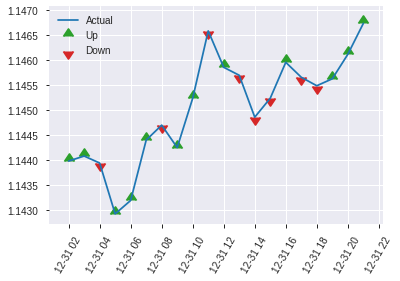


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.18563297707607285
RMSE: 0.4308514559289232
LogLoss: 0.5524169716240508
Mean Per-Class Error: 0.2651816326959887
AUC: 0.8011348099535138
pr_auc: 0.7830501909216702
Gini: 0.6022696199070277
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3889621923525942: 


,0,1,Error,Rate
0,187.0,112.0,0.3746,(112.0/299.0)
1,55.0,263.0,0.173,(55.0/318.0)
Total,242.0,375.0,0.2707,(167.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3889622,0.7590188,249.0
max f2,0.1804287,0.8689617,342.0
max f0point5,0.5954044,0.7530120,142.0
max accuracy,0.4438091,0.7358185,222.0
max precision,0.8063518,0.9024390,32.0
max recall,0.0570167,1.0,395.0
max specificity,0.9197504,0.9966555,0.0
max absolute_mcc,0.4276921,0.4713722,231.0
max min_per_class_accuracy,0.4658694,0.7257525,208.0
max mean_per_class_accuracy,0.4438091,0.7348184,222.0


Gains/Lift Table: Avg response rate: 51.54 %, avg score: 46.78 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.8851793,1.3858940,1.3858940,0.7142857,0.9014913,0.7142857,0.9014913,0.0157233,0.0157233,38.5893980,38.5893980
,2,0.0210697,0.8597908,1.9402516,1.6417513,1.0,0.8670558,0.8461538,0.8855980,0.0188679,0.0345912,94.0251572,64.1751330
,3,0.0307942,0.8467396,1.9402516,1.7360146,1.0,0.8540104,0.8947368,0.8756229,0.0188679,0.0534591,94.0251572,73.6014565
,4,0.0405186,0.8307987,1.6168763,1.7074214,0.8333333,0.8382500,0.88,0.8666534,0.0157233,0.0691824,61.6876310,70.7421384
,5,0.0502431,0.8213181,1.9402516,1.7524853,1.0,0.8253641,0.9032258,0.8586620,0.0188679,0.0880503,94.0251572,75.2485291
,6,0.1004862,0.7812890,1.6273078,1.6898965,0.8387097,0.7994096,0.8709677,0.8290358,0.0817610,0.1698113,62.7307770,68.9896531
,7,0.1507293,0.7464439,1.6273078,1.6690336,0.8387097,0.7629290,0.8602151,0.8070002,0.0817610,0.2515723,62.7307770,66.9033611
,8,0.2009724,0.7097728,1.5021302,1.6273078,0.7741935,0.7270185,0.8387097,0.7870047,0.0754717,0.3270440,50.2130250,62.7307770
,9,0.2998379,0.6332459,1.5903701,1.6151283,0.8196721,0.6688974,0.8324324,0.7480613,0.1572327,0.4842767,59.0370141,61.5128336
,10,0.4003241,0.5515917,1.1891864,1.5082117,0.6129032,0.5869076,0.7773279,0.7076097,0.1194969,0.6037736,18.9186448,50.8211749


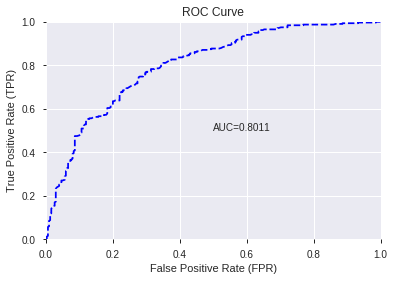

This function is available for GLM models only


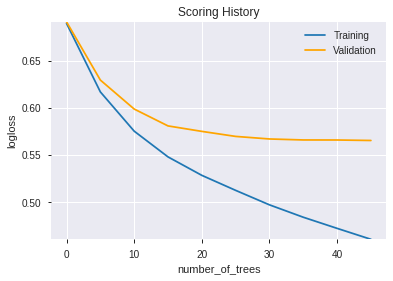

--2019-12-08 07:58:00--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.130.219
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.130.219|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip

Tree inconsistency found:
Note: this is a known issue for DRF and Isolation Forest models, please refer to https://0xdata.atlassian.net/browse/PUBDEV-6140
        Node 2 (parent)
            weight:      2513.0
            depth:       1
            colId:       3
            colName:     BOP
            leftward:    true
            naVsRest:    false
            splitVal:    0.8483372
            isBitset:    false
            predValue:   0.15205146
            squaredErr:  597.8273
            leftChild:   Node 5
            rightChild: 

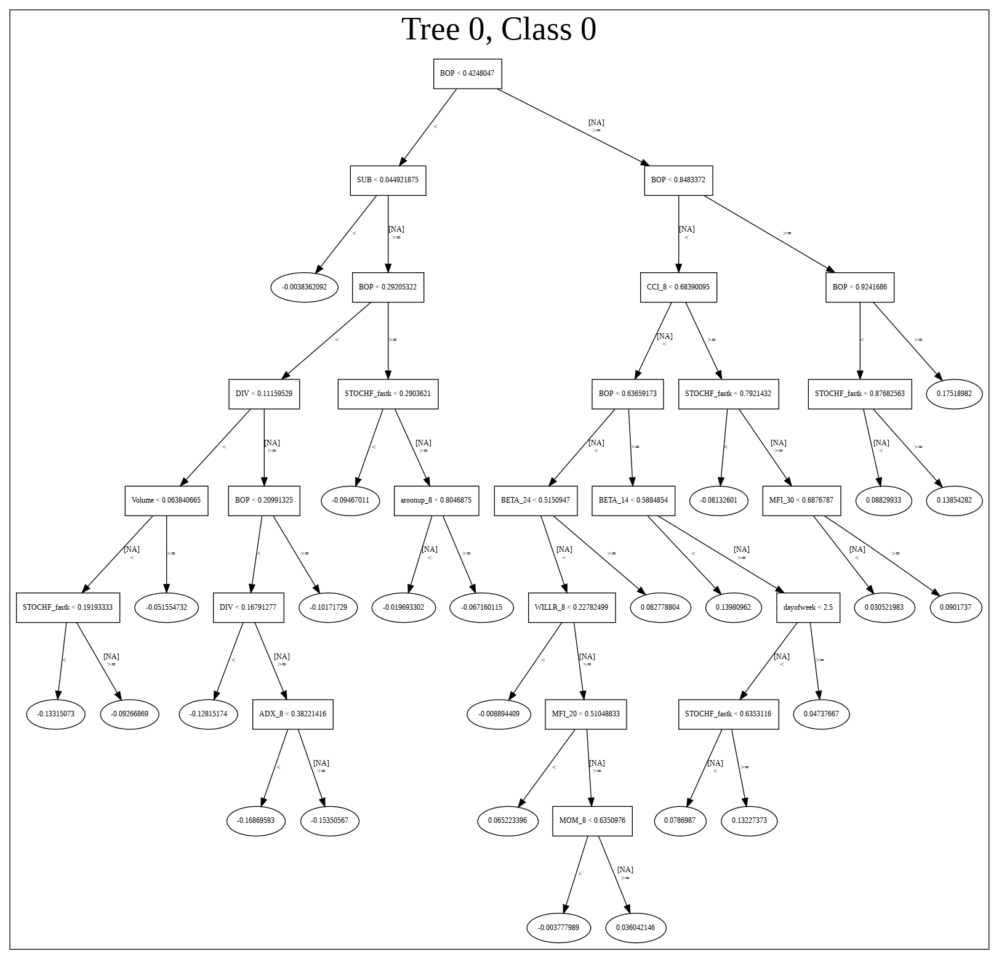

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GBM_5_AutoML_20191208_075736',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GBM_5_AutoML_20191208_075736',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_78_sid_afcd',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_78_sid_afcd',
   'type': 'Key<

['BOP',
 'STOCHRSI_fastk',
 'STOCHF_fastk',
 'hour',
 'CCI_8',
 'WILLR_8',
 'DIV',
 'STOCHRSI_fastd',
 'aroonup_8',
 'SUB',
 'CCI_14',
 'MOM_8',
 'MINUS_DI_14',
 'TRANGE',
 'WILLR_12',
 'ULTOSC',
 'CDLDRAGONFLYDOJI',
 'ADOSC',
 'aroonup_12',
 'WILLR_24',
 'CDLCLOSINGMARUBOZU',
 'HT_DCPERIOD',
 'AROONOSC_30',
 'DX_8',
 'STDDEV_20',
 'DX_20',
 'MFI_8',
 'STDDEV_8',
 'Volume',
 'STDDEV_30',
 'dayofweek',
 'BETA_8',
 'ADX_8',
 'MINUS_DI_8',
 'STDDEV_14',
 'BETA_14',
 'ADXR_8',
 'MFI_20',
 'BETA_24',
 'BETA_12',
 'MOM_24',
 'CDLHAMMER',
 'HT_PHASOR_inphase',
 'MFI_12',
 'MFI_24',
 'BETA_30',
 'MFI_30',
 'CDLGRAVESTONEDOJI',
 'CDLBELTHOLD',
 'CDLTAKURI']

In [34]:
# All algos with top XGBoost features
model_train(feature_name='XGBF',model_algo=None,features_list = features_list[:model_selected_features])

In [0]:
# PCA
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'PCA' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.pca import H2OPrincipalComponentAnalysisEstimator
      h2o_model = H2OPrincipalComponentAnalysisEstimator(seed=1, k=PCA_k, pca_method="GramSVD", max_iterations=10000)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OPrincipalComponentAnalysisEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [36]:
# DeepLearning with PCA
model_train(feature_name='PCA',model_algo="DeepLearning",training_frame=training_frame)

[]

In [37]:
# GLM with PCA
model_train(feature_name='PCA',model_algo="GLM",training_frame=training_frame)

[]

In [38]:
# XGBoost with PCA
model_train(feature_name='PCA',model_algo="XGBoost",training_frame=training_frame)

[]

In [39]:
# DRF with top PCA features
model_train(feature_name='PCA',model_algo="DRF",training_frame=training_frame)

[]

In [40]:
# GBM with top PCA features
model_train(feature_name='PCA',model_algo="GBM",training_frame=training_frame)

[]

In [41]:
# StackedEnsemble with top PCA features
model_train(feature_name='PCA',model_algo="StackedEnsemble",training_frame=training_frame)

[]

In [42]:
# All algos with top PCA features
model_train(feature_name='PCA',model_algo=None,training_frame=training_frame)

[]

In [0]:
# Generalized Low Rank
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'GLRM' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.glrm import H2OGeneralizedLowRankEstimator

      h2o_model = H2OGeneralizedLowRankEstimator(seed=1, k=GLRM_k)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OGeneralizedLowRankEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [44]:
# DeepLearning with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="DeepLearning",training_frame=training_frame)

[]

In [45]:
# GLM with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="GLM",training_frame=training_frame)

[]

In [46]:
# XGBoost with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="XGBoost",training_frame=training_frame)

[]

In [47]:
# DRF with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="DRF",training_frame=training_frame)

[]

In [48]:
# GBM with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="GBM",training_frame=training_frame)

[]

In [49]:
# StackedEnsemble with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="StackedEnsemble",training_frame=training_frame)

[]

In [50]:
# All algos with Generalized Low Rank
model_train(feature_name='GLRM',model_algo=None,training_frame=training_frame)

[]

In [0]:
# High Correlation Filter 
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'HCF' in features_to_include:
  corr_matrix = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).corr().abs()

  upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

  features_list = [column for column in upper.columns if not any(upper[column] > HCF_threshold)]

  del corr_matrix, upper
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [52]:
# DeepLearning with low correlation features
model_train(feature_name='HCF',model_algo="DeepLearning",features_list=features_list)

[]

In [53]:
# GLM with low correlation features
model_train(feature_name='HCF',model_algo="GLM",features_list=features_list)

[]

In [54]:
# XGBoost with low correlation features
model_train(feature_name='HCF',model_algo="XGBoost",features_list=features_list)

[]

In [55]:
# DRF with low correlation features
model_train(feature_name='HCF',model_algo="DRF",features_list=features_list)

[]

In [56]:
# GBM with low correlation features
model_train(feature_name='HCF',model_algo="GBM",features_list=features_list)

[]

In [57]:
# StackedEnsemble with low correlation features
model_train(feature_name='HCF',model_algo="StackedEnsemble",features_list=features_list)

[]

In [58]:
# All algos with low correlation features
model_train(feature_name='HCF',model_algo=None,features_list=features_list)

[]

In [0]:
#	Low Variance Filter  
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'LVF' in features_to_include:
  df_variance = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).var()
  features_list = [column for column in df_variance.index if df_variance[column]  > LVF_threshold]

  del df_variance
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [60]:
# DeepLearning with Low Variance features  
model_train(feature_name='LVF',model_algo="DeepLearning",features_list=features_list)

[]

In [61]:
# GLM with Low Variance features  
model_train(feature_name='LVF',model_algo="GLM",features_list=features_list)

[]

In [62]:
# XGBoost with Low Variance features  
model_train(feature_name='LVF',model_algo="XGBoost",features_list=features_list)

[]

In [63]:
# DRF with Low Variance features
model_train(feature_name='LVF',model_algo="DRF",features_list=features_list)

[]

In [64]:
# GBM with Low Variance features
model_train(feature_name='LVF',model_algo="GBM",features_list=features_list)

[]

In [65]:
# StackedEnsemble with Low Variance features
model_train(feature_name='LVF',model_algo="StackedEnsemble",features_list=features_list)

[]

In [66]:
# All algos with Low Variance features
model_train(feature_name='LVF',model_algo=None,features_list=features_list)

[]

In [0]:
# Select k best features
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'KBest' in features_to_include:
  from sklearn.feature_selection import SelectKBest
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectKBest(score_func=f_classif, k=select_k).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectKBest, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [68]:
# DeepLearning with Select k best features 
model_train(feature_name='KBest',model_algo="DeepLearning",features_list=features_list)

[]

In [69]:
# GLM with Select k best features
model_train(feature_name='KBest',model_algo="GLM",features_list=features_list)

[]

In [70]:
# XGBoost with Select k best features
model_train(feature_name='KBest',model_algo="XGBoost",features_list=features_list)

[]

In [71]:
# DRF with Select k best features
model_train(feature_name='KBest',model_algo="DRF",features_list=features_list)

[]

In [72]:
# GBM with Select k best features
model_train(feature_name='KBest',model_algo="GBM",features_list=features_list)

[]

In [73]:
# StackedEnsemble with Select k best features
model_train(feature_name='KBest',model_algo="StackedEnsemble",features_list=features_list)

[]

In [74]:
# All algos with Select k best features
model_train(feature_name='KBest',model_algo=None,features_list=features_list)

[]

In [0]:
# Select Percentile
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Percentile' in features_to_include:
  from sklearn.feature_selection import SelectPercentile
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectPercentile(score_func=f_classif, percentile=select_percentile).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectPercentile, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [76]:
# DeepLearning with Select Percentile features  
model_train(feature_name='Percentile',model_algo="DeepLearning",features_list=features_list)

[]

In [77]:
# GLM with Select Percentile features  
model_train(feature_name='Percentile',model_algo="GLM",features_list=features_list)

[]

In [78]:
# XGBoost with Select Percentile features  
model_train(feature_name='Percentile',model_algo="XGBoost",features_list=features_list)

[]

In [79]:
# DRF with Select Percentile features
model_train(feature_name='Percentile',model_algo="DRF",features_list=features_list)

[]

In [80]:
# GBM with Select Percentile features
model_train(feature_name='Percentile',model_algo="GBM",features_list=features_list)

[]

In [81]:
# StackedEnsemble with Select Percentile features
model_train(feature_name='Percentile',model_algo="StackedEnsemble",features_list=features_list)

[]

In [82]:
# All algos with Select Percentile features
model_train(feature_name='Percentile',model_algo=None,features_list=features_list)

[]

In [83]:
# Select Family-wise error
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Fwe' in features_to_include:
  from sklearn.feature_selection import SelectFwe
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectFwe(score_func=f_classif, alpha=select_alpha).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectFwe, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:114: UserWarning: Features [ 12 850] are constant.
  UserWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:115: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw
/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:721: RuntimeWarning: invalid value encountered in less
  return (self.pvalues_ < self.alpha / len(self.pvalues_))


62

['Volume',
 'BOP',
 'CCI_8',
 'CMO_8',
 'MINUS_DM_8',
 'MOM_8',
 'ROC_8',
 'ROCP_8',
 'ROCR_8',
 'ROCR100_8',
 'RSI_8',
 'WILLR_8',
 'CCI_12',
 'CMO_12',
 'MOM_12',
 'ROC_12',
 'ROCP_12',
 'ROCR_12',
 'ROCR100_12',
 'RSI_12',
 'WILLR_12',
 'CCI_14',
 'CMO_14',
 'MOM_14',
 'ROC_14',
 'ROCP_14',
 'ROCR_14',
 'ROCR100_14',
 'RSI_14',
 'WILLR_14',
 'CCI_20',
 'CMO_20',
 'RSI_20',
 'WILLR_20',
 'CCI_24',
 'CMO_24',
 'RSI_24',
 'WILLR_24',
 'CMO_30',
 'RSI_30',
 'WILLR_30',
 'STOCH_slowk',
 'STOCHF_fastk',
 'STOCHF_fastd',
 'STOCHRSI_fastk',
 'STOCHRSI_fastd',
 'ULTOSC',
 'ADOSC',
 'TRANGE',
 'CDLBELTHOLD',
 'CDLCLOSINGMARUBOZU',
 'CDLDRAGONFLYDOJI',
 'CDLENGULFING',
 'CDLHAMMER',
 'CDLHANGINGMAN',
 'CDLHARAMI',
 'CDLLONGLINE',
 'CDLMARUBOZU',
 'CDLSHORTLINE',
 'CDLTAKURI',
 'DIV',
 'SUB']

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20191208_075858_model_7,0.765702,0.648576,0.296481,0.471541,0.222351
1,DeepLearning_1_AutoML_20191208_075858,0.758635,0.593074,0.298353,0.449106,0.201697
2,DeepLearning_grid_1_AutoML_20191208_075858_model_6,0.754885,0.602600,0.358606,0.454475,0.206548
3,DeepLearning_grid_1_AutoML_20191208_075858_model_3,0.751835,0.626798,0.367567,0.454009,0.206124
4,DeepLearning_grid_1_AutoML_20191208_075858_model_9,0.750889,0.594015,0.328380,0.451515,0.203866
5,DeepLearning_grid_1_AutoML_20191208_075858_model_8,0.746461,0.599647,0.308886,0.454620,0.206679
6,DeepLearning_grid_1_AutoML_20191208_075858_model_5,0.745525,0.606120,0.368166,0.454687,0.206740
7,DeepLearning_grid_1_AutoML_20191208_075858_model_4,0.731211,0.661138,0.353190,0.475239,0.225852
8,DeepLearning_grid_1_AutoML_20191208_075858_model_2,0.728576,0.695237,0.332797,0.483494,0.233766
9,DeepLearning_grid_1_AutoML_20191208_075858_model_1,0.718901,0.786437,0.353190,0.495106,0.245129


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.026585
1,CDLCLOSINGMARUBOZU,0.880928,0.880928,0.023419
2,CDLLONGLINE,0.778790,0.778790,0.020704
3,STOCHF_fastk,0.713898,0.713898,0.018979
4,CDLHANGINGMAN,0.687769,0.687769,0.018284
...,...,...,...,...
57,CMO_20,0.555620,0.555620,0.014771
58,ROC_12,0.550301,0.550301,0.014630
59,ROCR100_8,0.548345,0.548345,0.014578
60,RSI_24,0.546322,0.546322,0.014524


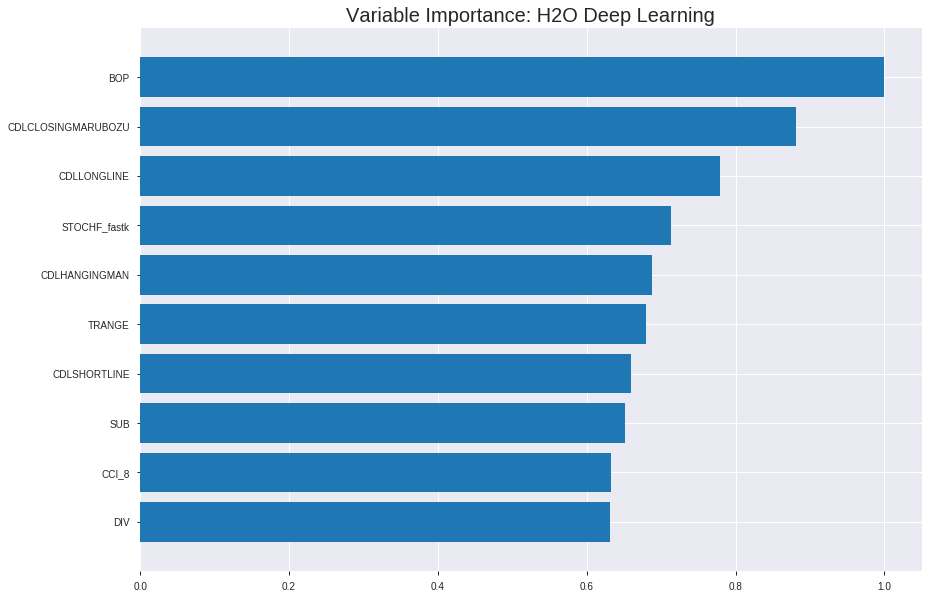

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20191208_075858_model_7


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.20135384851262558
RMSE: 0.4487246912223859
LogLoss: 0.5903606016121478
Mean Per-Class Error: 0.28767812878873933
AUC: 0.7815346211141869
pr_auc: 0.740134182517623
Gini: 0.5630692422283738
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.20577463449265607: 


,0,1,Error,Rate
0,1205.0,1136.0,0.4853,(1136.0/2341.0)
1,267.0,1711.0,0.135,(267.0/1978.0)
Total,1472.0,2847.0,0.3248,(1403.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2057746,0.7092228,293.0
max f2,0.0828668,0.8275713,355.0
max f0point5,0.4107264,0.6906077,200.0
max accuracy,0.3592351,0.7131280,223.0
max precision,0.9963222,1.0,0.0
max recall,0.0286486,1.0,386.0
max specificity,0.9963222,1.0,0.0
max absolute_mcc,0.3592351,0.4237798,223.0
max min_per_class_accuracy,0.3524751,0.7093023,227.0
max mean_per_class_accuracy,0.3592351,0.7123219,223.0


Gains/Lift Table: Avg response rate: 45.80 %, avg score: 35.97 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.9706378,2.0842679,2.0842679,0.9545455,0.9789938,0.9545455,0.9789938,0.0212336,0.0212336,108.4267856,108.4267856
,2,0.0201436,0.9468687,1.8788417,1.9827354,0.8604651,0.9588199,0.9080460,0.9690228,0.0187058,0.0399393,87.8841677,98.2735376
,3,0.0300996,0.9210348,2.1327392,2.0323520,0.9767442,0.9350759,0.9307692,0.9577942,0.0212336,0.0611729,113.2739201,103.2352026
,4,0.0400556,0.8903948,1.7772827,1.9689533,0.8139535,0.9056118,0.9017341,0.9448240,0.0176946,0.0788675,77.7282667,96.8953284
,5,0.0500116,0.8665668,1.9296212,1.9611233,0.8837209,0.8782450,0.8981481,0.9315699,0.0192113,0.0980789,92.9621182,96.1123282
,6,0.1000232,0.7296201,1.7892723,1.8751978,0.8194444,0.7999264,0.8587963,0.8657481,0.0894843,0.1875632,78.9272273,87.5197777
,7,0.1500347,0.6392902,1.7185101,1.8229685,0.7870370,0.6780625,0.8348765,0.8031863,0.0859454,0.2735086,71.8510092,82.2968549
,8,0.2000463,0.5726498,1.4758969,1.7362006,0.6759259,0.6025775,0.7951389,0.7530341,0.0738119,0.3473205,47.5896903,73.6200638
,9,0.3000695,0.4581900,1.4405158,1.6376390,0.6597222,0.5133791,0.75,0.6731491,0.1440849,0.4914055,44.0515813,63.7639029
,10,0.4000926,0.4152705,1.2737192,1.5466591,0.5833333,0.4363944,0.7083333,0.6139604,0.1274014,0.6188069,27.3719245,54.6659083




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.21158888538629864
RMSE: 0.45998791873950196
LogLoss: 0.6158897505749491
Mean Per-Class Error: 0.2973048545328406
AUC: 0.7673066219278323
pr_auc: 0.7186095554603508
Gini: 0.5346132438556646
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.17452183294286827: 


,0,1,Error,Rate
0,303.0,354.0,0.5388,(354.0/657.0)
1,65.0,512.0,0.1127,(65.0/577.0)
Total,368.0,866.0,0.3395,(419.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.1745218,0.7096327,309.0
max f2,0.1024586,0.8310831,346.0
max f0point5,0.4167478,0.6848218,190.0
max accuracy,0.3750164,0.7009724,210.0
max precision,0.9840689,1.0,0.0
max recall,0.0259440,1.0,390.0
max specificity,0.9840689,1.0,0.0
max absolute_mcc,0.2551963,0.4064817,267.0
max min_per_class_accuracy,0.3429538,0.6949740,228.0
max mean_per_class_accuracy,0.3007710,0.7026951,246.0


Gains/Lift Table: Avg response rate: 46.76 %, avg score: 35.61 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.9534710,1.6451140,1.6451140,0.7692308,0.9724056,0.7692308,0.9724056,0.0173310,0.0173310,64.5113985,64.5113985
,2,0.0202593,0.9322837,2.1386482,1.8820104,1.0,0.9430041,0.88,0.9582928,0.0207972,0.0381282,113.8648180,88.2010399
,3,0.0299838,0.9181827,1.7822068,1.8496417,0.8333333,0.9249603,0.8648649,0.9474823,0.0173310,0.0554593,78.2206817,84.9641669
,4,0.0405186,0.8892690,1.8096254,1.8392374,0.8461538,0.9049346,0.86,0.9364199,0.0190641,0.0745234,80.9625383,83.9237435
,5,0.0502431,0.8582674,2.1386482,1.8971879,1.0,0.8794617,0.8870968,0.9253957,0.0207972,0.0953206,113.8648180,89.7187902
,6,0.1004862,0.7037411,1.5867390,1.7419634,0.7419355,0.7767766,0.8145161,0.8510862,0.0797227,0.1750433,58.6738972,74.1963437
,7,0.1499190,0.6229661,1.6127511,1.6993583,0.7540984,0.6585032,0.7945946,0.7875858,0.0797227,0.2547660,61.2751087,69.9358284
,8,0.2001621,0.5594338,1.6212333,1.6797480,0.7580645,0.5904030,0.7854251,0.7380905,0.0814558,0.3362218,62.1233298,67.9747963
,9,0.2998379,0.4625491,1.4431528,1.6010961,0.6747967,0.5140835,0.7486486,0.6636233,0.1438475,0.4800693,44.3152837,60.1096070
,10,0.4003241,0.4058334,1.2073014,1.5022488,0.5645161,0.4335800,0.7024291,0.6058796,0.1213172,0.6013865,20.7301392,50.2248823



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 08:03:53,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-12-08 08:03:58,6.792 sec,708 obs/sec,0.9099329,1,3930.0,0.6396207,1.4521334,-0.6481004,0.7503915,0.6884373,1.8857662,0.3591109,0.6360326,1.4209690,-0.6249795,0.7482240,0.6942801,1.9741368,0.3338736
,2019-12-08 08:04:11,19.960 sec,1124 obs/sec,4.5686502,5,19732.0,0.5063350,0.7518056,-0.0327962,0.7705766,0.7246285,1.9850170,0.3297060,0.5057615,0.7496835,-0.0274974,0.7617459,0.7123692,2.1386482,0.3403566
,2019-12-08 08:04:23,32.070 sec,1246 obs/sec,8.2113915,9,35465.0,0.4487247,0.5903606,0.1888547,0.7815346,0.7401342,2.0842679,0.3248437,0.4599879,0.6158898,0.1500723,0.7673066,0.7186096,1.6451140,0.3395462
,2019-12-08 08:04:37,46.080 sec,1336 obs/sec,12.7640658,14,55128.0,0.4570441,0.6118075,0.1584986,0.7864501,0.7486240,2.1338933,0.3044686,0.4731525,0.6580585,0.1007274,0.7609954,0.7241389,1.9741368,0.3249595
,2019-12-08 08:04:51,59.682 sec,1394 obs/sec,17.3334105,19,74863.0,0.4265173,0.5378586,0.2671553,0.8046011,0.7678900,2.0842679,0.2852512,0.4591637,0.6187607,0.1531152,0.7409289,0.6939189,1.8096254,0.3452188
,2019-12-08 08:05:04,1 min 12.912 sec,1440 obs/sec,21.9131743,24,94643.0,0.4533780,0.6014155,0.1719441,0.8033250,0.7619011,2.1835187,0.2924288,0.4937517,0.7115304,0.0207212,0.7137269,0.6797333,1.8096254,0.3711507
,2019-12-08 08:05:17,1 min 25.979 sec,1479 obs/sec,26.4762677,29,114351.0,0.4108178,0.5031554,0.3201122,0.8277444,0.7926391,2.1835187,0.2706645,0.4671090,0.6563152,0.1235533,0.7294989,0.6889075,1.9741368,0.3500810
,2019-12-08 08:05:34,1 min 42.636 sec,1530 obs/sec,32.8573744,36,141911.0,0.4062790,0.4949716,0.3350524,0.8474595,0.8151683,2.1835187,0.2470479,0.4790295,0.6972331,0.0782490,0.7242363,0.6821865,1.8096254,0.3897893
,2019-12-08 08:05:35,1 min 43.846 sec,1530 obs/sec,32.8573744,36,141911.0,0.4487247,0.5903606,0.1888547,0.7815346,0.7401342,2.0842679,0.3248437,0.4599879,0.6158898,0.1500723,0.7673066,0.7186096,1.6451140,0.3395462


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0265849
CDLCLOSINGMARUBOZU,0.8809279,0.8809279,0.0234194
CDLLONGLINE,0.7787898,0.7787898,0.0207040
STOCHF_fastk,0.7138976,0.7138976,0.0189789
CDLHANGINGMAN,0.6877686,0.6877686,0.0182843
---,---,---,---
CMO_20,0.5556203,0.5556203,0.0147711
ROC_12,0.5503011,0.5503011,0.0146297
ROCR100_8,0.5483450,0.5483450,0.0145777
RSI_24,0.5463219,0.5463219,0.0145239



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7098865478119936)

('F1', 0.7388167388167387)

('auc', 0.7657022359647462)

('logloss', 0.6485760466513301)

('mean_per_class_error', 0.29073852043499304)

('rmse', 0.4715413836159298)

('mse', 0.22235127646242545)

deeplearning prediction progress: |███████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           0
4           1
...       ...
6165        1
6166        1
6167        1
6168        1
6169        1

[6170 rows x 1 columns]


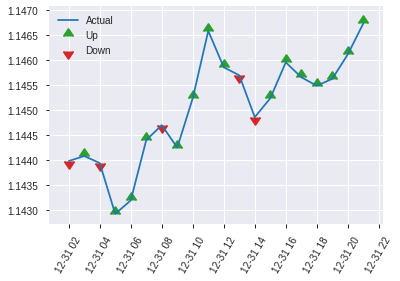


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.22235127646242545
RMSE: 0.4715413836159298
LogLoss: 0.6485760466513301
Mean Per-Class Error: 0.29073852043499304
AUC: 0.7657022359647462
pr_auc: 0.7390479790217085
Gini: 0.5314044719294924
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.27190166602926386: 


,0,1,Error,Rate
0,180.0,119.0,0.398,(119.0/299.0)
1,62.0,256.0,0.195,(62.0/318.0)
Total,242.0,375.0,0.2934,(181.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2719017,0.7388167,247.0
max f2,0.0830393,0.8595909,349.0
max f0point5,0.3434690,0.7169345,213.0
max accuracy,0.3434690,0.7098865,213.0
max precision,0.6214618,0.8585859,85.0
max recall,0.0316994,1.0,385.0
max specificity,0.9873330,0.9966555,0.0
max absolute_mcc,0.3196377,0.4190585,224.0
max min_per_class_accuracy,0.3661208,0.6989967,204.0
max mean_per_class_accuracy,0.3434690,0.7092615,213.0


Gains/Lift Table: Avg response rate: 51.54 %, avg score: 36.88 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.9463713,1.3858940,1.3858940,0.7142857,0.9671481,0.7142857,0.9671481,0.0157233,0.0157233,38.5893980,38.5893980
,2,0.0210697,0.9189884,0.9701258,1.1940010,0.5,0.9242896,0.6153846,0.9473672,0.0094340,0.0251572,-2.9874214,19.4000968
,3,0.0307942,0.8989737,1.6168763,1.3275405,0.8333333,0.9112164,0.6842105,0.9359512,0.0157233,0.0408805,61.6876310,32.7540549
,4,0.0405186,0.8718623,1.6168763,1.3969811,0.8333333,0.8819303,0.72,0.9229861,0.0157233,0.0566038,61.6876310,39.6981132
,5,0.0502431,0.8358083,1.9402516,1.5021302,1.0,0.8537815,0.7741935,0.9095917,0.0188679,0.0754717,94.0251572,50.2130250
,6,0.1004862,0.7306443,1.6898965,1.5960134,0.8709677,0.7941436,0.8225806,0.8518676,0.0849057,0.1603774,68.9896531,59.6013390
,7,0.1507293,0.6430678,1.7524853,1.6481707,0.9032258,0.6799807,0.8494624,0.7945720,0.0880503,0.2484277,75.2485291,64.8170690
,8,0.2009724,0.5693192,1.5647190,1.6273078,0.8064516,0.6012448,0.8387097,0.7462402,0.0786164,0.3270440,56.4719010,62.7307770
,9,0.2998379,0.4704132,1.2404887,1.4997620,0.6393443,0.5150469,0.7729730,0.6700089,0.1226415,0.4496855,24.0488710,49.9762026
,10,0.4003241,0.4302975,1.2517752,1.4375143,0.6451613,0.4437108,0.7408907,0.6132053,0.1257862,0.5754717,25.1775208,43.7514323


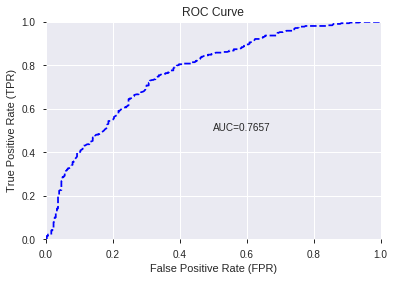

This function is available for GLM models only


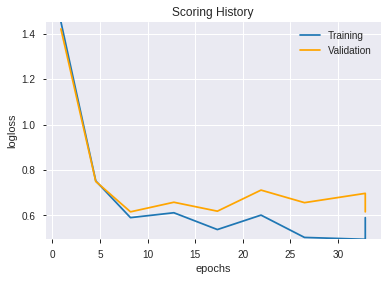

--2019-12-08 08:08:02--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.165.163
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.165.163|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


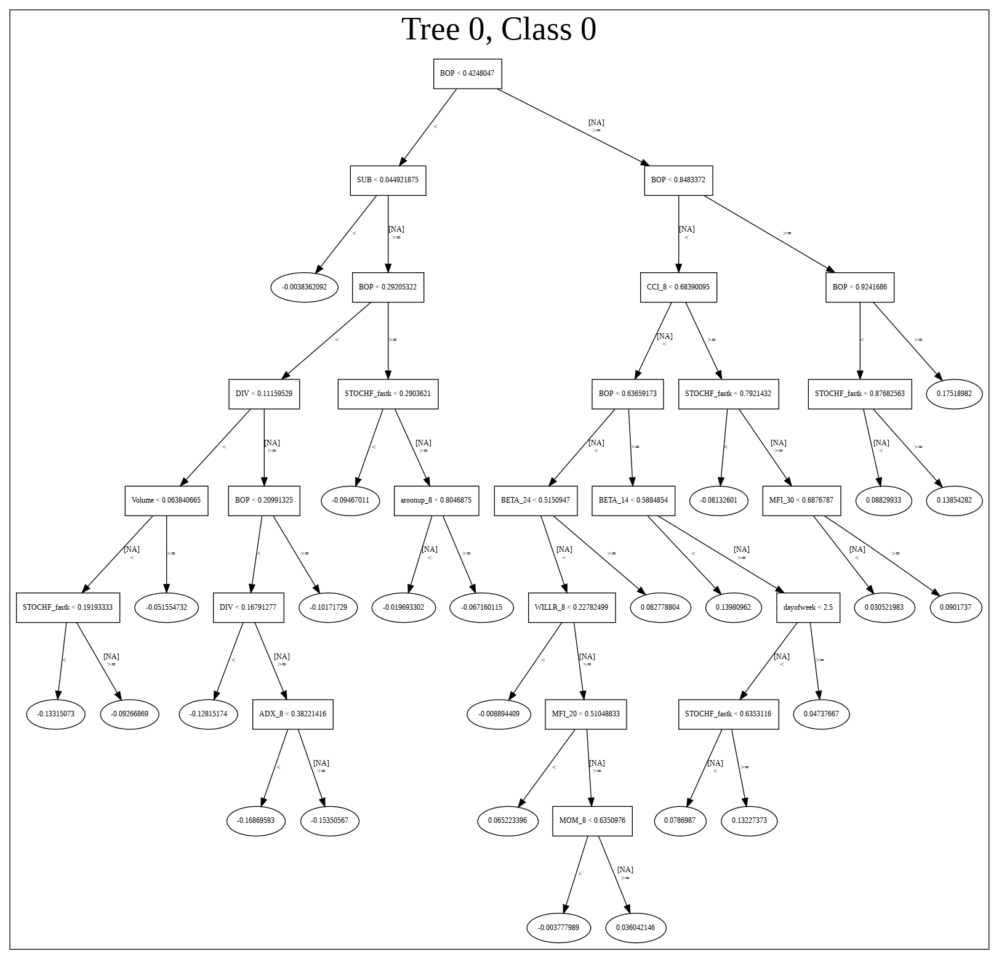

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20191208_075858_model_7',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20191208_075858_model_7',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_83_sid_afcd',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['BOP',
 'CDLCLOSINGMARUBOZU',
 'CDLLONGLINE',
 'STOCHF_fastk',
 'CDLHANGINGMAN',
 'TRANGE',
 'CDLSHORTLINE',
 'SUB',
 'CCI_8',
 'DIV',
 'WILLR_8',
 'CDLENGULFING',
 'ULTOSC',
 'STOCHRSI_fastk',
 'Volume',
 'CCI_14',
 'STOCHRSI_fastd',
 'CDLDRAGONFLYDOJI',
 'CDLHARAMI',
 'CDLTAKURI',
 'ADOSC',
 'CDLBELTHOLD',
 'CDLHAMMER',
 'CCI_20',
 'STOCHF_fastd',
 'CMO_12',
 'WILLR_30',
 'ROCR100_12',
 'ROCR100_14',
 'ROC_8',
 'WILLR_24',
 'MOM_14',
 'MINUS_DM_8',
 'ROCP_12',
 'ROC_14',
 'STOCH_slowk',
 'MOM_12',
 'RSI_30',
 'CMO_24',
 'WILLR_20',
 'RSI_14',
 'CMO_8',
 'ROCR_8',
 'ROCR_12',
 'CDLMARUBOZU',
 'CCI_12',
 'CMO_30',
 'RSI_8',
 'ROCP_14',
 'RSI_12',
 'RSI_20',
 'WILLR_14',
 'ROCR_14',
 'ROCP_8',
 'MOM_8',
 'CMO_14',
 'CCI_24',
 'CMO_20',
 'ROC_12',
 'ROCR100_8',
 'RSI_24',
 'WILLR_12']

In [84]:
# DeepLearning with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191208_080859_model_1,0.765981,0.58134,0.30307,0.44479,0.197838


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.805128,1.000000,0.116773
1,CCI_8,0.605371,0.751894,0.087801
2,STOCHF_fastk,0.534615,0.664013,0.077539
3,WILLR_8,0.491249,0.610151,0.071249
4,CCI_24,0.359676,0.446732,0.052166
...,...,...,...,...
57,DIV,0.007834,0.009730,0.001136
58,CMO_14,0.006863,0.008525,0.000995
59,WILLR_24,0.004158,0.005164,0.000603
60,ROCR_8,0.000508,0.000631,0.000074


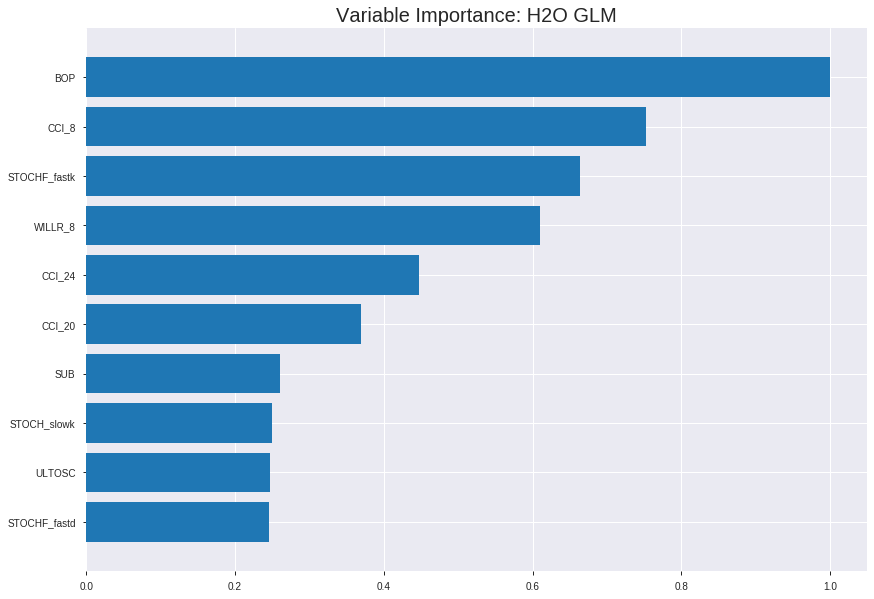

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191208_080859_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.19480726731081033
RMSE: 0.4413697625696739
LogLoss: 0.5724848358308738
Null degrees of freedom: 4318
Residual degrees of freedom: 4256
Null deviance: 5956.860179047515
Residual deviance: 4945.124011907088
AIC: 5071.124011907088
AUC: 0.768642379286202
pr_auc: 0.7210178164198747
Gini: 0.5372847585724041
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3390433654804397: 


,0,1,Error,Rate
0,1217.0,1124.0,0.4801,(1124.0/2341.0)
1,292.0,1686.0,0.1476,(292.0/1978.0)
Total,1509.0,2810.0,0.3279,(1416.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3390434,0.7042607,261.0
max f2,0.1764991,0.8203192,339.0
max f0point5,0.5255609,0.6831683,170.0
max accuracy,0.5255609,0.7054874,170.0
max precision,0.9617049,1.0,0.0
max recall,0.0344583,1.0,394.0
max specificity,0.9617049,1.0,0.0
max absolute_mcc,0.5255609,0.4038859,170.0
max min_per_class_accuracy,0.4715841,0.6966633,197.0
max mean_per_class_accuracy,0.4758803,0.7006060,195.0


Gains/Lift Table: Avg response rate: 45.80 %, avg score: 45.80 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.8882202,2.0346424,2.0346424,0.9318182,0.9078618,0.9318182,0.9078618,0.0207280,0.0207280,103.4642430,103.4642430
,2,0.0201436,0.8662976,1.6757237,1.8572458,0.7674419,0.8759227,0.8505747,0.8920758,0.0166835,0.0374115,67.5723658,85.7245796
,3,0.0300996,0.8538260,2.0311802,1.9147779,0.9302326,0.8601386,0.8769231,0.8815120,0.0202224,0.0576340,103.1180191,91.4777942
,4,0.0400556,0.8407189,1.7772827,1.8806028,0.8139535,0.8467434,0.8612717,0.8728701,0.0176946,0.0753286,77.7282667,88.0602816
,5,0.0500116,0.8261304,1.8788417,1.8802522,0.8604651,0.8335720,0.8611111,0.8650469,0.0187058,0.0940344,87.8841677,88.0252219
,6,0.1000232,0.7744311,1.7185101,1.7993812,0.7870370,0.7981538,0.8240741,0.8316003,0.0859454,0.1799798,71.8510092,79.9381156
,7,0.1500347,0.7301688,1.6275301,1.7420975,0.7453704,0.7515928,0.7978395,0.8049311,0.0813953,0.2613751,62.7530146,74.2097486
,8,0.2000463,0.6895009,1.5769857,1.7008195,0.7222222,0.7087850,0.7789352,0.7808946,0.0788675,0.3402427,57.6985732,70.0819547
,9,0.3000695,0.6090925,1.4506247,1.6174213,0.6643519,0.6488915,0.7407407,0.7368936,0.1450961,0.4853387,45.0624696,61.7421264
,10,0.4000926,0.5356300,1.2585559,1.5277049,0.5763889,0.5732688,0.6996528,0.6959874,0.1258847,0.6112235,25.8555921,52.7704928




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.19195903114444024
RMSE: 0.43813129441348997
LogLoss: 0.5652968199642592
Null degrees of freedom: 1233
Residual degrees of freedom: 1171
Null deviance: 1705.9557175251716
Residual deviance: 1395.1525516717916
AIC: 1521.1525516717916
AUC: 0.7776564342410358
pr_auc: 0.7314993658743578
Gini: 0.5553128684820716
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.29781101233817353: 


,0,1,Error,Rate
0,315.0,342.0,0.5205,(342.0/657.0)
1,62.0,515.0,0.1075,(62.0/577.0)
Total,377.0,857.0,0.3274,(404.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2978110,0.7182706,274.0
max f2,0.1798511,0.8358032,336.0
max f0point5,0.5204236,0.6979840,172.0
max accuracy,0.4755032,0.7155592,194.0
max precision,0.9371342,1.0,0.0
max recall,0.0864847,1.0,380.0
max specificity,0.9371342,1.0,0.0
max absolute_mcc,0.4755032,0.4293052,194.0
max min_per_class_accuracy,0.4681116,0.7092846,198.0
max mean_per_class_accuracy,0.4755032,0.7148335,194.0


Gains/Lift Table: Avg response rate: 46.76 %, avg score: 45.51 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.8902584,2.1386482,2.1386482,1.0,0.9092388,1.0,0.9092388,0.0225303,0.0225303,113.8648180,113.8648180
,2,0.0202593,0.8613264,1.6039861,1.8820104,0.75,0.8727412,0.88,0.8917199,0.0155979,0.0381282,60.3986135,88.2010399
,3,0.0299838,0.8478863,1.6039861,1.7918404,0.75,0.8540443,0.8378378,0.8795008,0.0155979,0.0537262,60.3986135,79.1840367
,4,0.0405186,0.8389790,1.4806026,1.7109185,0.6923077,0.8428450,0.8,0.8699703,0.0155979,0.0693241,48.0602586,71.0918544
,5,0.0502431,0.8225313,2.1386482,1.7937049,1.0,0.8283428,0.8387097,0.8619134,0.0207972,0.0901213,113.8648180,79.3704925
,6,0.1004862,0.7639000,1.7247163,1.7592106,0.8064516,0.7951891,0.8225806,0.8285512,0.0866551,0.1767764,72.4716274,75.9210600
,7,0.1499190,0.7214864,1.5776913,1.6993583,0.7377049,0.7413683,0.7945946,0.7998044,0.0779896,0.2547660,57.7691281,69.9358284
,8,0.2001621,0.6896116,1.6212333,1.6797480,0.7580645,0.7056973,0.7854251,0.7761824,0.0814558,0.3362218,62.1233298,67.9747963
,9,0.2998379,0.6071384,1.4779276,1.6126563,0.6910569,0.6469740,0.7540541,0.7332293,0.1473137,0.4835355,47.7927604,61.2656331
,10,0.4003241,0.5281830,1.2762900,1.5282243,0.5967742,0.5677397,0.7145749,0.6916894,0.1282496,0.6117851,27.6290043,52.8224307



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-08 08:08:59,0.000 sec,2,.2E2,63,1.3594931,1.3620917
,2019-12-08 08:08:59,0.026 sec,4,.12E2,63,1.3507922,1.3530319
,2019-12-08 08:08:59,0.053 sec,6,.76E1,63,1.3392616,1.3409764
,2019-12-08 08:08:59,0.081 sec,8,.47E1,63,1.3243731,1.3253533
,2019-12-08 08:08:59,0.108 sec,10,.29E1,63,1.3059052,1.3058656
---,---,---,---,---,---,---,---
,2019-12-08 08:09:00,0.524 sec,43,.55E-3,63,1.1450241,1.1306209
,2019-12-08 08:09:00,0.536 sec,44,.34E-3,63,1.1449697,1.1305936
,2019-12-08 08:09:00,0.548 sec,45,.21E-3,63,1.1449073,1.1306724
,2019-12-08 08:09:00,0.560 sec,46,.13E-3,63,1.1449043,1.1306703



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7179902755267423)

('F1', 0.7338129496402879)

('auc', 0.7659809427651921)

('logloss', 0.5813396225519472)

('mean_per_class_error', 0.28267705769756635)

('rmse', 0.44478954089061523)

('mse', 0.19783773568568427)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           0
4           1
...       ...
6165        1
6166        0
6167        1
6168        1
6169        1

[6170 rows x 1 columns]


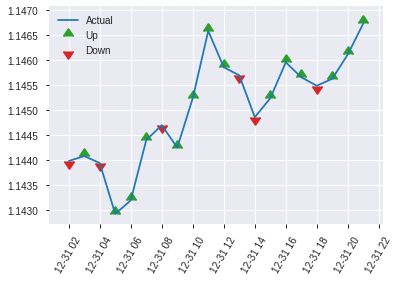


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.19783773568568427
RMSE: 0.44478954089061523
LogLoss: 0.5813396225519472
Null degrees of freedom: 616
Residual degrees of freedom: 554
Null deviance: 862.9188841257723
Residual deviance: 717.3730942291027
AIC: 843.3730942291027
AUC: 0.7659809427651921
pr_auc: 0.7623708078228635
Gini: 0.5319618855303843
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3978375715937785: 


,0,1,Error,Rate
0,177.0,122.0,0.408,(122.0/299.0)
1,63.0,255.0,0.1981,(63.0/318.0)
Total,240.0,377.0,0.2998,(185.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3978376,0.7338129,246.0
max f2,0.1665441,0.8539264,353.0
max f0point5,0.4665930,0.7244143,215.0
max accuracy,0.4665930,0.7179903,215.0
max precision,0.9423132,1.0,0.0
max recall,0.0533231,1.0,392.0
max specificity,0.9423132,1.0,0.0
max absolute_mcc,0.4665930,0.4351404,215.0
max min_per_class_accuracy,0.4851413,0.7056856,207.0
max mean_per_class_accuracy,0.4665930,0.7173229,215.0


Gains/Lift Table: Avg response rate: 51.54 %, avg score: 47.86 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.8908568,1.6630728,1.6630728,0.8571429,0.9131853,0.8571429,0.9131853,0.0188679,0.0188679,66.3072776,66.3072776
,2,0.0210697,0.8781754,1.6168763,1.6417513,0.8333333,0.8865688,0.8461538,0.9009008,0.0157233,0.0345912,61.6876310,64.1751330
,3,0.0307942,0.8650591,1.9402516,1.7360146,1.0,0.8718383,0.8947368,0.8917231,0.0188679,0.0534591,94.0251572,73.6014565
,4,0.0405186,0.8475196,1.9402516,1.7850314,1.0,0.8554339,0.92,0.8830137,0.0188679,0.0723270,94.0251572,78.5031447
,5,0.0502431,0.8389969,1.6168763,1.7524853,0.8333333,0.8436287,0.9032258,0.8753908,0.0157233,0.0880503,61.6876310,75.2485291
,6,0.1004862,0.7879866,1.7524853,1.7524853,0.9032258,0.8139798,0.9032258,0.8446853,0.0880503,0.1761006,75.2485291,75.2485291
,7,0.1507293,0.7514141,1.4395415,1.6481707,0.7419355,0.7688384,0.8494624,0.8194030,0.0723270,0.2484277,43.9541489,64.8170690
,8,0.2009724,0.7051046,1.4395415,1.5960134,0.7419355,0.7251317,0.8225806,0.7958352,0.0723270,0.3207547,43.9541489,59.6013390
,9,0.2998379,0.6412907,1.3677183,1.5207377,0.7049180,0.6752008,0.7837838,0.7560584,0.1352201,0.4559748,36.7718321,52.0737719
,10,0.4003241,0.5747274,1.2517752,1.4532249,0.6451613,0.6079973,0.7489879,0.7188933,0.1257862,0.5817610,25.1775208,45.3224862


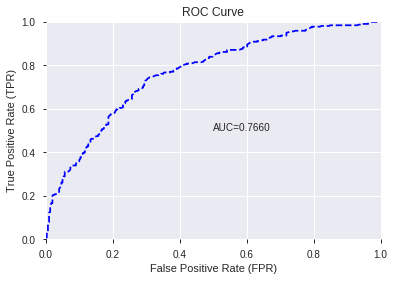

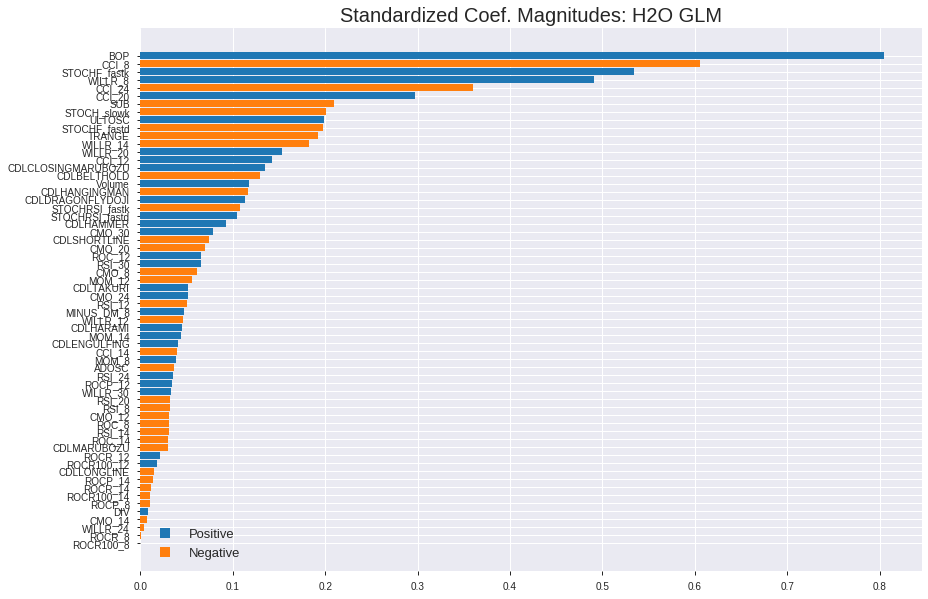

'log_likelihood'
--2019-12-08 08:09:09--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.96.91
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.96.91|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


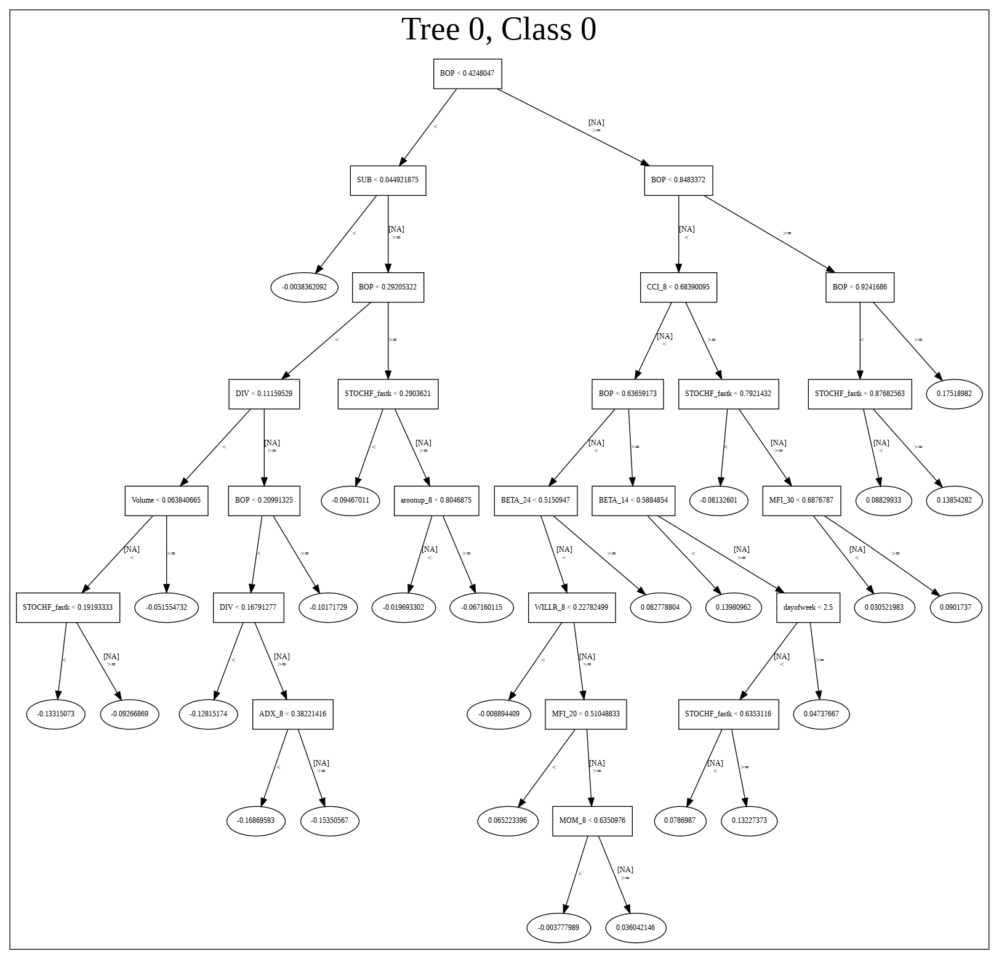

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191208_080859_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191208_080859_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_88_sid_afcd',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_88_s

['BOP',
 'CCI_8',
 'STOCHF_fastk',
 'WILLR_8',
 'CCI_24',
 'CCI_20',
 'SUB',
 'STOCH_slowk',
 'ULTOSC',
 'STOCHF_fastd',
 'TRANGE',
 'WILLR_14',
 'WILLR_20',
 'CCI_12',
 'CDLCLOSINGMARUBOZU',
 'CDLBELTHOLD',
 'Volume',
 'CDLHANGINGMAN',
 'CDLDRAGONFLYDOJI',
 'STOCHRSI_fastk',
 'STOCHRSI_fastd',
 'CDLHAMMER',
 'CMO_30',
 'CDLSHORTLINE',
 'CMO_20',
 'ROC_12',
 'RSI_30',
 'CMO_8',
 'MOM_12',
 'CDLTAKURI',
 'CMO_24',
 'RSI_12',
 'MINUS_DM_8',
 'WILLR_12',
 'CDLHARAMI',
 'MOM_14',
 'CDLENGULFING',
 'CCI_14',
 'MOM_8',
 'ADOSC',
 'RSI_24',
 'ROCP_12',
 'WILLR_30',
 'RSI_20',
 'RSI_8',
 'CMO_12',
 'ROC_8',
 'RSI_14',
 'ROC_14',
 'CDLMARUBOZU',
 'ROCR_12',
 'ROCR100_12',
 'CDLLONGLINE',
 'ROCP_14',
 'ROCR_14',
 'ROCR100_14',
 'ROCP_8',
 'DIV',
 'CMO_14',
 'WILLR_24',
 'ROCR_8',
 'ROCR100_8']

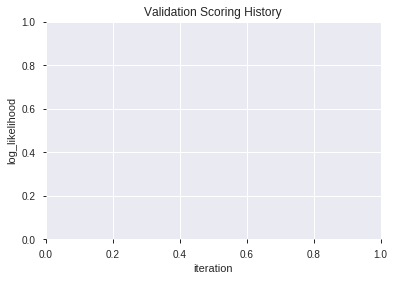

In [85]:
# GLM with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20191208_081006_model_2,0.778780,0.571746,0.315328,0.440454,0.193999
1,XGBoost_2_AutoML_20191208_081006,0.777156,0.575296,0.327034,0.441674,0.195076
2,XGBoost_grid_1_AutoML_20191208_081006_model_3,0.776914,0.576305,0.287347,0.442800,0.196072
3,XGBoost_grid_1_AutoML_20191208_081006_model_6,0.776735,0.575596,0.318772,0.442387,0.195706
4,XGBoost_grid_1_AutoML_20191208_081006_model_4,0.774931,0.575634,0.330178,0.442557,0.195857
5,XGBoost_grid_1_AutoML_20191208_081006_model_1,0.771718,0.578314,0.322117,0.443906,0.197052
6,XGBoost_3_AutoML_20191208_081006,0.771392,0.580529,0.321417,0.444682,0.197742
7,XGBoost_1_AutoML_20191208_081006,0.767927,0.583684,0.330278,0.445984,0.198902
8,XGBoost_grid_1_AutoML_20191208_081006_model_7,0.767811,0.585158,0.310185,0.446450,0.199317
9,XGBoost_grid_1_AutoML_20191208_081006_model_5,0.759518,0.599958,0.337267,0.452853,0.205076


,variable,relative_importance,scaled_importance,percentage
0,BOP,6266.770996,1.000000,0.382983
1,STOCHF_fastk,1045.852173,0.166889,0.063915
2,CCI_8,818.020447,0.130533,0.049992
3,TRANGE,582.318298,0.092922,0.035587
4,Volume,482.622131,0.077013,0.029495
5,DIV,409.279541,0.065309,0.025012
6,STOCHRSI_fastd,387.563812,0.061844,0.023685
7,WILLR_8,379.441162,0.060548,0.023189
8,ULTOSC,362.382568,0.057826,0.022146
9,ADOSC,359.328430,0.057339,0.021960


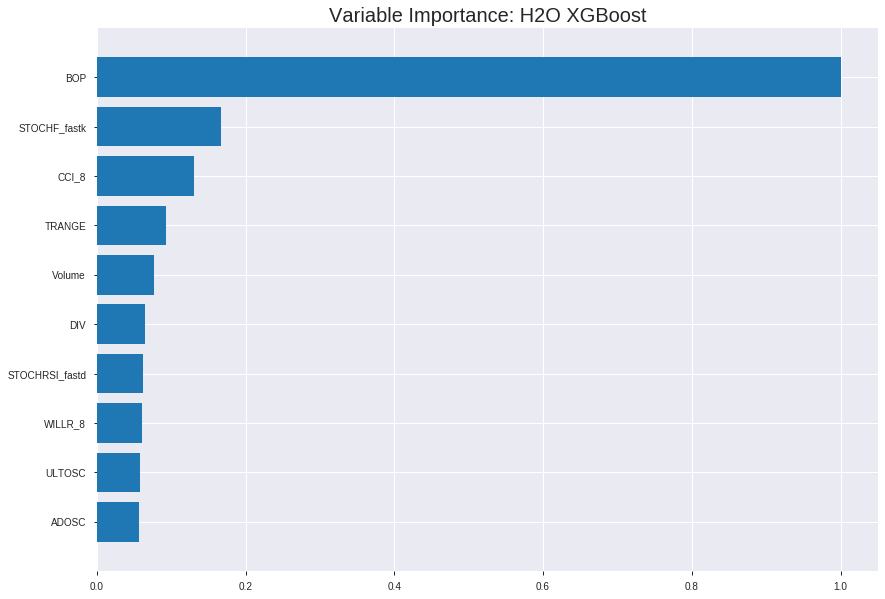

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20191208_081006_model_2


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.16634056768236735
RMSE: 0.4078487068538619
LogLoss: 0.5067184062373055
Mean Per-Class Error: 0.2421208258809311
AUC: 0.8455454467316474
pr_auc: 0.8255113163595293
Gini: 0.6910908934632949
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.43965950939390397: 


,0,1,Error,Rate
0,1616.0,725.0,0.3097,(725.0/2341.0)
1,357.0,1621.0,0.1805,(357.0/1978.0)
Total,1973.0,2346.0,0.2505,(1082.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4396595,0.7497687,217.0
max f2,0.2749611,0.8471205,296.0
max f0point5,0.5885008,0.7617038,140.0
max accuracy,0.5479057,0.7636027,162.0
max precision,0.8962183,1.0,0.0
max recall,0.1025046,1.0,385.0
max specificity,0.8962183,1.0,0.0
max absolute_mcc,0.5479057,0.5227351,162.0
max min_per_class_accuracy,0.4915955,0.7552328,192.0
max mean_per_class_accuracy,0.4672104,0.7578792,205.0


Gains/Lift Table: Avg response rate: 45.80 %, avg score: 45.87 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.8540132,2.1835187,2.1835187,1.0,0.8694602,1.0,0.8694602,0.0222447,0.0222447,118.3518706,118.3518706
,2,0.0201436,0.8386173,2.1327392,2.1584208,0.9767442,0.8461655,0.9885057,0.8579467,0.0212336,0.0434783,113.2739201,115.8420790
,3,0.0300996,0.8186869,2.1835187,2.1667224,1.0,0.8287007,0.9923077,0.8482730,0.0217391,0.0652174,118.3518706,116.6722408
,4,0.0400556,0.8038687,2.1835187,2.1708972,1.0,0.8111114,0.9942197,0.8390363,0.0217391,0.0869565,118.3518706,117.0897210
,5,0.0500116,0.7935809,1.9804007,2.1329743,0.9069767,0.7981048,0.9768519,0.8308879,0.0197169,0.1066734,98.0400687,113.2974291
,6,0.1000232,0.7460868,1.9813410,2.0571577,0.9074074,0.7684748,0.9421296,0.7996814,0.0990900,0.2057634,98.1341048,105.7157670
,7,0.1500347,0.7109493,1.9813410,2.0318855,0.9074074,0.7298220,0.9305556,0.7763949,0.0990900,0.3048534,98.1341048,103.1885462
,8,0.2000463,0.6748886,1.7892723,1.9712322,0.8194444,0.6941596,0.9027778,0.7558361,0.0894843,0.3943377,78.9272273,97.1232165
,9,0.3000695,0.6128250,1.5112780,1.8179141,0.6921296,0.6439071,0.8325617,0.7185264,0.1511628,0.5455005,51.1277993,81.7914108
,10,0.4000926,0.5474033,1.3242637,1.6945015,0.6064815,0.5801587,0.7760417,0.6839345,0.1324570,0.6779575,32.4263660,69.4501496




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.19162713462316358
RMSE: 0.43775236678190965
LogLoss: 0.5649040851085999
Mean Per-Class Error: 0.28667278660156326
AUC: 0.7804592061494794
pr_auc: 0.7451452137461015
Gini: 0.5609184122989588
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.38723871608575183: 


,0,1,Error,Rate
0,381.0,276.0,0.4201,(276.0/657.0)
1,105.0,472.0,0.182,(105.0/577.0)
Total,486.0,748.0,0.3088,(381.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3872387,0.7124528,242.0
max f2,0.1757404,0.8335801,350.0
max f0point5,0.5767052,0.7085278,144.0
max accuracy,0.5633159,0.7155592,152.0
max precision,0.8898859,1.0,0.0
max recall,0.1162044,1.0,383.0
max specificity,0.8898859,1.0,0.0
max absolute_mcc,0.5633159,0.4284042,152.0
max min_per_class_accuracy,0.4951437,0.7088388,191.0
max mean_per_class_accuracy,0.4517754,0.7133272,211.0


Gains/Lift Table: Avg response rate: 46.76 %, avg score: 45.92 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.8569396,2.1386482,2.1386482,1.0,0.8680383,1.0,0.8680383,0.0225303,0.0225303,113.8648180,113.8648180
,2,0.0202593,0.8300394,1.6039861,1.8820104,0.75,0.8439244,0.88,0.8564636,0.0155979,0.0381282,60.3986135,88.2010399
,3,0.0299838,0.8098298,2.1386482,1.9652443,1.0,0.8212624,0.9189189,0.8450470,0.0207972,0.0589255,113.8648180,96.5244274
,4,0.0405186,0.7871200,1.8096254,1.9247834,0.8461538,0.7970900,0.9,0.8325782,0.0190641,0.0779896,80.9625383,92.4783362
,5,0.0502431,0.7750444,1.7822068,1.8971879,0.8333333,0.7815642,0.8870968,0.8227045,0.0173310,0.0953206,78.2206817,89.7187902
,6,0.1004862,0.7316585,1.7937049,1.8454464,0.8387097,0.7543561,0.8629032,0.7885303,0.0901213,0.1854419,79.3704925,84.5446414
,7,0.1499190,0.6971712,1.5776913,1.7571596,0.7377049,0.7132967,0.8216216,0.7637236,0.0779896,0.2634315,57.7691281,75.7159586
,8,0.2001621,0.6683336,1.5867390,1.7143819,0.7419355,0.6811465,0.8016194,0.7429957,0.0797227,0.3431542,58.6738972,71.4381942
,9,0.2998379,0.6133076,1.4605402,1.6299967,0.6829268,0.6404896,0.7621622,0.7089194,0.1455806,0.4887348,46.0540221,62.9996721
,10,0.4003241,0.5514381,1.3107844,1.5498705,0.6129032,0.5817023,0.7246964,0.6769863,0.1317158,0.6204506,31.0784369,54.9870544



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 08:10:15,1.162 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5420236,0.5,0.6931472,0.5,0.0,1.0,0.5324149
,2019-12-08 08:10:15,1.238 sec,5.0,0.4793189,0.6524425,0.7857977,0.6734447,1.8813966,0.2972910,0.4817095,0.6570538,0.7577785,0.6498825,1.8402322,0.3290113
,2019-12-08 08:10:15,1.288 sec,10.0,0.4648490,0.6243001,0.7905252,0.7423249,2.0155557,0.2773790,0.4694536,0.6330044,0.7603848,0.7069870,2.0317158,0.3257699
,2019-12-08 08:10:15,1.343 sec,15.0,0.4545938,0.6041670,0.7980961,0.7426260,2.0842679,0.2903450,0.4610419,0.6162246,0.7662554,0.7034640,2.1386482,0.3233387
,2019-12-08 08:10:15,1.400 sec,20.0,0.4467610,0.5884946,0.8014022,0.7579153,1.9894282,0.2887242,0.4554782,0.6047793,0.7663728,0.7254802,2.1386482,0.3192869
,2019-12-08 08:10:15,1.459 sec,25.0,0.4405047,0.5757253,0.8050902,0.7669151,2.0346424,0.2924288,0.4510864,0.5954864,0.7684066,0.7303714,2.1386482,0.3200972
,2019-12-08 08:10:15,1.528 sec,30.0,0.4353377,0.5650402,0.8095011,0.7752495,2.0842679,0.2908081,0.4480474,0.5888813,0.7698535,0.7317141,2.1386482,0.3290113
,2019-12-08 08:10:15,1.590 sec,35.0,0.4312318,0.5563675,0.8140155,0.7826154,2.1338933,0.2806205,0.4457736,0.5837960,0.7716776,0.7351807,2.1386482,0.3298217
,2019-12-08 08:10:15,1.653 sec,40.0,0.4276896,0.5488716,0.8180745,0.7879571,2.1338933,0.2831674,0.4441790,0.5800464,0.7729333,0.7372723,2.1386482,0.3095624
,2019-12-08 08:10:15,1.724 sec,45.0,0.4246716,0.5423382,0.8217273,0.7939742,2.1338933,0.2773790,0.4425931,0.5764258,0.7753470,0.7397873,2.1386482,0.3128039


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,6266.7709961,1.0,0.3829831
STOCHF_fastk,1045.8521729,0.1668885,0.0639155
CCI_8,818.0204468,0.1305330,0.0499919
TRANGE,582.3182983,0.0929216,0.0355874
Volume,482.6221313,0.0770129,0.0294946
---,---,---,---
CDLHARAMI,9.8874569,0.0015778,0.0006043
RSI_20,7.9015679,0.0012609,0.0004829
ROCP_12,6.9202194,0.0011043,0.0004229
CDLMARUBOZU,5.8410616,0.0009321,0.0003570



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7212317666126418)

('F1', 0.755784061696658)

('auc', 0.7787804211101996)

('logloss', 0.5717464779942262)

('mean_per_class_error', 0.27813361098841005)

('rmse', 0.44045357590682616)

('mse', 0.19399935252911027)

xgboost prediction progress: |████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
6165        1
6166        0
6167        1
6168        1
6169        1

[6170 rows x 1 columns]


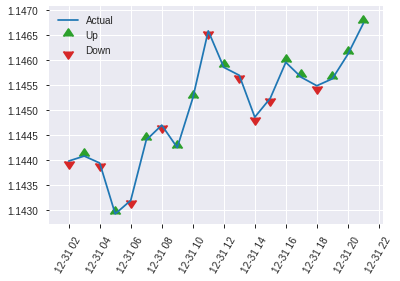


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.19399935252911027
RMSE: 0.44045357590682616
LogLoss: 0.5717464779942262
Mean Per-Class Error: 0.27813361098841005
AUC: 0.7787804211101996
pr_auc: 0.7571004977540221
Gini: 0.5575608422203993
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.26579999923706055: 


,0,1,Error,Rate
0,133.0,166.0,0.5552,(166.0/299.0)
1,24.0,294.0,0.0755,(24.0/318.0)
Total,157.0,460.0,0.3079,(190.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2658000,0.7557841,303.0
max f2,0.2438119,0.8570615,317.0
max f0point5,0.5031832,0.7345191,192.0
max accuracy,0.5031832,0.7212318,192.0
max precision,0.8800477,1.0,0.0
max recall,0.0707616,1.0,398.0
max specificity,0.8800477,1.0,0.0
max absolute_mcc,0.5031832,0.4436908,192.0
max min_per_class_accuracy,0.4891826,0.7106918,198.0
max mean_per_class_accuracy,0.5031832,0.7218664,192.0


Gains/Lift Table: Avg response rate: 51.54 %, avg score: 46.78 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.8480698,1.3858940,1.3858940,0.7142857,0.8612823,0.7142857,0.8612823,0.0157233,0.0157233,38.5893980,38.5893980
,2,0.0210697,0.8294601,1.6168763,1.4925012,0.8333333,0.8403097,0.7692308,0.8516027,0.0157233,0.0314465,61.6876310,49.2501209
,3,0.0307942,0.8124295,1.9402516,1.6338961,1.0,0.8231257,0.8421053,0.8426100,0.0188679,0.0503145,94.0251572,63.3896061
,4,0.0405186,0.7990184,1.6168763,1.6298113,0.8333333,0.8069187,0.84,0.8340440,0.0157233,0.0660377,61.6876310,62.9811321
,5,0.0502431,0.7915415,1.6168763,1.6273078,0.8333333,0.7954689,0.8387097,0.8265779,0.0157233,0.0817610,61.6876310,62.7307770
,6,0.1004862,0.7431186,1.6898965,1.6586022,0.8709677,0.7689631,0.8548387,0.7977705,0.0849057,0.1666667,68.9896531,65.8602151
,7,0.1507293,0.7065953,1.4395415,1.5855819,0.7419355,0.7218527,0.8172043,0.7724646,0.0723270,0.2389937,43.9541489,58.5581930
,8,0.2009724,0.6816664,1.5647190,1.5803662,0.8064516,0.6955380,0.8145161,0.7532329,0.0786164,0.3176101,56.4719010,58.0366200
,9,0.2998379,0.6119218,1.4313331,1.5312256,0.7377049,0.6467580,0.7891892,0.7181250,0.1415094,0.4591195,43.1333127,53.1225565
,10,0.4003241,0.5599145,1.2830696,1.4689354,0.6612903,0.5858849,0.7570850,0.6849311,0.1289308,0.5880503,28.3069588,46.8935401


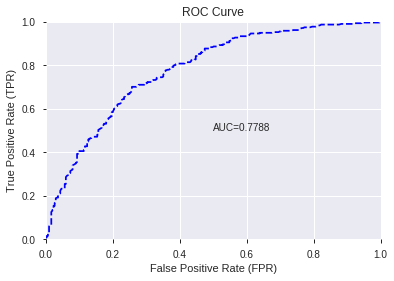

This function is available for GLM models only


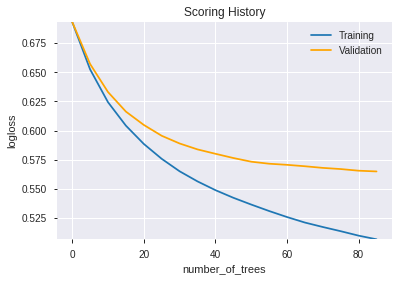

--2019-12-08 08:10:37--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.39.76
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.39.76|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.

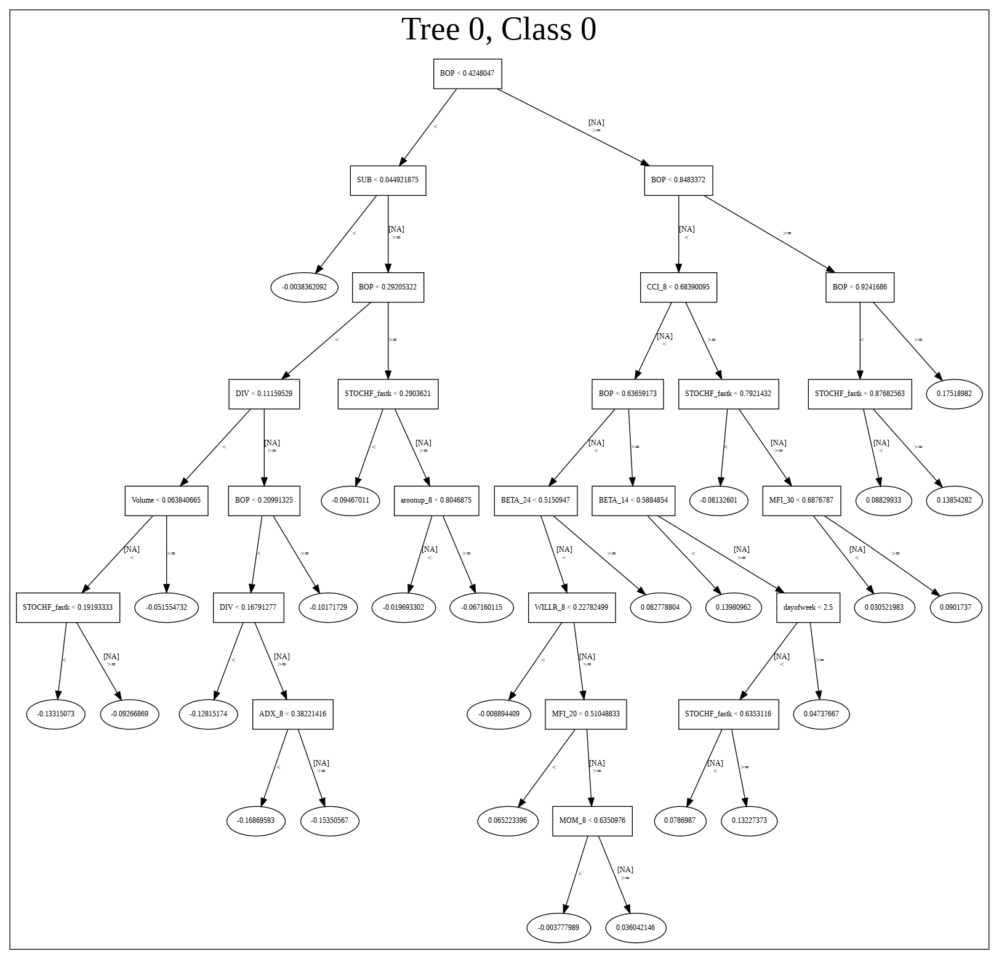

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20191208_081006_model_2',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20191208_081006_model_2',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_93_sid_afcd',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

['BOP',
 'STOCHF_fastk',
 'CCI_8',
 'TRANGE',
 'Volume',
 'DIV',
 'STOCHRSI_fastd',
 'WILLR_8',
 'ULTOSC',
 'ADOSC',
 'CCI_12',
 'SUB',
 'STOCHRSI_fastk',
 'MINUS_DM_8',
 'CCI_14',
 'CCI_24',
 'CDLDRAGONFLYDOJI',
 'WILLR_12',
 'MOM_8',
 'CMO_30',
 'ROC_8',
 'CDLHAMMER',
 'STOCH_slowk',
 'CCI_20',
 'CMO_8',
 'CDLCLOSINGMARUBOZU',
 'WILLR_30',
 'WILLR_20',
 'CMO_20',
 'CMO_12',
 'CMO_24',
 'MOM_14',
 'WILLR_24',
 'MOM_12',
 'ROC_14',
 'WILLR_14',
 'ROC_12',
 'CMO_14',
 'CDLTAKURI',
 'CDLHANGINGMAN',
 'CDLBELTHOLD',
 'STOCHF_fastd',
 'CDLENGULFING',
 'RSI_30',
 'CDLSHORTLINE',
 'CDLLONGLINE',
 'ROCP_14',
 'RSI_24',
 'RSI_12',
 'ROCP_8',
 'CDLHARAMI',
 'RSI_20',
 'ROCP_12',
 'CDLMARUBOZU',
 'RSI_8']

In [86]:
# XGBoost with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="XGBoost",features_list=features_list)

In [87]:
# DRF with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="DRF",features_list=features_list)

Output hidden; open in https://colab.research.google.com to view.

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GBM_5_AutoML_20191208_081247,0.779932,0.570266,0.324662,0.440145,0.193727
1,GBM_grid_1_AutoML_20191208_081247_model_2,0.772423,0.611641,0.314429,0.459104,0.210776
2,GBM_grid_1_AutoML_20191208_081247_model_1,0.768232,0.611209,0.304569,0.459060,0.210736
3,GBM_grid_1_AutoML_20191208_081247_model_4,0.768147,0.649717,0.295335,0.478159,0.228636
4,GBM_2_AutoML_20191208_081247,0.765250,0.586024,0.317373,0.447688,0.200425
5,GBM_1_AutoML_20191208_081247,0.763851,0.587674,0.325635,0.448060,0.200758
6,GBM_4_AutoML_20191208_081247,0.761795,0.588818,0.312357,0.449754,0.202278
7,GBM_grid_1_AutoML_20191208_081247_model_5,0.754990,0.693295,0.314828,0.500086,0.250086
8,GBM_3_AutoML_20191208_081247,0.753050,0.601706,0.311258,0.454126,0.206231
9,GBM_grid_1_AutoML_20191208_081247_model_3,0.693018,0.782132,0.392151,0.505700,0.255733


,variable,relative_importance,scaled_importance,percentage
0,BOP,769.365173,1.000000,0.368044
1,STOCHF_fastk,151.709900,0.197188,0.072574
2,CCI_8,102.729668,0.133525,0.049143
3,SUB,57.391434,0.074596,0.027455
4,WILLR_8,56.991657,0.074076,0.027263
...,...,...,...,...
57,CDLENGULFING,0.000000,0.000000,0.000000
58,CDLHANGINGMAN,0.000000,0.000000,0.000000
59,CDLHARAMI,0.000000,0.000000,0.000000
60,CDLMARUBOZU,0.000000,0.000000,0.000000


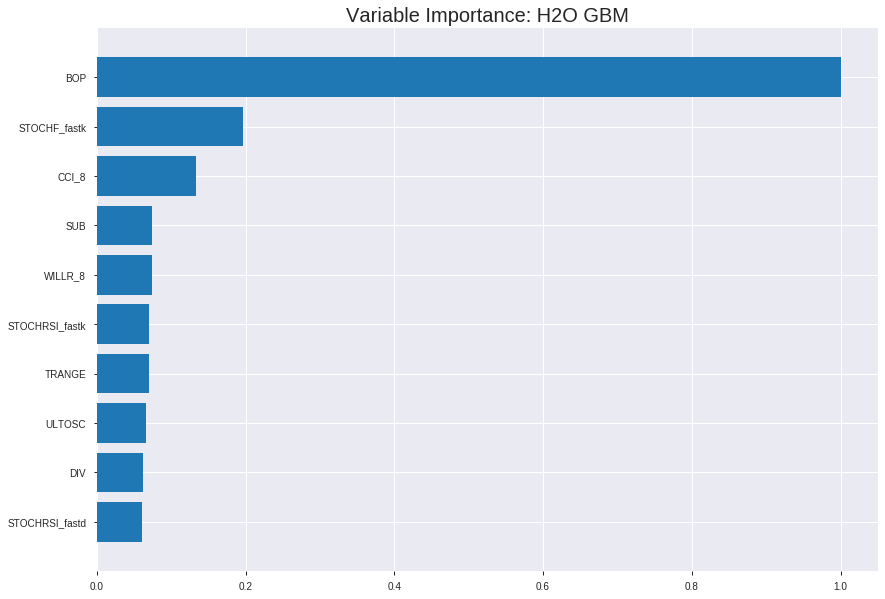

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_5_AutoML_20191208_081247


ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.15498306026571826
RMSE: 0.39367887962871245
LogLoss: 0.4785493731143037
Mean Per-Class Error: 0.22106315562602552
AUC: 0.8660190545379784
pr_auc: 0.843924850738493
Gini: 0.7320381090759569
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.41898728575397004: 


,0,1,Error,Rate
0,1644.0,697.0,0.2977,(697.0/2341.0)
1,315.0,1663.0,0.1593,(315.0/1978.0)
Total,1959.0,2360.0,0.2343,(1012.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4189873,0.7667128,221.0
max f2,0.2748213,0.8575714,288.0
max f0point5,0.5903257,0.7795563,145.0
max accuracy,0.5248066,0.7835147,175.0
max precision,0.9195413,1.0,0.0
max recall,0.0950911,1.0,377.0
max specificity,0.9195413,1.0,0.0
max absolute_mcc,0.5248066,0.5627741,175.0
max min_per_class_accuracy,0.4817118,0.7745197,194.0
max mean_per_class_accuracy,0.5248066,0.7789368,175.0


Gains/Lift Table: Avg response rate: 45.80 %, avg score: 45.80 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.8855002,2.0842679,2.0842679,0.9545455,0.8964696,0.9545455,0.8964696,0.0212336,0.0212336,108.4267856,108.4267856
,2,0.0201436,0.8678484,2.1835187,2.1333229,1.0,0.8754110,0.9770115,0.8860613,0.0217391,0.0429727,118.3518706,113.3322873
,3,0.0300996,0.8541294,2.1327392,2.1331298,0.9767442,0.8612224,0.9769231,0.8778454,0.0212336,0.0642063,113.2739201,113.3129813
,4,0.0400556,0.8419436,2.0311802,2.1077897,0.9302326,0.8489591,0.9653179,0.8706656,0.0202224,0.0844287,103.1180191,110.7789733
,5,0.0500116,0.8315047,2.1835187,2.1228654,1.0,0.8365801,0.9722222,0.8638800,0.0217391,0.1061678,118.3518706,112.2865408
,6,0.1000232,0.7842429,2.0622121,2.0925388,0.9444444,0.8058462,0.9583333,0.8348631,0.1031345,0.2093023,106.2212111,109.2538760
,7,0.1500347,0.7427622,1.9914499,2.0588425,0.9120370,0.7642849,0.9429012,0.8113370,0.0995956,0.3088979,99.1449931,105.8842483
,8,0.2000463,0.7017224,1.7791634,1.9889227,0.8148148,0.7218454,0.9108796,0.7889641,0.0889788,0.3978766,77.9163390,98.8922710
,9,0.3000695,0.6253347,1.6426935,1.8735130,0.7523148,0.6633961,0.8580247,0.7471081,0.1643074,0.5621840,64.2693471,87.3512964
,10,0.4000926,0.5441454,1.3444814,1.7412551,0.6157407,0.5847144,0.7974537,0.7065097,0.1344793,0.6966633,34.4481425,74.1255079




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.19084419718813964
RMSE: 0.4368571816831442
LogLoss: 0.5627564015436632
Mean Per-Class Error: 0.28842171627243207
AUC: 0.7805211968693367
pr_auc: 0.7493120919699268
Gini: 0.5610423937386735
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.34527325159646577: 


,0,1,Error,Rate
0,346.0,311.0,0.4734,(311.0/657.0)
1,89.0,488.0,0.1542,(89.0/577.0)
Total,435.0,799.0,0.3241,(400.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3452733,0.7093023,261.0
max f2,0.1968316,0.8313289,335.0
max f0point5,0.5641829,0.7051546,158.0
max accuracy,0.5422477,0.7163695,168.0
max precision,0.9204730,1.0,0.0
max recall,0.0792525,1.0,391.0
max specificity,0.9204730,1.0,0.0
max absolute_mcc,0.5422477,0.4290888,168.0
max min_per_class_accuracy,0.4815534,0.7053726,200.0
max mean_per_class_accuracy,0.4879339,0.7115783,196.0


Gains/Lift Table: Avg response rate: 46.76 %, avg score: 46.06 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.8842703,1.9741368,1.9741368,0.9230769,0.8948215,0.9230769,0.8948215,0.0207972,0.0207972,97.4136782,97.4136782
,2,0.0202593,0.8597158,1.7822068,1.8820104,0.8333333,0.8702185,0.88,0.8830120,0.0173310,0.0381282,78.2206817,88.2010399
,3,0.0299838,0.8457511,1.9604275,1.9074430,0.9166667,0.8541860,0.8918919,0.8736631,0.0190641,0.0571924,96.0427499,90.7442972
,4,0.0405186,0.8301167,1.8096254,1.8820104,0.8461538,0.8373047,0.88,0.8642099,0.0190641,0.0762565,80.9625383,88.2010399
,5,0.0502431,0.8185548,2.1386482,1.9316822,1.0,0.8238258,0.9032258,0.8563936,0.0207972,0.0970537,113.8648180,93.1682227
,6,0.1004862,0.7672478,1.7592106,1.8454464,0.8225806,0.7857191,0.8629032,0.8210564,0.0883882,0.1854419,75.9210600,84.5446414
,7,0.1499190,0.7244461,1.6828707,1.7918404,0.7868852,0.7454843,0.8378378,0.7961380,0.0831889,0.2686308,68.2870699,79.1840367
,8,0.2001621,0.6965074,1.5867390,1.7403574,0.7419355,0.7098627,0.8137652,0.7744818,0.0797227,0.3483536,58.6738972,74.0357426
,9,0.2998379,0.6286613,1.4257655,1.6357769,0.6666667,0.6651339,0.7648649,0.7381311,0.1421144,0.4904679,42.5765453,63.5776851
,10,0.4003241,0.5442437,1.2935372,1.5498705,0.6048387,0.5843507,0.7246964,0.6995303,0.1299827,0.6204506,29.3537206,54.9870544



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 08:12:54,0.002 sec,0.0,0.4982309,0.6896110,0.5,0.0,1.0,0.5420236,0.4990407,0.6912300,0.5,0.0,1.0,0.5324149
,2019-12-08 08:12:54,0.110 sec,5.0,0.4607583,0.6158237,0.7894161,0.7435310,2.0217766,0.3090993,0.4657845,0.6254590,0.7687073,0.7246960,1.9858876,0.3314425
,2019-12-08 08:12:54,0.230 sec,10.0,0.4426980,0.5794877,0.8006521,0.7635428,1.9461797,0.2921973,0.4521529,0.5977033,0.7705275,0.7326329,1.9741368,0.3427877
,2019-12-08 08:12:54,0.342 sec,15.0,0.4310758,0.5552037,0.8121879,0.7764944,2.0411153,0.2901135,0.4457154,0.5836122,0.7726853,0.7341823,2.1386482,0.3014587
,2019-12-08 08:12:54,0.460 sec,20.0,0.4225795,0.5371656,0.8224307,0.7909269,2.0346424,0.2808520,0.4418203,0.5744165,0.7752414,0.7397830,1.9741368,0.3014587
,2019-12-08 08:12:54,0.583 sec,25.0,0.4157353,0.5227776,0.8326004,0.8047484,2.0346424,0.2829359,0.4398870,0.5700736,0.7766949,0.7435763,2.1386482,0.2917342
,2019-12-08 08:12:54,0.714 sec,30.0,0.4094117,0.5097719,0.8420142,0.8159777,2.1338933,0.2667284,0.4376957,0.5653770,0.7803392,0.7465316,2.1386482,0.2982172
,2019-12-08 08:12:54,0.843 sec,35.0,0.4034519,0.4979533,0.8516553,0.8272229,2.1338933,0.2558463,0.4371864,0.5639894,0.7805555,0.7480917,2.1386482,0.2982172
,2019-12-08 08:12:55,0.981 sec,40.0,0.3983810,0.4877480,0.8589769,0.8357952,2.1338933,0.2514471,0.4373194,0.5641631,0.7796837,0.7477591,2.1386482,0.3176661
,2019-12-08 08:12:55,1.107 sec,45.0,0.3936789,0.4785494,0.8660191,0.8439249,2.0842679,0.2343135,0.4368572,0.5627564,0.7805212,0.7493121,1.9741368,0.3241491


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,769.3651733,1.0,0.3680439
STOCHF_fastk,151.7098999,0.1971884,0.0725740
CCI_8,102.7296677,0.1335252,0.0491432
SUB,57.3914337,0.0745958,0.0274545
WILLR_8,56.9916573,0.0740762,0.0272633
---,---,---,---
CDLENGULFING,0.0,0.0,0.0
CDLHANGINGMAN,0.0,0.0,0.0
CDLHARAMI,0.0,0.0,0.0
CDLMARUBOZU,0.0,0.0,0.0



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7179902755267423)

('F1', 0.7454545454545456)

('auc', 0.7799320586441177)

('logloss', 0.5702662150682696)

('mean_per_class_error', 0.2833764540081193)

('rmse', 0.44014468912229304)

('mse', 0.19372734736256)

gbm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
6165        1
6166        0
6167        1
6168        1
6169        1

[6170 rows x 1 columns]


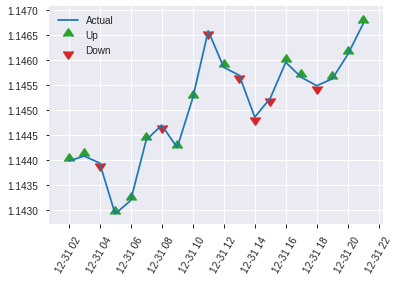


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.19372734736256
RMSE: 0.44014468912229304
LogLoss: 0.5702662150682696
Mean Per-Class Error: 0.2833764540081193
AUC: 0.7799320586441177
pr_auc: 0.7657310908737278
Gini: 0.5598641172882355
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2779111331733106: 


,0,1,Error,Rate
0,134.0,165.0,0.5518,(165.0/299.0)
1,31.0,287.0,0.0975,(31.0/318.0)
Total,165.0,452.0,0.3177,(196.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2779111,0.7454545,297.0
max f2,0.1723591,0.8610188,346.0
max f0point5,0.5000312,0.7287449,192.0
max accuracy,0.4318605,0.7179903,224.0
max precision,0.9238058,1.0,0.0
max recall,0.0560470,1.0,396.0
max specificity,0.9238058,1.0,0.0
max absolute_mcc,0.4318605,0.4353168,224.0
max min_per_class_accuracy,0.4751609,0.7090301,206.0
max mean_per_class_accuracy,0.4318605,0.7166235,224.0


Gains/Lift Table: Avg response rate: 51.54 %, avg score: 46.84 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.8870517,1.6630728,1.6630728,0.8571429,0.8979391,0.8571429,0.8979391,0.0188679,0.0188679,66.3072776,66.3072776
,2,0.0210697,0.8651077,1.6168763,1.6417513,0.8333333,0.8761131,0.8461538,0.8878656,0.0157233,0.0345912,61.6876310,64.1751330
,3,0.0307942,0.8524164,1.9402516,1.7360146,1.0,0.8570910,0.8947368,0.8781473,0.0188679,0.0534591,94.0251572,73.6014565
,4,0.0405186,0.8408596,1.9402516,1.7850314,1.0,0.8479713,0.92,0.8709051,0.0188679,0.0723270,94.0251572,78.5031447
,5,0.0502431,0.8284315,1.9402516,1.8150741,1.0,0.8333212,0.9354839,0.8636308,0.0188679,0.0911950,94.0251572,81.5074052
,6,0.1004862,0.7984476,1.2517752,1.5334246,0.6451613,0.8119049,0.7903226,0.8377678,0.0628931,0.1540881,25.1775208,53.3424630
,7,0.1507293,0.7537240,1.8150741,1.6273078,0.9354839,0.7730430,0.8387097,0.8161929,0.0911950,0.2452830,81.5074052,62.7307770
,8,0.2009724,0.7027578,1.6898965,1.6429550,0.8709677,0.7222781,0.8467742,0.7927142,0.0849057,0.3301887,68.9896531,64.2954960
,9,0.2998379,0.6294541,1.3041035,1.5312256,0.6721311,0.6630831,0.7891892,0.7499710,0.1289308,0.4591195,30.4103516,53.1225565
,10,0.4003241,0.5569438,1.2830696,1.4689354,0.6612903,0.5917932,0.7570850,0.7102664,0.1289308,0.5880503,28.3069588,46.8935401


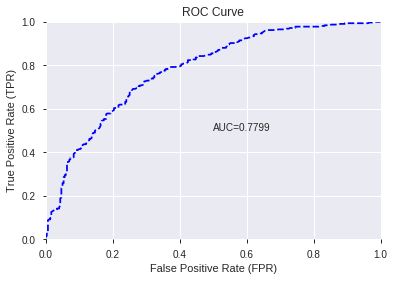

This function is available for GLM models only


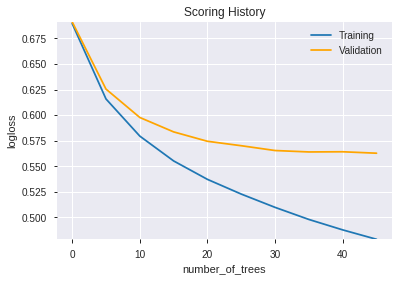

--2019-12-08 08:13:13--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.144.227
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.144.227|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip

Tree inconsistency found:
Note: this is a known issue for DRF and Isolation Forest models, please refer to https://0xdata.atlassian.net/browse/PUBDEV-6140
        Node 2 (parent)
            weight:      2513.0
            depth:       1
            colId:       1
            colName:     BOP
            leftward:    true
            naVsRest:    false
            splitVal:    0.8483372
            isBitset:    false
            predValue:   0.15205146
            squaredErr:  597.8273
            leftChild:   Node 5
            rightChild: 

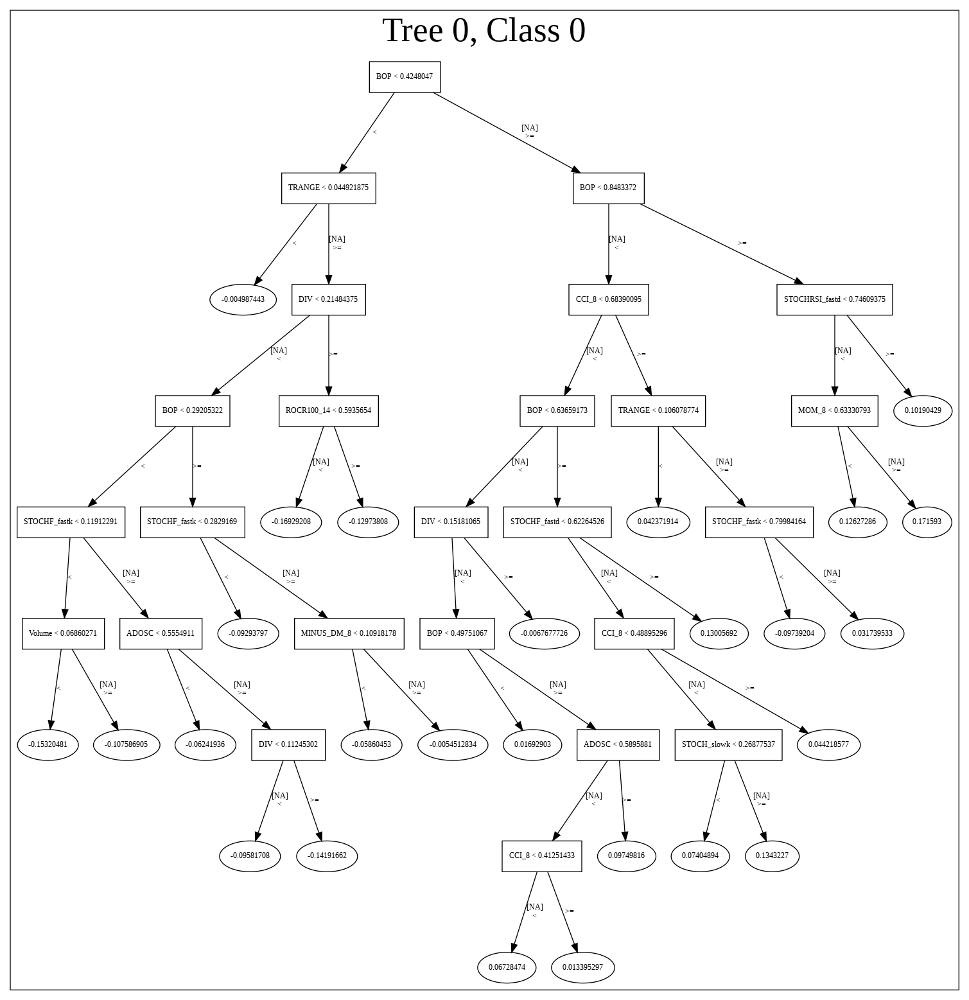

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GBM_5_AutoML_20191208_081247',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GBM_5_AutoML_20191208_081247',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_103_sid_afcd',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_103_sid_afcd',
   'type': 'Ke

['BOP',
 'STOCHF_fastk',
 'CCI_8',
 'SUB',
 'WILLR_8',
 'STOCHRSI_fastk',
 'TRANGE',
 'ULTOSC',
 'DIV',
 'STOCHRSI_fastd',
 'Volume',
 'CCI_24',
 'ADOSC',
 'CCI_12',
 'MINUS_DM_8',
 'CDLDRAGONFLYDOJI',
 'CCI_14',
 'WILLR_24',
 'WILLR_12',
 'CDLCLOSINGMARUBOZU',
 'RSI_30',
 'STOCHF_fastd',
 'STOCH_slowk',
 'WILLR_30',
 'WILLR_20',
 'WILLR_14',
 'ROCP_8',
 'MOM_8',
 'RSI_24',
 'CCI_20',
 'RSI_8',
 'ROCR100_8',
 'CMO_24',
 'ROC_8',
 'CMO_30',
 'MOM_14',
 'CMO_8',
 'CMO_12',
 'CMO_20',
 'CDLHAMMER',
 'CDLBELTHOLD',
 'RSI_14',
 'ROCR100_12',
 'ROCR100_14',
 'RSI_20',
 'CDLSHORTLINE',
 'RSI_12',
 'CDLLONGLINE',
 'ROCR_8',
 'ROC_14',
 'ROCR_14',
 'CMO_14',
 'ROCR_12',
 'ROCP_12',
 'ROC_12',
 'MOM_12',
 'ROCP_14',
 'CDLENGULFING',
 'CDLHANGINGMAN',
 'CDLHARAMI',
 'CDLMARUBOZU',
 'CDLTAKURI']

In [88]:
# GBM with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="GBM",features_list=features_list)

In [89]:
# StackedEnsemble with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="StackedEnsemble",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GBM_5_AutoML_20191208_081411,0.779932,0.570266,0.324662,0.440145,0.193727
1,XGBoost_2_AutoML_20191208_081411,0.777156,0.575296,0.327034,0.441674,0.195076
2,XGBoost_3_AutoML_20191208_081411,0.771392,0.580529,0.321417,0.444682,0.197742
3,XGBoost_1_AutoML_20191208_081411,0.767927,0.583684,0.330278,0.445984,0.198902
4,GLM_grid_1_AutoML_20191208_081411_model_1,0.765981,0.581340,0.303070,0.444790,0.197838
5,GBM_2_AutoML_20191208_081411,0.765250,0.586024,0.317373,0.447688,0.200425
6,GBM_1_AutoML_20191208_081411,0.763851,0.587674,0.325635,0.448060,0.200758
7,GBM_4_AutoML_20191208_081411,0.761795,0.588818,0.312357,0.449754,0.202278
8,GBM_3_AutoML_20191208_081411,0.753050,0.601706,0.311258,0.454126,0.206231
9,DRF_1_AutoML_20191208_081411,0.734645,0.666588,0.363923,0.459942,0.211546


,variable,relative_importance,scaled_importance,percentage
0,BOP,769.365173,1.000000,0.368044
1,STOCHF_fastk,151.709900,0.197188,0.072574
2,CCI_8,102.729668,0.133525,0.049143
3,SUB,57.391434,0.074596,0.027455
4,WILLR_8,56.991657,0.074076,0.027263
...,...,...,...,...
57,CDLENGULFING,0.000000,0.000000,0.000000
58,CDLHANGINGMAN,0.000000,0.000000,0.000000
59,CDLHARAMI,0.000000,0.000000,0.000000
60,CDLMARUBOZU,0.000000,0.000000,0.000000


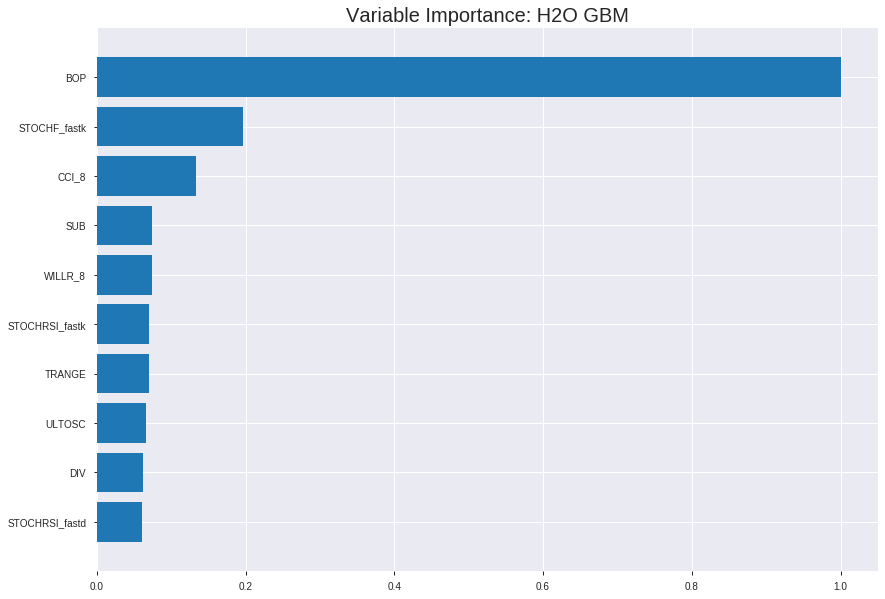

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_5_AutoML_20191208_081411


ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.15498306026571826
RMSE: 0.39367887962871245
LogLoss: 0.4785493731143037
Mean Per-Class Error: 0.22106315562602552
AUC: 0.8660190545379784
pr_auc: 0.843924850738493
Gini: 0.7320381090759569
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.41898728575397004: 


,0,1,Error,Rate
0,1644.0,697.0,0.2977,(697.0/2341.0)
1,315.0,1663.0,0.1593,(315.0/1978.0)
Total,1959.0,2360.0,0.2343,(1012.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4189873,0.7667128,221.0
max f2,0.2748213,0.8575714,288.0
max f0point5,0.5903257,0.7795563,145.0
max accuracy,0.5248066,0.7835147,175.0
max precision,0.9195413,1.0,0.0
max recall,0.0950911,1.0,377.0
max specificity,0.9195413,1.0,0.0
max absolute_mcc,0.5248066,0.5627741,175.0
max min_per_class_accuracy,0.4817118,0.7745197,194.0
max mean_per_class_accuracy,0.5248066,0.7789368,175.0


Gains/Lift Table: Avg response rate: 45.80 %, avg score: 45.80 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.8855002,2.0842679,2.0842679,0.9545455,0.8964696,0.9545455,0.8964696,0.0212336,0.0212336,108.4267856,108.4267856
,2,0.0201436,0.8678484,2.1835187,2.1333229,1.0,0.8754110,0.9770115,0.8860613,0.0217391,0.0429727,118.3518706,113.3322873
,3,0.0300996,0.8541294,2.1327392,2.1331298,0.9767442,0.8612224,0.9769231,0.8778454,0.0212336,0.0642063,113.2739201,113.3129813
,4,0.0400556,0.8419436,2.0311802,2.1077897,0.9302326,0.8489591,0.9653179,0.8706656,0.0202224,0.0844287,103.1180191,110.7789733
,5,0.0500116,0.8315047,2.1835187,2.1228654,1.0,0.8365801,0.9722222,0.8638800,0.0217391,0.1061678,118.3518706,112.2865408
,6,0.1000232,0.7842429,2.0622121,2.0925388,0.9444444,0.8058462,0.9583333,0.8348631,0.1031345,0.2093023,106.2212111,109.2538760
,7,0.1500347,0.7427622,1.9914499,2.0588425,0.9120370,0.7642849,0.9429012,0.8113370,0.0995956,0.3088979,99.1449931,105.8842483
,8,0.2000463,0.7017224,1.7791634,1.9889227,0.8148148,0.7218454,0.9108796,0.7889641,0.0889788,0.3978766,77.9163390,98.8922710
,9,0.3000695,0.6253347,1.6426935,1.8735130,0.7523148,0.6633961,0.8580247,0.7471081,0.1643074,0.5621840,64.2693471,87.3512964
,10,0.4000926,0.5441454,1.3444814,1.7412551,0.6157407,0.5847144,0.7974537,0.7065097,0.1344793,0.6966633,34.4481425,74.1255079




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.19084419718813964
RMSE: 0.4368571816831442
LogLoss: 0.5627564015436632
Mean Per-Class Error: 0.28842171627243207
AUC: 0.7805211968693367
pr_auc: 0.7493120919699268
Gini: 0.5610423937386735
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.34527325159646577: 


,0,1,Error,Rate
0,346.0,311.0,0.4734,(311.0/657.0)
1,89.0,488.0,0.1542,(89.0/577.0)
Total,435.0,799.0,0.3241,(400.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3452733,0.7093023,261.0
max f2,0.1968316,0.8313289,335.0
max f0point5,0.5641829,0.7051546,158.0
max accuracy,0.5422477,0.7163695,168.0
max precision,0.9204730,1.0,0.0
max recall,0.0792525,1.0,391.0
max specificity,0.9204730,1.0,0.0
max absolute_mcc,0.5422477,0.4290888,168.0
max min_per_class_accuracy,0.4815534,0.7053726,200.0
max mean_per_class_accuracy,0.4879339,0.7115783,196.0


Gains/Lift Table: Avg response rate: 46.76 %, avg score: 46.06 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.8842703,1.9741368,1.9741368,0.9230769,0.8948215,0.9230769,0.8948215,0.0207972,0.0207972,97.4136782,97.4136782
,2,0.0202593,0.8597158,1.7822068,1.8820104,0.8333333,0.8702185,0.88,0.8830120,0.0173310,0.0381282,78.2206817,88.2010399
,3,0.0299838,0.8457511,1.9604275,1.9074430,0.9166667,0.8541860,0.8918919,0.8736631,0.0190641,0.0571924,96.0427499,90.7442972
,4,0.0405186,0.8301167,1.8096254,1.8820104,0.8461538,0.8373047,0.88,0.8642099,0.0190641,0.0762565,80.9625383,88.2010399
,5,0.0502431,0.8185548,2.1386482,1.9316822,1.0,0.8238258,0.9032258,0.8563936,0.0207972,0.0970537,113.8648180,93.1682227
,6,0.1004862,0.7672478,1.7592106,1.8454464,0.8225806,0.7857191,0.8629032,0.8210564,0.0883882,0.1854419,75.9210600,84.5446414
,7,0.1499190,0.7244461,1.6828707,1.7918404,0.7868852,0.7454843,0.8378378,0.7961380,0.0831889,0.2686308,68.2870699,79.1840367
,8,0.2001621,0.6965074,1.5867390,1.7403574,0.7419355,0.7098627,0.8137652,0.7744818,0.0797227,0.3483536,58.6738972,74.0357426
,9,0.2998379,0.6286613,1.4257655,1.6357769,0.6666667,0.6651339,0.7648649,0.7381311,0.1421144,0.4904679,42.5765453,63.5776851
,10,0.4003241,0.5442437,1.2935372,1.5498705,0.6048387,0.5843507,0.7246964,0.6995303,0.1299827,0.6204506,29.3537206,54.9870544



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 08:14:27,0.003 sec,0.0,0.4982309,0.6896110,0.5,0.0,1.0,0.5420236,0.4990407,0.6912300,0.5,0.0,1.0,0.5324149
,2019-12-08 08:14:27,0.114 sec,5.0,0.4607583,0.6158237,0.7894161,0.7435310,2.0217766,0.3090993,0.4657845,0.6254590,0.7687073,0.7246960,1.9858876,0.3314425
,2019-12-08 08:14:27,0.234 sec,10.0,0.4426980,0.5794877,0.8006521,0.7635428,1.9461797,0.2921973,0.4521529,0.5977033,0.7705275,0.7326329,1.9741368,0.3427877
,2019-12-08 08:14:27,0.354 sec,15.0,0.4310758,0.5552037,0.8121879,0.7764944,2.0411153,0.2901135,0.4457154,0.5836122,0.7726853,0.7341823,2.1386482,0.3014587
,2019-12-08 08:14:27,0.472 sec,20.0,0.4225795,0.5371656,0.8224307,0.7909269,2.0346424,0.2808520,0.4418203,0.5744165,0.7752414,0.7397830,1.9741368,0.3014587
,2019-12-08 08:14:27,0.599 sec,25.0,0.4157353,0.5227776,0.8326004,0.8047484,2.0346424,0.2829359,0.4398870,0.5700736,0.7766949,0.7435763,2.1386482,0.2917342
,2019-12-08 08:14:27,0.719 sec,30.0,0.4094117,0.5097719,0.8420142,0.8159777,2.1338933,0.2667284,0.4376957,0.5653770,0.7803392,0.7465316,2.1386482,0.2982172
,2019-12-08 08:14:28,0.856 sec,35.0,0.4034519,0.4979533,0.8516553,0.8272229,2.1338933,0.2558463,0.4371864,0.5639894,0.7805555,0.7480917,2.1386482,0.2982172
,2019-12-08 08:14:28,0.985 sec,40.0,0.3983810,0.4877480,0.8589769,0.8357952,2.1338933,0.2514471,0.4373194,0.5641631,0.7796837,0.7477591,2.1386482,0.3176661
,2019-12-08 08:14:28,1.117 sec,45.0,0.3936789,0.4785494,0.8660191,0.8439249,2.0842679,0.2343135,0.4368572,0.5627564,0.7805212,0.7493121,1.9741368,0.3241491


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,769.3651733,1.0,0.3680439
STOCHF_fastk,151.7098999,0.1971884,0.0725740
CCI_8,102.7296677,0.1335252,0.0491432
SUB,57.3914337,0.0745958,0.0274545
WILLR_8,56.9916573,0.0740762,0.0272633
---,---,---,---
CDLENGULFING,0.0,0.0,0.0
CDLHANGINGMAN,0.0,0.0,0.0
CDLHARAMI,0.0,0.0,0.0
CDLMARUBOZU,0.0,0.0,0.0



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7179902755267423)

('F1', 0.7454545454545456)

('auc', 0.7799320586441177)

('logloss', 0.5702662150682696)

('mean_per_class_error', 0.2833764540081193)

('rmse', 0.44014468912229304)

('mse', 0.19372734736256)

gbm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
6165        1
6166        0
6167        1
6168        1
6169        1

[6170 rows x 1 columns]


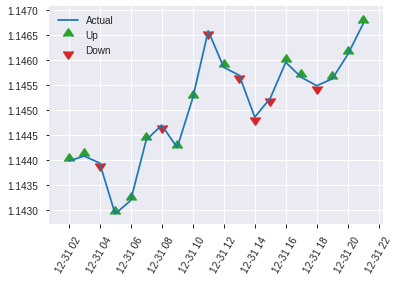


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.19372734736256
RMSE: 0.44014468912229304
LogLoss: 0.5702662150682696
Mean Per-Class Error: 0.2833764540081193
AUC: 0.7799320586441177
pr_auc: 0.7657310908737278
Gini: 0.5598641172882355
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2779111331733106: 


,0,1,Error,Rate
0,134.0,165.0,0.5518,(165.0/299.0)
1,31.0,287.0,0.0975,(31.0/318.0)
Total,165.0,452.0,0.3177,(196.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2779111,0.7454545,297.0
max f2,0.1723591,0.8610188,346.0
max f0point5,0.5000312,0.7287449,192.0
max accuracy,0.4318605,0.7179903,224.0
max precision,0.9238058,1.0,0.0
max recall,0.0560470,1.0,396.0
max specificity,0.9238058,1.0,0.0
max absolute_mcc,0.4318605,0.4353168,224.0
max min_per_class_accuracy,0.4751609,0.7090301,206.0
max mean_per_class_accuracy,0.4318605,0.7166235,224.0


Gains/Lift Table: Avg response rate: 51.54 %, avg score: 46.84 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.8870517,1.6630728,1.6630728,0.8571429,0.8979391,0.8571429,0.8979391,0.0188679,0.0188679,66.3072776,66.3072776
,2,0.0210697,0.8651077,1.6168763,1.6417513,0.8333333,0.8761131,0.8461538,0.8878656,0.0157233,0.0345912,61.6876310,64.1751330
,3,0.0307942,0.8524164,1.9402516,1.7360146,1.0,0.8570910,0.8947368,0.8781473,0.0188679,0.0534591,94.0251572,73.6014565
,4,0.0405186,0.8408596,1.9402516,1.7850314,1.0,0.8479713,0.92,0.8709051,0.0188679,0.0723270,94.0251572,78.5031447
,5,0.0502431,0.8284315,1.9402516,1.8150741,1.0,0.8333212,0.9354839,0.8636308,0.0188679,0.0911950,94.0251572,81.5074052
,6,0.1004862,0.7984476,1.2517752,1.5334246,0.6451613,0.8119049,0.7903226,0.8377678,0.0628931,0.1540881,25.1775208,53.3424630
,7,0.1507293,0.7537240,1.8150741,1.6273078,0.9354839,0.7730430,0.8387097,0.8161929,0.0911950,0.2452830,81.5074052,62.7307770
,8,0.2009724,0.7027578,1.6898965,1.6429550,0.8709677,0.7222781,0.8467742,0.7927142,0.0849057,0.3301887,68.9896531,64.2954960
,9,0.2998379,0.6294541,1.3041035,1.5312256,0.6721311,0.6630831,0.7891892,0.7499710,0.1289308,0.4591195,30.4103516,53.1225565
,10,0.4003241,0.5569438,1.2830696,1.4689354,0.6612903,0.5917932,0.7570850,0.7102664,0.1289308,0.5880503,28.3069588,46.8935401


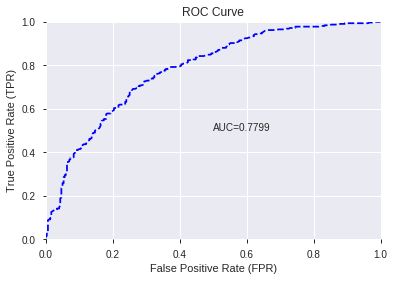

This function is available for GLM models only


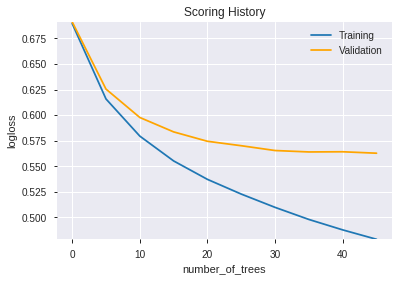

--2019-12-08 08:14:37--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.136.43
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.136.43|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip

Tree inconsistency found:
Note: this is a known issue for DRF and Isolation Forest models, please refer to https://0xdata.atlassian.net/browse/PUBDEV-6140
        Node 2 (parent)
            weight:      2513.0
            depth:       1
            colId:       1
            colName:     BOP
            leftward:    true
            naVsRest:    false
            splitVal:    0.8483372
            isBitset:    false
            predValue:   0.15205146
            squaredErr:  597.8273
            leftChild:   Node 5
            rightChild:  N

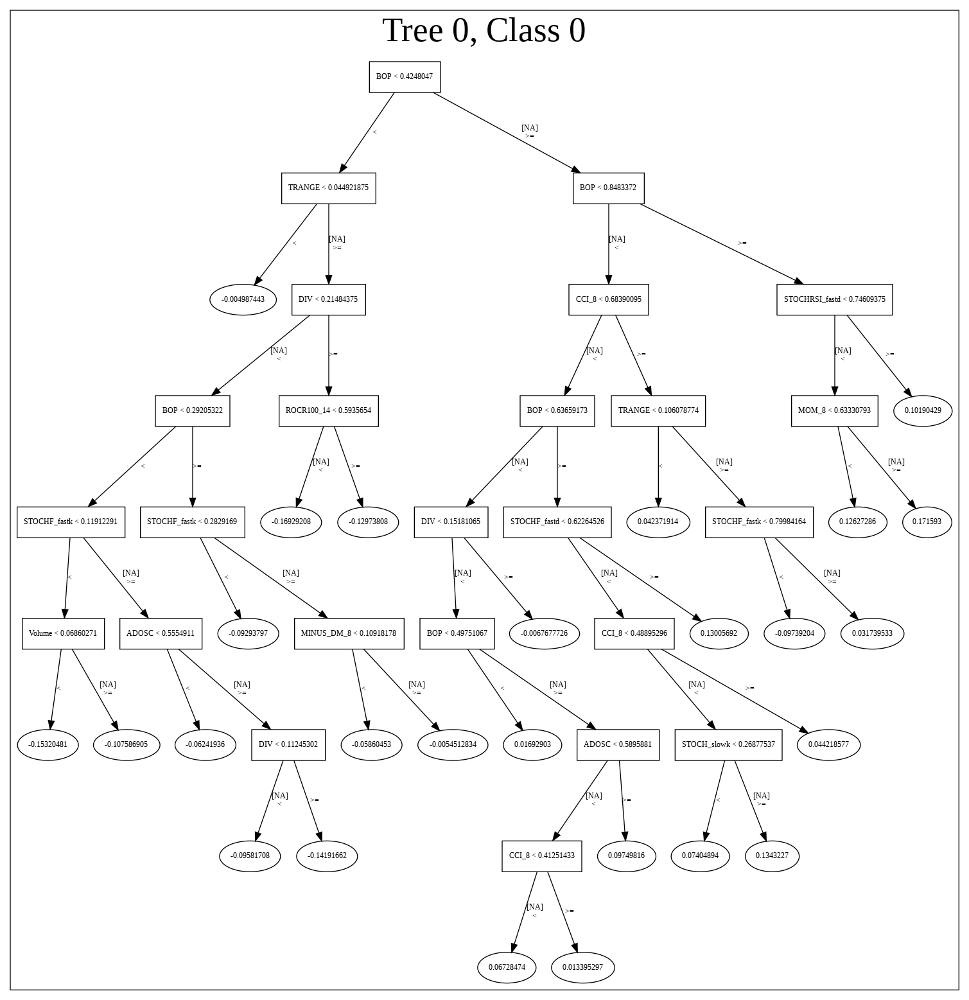

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GBM_5_AutoML_20191208_081411',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GBM_5_AutoML_20191208_081411',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_111_sid_afcd',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_111_sid_afcd',
   'type': 'Ke

['BOP',
 'STOCHF_fastk',
 'CCI_8',
 'SUB',
 'WILLR_8',
 'STOCHRSI_fastk',
 'TRANGE',
 'ULTOSC',
 'DIV',
 'STOCHRSI_fastd',
 'Volume',
 'CCI_24',
 'ADOSC',
 'CCI_12',
 'MINUS_DM_8',
 'CDLDRAGONFLYDOJI',
 'CCI_14',
 'WILLR_24',
 'WILLR_12',
 'CDLCLOSINGMARUBOZU',
 'RSI_30',
 'STOCHF_fastd',
 'STOCH_slowk',
 'WILLR_30',
 'WILLR_20',
 'WILLR_14',
 'ROCP_8',
 'MOM_8',
 'RSI_24',
 'CCI_20',
 'RSI_8',
 'ROCR100_8',
 'CMO_24',
 'ROC_8',
 'CMO_30',
 'MOM_14',
 'CMO_8',
 'CMO_12',
 'CMO_20',
 'CDLHAMMER',
 'CDLBELTHOLD',
 'RSI_14',
 'ROCR100_12',
 'ROCR100_14',
 'RSI_20',
 'CDLSHORTLINE',
 'RSI_12',
 'CDLLONGLINE',
 'ROCR_8',
 'ROC_14',
 'ROCR_14',
 'CMO_14',
 'ROCR_12',
 'ROCP_12',
 'ROC_12',
 'MOM_12',
 'ROCP_14',
 'CDLENGULFING',
 'CDLHANGINGMAN',
 'CDLHARAMI',
 'CDLMARUBOZU',
 'CDLTAKURI']

In [90]:
# All algos with Select Family-wise error features
model_train(feature_name='Fwe',model_algo=None,features_list=features_list)

In [91]:
# recursive feature elimination
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'RFE' in features_to_include:
  from sklearn.feature_selection import RFE
  from sklearn.svm import LinearSVC
  from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier
  from sklearn.linear_model import LogisticRegression, LinearRegression

  bestfeatures = RFE(ExtraTreeClassifier(random_state=1,criterion='entropy'), n_features_to_select=select_rfe, step=1).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, RFE, LinearSVC, DecisionTreeClassifier,ExtraTreeClassifier, LogisticRegression, LinearRegression
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list = []

50

['BOP',
 'CCI_8',
 'PLUS_DI_8',
 'PLUS_DM_8',
 'WILLR_8',
 'aroondown_12',
 'aroonup_12',
 'CCI_12',
 'MACDFIX_hist_12',
 'MOM_12',
 'PLUS_DI_12',
 'ROCP_12',
 'RSI_12',
 'TRIX_12',
 'WILLR_12',
 'ADXR_14',
 'aroondown_14',
 'CCI_14',
 'DX_14',
 'WILLR_14',
 'CMO_20',
 'MACDFIX_signal_20',
 'MACDFIX_hist_20',
 'MFI_20',
 'MINUS_DM_20',
 'WILLR_20',
 'aroonup_24',
 'MFI_24',
 'PLUS_DM_30',
 'WILLR_30',
 'STOCHF_fastk',
 'STOCHF_fastd',
 'STOCHRSI_fastk',
 'STOCHRSI_fastd',
 'ULTOSC',
 'ADOSC',
 'ATR_8',
 'NATR_8',
 'TRANGE',
 'HT_PHASOR_inphase',
 'CDLSHORTLINE',
 'LINEARREG_ANGLE_8',
 'LINEARREG_SLOPE_8',
 'BETA_14',
 'LINEARREG_SLOPE_14',
 'STDDEV_14',
 'VAR_14',
 'LINEARREG_ANGLE_20',
 'BETA_24',
 'BETA_30']

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20191208_081601_model_8,0.784339,0.574956,0.299952,0.441635,0.195042
1,DeepLearning_grid_1_AutoML_20191208_081601_model_9,0.771261,0.596518,0.297280,0.450665,0.203099
2,DeepLearning_grid_1_AutoML_20191208_081601_model_5,0.765308,0.582896,0.319046,0.445596,0.198556
3,DeepLearning_grid_1_AutoML_20191208_081601_model_3,0.759260,0.619753,0.299252,0.454795,0.206838
4,DeepLearning_grid_1_AutoML_20191208_081601_model_4,0.758919,0.601396,0.315501,0.450506,0.202956
5,DeepLearning_grid_1_AutoML_20191208_081601_model_6,0.752976,0.594128,0.310259,0.450005,0.202505
6,DeepLearning_grid_1_AutoML_20191208_081601_model_1,0.740939,0.755442,0.349945,0.484507,0.234747
7,DeepLearning_1_AutoML_20191208_081601,0.734655,0.635609,0.353190,0.470485,0.221356
8,DeepLearning_grid_1_AutoML_20191208_081601_model_7,0.722119,0.668115,0.358980,0.471966,0.222752
9,DeepLearning_grid_1_AutoML_20191208_081601_model_2,0.712070,0.732295,0.340885,0.483925,0.234183


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.053347
1,TRANGE,0.674904,0.674904,0.036004
2,CCI_8,0.587293,0.587293,0.031330
3,STOCHF_fastk,0.546275,0.546275,0.029142
4,WILLR_8,0.431717,0.431717,0.023031
5,ADXR_14,0.427293,0.427293,0.022795
6,STOCHRSI_fastk,0.420590,0.420590,0.022437
7,MINUS_DM_20,0.418279,0.418279,0.022314
8,WILLR_30,0.399771,0.399771,0.021327
9,aroonup_24,0.399116,0.399116,0.021292


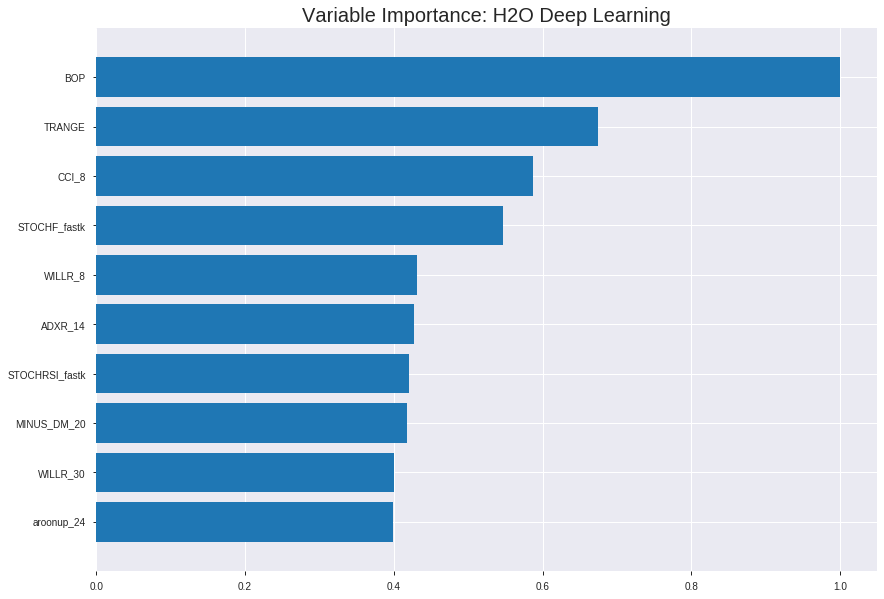

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20191208_081601_model_8


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.19776363792361393
RMSE: 0.44470623778356644
LogLoss: 0.5801127441384218
Mean Per-Class Error: 0.2929801502991687
AUC: 0.7679237740735446
pr_auc: 0.7058287796570744
Gini: 0.5358475481470892
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4136537752290343: 


,0,1,Error,Rate
0,1373.0,968.0,0.4135,(968.0/2341.0)
1,376.0,1602.0,0.1901,(376.0/1978.0)
Total,1749.0,2570.0,0.3112,(1344.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4136538,0.7044855,224.0
max f2,0.2761475,0.8275593,302.0
max f0point5,0.5085968,0.6799955,165.0
max accuracy,0.4560189,0.7057189,197.0
max precision,0.8649536,1.0,0.0
max recall,0.0618484,1.0,388.0
max specificity,0.8649536,1.0,0.0
max absolute_mcc,0.4514937,0.4125854,200.0
max min_per_class_accuracy,0.4626802,0.7009825,193.0
max mean_per_class_accuracy,0.4514937,0.7070198,200.0


Gains/Lift Table: Avg response rate: 45.80 %, avg score: 46.91 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.8092600,1.8857662,1.8857662,0.8636364,0.8233532,0.8636364,0.8233532,0.0192113,0.0192113,88.5766155,88.5766155
,2,0.0201436,0.7926612,1.8280622,1.8572458,0.8372093,0.7991440,0.8505747,0.8113878,0.0182002,0.0374115,82.8062172,85.7245796
,3,0.0300996,0.7792713,1.7772827,1.8307965,0.8139535,0.7855990,0.8384615,0.8028577,0.0176946,0.0551062,77.7282667,83.0796453
,4,0.0400556,0.7692036,1.5741646,1.7670094,0.7209302,0.7747539,0.8092486,0.7958723,0.0156724,0.0707786,57.4164648,76.7009357
,5,0.0500116,0.7628482,1.3710466,1.6881834,0.6279070,0.7663175,0.7731481,0.7899887,0.0136502,0.0844287,37.1046629,68.8183444
,6,0.1000232,0.7283144,1.7589456,1.7235645,0.8055556,0.7448736,0.7893519,0.7674312,0.0879676,0.1723964,75.8945624,72.3564534
,7,0.1500347,0.6956241,1.4961147,1.6477479,0.6851852,0.7126186,0.7546296,0.7491603,0.0748231,0.2472194,49.6114669,64.7747912
,8,0.2000463,0.6618049,1.6679657,1.6528024,0.7638889,0.6777080,0.7569444,0.7312972,0.0834176,0.3306370,66.7965678,65.2802354
,9,0.3000695,0.5886864,1.5011691,1.6022579,0.6875,0.6255416,0.7337963,0.6960454,0.1501517,0.4807887,50.1169110,60.2257939
,10,0.4000926,0.5120947,1.2888826,1.5239141,0.5902778,0.5489994,0.6979167,0.6592839,0.1289181,0.6097068,28.8882569,52.3914097




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.20078455436403428
RMSE: 0.448089895404967
LogLoss: 0.5870248238681074
Mean Per-Class Error: 0.2844186985114314
AUC: 0.7623750623204577
pr_auc: 0.7106886371284397
Gini: 0.5247501246409154
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.41687094066950237: 


,0,1,Error,Rate
0,396.0,261.0,0.3973,(261.0/657.0)
1,99.0,478.0,0.1716,(99.0/577.0)
Total,495.0,739.0,0.2917,(360.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4168709,0.7264438,225.0
max f2,0.2402416,0.8308867,329.0
max f0point5,0.5068340,0.6805075,164.0
max accuracy,0.4168709,0.7082658,225.0
max precision,0.8505205,1.0,0.0
max recall,0.1033168,1.0,382.0
max specificity,0.8505205,1.0,0.0
max absolute_mcc,0.4168709,0.4389215,225.0
max min_per_class_accuracy,0.4654322,0.6925419,190.0
max mean_per_class_accuracy,0.4168709,0.7155813,225.0


Gains/Lift Table: Avg response rate: 46.76 %, avg score: 47.21 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.8018533,1.9741368,1.9741368,0.9230769,0.8192010,0.9230769,0.8192010,0.0207972,0.0207972,97.4136782,97.4136782
,2,0.0202593,0.7917494,1.7822068,1.8820104,0.8333333,0.7977566,0.88,0.8089077,0.0173310,0.0381282,78.2206817,88.2010399
,3,0.0299838,0.7807680,1.9604275,1.9074430,0.9166667,0.7864979,0.8918919,0.8016397,0.0190641,0.0571924,96.0427499,90.7442972
,4,0.0405186,0.7709711,1.8096254,1.8820104,0.8461538,0.7756832,0.88,0.7948910,0.0190641,0.0762565,80.9625383,88.2010399
,5,0.0502431,0.7583627,1.2475448,1.7592106,0.5833333,0.7632411,0.8225806,0.7887652,0.0121317,0.0883882,24.7544772,75.9210600
,6,0.1004862,0.7262536,1.7592106,1.7592106,0.8225806,0.7418208,0.8225806,0.7652930,0.0883882,0.1767764,75.9210600,75.9210600
,7,0.1499190,0.6944814,1.3673324,1.6299967,0.6393443,0.7094584,0.7621622,0.7468827,0.0675910,0.2443674,36.7332443,62.9996721
,8,0.2001621,0.6522996,1.4142673,1.5758460,0.6612903,0.6751232,0.7368421,0.7288702,0.0710572,0.3154246,41.4267345,57.5846028
,9,0.2998379,0.5874226,1.4605402,1.5375146,0.6829268,0.6215582,0.7189189,0.6931962,0.1455806,0.4610052,46.0540221,53.7514638
,10,0.4003241,0.5151863,1.3970202,1.5022488,0.6532258,0.5502116,0.7024291,0.6573053,0.1403813,0.6013865,39.7020182,50.2248823



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 08:22:33,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-12-08 08:22:36,2 min 6.053 sec,1646 obs/sec,1.0,1,4319.0,0.4697699,0.6324165,0.1109852,0.7393659,0.6773216,1.8857662,0.3459134,0.4684116,0.6299238,0.1186580,0.7503344,0.6833603,1.6451140,0.3290113
,2019-12-08 08:22:48,2 min 18.571 sec,2470 obs/sec,8.0,8,34552.0,0.4596789,0.6124527,0.1487683,0.7589513,0.6929725,1.6376390,0.3148877,0.4548200,0.6024277,0.1690627,0.7667645,0.7092558,1.8096254,0.3087520
,2019-12-08 08:23:00,2 min 30.166 sec,2829 obs/sec,16.0,16,69104.0,0.4447062,0.5801127,0.2033177,0.7679238,0.7058288,1.8857662,0.3111831,0.4480899,0.5870248,0.1934720,0.7623751,0.7106886,1.9741368,0.2917342
,2019-12-08 08:23:12,2 min 42.283 sec,3052 obs/sec,25.0,25,107975.0,0.4464173,0.5821632,0.1971753,0.7764421,0.7139713,1.6872645,0.3026163,0.4514633,0.5934850,0.1812827,0.7610574,0.7043969,1.6451140,0.2965964
,2019-12-08 08:23:24,2 min 54.800 sec,3235 obs/sec,35.0,35,151165.0,0.4400443,0.5667430,0.2199339,0.7855582,0.7337880,1.9353916,0.3121093,0.4510090,0.5917550,0.1829296,0.7578854,0.6973560,1.8096254,0.3144246
,2019-12-08 08:23:37,3 min 7.054 sec,3364 obs/sec,45.0,45,194355.0,0.4326729,0.5526127,0.2458492,0.7974811,0.7453625,2.0842679,0.3042371,0.4502959,0.5906131,0.1855111,0.7563329,0.6952434,1.6451140,0.3273906
,2019-12-08 08:23:49,3 min 19.804 sec,3485 obs/sec,56.0,56,241864.0,0.4299880,0.5461705,0.2551800,0.8112293,0.7721153,2.0842679,0.2877981,0.4534620,0.6004506,0.1740173,0.7523550,0.6910176,1.4806026,0.3111831
,2019-12-08 08:23:50,3 min 20.971 sec,3484 obs/sec,56.0,56,241864.0,0.4447062,0.5801127,0.2033177,0.7679238,0.7058288,1.8857662,0.3111831,0.4480899,0.5870248,0.1934720,0.7623751,0.7106886,1.9741368,0.2917342


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0533469
TRANGE,0.6749040,0.6749040,0.0360040
CCI_8,0.5872928,0.5872928,0.0313303
STOCHF_fastk,0.5462747,0.5462747,0.0291421
WILLR_8,0.4317169,0.4317169,0.0230308
---,---,---,---
LINEARREG_ANGLE_8,0.2853285,0.2853285,0.0152214
ROCP_12,0.2763567,0.2763567,0.0147428
LINEARREG_SLOPE_8,0.2758870,0.2758870,0.0147177
CMO_20,0.2755388,0.2755388,0.0146991



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7325769854132901)

('F1', 0.7506849315068495)

('auc', 0.7843387812624891)

('logloss', 0.5749563450318904)

('mean_per_class_error', 0.26782671799078694)

('rmse', 0.4416350425024415)

('mse', 0.19504151076613332)

deeplearning prediction progress: |███████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
6165        1
6166        0
6167        1
6168        1
6169        1

[6170 rows x 1 columns]


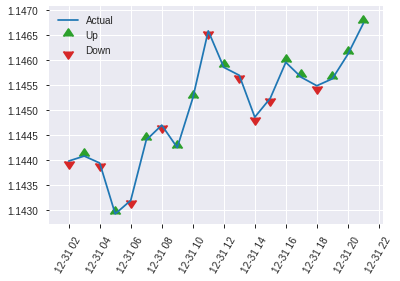


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.19504151076613332
RMSE: 0.4416350425024415
LogLoss: 0.5749563450318904
Mean Per-Class Error: 0.26782671799078694
AUC: 0.7843387812624891
pr_auc: 0.7757306748456426
Gini: 0.5686775625249783
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.386295184761614: 


,0,1,Error,Rate
0,161.0,138.0,0.4615,(138.0/299.0)
1,44.0,274.0,0.1384,(44.0/318.0)
Total,205.0,412.0,0.295,(182.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3862952,0.7506849,255.0
max f2,0.2250014,0.8543956,346.0
max f0point5,0.4948603,0.7402032,176.0
max accuracy,0.4464999,0.7325770,205.0
max precision,0.8653464,1.0,0.0
max recall,0.0881295,1.0,388.0
max specificity,0.8653464,1.0,0.0
max absolute_mcc,0.4464999,0.4645078,205.0
max min_per_class_accuracy,0.4532133,0.7224080,200.0
max mean_per_class_accuracy,0.4464999,0.7321733,205.0


Gains/Lift Table: Avg response rate: 51.54 %, avg score: 47.17 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.8047080,1.9402516,1.9402516,1.0,0.8209090,1.0,0.8209090,0.0220126,0.0220126,94.0251572,94.0251572
,2,0.0210697,0.7940995,1.9402516,1.9402516,1.0,0.7988685,1.0,0.8107365,0.0188679,0.0408805,94.0251572,94.0251572
,3,0.0307942,0.7744142,1.6168763,1.8381331,0.8333333,0.7812347,0.9473684,0.8014201,0.0157233,0.0566038,61.6876310,83.8133069
,4,0.0405186,0.7666884,1.2935010,1.7074214,0.6666667,0.7705670,0.88,0.7940154,0.0125786,0.0691824,29.3501048,70.7421384
,5,0.0502431,0.7608907,1.2935010,1.6273078,0.6666667,0.7625764,0.8387097,0.7879304,0.0125786,0.0817610,29.3501048,62.7307770
,6,0.1004862,0.7325660,1.6898965,1.6586022,0.8709677,0.7441732,0.8548387,0.7660518,0.0849057,0.1666667,68.9896531,65.8602151
,7,0.1507293,0.7021437,1.5647190,1.6273078,0.8064516,0.7161879,0.8387097,0.7494305,0.0786164,0.2452830,56.4719010,62.7307770
,8,0.2009724,0.6723255,1.5647190,1.6116606,0.8064516,0.6867412,0.8306452,0.7337582,0.0786164,0.3238994,56.4719010,61.1660580
,9,0.2998379,0.5965133,1.4631405,1.5626891,0.7540984,0.6316750,0.8054054,0.7000983,0.1446541,0.4685535,46.3140530,56.2689104
,10,0.4003241,0.5271189,1.2517752,1.4846459,0.6451613,0.5662134,0.7651822,0.6664916,0.1257862,0.5943396,25.1775208,48.4645940


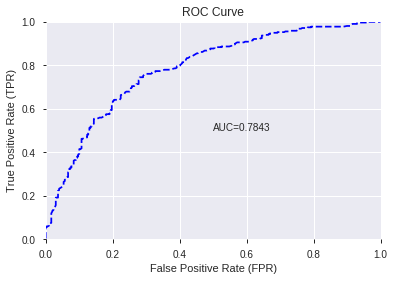

This function is available for GLM models only


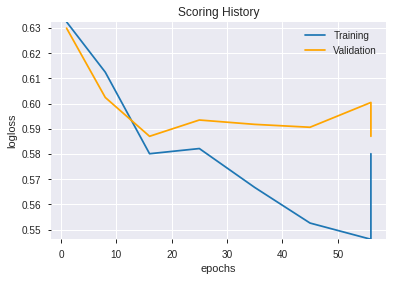

--2019-12-08 08:25:19--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.139.131
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.139.131|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


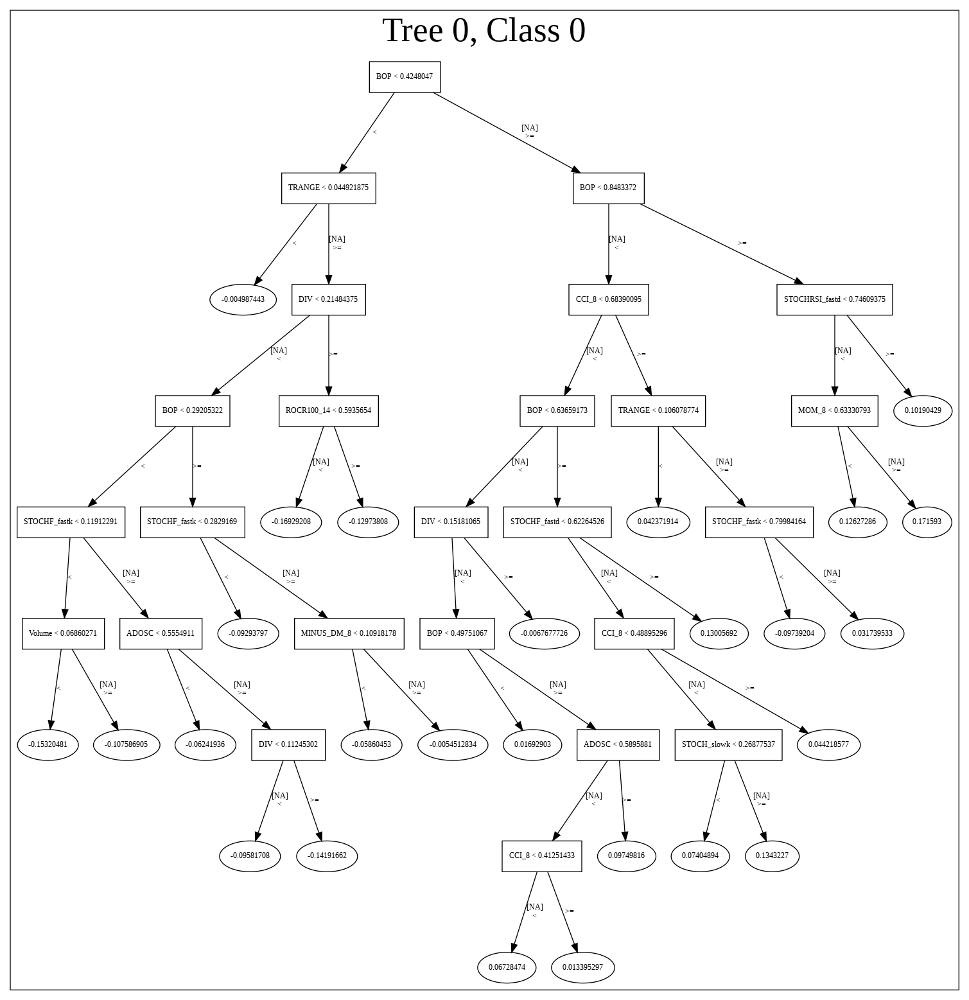

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20191208_081601_model_8',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20191208_081601_model_8',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_116_sid_afcd',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'auto

['BOP',
 'TRANGE',
 'CCI_8',
 'STOCHF_fastk',
 'WILLR_8',
 'ADXR_14',
 'STOCHRSI_fastk',
 'MINUS_DM_20',
 'WILLR_30',
 'aroonup_24',
 'aroonup_12',
 'ULTOSC',
 'DX_14',
 'CDLSHORTLINE',
 'MFI_20',
 'BETA_30',
 'PLUS_DM_30',
 'STOCHRSI_fastd',
 'MFI_24',
 'BETA_24',
 'aroondown_14',
 'STDDEV_14',
 'STOCHF_fastd',
 'MACDFIX_signal_20',
 'aroondown_12',
 'HT_PHASOR_inphase',
 'VAR_14',
 'WILLR_20',
 'PLUS_DM_8',
 'ATR_8',
 'PLUS_DI_8',
 'CCI_12',
 'ADOSC',
 'BETA_14',
 'CCI_14',
 'NATR_8',
 'LINEARREG_SLOPE_14',
 'LINEARREG_ANGLE_20',
 'PLUS_DI_12',
 'WILLR_12',
 'TRIX_12',
 'MACDFIX_hist_12',
 'MACDFIX_hist_20',
 'RSI_12',
 'WILLR_14',
 'LINEARREG_ANGLE_8',
 'ROCP_12',
 'LINEARREG_SLOPE_8',
 'CMO_20',
 'MOM_12']

In [92]:
# DeepLearning with recursive feature elimination
model_train(feature_name='RFE',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191208_082616_model_1,0.779695,0.57293,0.294236,0.441305,0.19475


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.704841,1.000000,0.109890
1,CCI_8,0.521569,0.739981,0.081316
2,STOCHF_fastk,0.451119,0.640030,0.070333
3,PLUS_DI_8,0.405373,0.575127,0.063201
4,WILLR_8,0.377210,0.535170,0.058810
5,TRANGE,0.338386,0.480089,0.052757
6,LINEARREG_SLOPE_14,0.311359,0.441743,0.048543
7,STOCHF_fastd,0.246222,0.349329,0.038388
8,PLUS_DI_12,0.223442,0.317011,0.034836
9,CMO_20,0.204586,0.290259,0.031896


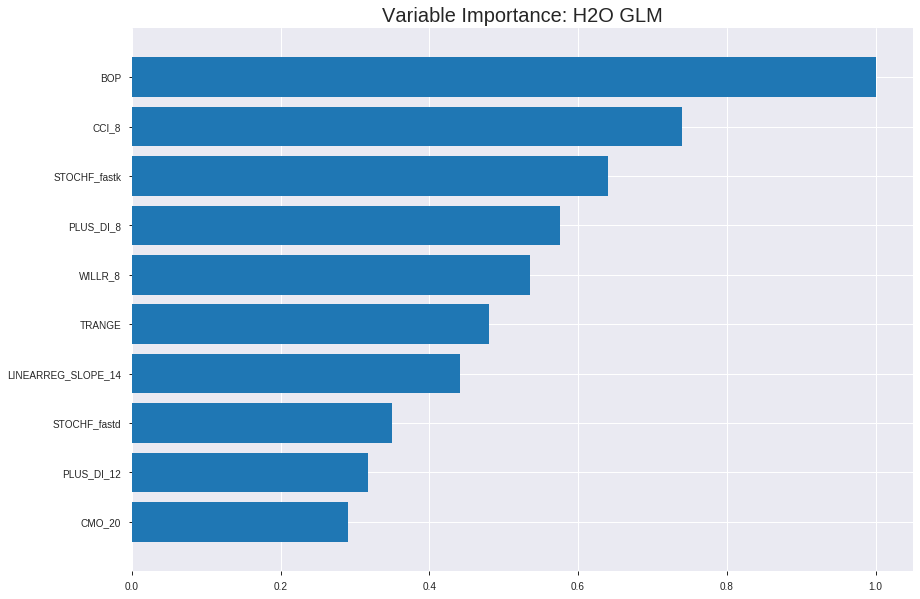

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191208_082616_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.19621386760863802
RMSE: 0.44296034541326385
LogLoss: 0.5759391948386726
Null degrees of freedom: 4318
Residual degrees of freedom: 4268
Null deviance: 5956.860179047515
Residual deviance: 4974.962765016454
AIC: 5076.962765016454
AUC: 0.7655567500515064
pr_auc: 0.7046859553041225
Gini: 0.5311135001030127
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.36241171858007953: 


,0,1,Error,Rate
0,1257.0,1084.0,0.463,(1084.0/2341.0)
1,312.0,1666.0,0.1577,(312.0/1978.0)
Total,1569.0,2750.0,0.3232,(1396.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3624117,0.7047377,243.0
max f2,0.2195966,0.8223253,311.0
max f0point5,0.5225434,0.6764577,166.0
max accuracy,0.5085986,0.7015513,174.0
max precision,0.9564515,1.0,0.0
max recall,0.0378343,1.0,393.0
max specificity,0.9564515,1.0,0.0
max absolute_mcc,0.4357619,0.4017342,209.0
max min_per_class_accuracy,0.4755943,0.6971689,191.0
max mean_per_class_accuracy,0.4357619,0.7010771,209.0


Gains/Lift Table: Avg response rate: 45.80 %, avg score: 45.80 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.8567408,1.7368899,1.7368899,0.7954545,0.8812150,0.7954545,0.8812150,0.0176946,0.0176946,73.6889880,73.6889880
,2,0.0201436,0.8387540,1.8280622,1.7819520,0.8372093,0.8479300,0.8160920,0.8647638,0.0182002,0.0358948,82.8062172,78.1952047
,3,0.0300996,0.8268527,1.5741646,1.7132224,0.7209302,0.8326449,0.7846154,0.8541398,0.0156724,0.0515672,57.4164648,71.3222369
,4,0.0400556,0.8121736,1.7772827,1.7291449,0.8139535,0.8203399,0.7919075,0.8457387,0.0176946,0.0692619,77.7282667,72.9144871
,5,0.0500116,0.8002402,1.6757237,1.7185101,0.7674419,0.8072931,0.7870370,0.8380852,0.0166835,0.0859454,67.5723658,71.8510092
,6,0.1000232,0.7528253,1.7993812,1.7589456,0.8240741,0.7754919,0.8055556,0.8067885,0.0899899,0.1759353,79.9381156,75.8945624
,7,0.1500347,0.7171806,1.5870946,1.7016620,0.7268519,0.7353337,0.7793210,0.7829703,0.0793731,0.2553084,58.7094615,70.1661954
,8,0.2000463,0.6793385,1.6174213,1.6806018,0.7407407,0.6975754,0.7696759,0.7616215,0.0808898,0.3361982,61.7421264,68.0601782
,9,0.3000695,0.6092378,1.4101892,1.5904642,0.6458333,0.6446681,0.7283951,0.7226371,0.1410516,0.4772497,41.0189164,59.0464242
,10,0.4000926,0.5330302,1.2787737,1.5125416,0.5856481,0.5719865,0.6927083,0.6849744,0.1279070,0.6051567,27.8773686,51.2541603




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.19563653070852638
RMSE: 0.44230818521538395
LogLoss: 0.5741530633116003
Null degrees of freedom: 1233
Residual degrees of freedom: 1183
Null deviance: 1705.9557175251716
Residual deviance: 1417.0097602530298
AIC: 1519.0097602530298
AUC: 0.7680135799245031
pr_auc: 0.7203666154007518
Gini: 0.5360271598490063
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3486962106895388: 


,0,1,Error,Rate
0,352.0,305.0,0.4642,(305.0/657.0)
1,83.0,494.0,0.1438,(83.0/577.0)
Total,435.0,799.0,0.3144,(388.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3486962,0.7180233,248.0
max f2,0.2129316,0.8300811,318.0
max f0point5,0.4488598,0.6836248,200.0
max accuracy,0.4473125,0.7098865,201.0
max precision,0.9401947,1.0,0.0
max recall,0.0623844,1.0,388.0
max specificity,0.9401947,1.0,0.0
max absolute_mcc,0.4473125,0.4251729,201.0
max min_per_class_accuracy,0.4707513,0.6984402,188.0
max mean_per_class_accuracy,0.4473125,0.7126717,201.0


Gains/Lift Table: Avg response rate: 46.76 %, avg score: 45.70 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.8644485,1.8096254,1.8096254,0.8461538,0.8855932,0.8461538,0.8855932,0.0190641,0.0190641,80.9625383,80.9625383
,2,0.0202593,0.8412010,2.1386482,1.9675563,1.0,0.8536712,0.92,0.8702707,0.0207972,0.0398614,113.8648180,96.7556326
,3,0.0299838,0.8216098,1.6039861,1.8496417,0.75,0.8292995,0.8648649,0.8569827,0.0155979,0.0554593,60.3986135,84.9641669
,4,0.0405186,0.8064718,1.9741368,1.8820104,0.9230769,0.8145440,0.88,0.8459487,0.0207972,0.0762565,97.4136782,88.2010399
,5,0.0502431,0.7933537,1.9604275,1.8971879,0.9166667,0.8008682,0.8870968,0.8372234,0.0190641,0.0953206,96.0427499,89.7187902
,6,0.1004862,0.7488940,1.5867390,1.7419634,0.7419355,0.7694087,0.8145161,0.8033161,0.0797227,0.1750433,58.6738972,74.1963437
,7,0.1499190,0.7173512,1.6127511,1.6993583,0.7540984,0.7314861,0.7945946,0.7796316,0.0797227,0.2547660,61.2751087,69.9358284
,8,0.2001621,0.6801557,1.4487617,1.6364555,0.6774194,0.6983898,0.7651822,0.7592389,0.0727903,0.3275563,44.8761670,63.6455490
,9,0.2998379,0.6001862,1.4779276,1.5837557,0.6910569,0.6398976,0.7405405,0.7195660,0.1473137,0.4748700,47.7927604,58.3755679
,10,0.4003241,0.5288687,1.2762900,1.5065781,0.5967742,0.5663608,0.7044534,0.6811096,0.1282496,0.6031196,27.6290043,50.6578070



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-08 08:26:16,0.000 sec,2,.2E2,51,1.3669417,1.3693641
,2019-12-08 08:26:16,0.014 sec,4,.12E2,51,1.3608194,1.3627825
,2019-12-08 08:26:16,0.028 sec,6,.76E1,51,1.3523048,1.3535891
,2019-12-08 08:26:16,0.043 sec,8,.47E1,51,1.3408787,1.3411972
,2019-12-08 08:26:16,0.057 sec,10,.29E1,51,1.3261280,1.3251281
---,---,---,---,---,---,---,---
,2019-12-08 08:26:17,0.283 sec,40,.23E-2,51,1.1504698,1.1484370
,2019-12-08 08:26:17,0.298 sec,42,.14E-2,51,1.1493876,1.1488817
,2019-12-08 08:26:17,0.312 sec,44,.89E-3,51,1.1485730,1.1495556
,2019-12-08 08:26:17,0.321 sec,45,.55E-3,51,1.1479885,1.1504006



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7163695299837926)

('F1', 0.7489481065918655)

('auc', 0.7796954207946825)

('logloss', 0.5729296023532978)

('mean_per_class_error', 0.2853484360867462)

('rmse', 0.4413054249387014)

('mse', 0.1947504780803278)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           0
4           1
...       ...
6165        1
6166        0
6167        1
6168        1
6169        1

[6170 rows x 1 columns]


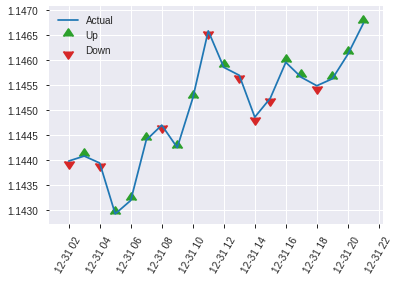


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.1947504780803278
RMSE: 0.4413054249387014
LogLoss: 0.5729296023532978
Null degrees of freedom: 616
Residual degrees of freedom: 566
Null deviance: 862.9188841257723
Residual deviance: 706.9951293039695
AIC: 808.9951293039695
AUC: 0.7796954207946825
pr_auc: 0.779866150346176
Gini: 0.5593908415893649
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3586115808903173: 


,0,1,Error,Rate
0,171.0,128.0,0.4281,(128.0/299.0)
1,51.0,267.0,0.1604,(51.0/318.0)
Total,222.0,395.0,0.2901,(179.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3586116,0.7489481,254.0
max f2,0.1788025,0.8578567,338.0
max f0point5,0.4984773,0.7252441,185.0
max accuracy,0.4205022,0.7163695,225.0
max precision,0.9086589,1.0,0.0
max recall,0.0509326,1.0,391.0
max specificity,0.9086589,1.0,0.0
max absolute_mcc,0.4205022,0.4324806,225.0
max min_per_class_accuracy,0.4652699,0.6956522,203.0
max mean_per_class_accuracy,0.4205022,0.7146516,225.0


Gains/Lift Table: Avg response rate: 51.54 %, avg score: 45.59 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.8508483,1.9402516,1.9402516,1.0,0.8783952,1.0,0.8783952,0.0220126,0.0220126,94.0251572,94.0251572
,2,0.0210697,0.8265423,1.9402516,1.9402516,1.0,0.8370538,1.0,0.8593145,0.0188679,0.0408805,94.0251572,94.0251572
,3,0.0307942,0.8176721,1.9402516,1.9402516,1.0,0.8218752,1.0,0.8474916,0.0188679,0.0597484,94.0251572,94.0251572
,4,0.0405186,0.8115142,1.6168763,1.8626415,0.8333333,0.8150504,0.96,0.8397057,0.0157233,0.0754717,61.6876310,86.2641509
,5,0.0502431,0.7964940,1.6168763,1.8150741,0.8333333,0.8027780,0.9354839,0.8325584,0.0157233,0.0911950,61.6876310,81.5074052
,6,0.1004862,0.7534635,1.7524853,1.7837797,0.9032258,0.7758349,0.9193548,0.8041967,0.0880503,0.1792453,75.2485291,78.3779671
,7,0.1507293,0.7155481,1.3143640,1.6273078,0.6774194,0.7318907,0.8387097,0.7800947,0.0660377,0.2452830,31.4363968,62.7307770
,8,0.2009724,0.6801853,1.4395415,1.5803662,0.7419355,0.6971660,0.8145161,0.7593625,0.0723270,0.3176101,43.9541489,58.0366200
,9,0.2998379,0.6050301,1.5267553,1.5626891,0.7868852,0.6403248,0.8054054,0.7201122,0.1509434,0.4685535,52.6755336,56.2689104
,10,0.4003241,0.5342998,1.1578921,1.4610801,0.5967742,0.5702452,0.7530364,0.6824938,0.1163522,0.5849057,15.7892067,46.1080131


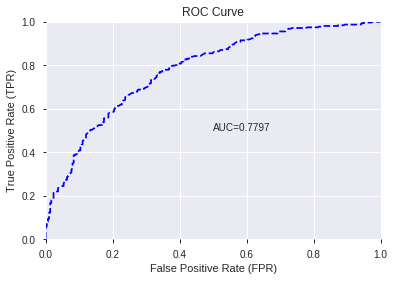

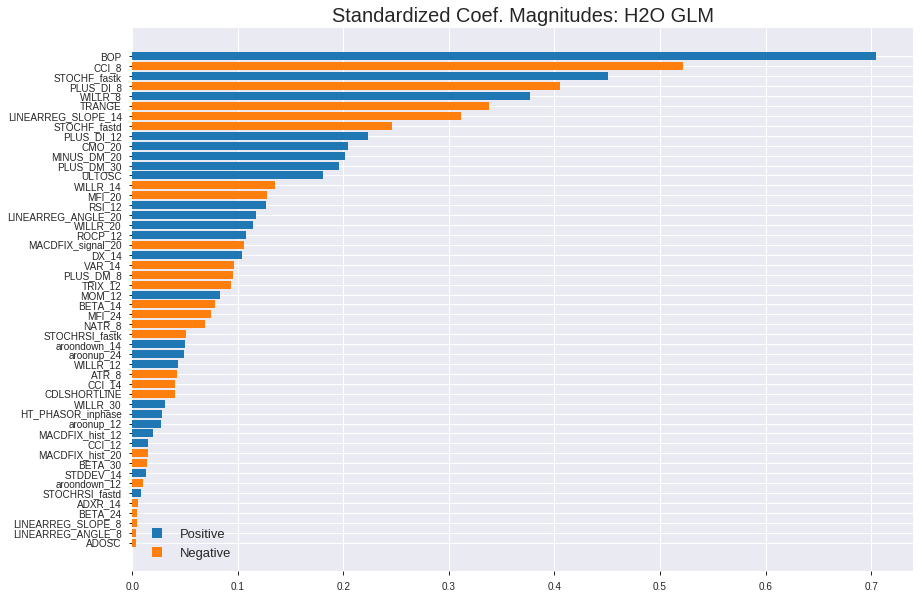

'log_likelihood'
--2019-12-08 08:26:26--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.128.243
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.128.243|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


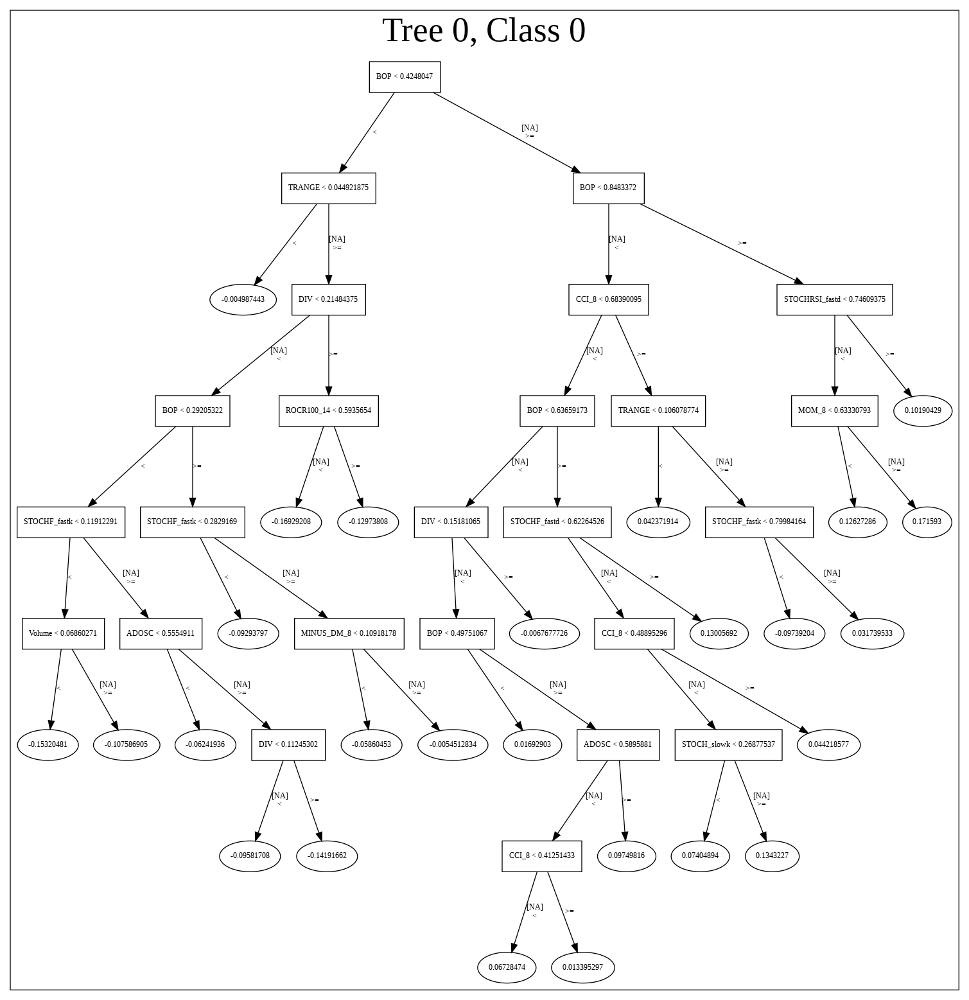

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191208_082616_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191208_082616_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_121_sid_afcd',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_121

['BOP',
 'CCI_8',
 'STOCHF_fastk',
 'PLUS_DI_8',
 'WILLR_8',
 'TRANGE',
 'LINEARREG_SLOPE_14',
 'STOCHF_fastd',
 'PLUS_DI_12',
 'CMO_20',
 'MINUS_DM_20',
 'PLUS_DM_30',
 'ULTOSC',
 'WILLR_14',
 'MFI_20',
 'RSI_12',
 'LINEARREG_ANGLE_20',
 'WILLR_20',
 'ROCP_12',
 'MACDFIX_signal_20',
 'DX_14',
 'VAR_14',
 'PLUS_DM_8',
 'TRIX_12',
 'MOM_12',
 'BETA_14',
 'MFI_24',
 'NATR_8',
 'STOCHRSI_fastk',
 'aroondown_14',
 'aroonup_24',
 'WILLR_12',
 'ATR_8',
 'CCI_14',
 'CDLSHORTLINE',
 'WILLR_30',
 'HT_PHASOR_inphase',
 'aroonup_12',
 'MACDFIX_hist_12',
 'CCI_12',
 'MACDFIX_hist_20',
 'BETA_30',
 'STDDEV_14',
 'aroondown_12',
 'STOCHRSI_fastd',
 'ADXR_14',
 'BETA_24',
 'LINEARREG_SLOPE_8',
 'LINEARREG_ANGLE_8',
 'ADOSC']

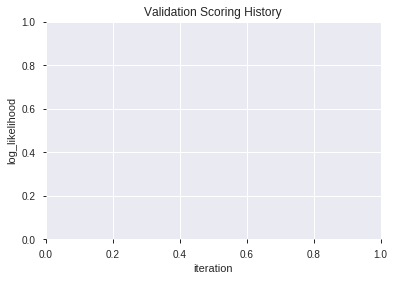

In [93]:
# GLM with recursive feature elimination
model_train(feature_name='RFE',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20191208_082723_model_6,0.782251,0.572252,0.315801,0.440251,0.193821
1,XGBoost_grid_1_AutoML_20191208_082723_model_4,0.780595,0.572333,0.309212,0.440645,0.194168
2,XGBoost_grid_1_AutoML_20191208_082723_model_3,0.778065,0.573164,0.305868,0.441376,0.194813
3,XGBoost_3_AutoML_20191208_082723,0.776940,0.575707,0.306740,0.442392,0.195711
4,XGBoost_grid_1_AutoML_20191208_082723_model_2,0.775841,0.576608,0.314129,0.442690,0.195974
5,XGBoost_1_AutoML_20191208_082723,0.770645,0.581453,0.287247,0.444641,0.197705
6,XGBoost_grid_1_AutoML_20191208_082723_model_1,0.768163,0.583164,0.310485,0.446204,0.199098
7,XGBoost_grid_1_AutoML_20191208_082723_model_7,0.765208,0.587302,0.303796,0.447125,0.199921
8,XGBoost_2_AutoML_20191208_082723,0.760191,0.591984,0.298553,0.449667,0.202200
9,XGBoost_grid_1_AutoML_20191208_082723_model_5,0.758182,0.598832,0.316101,0.451272,0.203646


,variable,relative_importance,scaled_importance,percentage
0,BOP,4622.445312,1.000000,0.256318
1,TRANGE,1163.809448,0.251774,0.064534
2,STOCHF_fastk,1047.069702,0.226519,0.058061
3,CCI_8,569.118347,0.123121,0.031558
4,STOCHRSI_fastk,514.945923,0.111401,0.028554
5,ULTOSC,420.821045,0.091039,0.023335
6,STOCHRSI_fastd,417.660217,0.090355,0.023160
7,ADOSC,415.603973,0.089910,0.023046
8,STDDEV_14,390.526886,0.084485,0.021655
9,HT_PHASOR_inphase,385.323792,0.083359,0.021366


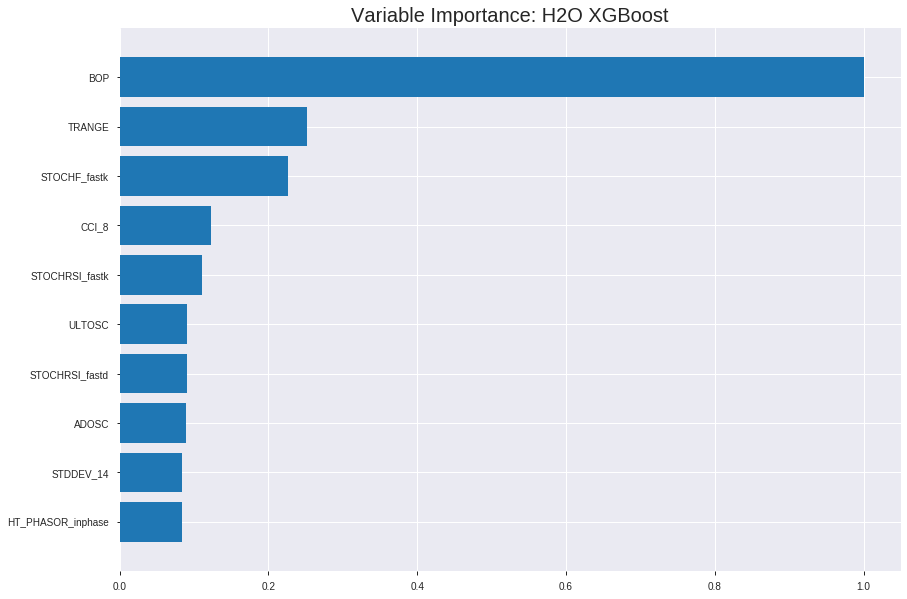

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20191208_082723_model_6


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.15679992051233174
RMSE: 0.39597969709611597
LogLoss: 0.4841160229526163
Mean Per-Class Error: 0.2172418603787325
AUC: 0.8712081292336159
pr_auc: 0.8564874978265441
Gini: 0.7424162584672318
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.411319147456776: 


,0,1,Error,Rate
0,1560.0,781.0,0.3336,(781.0/2341.0)
1,251.0,1727.0,0.1269,(251.0/1978.0)
Total,1811.0,2508.0,0.2389,(1032.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4113191,0.7699510,229.0
max f2,0.3109114,0.8604224,272.0
max f0point5,0.5859877,0.7879402,141.0
max accuracy,0.5389563,0.7867562,166.0
max precision,0.9107484,1.0,0.0
max recall,0.1311141,1.0,361.0
max specificity,0.9107484,1.0,0.0
max absolute_mcc,0.5389563,0.5693557,166.0
max min_per_class_accuracy,0.5008587,0.7770475,186.0
max mean_per_class_accuracy,0.5278752,0.7827581,172.0


Gains/Lift Table: Avg response rate: 45.80 %, avg score: 45.99 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.8672696,2.1835187,2.1835187,1.0,0.8851527,1.0,0.8851527,0.0222447,0.0222447,118.3518706,118.3518706
,2,0.0201436,0.8493673,2.1835187,2.1835187,1.0,0.8577394,1.0,0.8716036,0.0217391,0.0439838,118.3518706,118.3518706
,3,0.0300996,0.8291174,2.1327392,2.1667224,0.9767442,0.8381504,0.9923077,0.8605383,0.0212336,0.0652174,113.2739201,116.6722408
,4,0.0400556,0.8135444,2.1327392,2.1582757,0.9767442,0.8206211,0.9884393,0.8506167,0.0212336,0.0864510,113.2739201,115.8275715
,5,0.0500116,0.7997228,2.1327392,2.1531921,0.9767442,0.8080623,0.9861111,0.8421452,0.0212336,0.1076845,113.2739201,115.3192057
,6,0.1000232,0.7485459,2.1329743,2.1430832,0.9768519,0.7731836,0.9814815,0.8076644,0.1066734,0.2143579,113.2974291,114.3083174
,7,0.1500347,0.7071486,1.9813410,2.0891691,0.9074074,0.7270966,0.9567901,0.7808085,0.0990900,0.3134479,98.1341048,108.9169132
,8,0.2000463,0.6730716,1.8195989,2.0217766,0.8333333,0.6894808,0.9259259,0.7579766,0.0910010,0.4044489,81.9598921,102.1776579
,9,0.3000695,0.6107741,1.6224757,1.8886763,0.7430556,0.6402072,0.8649691,0.7187201,0.1622851,0.5667341,62.2475705,88.8676288
,10,0.4000926,0.5541804,1.3293181,1.7488367,0.6087963,0.5818643,0.8009259,0.6845062,0.1329626,0.6996967,32.9318101,74.8836741




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.19706869867902732
RMSE: 0.4439242037544555
LogLoss: 0.5774794084656466
Mean Per-Class Error: 0.2925724565999014
AUC: 0.7632983283608863
pr_auc: 0.7208069479625581
Gini: 0.5265966567217726
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3986826688051224: 


,0,1,Error,Rate
0,389.0,268.0,0.4079,(268.0/657.0)
1,104.0,473.0,0.1802,(104.0/577.0)
Total,493.0,741.0,0.3015,(372.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3986827,0.7177542,232.0
max f2,0.1897959,0.8293769,336.0
max f0point5,0.5538033,0.6813745,158.0
max accuracy,0.4475136,0.7034036,209.0
max precision,0.9034727,1.0,0.0
max recall,0.0934825,1.0,386.0
max specificity,0.9034727,1.0,0.0
max absolute_mcc,0.3986827,0.4195361,232.0
max min_per_class_accuracy,0.4969316,0.6967071,186.0
max mean_per_class_accuracy,0.4451711,0.7074275,210.0


Gains/Lift Table: Avg response rate: 46.76 %, avg score: 46.34 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.8663638,2.1386482,2.1386482,1.0,0.8817714,1.0,0.8817714,0.0225303,0.0225303,113.8648180,113.8648180
,2,0.0202593,0.8278873,1.9604275,2.0531023,0.9166667,0.8424656,0.96,0.8629046,0.0190641,0.0415945,96.0427499,105.3102253
,3,0.0299838,0.8118481,1.7822068,1.9652443,0.8333333,0.8207745,0.9189189,0.8492408,0.0173310,0.0589255,78.2206817,96.5244274
,4,0.0405186,0.7984348,1.6451140,1.8820104,0.7692308,0.8047377,0.88,0.8376700,0.0173310,0.0762565,64.5113985,88.2010399
,5,0.0502431,0.7846804,1.7822068,1.8626936,0.8333333,0.7924107,0.8709677,0.8289101,0.0173310,0.0935875,78.2206817,86.2693576
,6,0.1004862,0.7369627,1.6557276,1.7592106,0.7741935,0.7620140,0.8225806,0.7954620,0.0831889,0.1767764,65.5727623,75.9210600
,7,0.1499190,0.7010025,1.4374521,1.6531172,0.6721311,0.7192962,0.7729730,0.7703479,0.0710572,0.2478336,43.7452056,65.3117242
,8,0.2001621,0.6693848,1.4142673,1.5931630,0.6612903,0.6868416,0.7449393,0.7493868,0.0710572,0.3188908,41.4267345,59.3163017
,9,0.2998379,0.6135179,1.5474771,1.5779755,0.7235772,0.6413341,0.7378378,0.7134666,0.1542461,0.4731369,54.7477139,57.7975549
,10,0.4003241,0.5538338,1.2762900,1.5022488,0.5967742,0.5852349,0.7024291,0.6812789,0.1282496,0.6013865,27.6290043,50.2248823



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 08:27:41,11.863 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5420236,0.5,0.6931472,0.5,0.0,1.0,0.5324149
,2019-12-08 08:27:41,11.935 sec,5.0,0.4763950,0.6467358,0.7918554,0.7488461,2.0379508,0.3093309,0.4808211,0.6552831,0.7489297,0.7024487,1.9858876,0.3371151
,2019-12-08 08:27:41,11.992 sec,10.0,0.4596685,0.6142088,0.8061245,0.7709904,2.1338933,0.3049317,0.4682962,0.6305901,0.7544825,0.7098683,2.1386482,0.3241491
,2019-12-08 08:27:41,12.059 sec,15.0,0.4478672,0.5908772,0.8126278,0.7828256,2.1835187,0.2901135,0.4606894,0.6152125,0.7568473,0.7104534,1.9741368,0.3403566
,2019-12-08 08:27:41,12.190 sec,20.0,0.4389828,0.5730184,0.8193839,0.7920178,2.1835187,0.2910396,0.4551880,0.6037383,0.7591832,0.7108288,1.9741368,0.3103728
,2019-12-08 08:27:41,12.252 sec,25.0,0.4319262,0.5584591,0.8249509,0.7995422,2.1835187,0.2789998,0.4522795,0.5971942,0.7568711,0.7093024,1.9741368,0.3330632
,2019-12-08 08:27:42,12.312 sec,30.0,0.4266403,0.5472284,0.8286426,0.8022581,2.1835187,0.2829359,0.4491323,0.5902105,0.7611115,0.7159781,1.9741368,0.3071313
,2019-12-08 08:27:42,12.371 sec,35.0,0.4217181,0.5368173,0.8337571,0.8081975,2.1338933,0.2720537,0.4477303,0.5868617,0.7608200,0.7187136,1.9741368,0.3160454
,2019-12-08 08:27:42,12.439 sec,40.0,0.4175821,0.5280632,0.8396934,0.8175165,2.1835187,0.2688122,0.4463757,0.5837164,0.7618580,0.7202613,1.9741368,0.3022690
,2019-12-08 08:27:42,12.503 sec,45.0,0.4145184,0.5214460,0.8437466,0.8232060,2.1835187,0.2641815,0.4448579,0.5803206,0.7646582,0.7234854,1.9741368,0.3200972


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,4622.4453125,1.0,0.2563177
TRANGE,1163.8094482,0.2517735,0.0645340
STOCHF_fastk,1047.0697021,0.2265186,0.0580607
CCI_8,569.1183472,0.1231206,0.0315580
STOCHRSI_fastk,514.9459229,0.1114012,0.0285541
---,---,---,---
aroondown_14,68.1859970,0.0147511,0.0037810
ROCP_12,53.7691040,0.0116322,0.0029815
VAR_14,42.0800209,0.0091034,0.0023334
LINEARREG_SLOPE_8,27.9651394,0.0060499,0.0015507



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7147487844408428)

('F1', 0.747019867549669)

('auc', 0.7822511095685829)

('logloss', 0.5722515712169349)

('mean_per_class_error', 0.2857217980269662)

('rmse', 0.4402509650255953)

('mse', 0.19382091220596795)

xgboost prediction progress: |████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
6165        1
6166        0
6167        1
6168        1
6169        1

[6170 rows x 1 columns]


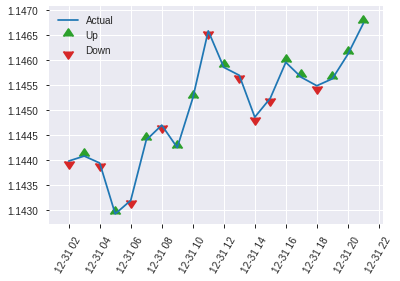


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.19382091220596795
RMSE: 0.4402509650255953
LogLoss: 0.5722515712169349
Mean Per-Class Error: 0.2857217980269662
AUC: 0.7822511095685829
pr_auc: 0.7745471354917349
Gini: 0.5645022191371658
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3156929314136505: 


,0,1,Error,Rate
0,144.0,155.0,0.5184,(155.0/299.0)
1,36.0,282.0,0.1132,(36.0/318.0)
Total,180.0,437.0,0.3096,(191.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3156929,0.7470199,275.0
max f2,0.1283541,0.8512352,375.0
max f0point5,0.5507197,0.7363770,164.0
max accuracy,0.4852789,0.7147488,198.0
max precision,0.7646466,0.9268293,30.0
max recall,0.0586585,1.0,397.0
max specificity,0.8932516,0.9966555,0.0
max absolute_mcc,0.5507197,0.4334488,164.0
max min_per_class_accuracy,0.5013945,0.7106918,191.0
max mean_per_class_accuracy,0.4852789,0.7142782,198.0


Gains/Lift Table: Avg response rate: 51.54 %, avg score: 46.95 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.8567626,1.6630728,1.6630728,0.8571429,0.8733029,0.8571429,0.8733029,0.0188679,0.0188679,66.3072776,66.3072776
,2,0.0210697,0.8334139,1.6168763,1.6417513,0.8333333,0.8443798,0.8461538,0.8599538,0.0157233,0.0345912,61.6876310,64.1751330
,3,0.0307942,0.8083724,1.6168763,1.6338961,0.8333333,0.8223617,0.8421053,0.8480826,0.0157233,0.0503145,61.6876310,63.3896061
,4,0.0405186,0.7954315,1.9402516,1.7074214,1.0,0.7987053,0.88,0.8362321,0.0188679,0.0691824,94.0251572,70.7421384
,5,0.0502431,0.7869414,1.9402516,1.7524853,1.0,0.7928184,0.9032258,0.8278294,0.0188679,0.0880503,94.0251572,75.2485291
,6,0.1004862,0.7397924,1.5647190,1.6586022,0.8064516,0.7580303,0.8548387,0.7929298,0.0786164,0.1666667,56.4719010,65.8602151
,7,0.1507293,0.7054252,1.8150741,1.7107595,0.9354839,0.7218882,0.8817204,0.7692493,0.0911950,0.2578616,81.5074052,71.0759451
,8,0.2009724,0.6776571,1.6273078,1.6898965,0.8387097,0.6912820,0.8709677,0.7497575,0.0817610,0.3396226,62.7307770,68.9896531
,9,0.2998379,0.6183000,1.3677183,1.5836648,0.7049180,0.6479379,0.8162162,0.7161845,0.1352201,0.4748428,36.7718321,58.3664797
,10,0.4003241,0.5675494,1.2517752,1.5003565,0.6451613,0.5915704,0.7732794,0.6849049,0.1257862,0.6006289,25.1775208,50.0356479


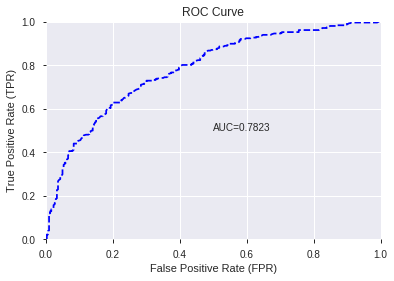

This function is available for GLM models only


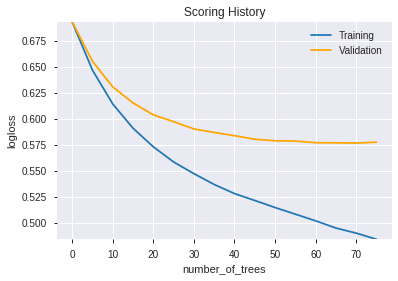

--2019-12-08 08:27:53--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.8.83
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.8.83|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.co

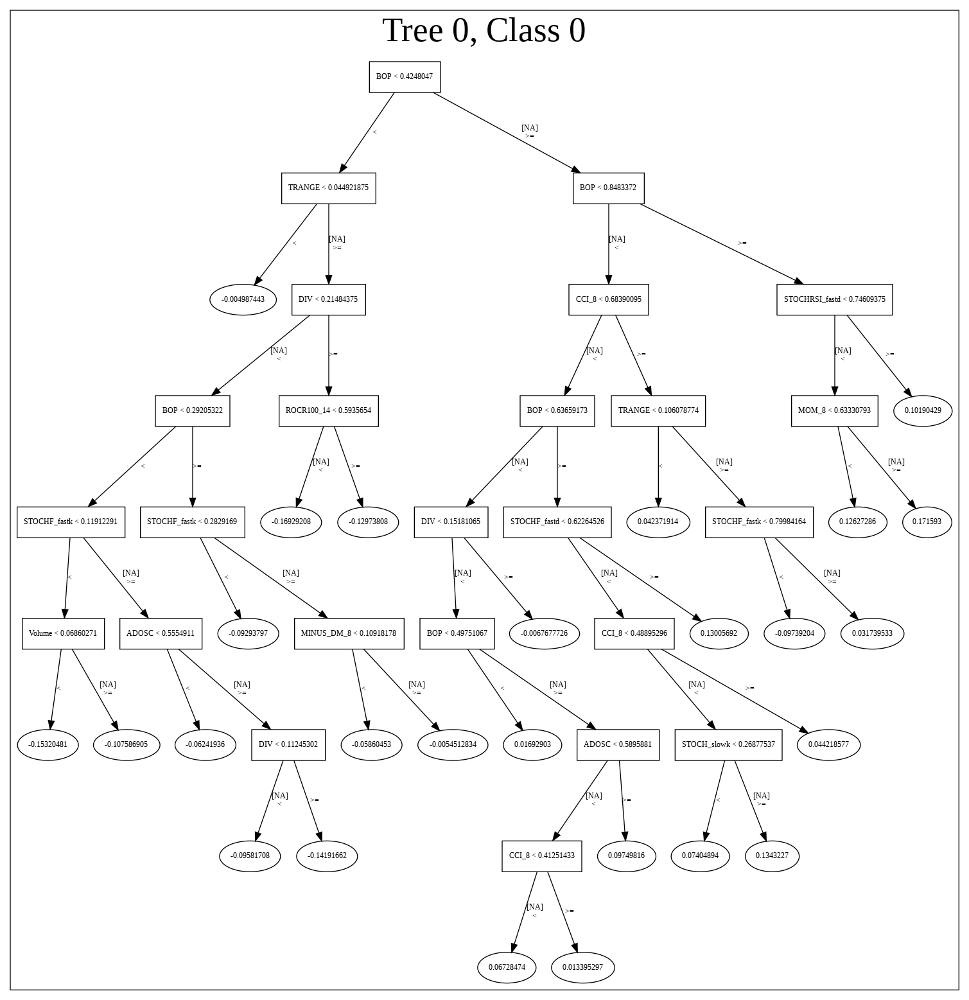

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20191208_082723_model_6',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20191208_082723_model_6',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_126_sid_afcd',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_trainin

['BOP',
 'TRANGE',
 'STOCHF_fastk',
 'CCI_8',
 'STOCHRSI_fastk',
 'ULTOSC',
 'STOCHRSI_fastd',
 'ADOSC',
 'STDDEV_14',
 'HT_PHASOR_inphase',
 'WILLR_8',
 'BETA_24',
 'BETA_30',
 'ADXR_14',
 'CCI_12',
 'BETA_14',
 'MFI_20',
 'CCI_14',
 'MACDFIX_signal_20',
 'STOCHF_fastd',
 'DX_14',
 'MACDFIX_hist_20',
 'PLUS_DI_8',
 'MFI_24',
 'PLUS_DM_30',
 'MINUS_DM_20',
 'LINEARREG_ANGLE_8',
 'TRIX_12',
 'ATR_8',
 'WILLR_20',
 'aroonup_12',
 'NATR_8',
 'CMO_20',
 'WILLR_30',
 'PLUS_DM_8',
 'PLUS_DI_12',
 'LINEARREG_ANGLE_20',
 'MACDFIX_hist_12',
 'WILLR_14',
 'WILLR_12',
 'RSI_12',
 'LINEARREG_SLOPE_14',
 'MOM_12',
 'aroondown_12',
 'aroonup_24',
 'aroondown_14',
 'ROCP_12',
 'VAR_14',
 'LINEARREG_SLOPE_8',
 'CDLSHORTLINE']

In [94]:
# XGBoost with recursive feature elimination
model_train(feature_name='RFE',model_algo="XGBoost",features_list=features_list)

In [95]:
# DRF with recursive feature elimination
model_train(feature_name='RFE',model_algo="DRF",features_list=features_list)

Output hidden; open in https://colab.research.google.com to view.

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GBM_5_AutoML_20191208_083007,0.779138,0.573591,0.279659,0.440796,0.194301
1,GBM_1_AutoML_20191208_083007,0.773559,0.579415,0.306141,0.443377,0.196584
2,GBM_grid_1_AutoML_20191208_083007_model_1,0.771087,0.613824,0.329679,0.460107,0.211699
3,GBM_grid_1_AutoML_20191208_083007_model_2,0.769893,0.618011,0.322790,0.462220,0.213647
4,GBM_grid_1_AutoML_20191208_083007_model_4,0.768105,0.654081,0.318846,0.480355,0.230741
5,GBM_3_AutoML_20191208_083007,0.764335,0.590564,0.336467,0.449031,0.201628
6,GBM_4_AutoML_20191208_083007,0.763741,0.590259,0.349072,0.449504,0.202054
7,GBM_grid_1_AutoML_20191208_083007_model_5,0.760522,0.693481,0.362950,0.500178,0.250178
8,GBM_2_AutoML_20191208_083007,0.754859,0.592772,0.336567,0.450711,0.203140
9,GBM_grid_1_AutoML_20191208_083007_model_3,0.723665,0.737221,0.359679,0.490275,0.240370


,variable,relative_importance,scaled_importance,percentage
0,BOP,672.439697,1.000000,0.333174
1,STOCHRSI_fastk,149.040176,0.221641,0.073845
2,STOCHF_fastk,115.992043,0.172494,0.057471
3,TRANGE,100.726418,0.149792,0.049907
4,CCI_8,73.239731,0.108916,0.036288
5,WILLR_8,68.695335,0.102158,0.034036
6,CCI_12,46.230827,0.068751,0.022906
7,aroonup_12,45.283340,0.067342,0.022437
8,STOCHRSI_fastd,44.317314,0.065905,0.021958
9,PLUS_DI_8,32.905708,0.048935,0.016304


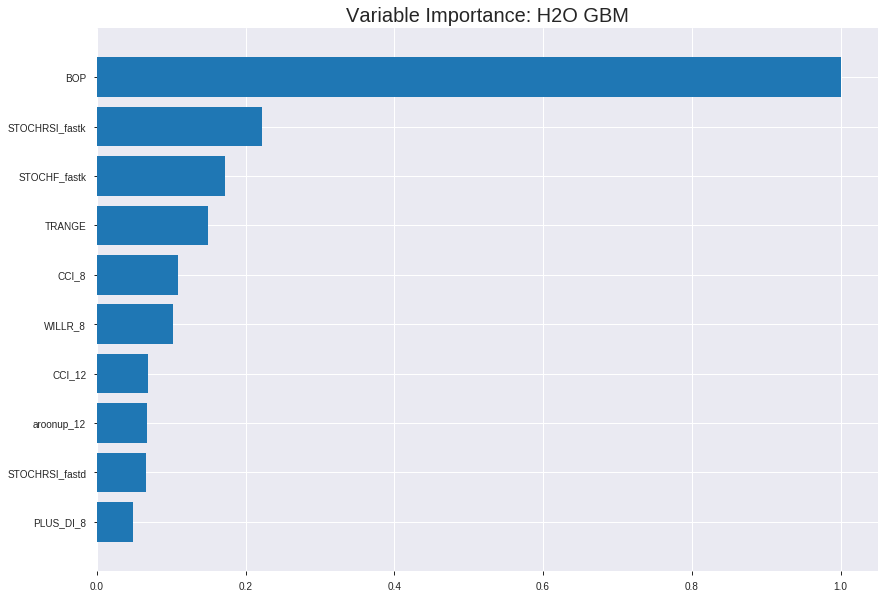

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_5_AutoML_20191208_083007


ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.15817642145437216
RMSE: 0.39771399454177137
LogLoss: 0.4875410348146614
Mean Per-Class Error: 0.22146959139168176
AUC: 0.8621701164755929
pr_auc: 0.8367886655849173
Gini: 0.7243402329511859
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.45884689134106865: 


,0,1,Error,Rate
0,1755.0,586.0,0.2503,(586.0/2341.0)
1,381.0,1597.0,0.1926,(381.0/1978.0)
Total,2136.0,2183.0,0.2239,(967.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4588469,0.7676039,202.0
max f2,0.2647045,0.8567821,293.0
max f0point5,0.5902426,0.7796178,139.0
max accuracy,0.5128338,0.7779579,177.0
max precision,0.9128936,1.0,0.0
max recall,0.0816232,1.0,386.0
max specificity,0.9128936,1.0,0.0
max absolute_mcc,0.4588469,0.5551227,202.0
max min_per_class_accuracy,0.4855832,0.7736010,191.0
max mean_per_class_accuracy,0.4588469,0.7785304,202.0


Gains/Lift Table: Avg response rate: 45.80 %, avg score: 45.72 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.8677630,2.0842679,2.0842679,0.9545455,0.8861407,0.9545455,0.8861407,0.0212336,0.0212336,108.4267856,108.4267856
,2,0.0201436,0.8437759,2.1327392,2.1082250,0.9767442,0.8563729,0.9655172,0.8714279,0.0212336,0.0424671,113.2739201,110.8224957
,3,0.0300996,0.8304460,2.0311802,2.0827409,0.9302326,0.8365083,0.9538462,0.8598775,0.0202224,0.0626896,103.1180191,108.2740919
,4,0.0400556,0.8162842,2.1835187,2.1077897,1.0,0.8226879,0.9653179,0.8506339,0.0217391,0.0844287,118.3518706,110.7789733
,5,0.0500116,0.8058218,2.0819597,2.1026476,0.9534884,0.8111606,0.9629630,0.8427758,0.0207280,0.1051567,108.1959696,110.2647643
,6,0.1000232,0.7598504,2.0318855,2.0672666,0.9305556,0.7820048,0.9467593,0.8123903,0.1016178,0.2067745,103.1885462,106.7266552
,7,0.1500347,0.7264092,2.0116677,2.0487336,0.9212963,0.7420849,0.9382716,0.7889552,0.1006067,0.3073812,101.1667697,104.8733600
,8,0.2000463,0.6930984,1.7993812,1.9863955,0.8240741,0.7095407,0.9097222,0.7691015,0.0899899,0.3973711,79.9381156,98.6395489
,9,0.3000695,0.6240258,1.6022579,1.8583496,0.7337963,0.6575895,0.8510802,0.7319309,0.1602629,0.5576340,60.2257939,85.8349639
,10,0.4000926,0.5460441,1.3192092,1.7235645,0.6041667,0.5833594,0.7893519,0.6947880,0.1319515,0.6895854,31.9209218,72.3564534




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.1956163249898189
RMSE: 0.4422853434038018
LogLoss: 0.5748518355159079
Mean Per-Class Error: 0.28732171073283586
AUC: 0.7674503876398419
pr_auc: 0.7219544870979034
Gini: 0.5349007752796837
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.35445789602071665: 


,0,1,Error,Rate
0,359.0,298.0,0.4536,(298.0/657.0)
1,88.0,489.0,0.1525,(88.0/577.0)
Total,447.0,787.0,0.3128,(386.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3544579,0.7170088,255.0
max f2,0.1709604,0.8308693,346.0
max f0point5,0.4992527,0.6943961,187.0
max accuracy,0.4992527,0.7139384,187.0
max precision,0.8921044,1.0,0.0
max recall,0.0651494,1.0,396.0
max specificity,0.8921044,1.0,0.0
max absolute_mcc,0.4970082,0.4254020,188.0
max min_per_class_accuracy,0.4846574,0.7047184,196.0
max mean_per_class_accuracy,0.4970082,0.7126783,188.0


Gains/Lift Table: Avg response rate: 46.76 %, avg score: 46.30 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.8619587,1.8096254,1.8096254,0.8461538,0.8770088,0.8461538,0.8770088,0.0190641,0.0190641,80.9625383,80.9625383
,2,0.0202593,0.8420040,1.7822068,1.7964645,0.8333333,0.8518729,0.84,0.8649435,0.0173310,0.0363951,78.2206817,79.6464471
,3,0.0299838,0.8272424,1.9604275,1.8496417,0.9166667,0.8352014,0.8648649,0.8552974,0.0190641,0.0554593,96.0427499,84.9641669
,4,0.0405186,0.8083074,1.9741368,1.8820104,0.9230769,0.8200844,0.88,0.8461420,0.0207972,0.0762565,97.4136782,88.2010399
,5,0.0502431,0.7960856,1.9604275,1.8971879,0.9166667,0.8020347,0.8870968,0.8376051,0.0190641,0.0953206,96.0427499,89.7187902
,6,0.1004862,0.7582561,1.6212333,1.7592106,0.7580645,0.7758843,0.8225806,0.8067447,0.0814558,0.1767764,62.1233298,75.9210600
,7,0.1499190,0.7231191,1.5776913,1.6993583,0.7377049,0.7406893,0.7945946,0.7849643,0.0779896,0.2547660,57.7691281,69.9358284
,8,0.2001621,0.6949933,1.4832560,1.6451140,0.6935484,0.7079850,0.7692308,0.7656416,0.0745234,0.3292894,48.3255996,64.5113985
,9,0.2998379,0.6267766,1.4257655,1.5721954,0.6666667,0.6628717,0.7351351,0.7314775,0.1421144,0.4714038,42.5765453,57.2195419
,10,0.4003241,0.5577265,1.3280315,1.5109073,0.6209677,0.5941158,0.7064777,0.6969981,0.1334489,0.6048527,32.8031531,51.0907318



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-08 08:30:12,0.003 sec,0.0,0.4982309,0.6896110,0.5,0.0,1.0,0.5420236,0.4990407,0.6912300,0.5,0.0,1.0,0.5324149
,2019-12-08 08:30:12,0.113 sec,5.0,0.4603934,0.6151903,0.7937936,0.7337262,1.9755645,0.3174346,0.4656687,0.6252694,0.7688208,0.7151033,2.0128453,0.3144246
,2019-12-08 08:30:12,0.219 sec,10.0,0.4416268,0.5774758,0.8036618,0.7592689,2.0411153,0.3007641,0.4523437,0.5980881,0.7677300,0.7276911,1.9741368,0.3209076
,2019-12-08 08:30:13,0.328 sec,15.0,0.4307723,0.5546981,0.8134454,0.7779166,2.0411153,0.2926603,0.4459391,0.5841646,0.7705539,0.7349672,2.1386482,0.3030794
,2019-12-08 08:30:13,0.434 sec,20.0,0.4223420,0.5370918,0.8239360,0.7902592,2.0346424,0.2796944,0.4441853,0.5797854,0.7678012,0.7318996,2.1386482,0.3038898
,2019-12-08 08:30:13,0.539 sec,25.0,0.4154454,0.5227344,0.8344531,0.8037073,2.0346424,0.2729799,0.4424768,0.5757860,0.7698970,0.7344148,2.1386482,0.3087520
,2019-12-08 08:30:13,0.660 sec,30.0,0.4091083,0.5098527,0.8442741,0.8155318,2.0842679,0.2470479,0.4426454,0.5757005,0.7676535,0.7285796,1.9741368,0.3030794
,2019-12-08 08:30:13,0.864 sec,35.0,0.4032373,0.4982870,0.8535846,0.8272346,2.0842679,0.2359342,0.4417779,0.5737571,0.7690964,0.7268135,1.9741368,0.3136143
,2019-12-08 08:30:13,0.979 sec,40.0,0.3977140,0.4875410,0.8621701,0.8367887,2.0842679,0.2238944,0.4422853,0.5748518,0.7674504,0.7219545,1.8096254,0.3128039


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,672.4396973,1.0,0.3331736
STOCHRSI_fastk,149.0401764,0.2216410,0.0738449
STOCHF_fastk,115.9920425,0.1724943,0.0574706
TRANGE,100.7264175,0.1497925,0.0499069
CCI_8,73.2397308,0.1089164,0.0362881
---,---,---,---
LINEARREG_ANGLE_8,7.7712402,0.0115568,0.0038504
MACDFIX_hist_12,7.7359886,0.0115044,0.0038329
VAR_14,6.9671350,0.0103610,0.0034520
CDLSHORTLINE,6.9312463,0.0103076,0.0034342



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7228525121555915)

('F1', 0.748898678414097)

('auc', 0.7791380071937906)

('logloss', 0.5735905586336625)

('mean_per_class_error', 0.27965861046254803)

('rmse', 0.44079558737986063)

('mse', 0.19430074985355636)

gbm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
6165        1
6166        0
6167        1
6168        1
6169        1

[6170 rows x 1 columns]


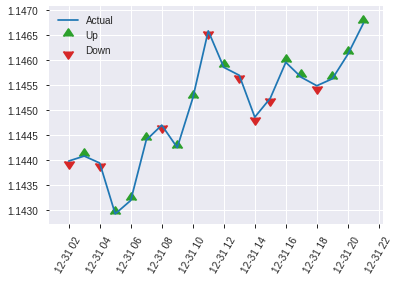


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.19430074985355636
RMSE: 0.44079558737986063
LogLoss: 0.5735905586336625
Mean Per-Class Error: 0.27965861046254803
AUC: 0.7791380071937906
pr_auc: 0.7621214931365466
Gini: 0.5582760143875811
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.41417789751894024: 


,0,1,Error,Rate
0,191.0,108.0,0.3612,(108.0/299.0)
1,63.0,255.0,0.1981,(63.0/318.0)
Total,254.0,363.0,0.2771,(171.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4141779,0.7488987,231.0
max f2,0.1355350,0.8519934,359.0
max f0point5,0.5042740,0.7267833,185.0
max accuracy,0.4141779,0.7228525,231.0
max precision,0.8436054,0.9166667,9.0
max recall,0.0703865,1.0,393.0
max specificity,0.8876125,0.9966555,0.0
max absolute_mcc,0.4141779,0.4475124,231.0
max min_per_class_accuracy,0.4762886,0.6989967,199.0
max mean_per_class_accuracy,0.4141779,0.7203414,231.0


Gains/Lift Table: Avg response rate: 51.54 %, avg score: 46.47 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.8569305,1.6630728,1.6630728,0.8571429,0.8737165,0.8571429,0.8737165,0.0188679,0.0188679,66.3072776,66.3072776
,2,0.0210697,0.8406851,1.6168763,1.6417513,0.8333333,0.8448793,0.8461538,0.8604070,0.0157233,0.0345912,61.6876310,64.1751330
,3,0.0307942,0.8322248,1.6168763,1.6338961,0.8333333,0.8384848,0.8421053,0.8534842,0.0157233,0.0503145,61.6876310,63.3896061
,4,0.0405186,0.8124345,1.9402516,1.7074214,1.0,0.8222608,0.88,0.8459906,0.0188679,0.0691824,94.0251572,70.7421384
,5,0.0502431,0.7908233,1.6168763,1.6898965,0.8333333,0.8038483,0.8709677,0.8378340,0.0157233,0.0849057,61.6876310,68.9896531
,6,0.1004862,0.7554666,1.5647190,1.6273078,0.8064516,0.7735981,0.8387097,0.8057161,0.0786164,0.1635220,56.4719010,62.7307770
,7,0.1507293,0.7220988,1.7524853,1.6690336,0.9032258,0.7374442,0.8602151,0.7829588,0.0880503,0.2515723,75.2485291,66.9033611
,8,0.2009724,0.6911177,1.5021302,1.6273078,0.7741935,0.7097779,0.8387097,0.7646636,0.0754717,0.3270440,50.2130250,62.7307770
,9,0.2998379,0.6269756,1.4313331,1.5626891,0.7377049,0.6612457,0.8054054,0.7305636,0.1415094,0.4685535,43.1333127,56.2689104
,10,0.4003241,0.5551000,1.2517752,1.4846459,0.6451613,0.5888078,0.7651822,0.6949812,0.1257862,0.5943396,25.1775208,48.4645940


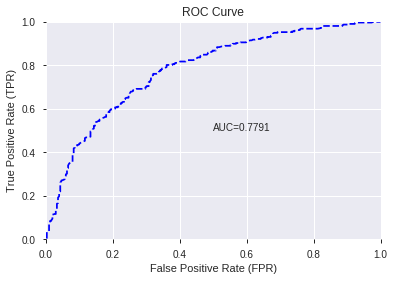

This function is available for GLM models only


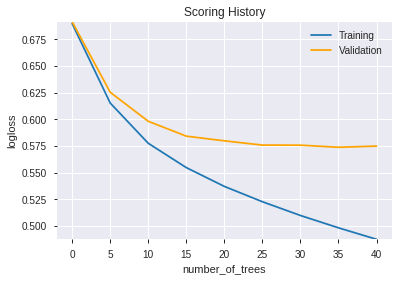

--2019-12-08 08:30:32--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.161.27
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.161.27|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip

Tree inconsistency found:
Note: this is a known issue for DRF and Isolation Forest models, please refer to https://0xdata.atlassian.net/browse/PUBDEV-6140
        Node 2 (parent)
            weight:      3167.0
            depth:       1
            colId:       4
            colName:     WILLR_8
            leftward:    true
            naVsRest:    false
            splitVal:    0.921875
            isBitset:    false
            predValue:   0.080387995
            squaredErr:  787.0887
            leftChild:   Node 5
            rightChild

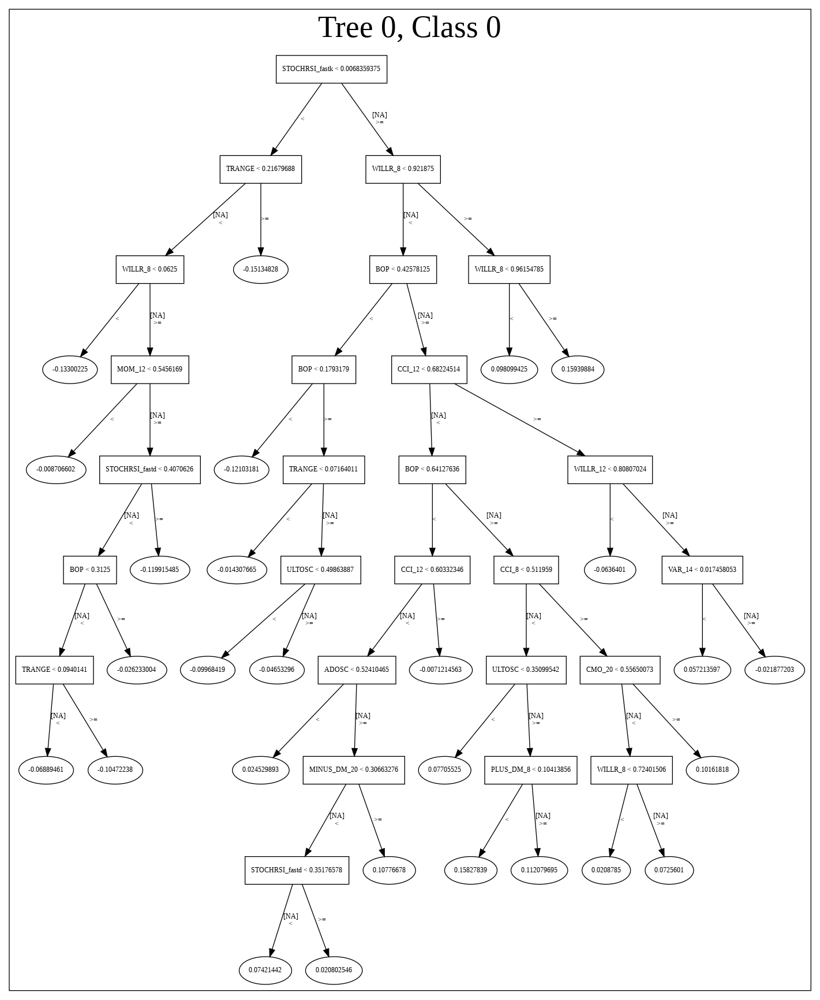

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GBM_5_AutoML_20191208_083007',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GBM_5_AutoML_20191208_083007',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_136_sid_afcd',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_136_sid_afcd',
   'type': 'Ke

['BOP',
 'STOCHRSI_fastk',
 'STOCHF_fastk',
 'TRANGE',
 'CCI_8',
 'WILLR_8',
 'CCI_12',
 'aroonup_12',
 'STOCHRSI_fastd',
 'PLUS_DI_8',
 'ULTOSC',
 'WILLR_12',
 'ADOSC',
 'DX_14',
 'MACDFIX_signal_20',
 'STOCHF_fastd',
 'CCI_14',
 'MFI_20',
 'WILLR_20',
 'BETA_30',
 'MFI_24',
 'WILLR_14',
 'NATR_8',
 'WILLR_30',
 'aroondown_12',
 'MACDFIX_hist_20',
 'aroonup_24',
 'PLUS_DM_30',
 'BETA_24',
 'BETA_14',
 'MINUS_DM_20',
 'PLUS_DI_12',
 'LINEARREG_SLOPE_14',
 'ATR_8',
 'STDDEV_14',
 'ADXR_14',
 'TRIX_12',
 'LINEARREG_ANGLE_20',
 'HT_PHASOR_inphase',
 'PLUS_DM_8',
 'MOM_12',
 'aroondown_14',
 'CMO_20',
 'RSI_12',
 'ROCP_12',
 'LINEARREG_ANGLE_8',
 'MACDFIX_hist_12',
 'VAR_14',
 'CDLSHORTLINE',
 'LINEARREG_SLOPE_8']

In [96]:
# GBM with recursive feature elimination
model_train(feature_name='RFE',model_algo="GBM",features_list=features_list)

In [97]:
# StackedEnsemble with recursive feature elimination
model_train(feature_name='RFE',model_algo="StackedEnsemble",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191208_083130_model_1,0.779695,0.572930,0.294236,0.441305,0.194750
1,GBM_5_AutoML_20191208_083130,0.779138,0.573591,0.279659,0.440796,0.194301
2,XGBoost_3_AutoML_20191208_083130,0.776940,0.575707,0.306740,0.442392,0.195711
3,GBM_1_AutoML_20191208_083130,0.773559,0.579415,0.306141,0.443377,0.196584
4,XGBoost_1_AutoML_20191208_083130,0.770645,0.581453,0.287247,0.444641,0.197705
5,GBM_3_AutoML_20191208_083130,0.764335,0.590564,0.336467,0.449031,0.201628
6,GBM_4_AutoML_20191208_083130,0.763741,0.590259,0.349072,0.449504,0.202054
7,XGBoost_2_AutoML_20191208_083130,0.760191,0.591984,0.298553,0.449667,0.202200
8,GBM_2_AutoML_20191208_083130,0.754859,0.592772,0.336567,0.450711,0.203140
9,DRF_1_AutoML_20191208_083130,0.734629,0.772234,0.376801,0.461158,0.212667


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.704841,1.000000,0.109890
1,CCI_8,0.521569,0.739981,0.081316
2,STOCHF_fastk,0.451119,0.640030,0.070333
3,PLUS_DI_8,0.405373,0.575127,0.063201
4,WILLR_8,0.377210,0.535170,0.058810
5,TRANGE,0.338386,0.480089,0.052757
6,LINEARREG_SLOPE_14,0.311359,0.441743,0.048543
7,STOCHF_fastd,0.246222,0.349329,0.038388
8,PLUS_DI_12,0.223442,0.317011,0.034836
9,CMO_20,0.204586,0.290259,0.031896


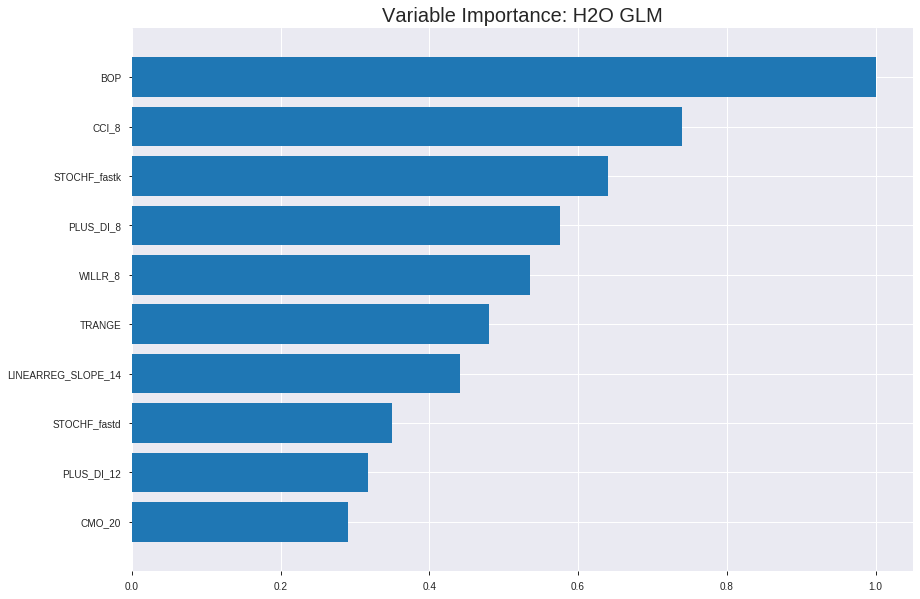

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191208_083130_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.19621386760863802
RMSE: 0.44296034541326385
LogLoss: 0.5759391948386726
Null degrees of freedom: 4318
Residual degrees of freedom: 4268
Null deviance: 5956.860179047515
Residual deviance: 4974.962765016454
AIC: 5076.962765016454
AUC: 0.7655567500515064
pr_auc: 0.7046859553041225
Gini: 0.5311135001030127
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.36241171858007953: 


,0,1,Error,Rate
0,1257.0,1084.0,0.463,(1084.0/2341.0)
1,312.0,1666.0,0.1577,(312.0/1978.0)
Total,1569.0,2750.0,0.3232,(1396.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3624117,0.7047377,243.0
max f2,0.2195966,0.8223253,311.0
max f0point5,0.5225434,0.6764577,166.0
max accuracy,0.5085986,0.7015513,174.0
max precision,0.9564515,1.0,0.0
max recall,0.0378343,1.0,393.0
max specificity,0.9564515,1.0,0.0
max absolute_mcc,0.4357619,0.4017342,209.0
max min_per_class_accuracy,0.4755943,0.6971689,191.0
max mean_per_class_accuracy,0.4357619,0.7010771,209.0


Gains/Lift Table: Avg response rate: 45.80 %, avg score: 45.80 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.8567408,1.7368899,1.7368899,0.7954545,0.8812150,0.7954545,0.8812150,0.0176946,0.0176946,73.6889880,73.6889880
,2,0.0201436,0.8387540,1.8280622,1.7819520,0.8372093,0.8479300,0.8160920,0.8647638,0.0182002,0.0358948,82.8062172,78.1952047
,3,0.0300996,0.8268527,1.5741646,1.7132224,0.7209302,0.8326449,0.7846154,0.8541398,0.0156724,0.0515672,57.4164648,71.3222369
,4,0.0400556,0.8121736,1.7772827,1.7291449,0.8139535,0.8203399,0.7919075,0.8457387,0.0176946,0.0692619,77.7282667,72.9144871
,5,0.0500116,0.8002402,1.6757237,1.7185101,0.7674419,0.8072931,0.7870370,0.8380852,0.0166835,0.0859454,67.5723658,71.8510092
,6,0.1000232,0.7528253,1.7993812,1.7589456,0.8240741,0.7754919,0.8055556,0.8067885,0.0899899,0.1759353,79.9381156,75.8945624
,7,0.1500347,0.7171806,1.5870946,1.7016620,0.7268519,0.7353337,0.7793210,0.7829703,0.0793731,0.2553084,58.7094615,70.1661954
,8,0.2000463,0.6793385,1.6174213,1.6806018,0.7407407,0.6975754,0.7696759,0.7616215,0.0808898,0.3361982,61.7421264,68.0601782
,9,0.3000695,0.6092378,1.4101892,1.5904642,0.6458333,0.6446681,0.7283951,0.7226371,0.1410516,0.4772497,41.0189164,59.0464242
,10,0.4000926,0.5330302,1.2787737,1.5125416,0.5856481,0.5719865,0.6927083,0.6849744,0.1279070,0.6051567,27.8773686,51.2541603




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.19563653070852638
RMSE: 0.44230818521538395
LogLoss: 0.5741530633116003
Null degrees of freedom: 1233
Residual degrees of freedom: 1183
Null deviance: 1705.9557175251716
Residual deviance: 1417.0097602530298
AIC: 1519.0097602530298
AUC: 0.7680135799245031
pr_auc: 0.7203666154007518
Gini: 0.5360271598490063
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3486962106895388: 


,0,1,Error,Rate
0,352.0,305.0,0.4642,(305.0/657.0)
1,83.0,494.0,0.1438,(83.0/577.0)
Total,435.0,799.0,0.3144,(388.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3486962,0.7180233,248.0
max f2,0.2129316,0.8300811,318.0
max f0point5,0.4488598,0.6836248,200.0
max accuracy,0.4473125,0.7098865,201.0
max precision,0.9401947,1.0,0.0
max recall,0.0623844,1.0,388.0
max specificity,0.9401947,1.0,0.0
max absolute_mcc,0.4473125,0.4251729,201.0
max min_per_class_accuracy,0.4707513,0.6984402,188.0
max mean_per_class_accuracy,0.4473125,0.7126717,201.0


Gains/Lift Table: Avg response rate: 46.76 %, avg score: 45.70 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.8644485,1.8096254,1.8096254,0.8461538,0.8855932,0.8461538,0.8855932,0.0190641,0.0190641,80.9625383,80.9625383
,2,0.0202593,0.8412010,2.1386482,1.9675563,1.0,0.8536712,0.92,0.8702707,0.0207972,0.0398614,113.8648180,96.7556326
,3,0.0299838,0.8216098,1.6039861,1.8496417,0.75,0.8292995,0.8648649,0.8569827,0.0155979,0.0554593,60.3986135,84.9641669
,4,0.0405186,0.8064718,1.9741368,1.8820104,0.9230769,0.8145440,0.88,0.8459487,0.0207972,0.0762565,97.4136782,88.2010399
,5,0.0502431,0.7933537,1.9604275,1.8971879,0.9166667,0.8008682,0.8870968,0.8372234,0.0190641,0.0953206,96.0427499,89.7187902
,6,0.1004862,0.7488940,1.5867390,1.7419634,0.7419355,0.7694087,0.8145161,0.8033161,0.0797227,0.1750433,58.6738972,74.1963437
,7,0.1499190,0.7173512,1.6127511,1.6993583,0.7540984,0.7314861,0.7945946,0.7796316,0.0797227,0.2547660,61.2751087,69.9358284
,8,0.2001621,0.6801557,1.4487617,1.6364555,0.6774194,0.6983898,0.7651822,0.7592389,0.0727903,0.3275563,44.8761670,63.6455490
,9,0.2998379,0.6001862,1.4779276,1.5837557,0.6910569,0.6398976,0.7405405,0.7195660,0.1473137,0.4748700,47.7927604,58.3755679
,10,0.4003241,0.5288687,1.2762900,1.5065781,0.5967742,0.5663608,0.7044534,0.6811096,0.1282496,0.6031196,27.6290043,50.6578070



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-08 08:31:36,0.000 sec,2,.2E2,51,1.3669417,1.3693641
,2019-12-08 08:31:36,0.016 sec,4,.12E2,51,1.3608194,1.3627825
,2019-12-08 08:31:36,0.032 sec,6,.76E1,51,1.3523048,1.3535891
,2019-12-08 08:31:36,0.052 sec,8,.47E1,51,1.3408787,1.3411972
,2019-12-08 08:31:36,0.071 sec,10,.29E1,51,1.3261280,1.3251281
---,---,---,---,---,---,---,---
,2019-12-08 08:31:37,0.313 sec,40,.23E-2,51,1.1504698,1.1484370
,2019-12-08 08:31:37,0.329 sec,42,.14E-2,51,1.1493876,1.1488817
,2019-12-08 08:31:37,0.343 sec,44,.89E-3,51,1.1485730,1.1495556
,2019-12-08 08:31:37,0.352 sec,45,.55E-3,51,1.1479885,1.1504006



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7163695299837926)

('F1', 0.7489481065918655)

('auc', 0.7796954207946825)

('logloss', 0.5729296023532978)

('mean_per_class_error', 0.2853484360867462)

('rmse', 0.4413054249387014)

('mse', 0.1947504780803278)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           0
4           1
...       ...
6165        1
6166        0
6167        1
6168        1
6169        1

[6170 rows x 1 columns]


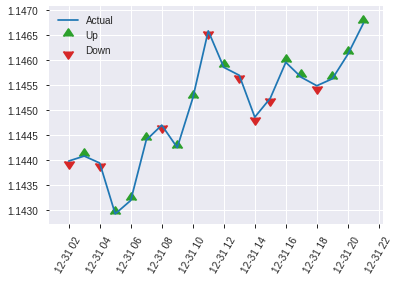


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.1947504780803278
RMSE: 0.4413054249387014
LogLoss: 0.5729296023532978
Null degrees of freedom: 616
Residual degrees of freedom: 566
Null deviance: 862.9188841257723
Residual deviance: 706.9951293039695
AIC: 808.9951293039695
AUC: 0.7796954207946825
pr_auc: 0.779866150346176
Gini: 0.5593908415893649
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3586115808903173: 


,0,1,Error,Rate
0,171.0,128.0,0.4281,(128.0/299.0)
1,51.0,267.0,0.1604,(51.0/318.0)
Total,222.0,395.0,0.2901,(179.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3586116,0.7489481,254.0
max f2,0.1788025,0.8578567,338.0
max f0point5,0.4984773,0.7252441,185.0
max accuracy,0.4205022,0.7163695,225.0
max precision,0.9086589,1.0,0.0
max recall,0.0509326,1.0,391.0
max specificity,0.9086589,1.0,0.0
max absolute_mcc,0.4205022,0.4324806,225.0
max min_per_class_accuracy,0.4652699,0.6956522,203.0
max mean_per_class_accuracy,0.4205022,0.7146516,225.0


Gains/Lift Table: Avg response rate: 51.54 %, avg score: 45.59 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.8508483,1.9402516,1.9402516,1.0,0.8783952,1.0,0.8783952,0.0220126,0.0220126,94.0251572,94.0251572
,2,0.0210697,0.8265423,1.9402516,1.9402516,1.0,0.8370538,1.0,0.8593145,0.0188679,0.0408805,94.0251572,94.0251572
,3,0.0307942,0.8176721,1.9402516,1.9402516,1.0,0.8218752,1.0,0.8474916,0.0188679,0.0597484,94.0251572,94.0251572
,4,0.0405186,0.8115142,1.6168763,1.8626415,0.8333333,0.8150504,0.96,0.8397057,0.0157233,0.0754717,61.6876310,86.2641509
,5,0.0502431,0.7964940,1.6168763,1.8150741,0.8333333,0.8027780,0.9354839,0.8325584,0.0157233,0.0911950,61.6876310,81.5074052
,6,0.1004862,0.7534635,1.7524853,1.7837797,0.9032258,0.7758349,0.9193548,0.8041967,0.0880503,0.1792453,75.2485291,78.3779671
,7,0.1507293,0.7155481,1.3143640,1.6273078,0.6774194,0.7318907,0.8387097,0.7800947,0.0660377,0.2452830,31.4363968,62.7307770
,8,0.2009724,0.6801853,1.4395415,1.5803662,0.7419355,0.6971660,0.8145161,0.7593625,0.0723270,0.3176101,43.9541489,58.0366200
,9,0.2998379,0.6050301,1.5267553,1.5626891,0.7868852,0.6403248,0.8054054,0.7201122,0.1509434,0.4685535,52.6755336,56.2689104
,10,0.4003241,0.5342998,1.1578921,1.4610801,0.5967742,0.5702452,0.7530364,0.6824938,0.1163522,0.5849057,15.7892067,46.1080131


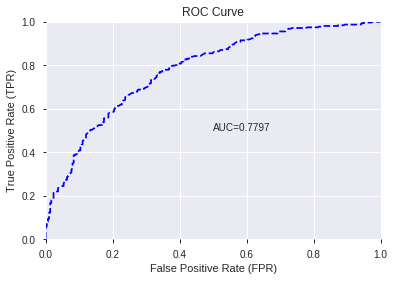

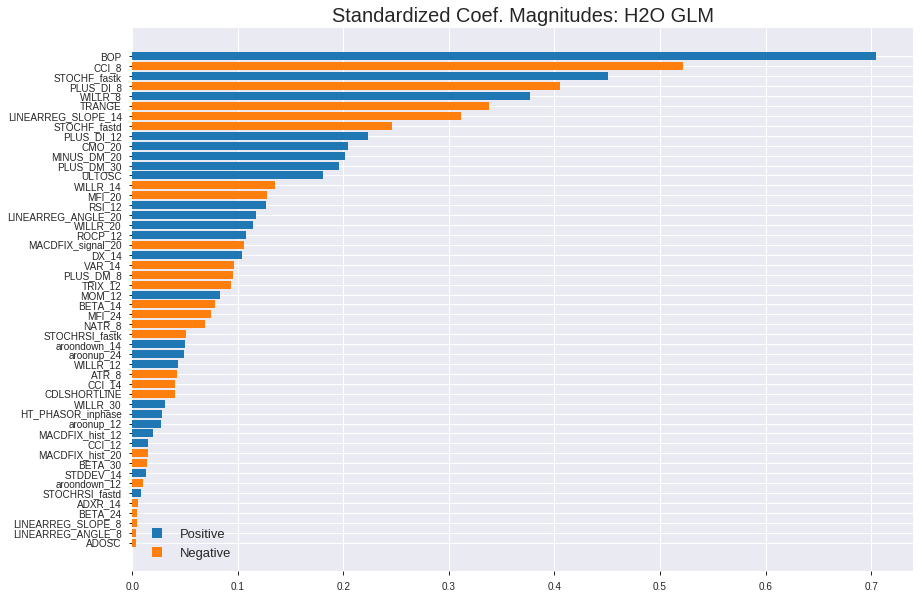

'log_likelihood'
--2019-12-08 08:31:55--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.185.59
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.185.59|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


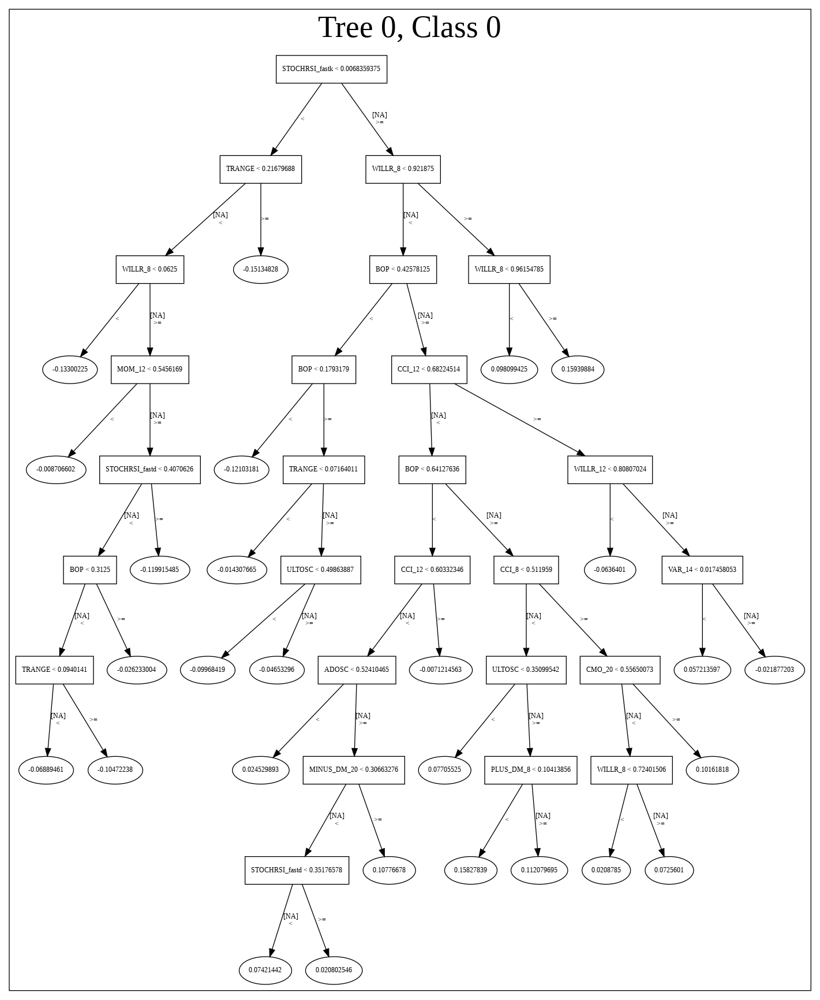

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191208_083130_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191208_083130_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_144_sid_afcd',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_144

['BOP',
 'CCI_8',
 'STOCHF_fastk',
 'PLUS_DI_8',
 'WILLR_8',
 'TRANGE',
 'LINEARREG_SLOPE_14',
 'STOCHF_fastd',
 'PLUS_DI_12',
 'CMO_20',
 'MINUS_DM_20',
 'PLUS_DM_30',
 'ULTOSC',
 'WILLR_14',
 'MFI_20',
 'RSI_12',
 'LINEARREG_ANGLE_20',
 'WILLR_20',
 'ROCP_12',
 'MACDFIX_signal_20',
 'DX_14',
 'VAR_14',
 'PLUS_DM_8',
 'TRIX_12',
 'MOM_12',
 'BETA_14',
 'MFI_24',
 'NATR_8',
 'STOCHRSI_fastk',
 'aroondown_14',
 'aroonup_24',
 'WILLR_12',
 'ATR_8',
 'CCI_14',
 'CDLSHORTLINE',
 'WILLR_30',
 'HT_PHASOR_inphase',
 'aroonup_12',
 'MACDFIX_hist_12',
 'CCI_12',
 'MACDFIX_hist_20',
 'BETA_30',
 'STDDEV_14',
 'aroondown_12',
 'STOCHRSI_fastd',
 'ADXR_14',
 'BETA_24',
 'LINEARREG_SLOPE_8',
 'LINEARREG_ANGLE_8',
 'ADOSC']

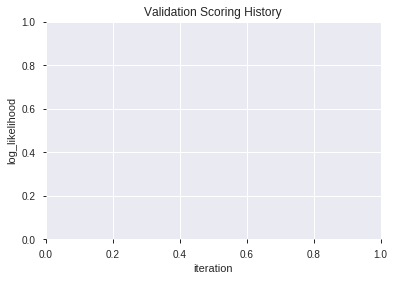

In [98]:
# All algos with recursive feature elimination
model_train(feature_name='RFE',model_algo=None,features_list=features_list)

In [0]:
# recursive feature elimination with cross validation
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'RFECV' in features_to_include:
  from sklearn.feature_selection import RFECV
  from sklearn.svm import LinearSVC
  from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier
  from sklearn.linear_model import LogisticRegression, LinearRegression

  bestfeatures = RFECV(ExtraTreeClassifier(random_state=1,criterion='entropy'), min_features_to_select=select_rfe, step=1,cv=cv_rfe).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, RFECV, LinearSVC, DecisionTreeClassifier,ExtraTreeClassifier, LogisticRegression, LinearRegression
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list = []

In [100]:
# DeepLearning with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="DeepLearning",features_list=features_list)

[]

In [101]:
# GLM with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="GLM",features_list=features_list)

[]

In [102]:
# XGBoost with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="XGBoost",features_list=features_list)

[]

In [103]:
# DRF with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="DRF",features_list=features_list)

[]

In [104]:
# GBM with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="GBM",features_list=features_list)

[]

In [105]:
# StackedEnsemble with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="StackedEnsemble",features_list=features_list)

[]

In [106]:
# All algos with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo=None,features_list=features_list)

[]

In [107]:
# Stacked ensemble

## filter models based on ensemble_model_threshold
models_arr = []
for model_name in best_models:
  if best_models[max(best_models.keys(), key=(lambda k: best_models[k]['AUC']))]['AUC'] - best_models[model_name]['AUC'] <= ensemble_model_threshold:
    models_arr.append(best_models[model_name]['id'])

from h2o.estimators.stackedensemble import H2OStackedEnsembleEstimator

try:
  ensemble = H2OStackedEnsembleEstimator(seed=1,
                                        base_models=models_arr)

  ensemble.train(y=data_label_name, training_frame=train_hf[:index_splits[0],:], blending_frame =train_hf[index_splits[0]:index_splits[1],:])
except:
  pass

try:
  display(ensemble)
  model_performance = ensemble.model_performance(test_data=train_hf[index_splits[1]:,:])
  display(model_performance)
  for k in models_summary:
    result = getattr(model_performance, k)()
    result = result[0][1] if isinstance(result,list) else result
    models_summary[k] = models_summary[k].append(pd.DataFrame({'StackedEnsemble':[result]},index=['All']))
    display((k,result))
except Exception as e:
  print(e)

stackedensemble Model Build progress: |███████████████████████████████████| 100%
Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_model_python_1575787624066_5088
No model summary for this model


ModelMetricsBinomialGLM: stackedensemble
** Reported on train data. **

MSE: 0.13730596986522745
RMSE: 0.3705482018108136
LogLoss: 0.4351084296565154
Null degrees of freedom: 4318
Residual degrees of freedom: 4308
Null deviance: 5958.463393320565
Residual deviance: 3758.46661537298
AIC: 3780.46661537298
AUC: 0.897530352026931
pr_auc: 0.8837087639274275
Gini: 0.795060704053862
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4496573856254229: 


,0,1,Error,Rate
0,1811.0,530.0,0.2264,(530.0/2341.0)
1,307.0,1671.0,0.1552,(307.0/1978.0)
Total,2118.0,2201.0,0.1938,(837.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4496574,0.7997128,216.0
max f2,0.2745199,0.8762745,293.0
max f0point5,0.6498436,0.8166441,129.0
max accuracy,0.5448912,0.8092151,177.0
max precision,0.9260349,1.0,0.0
max recall,0.1193111,1.0,371.0
max specificity,0.9260349,1.0,0.0
max absolute_mcc,0.4742301,0.6168670,206.0
max min_per_class_accuracy,0.4959866,0.8073812,198.0
max mean_per_class_accuracy,0.4742301,0.8094337,206.0


Gains/Lift Table: Avg response rate: 45.80 %, avg score: 46.89 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.9042064,2.1835187,2.1835187,1.0,0.9114213,1.0,0.9114213,0.0222447,0.0222447,118.3518706,118.3518706
,2,0.0201436,0.8942923,2.1835187,2.1835187,1.0,0.8988356,1.0,0.9052008,0.0217391,0.0439838,118.3518706,118.3518706
,3,0.0300996,0.8858597,2.1835187,2.1835187,1.0,0.8902461,1.0,0.9002542,0.0217391,0.0657230,118.3518706,118.3518706
,4,0.0400556,0.8777516,2.1835187,2.1835187,1.0,0.8819072,1.0,0.8956940,0.0217391,0.0874621,118.3518706,118.3518706
,5,0.0500116,0.8691585,2.1835187,2.1835187,1.0,0.8733252,1.0,0.8912409,0.0217391,0.1092012,118.3518706,118.3518706
,6,0.1000232,0.8298708,2.0925388,2.1380287,0.9583333,0.8484921,0.9791667,0.8698665,0.1046512,0.2138524,109.2538760,113.8028733
,7,0.1500347,0.7901642,2.0318855,2.1026476,0.9305556,0.8100932,0.9629630,0.8499421,0.1016178,0.3154702,103.1885462,110.2647643
,8,0.2000463,0.7501701,1.9813410,2.0723210,0.9074074,0.7716955,0.9490741,0.8303804,0.0990900,0.4145602,98.1341048,107.2320994
,9,0.3000695,0.6633538,1.7235645,1.9560688,0.7893519,0.7052271,0.8958333,0.7886626,0.1723964,0.5869565,72.3564534,95.6068841
,10,0.4000926,0.5666973,1.3950258,1.8158081,0.6388889,0.6144672,0.8315972,0.7451138,0.1395349,0.7264914,39.5025840,81.5808090



ModelMetricsBinomialGLM: stackedensemble
** Reported on test data. **

MSE: 0.1882233970354171
RMSE: 0.43384720471084876
LogLoss: 0.5580688238070443
Null degrees of freedom: 616
Residual degrees of freedom: 606
Null deviance: 860.4092717572732
Residual deviance: 688.6569285778926
AIC: 710.6569285778926
AUC: 0.7912643823226269
pr_auc: 0.7858799184558148
Gini: 0.5825287646452537
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.39845899653857436: 


,0,1,Error,Rate
0,189.0,110.0,0.3679,(110.0/299.0)
1,58.0,260.0,0.1824,(58.0/318.0)
Total,247.0,370.0,0.2723,(168.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3984590,0.7558140,235.0
max f2,0.1808302,0.8572232,334.0
max f0point5,0.5315820,0.7448276,179.0
max accuracy,0.3984590,0.7277147,235.0
max precision,0.9294240,1.0,0.0
max recall,0.0813272,1.0,392.0
max specificity,0.9294240,1.0,0.0
max absolute_mcc,0.3984590,0.4587111,235.0
max min_per_class_accuracy,0.4810598,0.7190635,198.0
max mean_per_class_accuracy,0.5315820,0.7275825,179.0


Gains/Lift Table: Avg response rate: 51.54 %, avg score: 47.80 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.8968186,1.6630728,1.6630728,0.8571429,0.9086641,0.8571429,0.9086641,0.0188679,0.0188679,66.3072776,66.3072776
,2,0.0210697,0.8856610,1.9402516,1.7910015,1.0,0.8909647,0.9230769,0.9004951,0.0188679,0.0377358,94.0251572,79.1001451
,3,0.0307942,0.8783355,1.9402516,1.8381331,1.0,0.8805673,0.9473684,0.8942022,0.0188679,0.0566038,94.0251572,83.8133069
,4,0.0405186,0.8736565,1.9402516,1.8626415,1.0,0.8754295,0.96,0.8896967,0.0188679,0.0754717,94.0251572,86.2641509
,5,0.0502431,0.8654832,1.6168763,1.8150741,0.8333333,0.8699420,0.9354839,0.8858732,0.0157233,0.0911950,61.6876310,81.5074052
,6,0.1004862,0.8139220,1.5647190,1.6898965,0.8064516,0.8403305,0.8709677,0.8631019,0.0786164,0.1698113,56.4719010,68.9896531
,7,0.1507293,0.7826749,1.6898965,1.6898965,0.8709677,0.7974221,0.8709677,0.8412086,0.0849057,0.2547170,68.9896531,68.9896531
,8,0.2009724,0.7300861,1.5647190,1.6586022,0.8064516,0.7542890,0.8548387,0.8194787,0.0786164,0.3333333,56.4719010,65.8602151
,9,0.2998379,0.6613982,1.3995257,1.5731770,0.7213115,0.6935680,0.8108108,0.7779622,0.1383648,0.4716981,39.9525724,57.3176951
,10,0.4003241,0.5812647,1.3456583,1.5160670,0.6935484,0.6218673,0.7813765,0.7387805,0.1352201,0.6069182,34.5658349,51.6067018


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7277147487844409)

('F1', 0.755813953488372)

('auc', 0.7912643823226269)

('logloss', 0.5580688238070443)

('mean_per_class_error', 0.27241749226983025)

('rmse', 0.43384720471084876)

('mse', 0.1882233970354171)

Parse progress: |█████████████████████████████████████████████████████████| 100%
AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191208_083304_model_1,0.789592,0.566863,0.287547,0.437285,0.191218
1,GBM_grid_1_AutoML_20191208_083304_model_1,0.772428,0.689032,0.326734,0.497962,0.247967
2,GBM_grid_1_AutoML_20191208_083304_model_3,0.772423,0.610158,0.326534,0.457986,0.209751
3,XGBoost_grid_1_AutoML_20191208_083304_model_193,0.768074,0.786985,0.324762,0.493112,0.243160
4,XGBoost_grid_1_AutoML_20191208_083304_model_189,0.767737,0.797608,0.302097,0.498913,0.248914
...,...,...,...,...,...,...
271,DeepLearning_grid_1_AutoML_20191208_083304_model_42,0.705549,6.971098,0.331398,0.578223,0.334342
272,XGBoost_grid_1_AutoML_20191208_083304_model_155,0.704828,0.895845,0.317047,0.521485,0.271947
273,DeepLearning_grid_1_AutoML_20191208_083304_model_29,0.694448,6.367974,0.334743,0.587436,0.345081
274,DeepLearning_grid_1_AutoML_20191208_083304_model_37,0.690767,7.641711,0.322837,0.577917,0.333988


,variable,relative_importance,scaled_importance,percentage
0,XGBF_['DRF']predict,0.103829,1.000000,0.081927
1,DLF_['DRF']predict,0.103697,0.998732,0.081823
2,XGBF_['DRF'],0.097774,0.941691,0.077149
3,DLF_['DRF'],0.094641,0.911507,0.074677
4,XGBF_None,0.038652,0.372264,0.030498
5,XGBF_['GBM'],0.038648,0.372224,0.030495
6,All_['XGBoost'],0.036780,0.354238,0.029022
7,RFE_['XGBoost'],0.034420,0.331504,0.027159
8,Fwe_['GBM'],0.033771,0.325260,0.026647
9,Fwe_None,0.033761,0.325157,0.026639


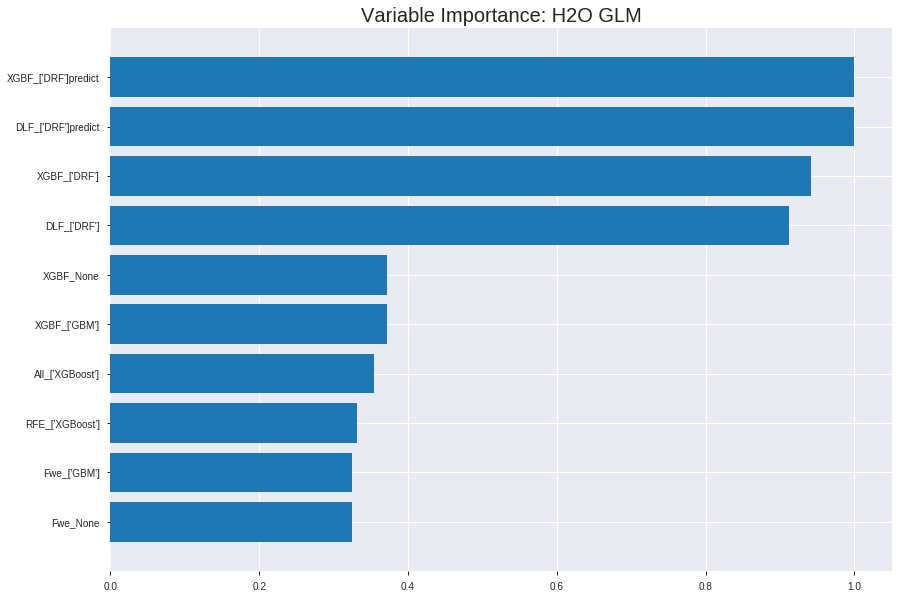

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191208_083304_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.1194030459089161
RMSE: 0.34554745825850913
LogLoss: 0.4025779739513837
Null degrees of freedom: 4318
Residual degrees of freedom: 4268
Null deviance: 5956.860179047402
Residual deviance: 3477.468538992053
AIC: 3579.468538992053
AUC: 0.9488225672487063
pr_auc: 0.9467176343965695
Gini: 0.8976451344974126
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5598360902540014: 


,0,1,Error,Rate
0,2189.0,152.0,0.0649,(152.0/2341.0)
1,355.0,1623.0,0.1795,(355.0/1978.0)
Total,2544.0,1775.0,0.1174,(507.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5598361,0.8649081,156.0
max f2,0.2705755,0.9034368,299.0
max f0point5,0.5988331,0.9104902,137.0
max accuracy,0.5731762,0.8837694,149.0
max precision,0.8279239,1.0,0.0
max recall,0.2279979,1.0,321.0
max specificity,0.8279239,1.0,0.0
max absolute_mcc,0.5812135,0.7694010,145.0
max min_per_class_accuracy,0.5008378,0.8614762,185.0
max mean_per_class_accuracy,0.5670985,0.8781037,152.0


Gains/Lift Table: Avg response rate: 45.80 %, avg score: 45.80 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.8066574,2.1835187,2.1835187,1.0,0.8127368,1.0,0.8127368,0.0222447,0.0222447,118.3518706,118.3518706
,2,0.0201436,0.7987022,2.1835187,2.1835187,1.0,0.8028550,1.0,0.8078527,0.0217391,0.0439838,118.3518706,118.3518706
,3,0.0300996,0.7908309,2.1835187,2.1835187,1.0,0.7946575,1.0,0.8034882,0.0217391,0.0657230,118.3518706,118.3518706
,4,0.0400556,0.7847498,2.1835187,2.1835187,1.0,0.7874012,1.0,0.7994897,0.0217391,0.0874621,118.3518706,118.3518706
,5,0.0500116,0.7798823,2.1835187,2.1835187,1.0,0.7820271,1.0,0.7960133,0.0217391,0.1092012,118.3518706,118.3518706
,6,0.1000232,0.7590657,2.1835187,2.1835187,1.0,0.7696423,1.0,0.7828278,0.1092012,0.2184024,118.3518706,118.3518706
,7,0.1500347,0.7412300,2.1734098,2.1801491,0.9953704,0.7499743,0.9984568,0.7718767,0.1086957,0.3270981,117.3409823,118.0149078
,8,0.2000463,0.7166485,2.1127565,2.1633009,0.9675926,0.7287534,0.9907407,0.7610958,0.1056623,0.4327604,111.2756525,116.3300940
,9,0.3000695,0.6648394,2.0672666,2.1312895,0.9467593,0.6919394,0.9760802,0.7380437,0.2067745,0.6395349,106.7266552,113.1289477
,10,0.4000926,0.5692951,1.7033468,2.0243038,0.7800926,0.6214562,0.9270833,0.7088968,0.1703741,0.8099090,70.3346768,102.4303800




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.1896628051393205
RMSE: 0.435502933559948
LogLoss: 0.5615220744199753
Null degrees of freedom: 1233
Residual degrees of freedom: 1183
Null deviance: 1705.9557175251416
Residual deviance: 1385.836479668499
AIC: 1487.836479668499
AUC: 0.7863496434874132
pr_auc: 0.7502917654949631
Gini: 0.5726992869748264
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.42614895821456283: 


,0,1,Error,Rate
0,410.0,247.0,0.376,(247.0/657.0)
1,108.0,469.0,0.1872,(108.0/577.0)
Total,518.0,716.0,0.2877,(355.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4261490,0.7254447,231.0
max f2,0.1621731,0.8321039,365.0
max f0point5,0.5739659,0.6973086,160.0
max accuracy,0.5165773,0.7188006,189.0
max precision,0.8171418,1.0,0.0
max recall,0.1355113,1.0,388.0
max specificity,0.8171418,1.0,0.0
max absolute_mcc,0.4715940,0.4450890,208.0
max min_per_class_accuracy,0.5505827,0.7140381,173.0
max mean_per_class_accuracy,0.4715940,0.7223093,208.0


Gains/Lift Table: Avg response rate: 46.76 %, avg score: 47.08 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.7972747,1.9741368,1.9741368,0.9230769,0.8070974,0.9230769,0.8070974,0.0207972,0.0207972,97.4136782,97.4136782
,2,0.0202593,0.7850401,1.9604275,1.9675563,0.9166667,0.7910346,0.92,0.7993872,0.0190641,0.0398614,96.0427499,96.7556326
,3,0.0299838,0.7801496,2.1386482,2.0230456,1.0,0.7826469,0.9459459,0.7939579,0.0207972,0.0606586,113.8648180,102.3045576
,4,0.0405186,0.7721037,1.6451140,1.9247834,0.7692308,0.7764363,0.9,0.7894023,0.0173310,0.0779896,64.5113985,92.4783362
,5,0.0502431,0.7614693,1.7822068,1.8971879,0.8333333,0.7657336,0.8870968,0.7848213,0.0173310,0.0953206,78.2206817,89.7187902
,6,0.1004862,0.7338125,1.8281993,1.8626936,0.8548387,0.7470637,0.8709677,0.7659425,0.0918544,0.1871750,82.8199251,86.2693576
,7,0.1499190,0.7161928,1.7529903,1.8265211,0.8196721,0.7245313,0.8540541,0.7522880,0.0866551,0.2738302,75.2990312,82.6521149
,8,0.2001621,0.7020464,1.4832560,1.7403574,0.6935484,0.7096135,0.8137652,0.7415762,0.0745234,0.3483536,48.3255996,74.0357426
,9,0.2998379,0.6634609,1.3214412,1.6010961,0.6178862,0.6834399,0.7486486,0.7222498,0.1317158,0.4800693,32.1441152,60.1096070
,10,0.4003241,0.6089255,1.2590429,1.5152366,0.5887097,0.6371301,0.7085020,0.7008837,0.1265165,0.6065858,25.9042880,51.5236565



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-08 08:33:07,0.000 sec,2,.48E2,51,1.2517333,1.2934675
,2019-12-08 08:33:07,0.015 sec,4,.3E2,51,1.1976203,1.2588699
,2019-12-08 08:33:07,0.031 sec,6,.18E2,51,1.1319043,1.2204435
,2019-12-08 08:33:07,0.044 sec,8,.11E2,51,1.0576284,1.1831941
,2019-12-08 08:33:07,0.059 sec,10,.71E1,51,0.9783064,1.1526780
,2019-12-08 08:33:07,0.072 sec,12,.44E1,51,0.8946159,1.1322922
,2019-12-08 08:33:07,0.087 sec,14,.27E1,51,0.8051559,1.1230441
,2019-12-08 08:33:07,0.102 sec,16,.17E1,51,0.7077668,1.1240379
,2019-12-08 08:33:07,0.116 sec,18,.11E1,51,0.6039221,1.1342846
,2019-12-08 08:33:07,0.130 sec,20,.65E0,51,0.4992386,1.1534481


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7228525121555915)

('F1', 0.7531734837799718)

('auc', 0.7895921415199513)

('logloss', 0.5668629048741365)

('mean_per_class_error', 0.2762615426684336)

('rmse', 0.4372849760859932)

('mse', 0.19121815031052766)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
6165        0
6166        0
6167        1
6168        1
6169        1

[6170 rows x 1 columns]


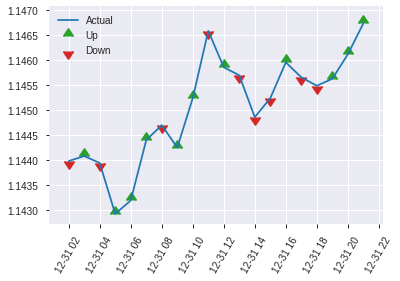


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.19121815031052766
RMSE: 0.4372849760859932
LogLoss: 0.5668629048741365
Null degrees of freedom: 616
Residual degrees of freedom: 566
Null deviance: 862.9188841257633
Residual deviance: 699.5088246146844
AIC: 801.5088246146844
AUC: 0.7895921415199513
pr_auc: 0.7824819567637463
Gini: 0.5791842830399025
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3699438255858271: 


,0,1,Error,Rate
0,175.0,124.0,0.4147,(124.0/299.0)
1,51.0,267.0,0.1604,(51.0/318.0)
Total,226.0,391.0,0.2836,(175.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3699438,0.7531735,256.0
max f2,0.1735080,0.8589815,346.0
max f0point5,0.6142541,0.7437408,155.0
max accuracy,0.5686300,0.7228525,180.0
max precision,0.8188175,1.0,0.0
max recall,0.1234991,1.0,392.0
max specificity,0.8188175,1.0,0.0
max absolute_mcc,0.5686300,0.4476936,180.0
max min_per_class_accuracy,0.5364341,0.7106918,192.0
max mean_per_class_accuracy,0.5686300,0.7237385,180.0


Gains/Lift Table: Avg response rate: 51.54 %, avg score: 47.88 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.7969357,1.6630728,1.6630728,0.8571429,0.8028697,0.8571429,0.8028697,0.0188679,0.0188679,66.3072776,66.3072776
,2,0.0210697,0.7888773,1.9402516,1.7910015,1.0,0.7937985,0.9230769,0.7986830,0.0188679,0.0377358,94.0251572,79.1001451
,3,0.0307942,0.7804583,1.2935010,1.6338961,0.6666667,0.7838972,0.8421053,0.7940138,0.0125786,0.0503145,29.3501048,63.3896061
,4,0.0405186,0.7724156,1.9402516,1.7074214,1.0,0.7770403,0.88,0.7899402,0.0188679,0.0691824,94.0251572,70.7421384
,5,0.0502431,0.7676963,1.9402516,1.7524853,1.0,0.7700198,0.9032258,0.7860846,0.0188679,0.0880503,94.0251572,75.2485291
,6,0.1004862,0.7420462,1.6898965,1.7211909,0.8709677,0.7531858,0.8870968,0.7696352,0.0849057,0.1729560,68.9896531,72.1190911
,7,0.1507293,0.7214657,1.6898965,1.7107595,0.8709677,0.7311593,0.8817204,0.7568099,0.0849057,0.2578616,68.9896531,71.0759451
,8,0.2009724,0.7000806,1.4395415,1.6429550,0.7419355,0.7104546,0.8467742,0.7452211,0.0723270,0.3301887,43.9541489,64.2954960
,9,0.2998379,0.6649853,1.4313331,1.5731770,0.7377049,0.6831053,0.8108108,0.7247397,0.1415094,0.4716981,43.1333127,57.3176951
,10,0.4003241,0.6203122,1.2830696,1.5003565,0.6612903,0.6451952,0.7732794,0.7047730,0.1289308,0.6006289,28.3069588,50.0356479


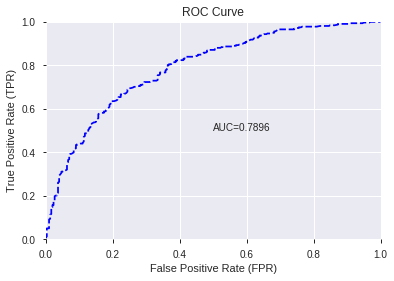

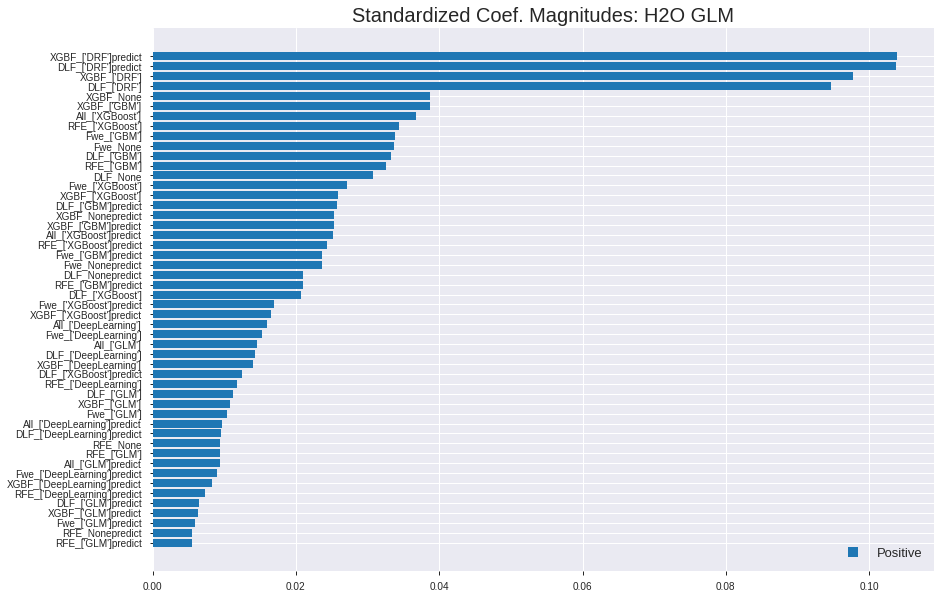

'log_likelihood'
--2019-12-08 09:13:57--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.228.248
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.228.248|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


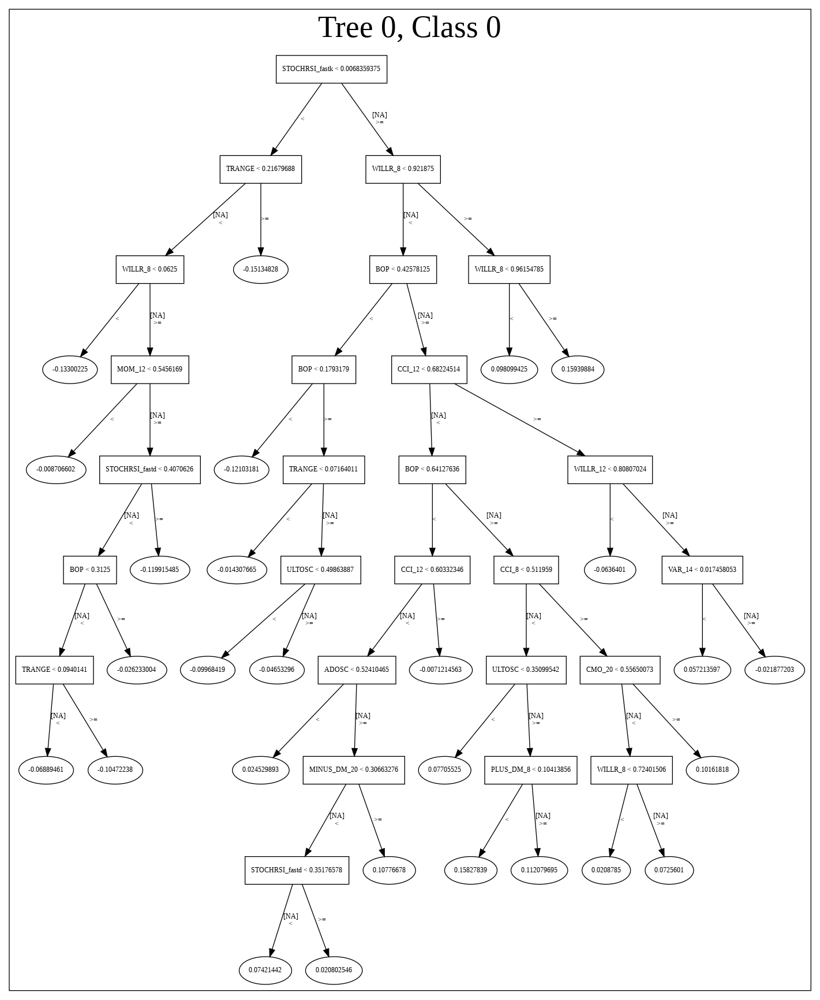

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191208_083304_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191208_083304_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_153_sid_afcd',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_153

["XGBF_['DRF']predict",
 "DLF_['DRF']predict",
 "XGBF_['DRF']",
 "DLF_['DRF']",
 'XGBF_None',
 "XGBF_['GBM']",
 "All_['XGBoost']",
 "RFE_['XGBoost']",
 "Fwe_['GBM']",
 'Fwe_None',
 "DLF_['GBM']",
 "RFE_['GBM']",
 'DLF_None',
 "Fwe_['XGBoost']",
 "XGBF_['XGBoost']",
 "DLF_['GBM']predict",
 'XGBF_Nonepredict',
 "XGBF_['GBM']predict",
 "All_['XGBoost']predict",
 "RFE_['XGBoost']predict",
 "Fwe_['GBM']predict",
 'Fwe_Nonepredict',
 'DLF_Nonepredict',
 "RFE_['GBM']predict",
 "DLF_['XGBoost']",
 "Fwe_['XGBoost']predict",
 "XGBF_['XGBoost']predict",
 "All_['DeepLearning']",
 "Fwe_['DeepLearning']",
 "All_['GLM']",
 "DLF_['DeepLearning']",
 "XGBF_['DeepLearning']",
 "DLF_['XGBoost']predict",
 "RFE_['DeepLearning']",
 "DLF_['GLM']",
 "XGBF_['GLM']",
 "Fwe_['GLM']",
 "All_['DeepLearning']predict",
 "DLF_['DeepLearning']predict",
 'RFE_None',
 "RFE_['GLM']",
 "All_['GLM']predict",
 "Fwe_['DeepLearning']predict",
 "XGBF_['DeepLearning']predict",
 "RFE_['DeepLearning']predict",
 "DLF_['GLM']predict

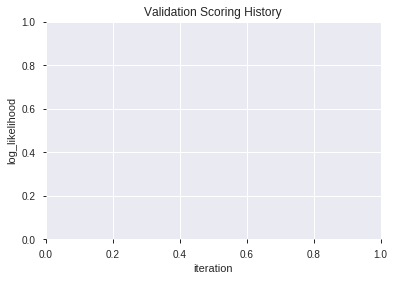

In [108]:
# Super learner
models_df = pd.DataFrame()
for model_name in best_models:
  if best_models[max(best_models.keys(), key=(lambda k: best_models[k]['AUC']))]['AUC'] - best_models[model_name]['AUC'] <= ensemble_model_threshold:
    models_df[model_name] = pd.read_csv(model_name+".csv")['p1']
    models_df[model_name+'predict'] = pd.read_csv(model_name+".csv")['predict']

models_df[data_label_name] = pd.read_pickle('scaled_df')[[data_label_name]].values[-len(models_df):]

training_frame = h2o.H2OFrame(models_df)
training_frame[data_label_name] = training_frame[data_label_name].ascharacter().asfactor()

model_train(feature_name='Super_learner',model_algo=None,training_frame= training_frame,max_models=500)

In [109]:
# Majority Voting
models1_df = pd.DataFrame()
for model_name in best_models:
  if best_models[max(best_models.keys(), key=(lambda k: best_models[k]['AUC']))]['AUC'] - best_models[model_name]['AUC'] <= ensemble_model_threshold:
    models1_df[model_name] = pd.read_csv(model_name+".csv")['predict']

model_accuracy = accuracy_score(models1_df.mode(1)[0].values[index_splits[1]:],pd.read_pickle('scaled_df')[[data_label_name]].values[index_splits[1]:])
models_summary['accuracy'] = models_summary['accuracy'].append(pd.DataFrame({'MajorityVoting':[model_accuracy]},index=['All']))
display('MajorityVoting', model_accuracy)

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


'MajorityVoting'

0.7115072933549432

In [110]:
# LogReg SuperLearner
from sklearn.linear_model import LogisticRegression
models2_df = pd.DataFrame()
for model_name in best_models:
  if best_models[max(best_models.keys(), key=(lambda k: best_models[k]['AUC']))]['AUC'] - best_models[model_name]['AUC'] <= ensemble_model_threshold:
    models2_df[model_name] = pd.read_csv(model_name+".csv")['predict']
    models2_df[model_name+'p1'] = pd.read_csv(model_name+".csv")['p1']

clf = LogisticRegression(random_state=0, solver='lbfgs',
                         multi_class='multinomial').fit(models2_df.values[index_splits[0]:index_splits[1]], pd.read_pickle('scaled_df')[[data_label_name]].values[index_splits[0]:index_splits[1]])

model_accuracy = clf.score(models2_df.values[index_splits[1]:], pd.read_pickle('scaled_df')[[data_label_name]].values[index_splits[1]:])
models_summary['accuracy'] = models_summary['accuracy'].append(pd.DataFrame({'LogReg':[model_accuracy]},index=['All']))
model_accuracy

/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:947: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


0.7082658022690438

In [111]:
# DTree SuperLearner
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier(random_state=0).fit(models2_df.values[index_splits[0]:index_splits[1]], pd.read_pickle('scaled_df')[[data_label_name]].values[index_splits[0]:index_splits[1]])

model_accuracy = clf.score(models2_df.values[index_splits[1]:], pd.read_pickle('scaled_df')[[data_label_name]].values[index_splits[1]:])
models_summary['accuracy'] = models_summary['accuracy'].append(pd.DataFrame({'DTree':[model_accuracy]},index=['All']))
model_accuracy

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


0.6012965964343598

In [112]:
# Experiment Summary
pd.set_option('precision', 3) 

for k in models_summary:
  print(k)
  display(models_summary[k].max())
  print('\n'*3)
  display(models_summary[k].groupby(models_summary[k].index).max())
  print('\n'*3)
  
display(models_summary)

pd.set_option('precision', 6) 

accuracy


All                0.736
DRF                0.702
DTree              0.601
DeepLearning       0.733
GBM                0.736
GLM                0.721
LogReg             0.708
MajorityVoting     0.712
StackedEnsemble    0.728
XGBoost            0.729
dtype: float64

,All,DRF,DTree,DeepLearning,GBM,GLM,LogReg,MajorityVoting,StackedEnsemble,XGBoost
All,NaN,NaN,0.601,0.723,NaN,0.713,0.708,0.712,0.728,0.726
DLF,0.715,0.692,NaN,0.723,0.707,0.721,NaN,NaN,NaN,0.723
Fwe,0.718,0.690,NaN,0.710,0.718,0.718,NaN,NaN,NaN,0.721
RFE,0.716,0.697,NaN,0.733,0.723,0.716,NaN,NaN,NaN,0.715
Super_learner,0.723,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.736,0.702,NaN,0.721,0.736,0.715,NaN,NaN,NaN,0.729






F1


All                0.759
DRF                0.745
DeepLearning       0.759
GBM                0.759
GLM                0.751
StackedEnsemble    0.756
XGBoost            0.759
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.759,NaN,0.751,0.756,0.757
DLF,0.752,0.730,0.745,0.742,0.746,NaN,0.750
Fwe,0.745,0.745,0.739,0.745,0.734,NaN,0.756
RFE,0.749,0.734,0.751,0.749,0.749,NaN,0.747
Super_learner,0.753,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.759,0.737,0.751,0.759,0.743,NaN,0.759






auc


All                0.801
DRF                0.760
DeepLearning       0.784
GBM                0.801
GLM                0.780
StackedEnsemble    0.791
XGBoost            0.796
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.776,NaN,0.774,0.791,0.789
DLF,0.782,0.760,0.771,0.773,0.775,NaN,0.788
Fwe,0.780,0.746,0.766,0.780,0.766,NaN,0.779
RFE,0.780,0.744,0.784,0.779,0.780,NaN,0.782
Super_learner,0.790,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.801,0.759,0.779,0.801,0.774,NaN,0.796






logloss


All                0.573
DRF                0.654
DeepLearning       0.649
GBM                0.578
GLM                0.603
StackedEnsemble    0.558
XGBoost            0.572
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.592,NaN,0.603,0.558,0.570
DLF,0.572,0.641,0.582,0.578,0.575,NaN,0.567
Fwe,0.570,0.601,0.649,0.570,0.581,NaN,0.572
RFE,0.573,0.654,0.575,0.574,0.573,NaN,0.572
Super_learner,0.567,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.552,0.590,0.579,0.552,0.575,NaN,0.559






mean_per_class_error


All                0.286
DRF                0.310
DeepLearning       0.291
GBM                0.291
GLM                0.289
StackedEnsemble    0.272
XGBoost            0.286
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.281,NaN,0.289,0.272,0.275
DLF,0.286,0.306,0.279,0.291,0.280,NaN,0.277
Fwe,0.283,0.310,0.291,0.283,0.283,NaN,0.278
RFE,0.285,0.307,0.268,0.280,0.285,NaN,0.286
Super_learner,0.276,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.265,0.298,0.281,0.265,0.288,NaN,0.270






rmse


All                0.441
DRF                0.456
DeepLearning       0.472
GBM                0.444
GLM                0.456
StackedEnsemble    0.434
XGBoost            0.440
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.451,NaN,0.456,0.434,0.439
DLF,0.440,0.449,0.444,0.444,0.442,NaN,0.438
Fwe,0.440,0.454,0.472,0.440,0.445,NaN,0.440
RFE,0.441,0.456,0.442,0.441,0.441,NaN,0.440
Super_learner,0.437,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.431,0.449,0.444,0.431,0.442,NaN,0.434






mse


All                0.195
DRF                0.208
DeepLearning       0.222
GBM                0.197
GLM                0.208
StackedEnsemble    0.188
XGBoost            0.194
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.204,NaN,0.208,0.188,0.193
DLF,0.194,0.202,0.198,0.197,0.195,NaN,0.192
Fwe,0.194,0.206,0.222,0.194,0.198,NaN,0.194
RFE,0.195,0.208,0.195,0.194,0.195,NaN,0.194
Super_learner,0.191,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.186,0.202,0.197,0.186,0.195,NaN,0.188


{'F1':                  All    DRF  DeepLearning    GBM    GLM  StackedEnsemble  XGBoost
 All              NaN    NaN         0.759    NaN    NaN              NaN      NaN
 DLF              NaN    NaN         0.745    NaN    NaN              NaN      NaN
 DLF              NaN    NaN           NaN    NaN  0.746              NaN      NaN
 DLF              NaN    NaN           NaN    NaN    NaN              NaN    0.750
 DLF              NaN  0.730           NaN    NaN    NaN              NaN      NaN
 DLF              NaN    NaN           NaN  0.742    NaN              NaN      NaN
 DLF            0.752    NaN           NaN    NaN    NaN              NaN      NaN
 All              NaN    NaN           NaN    NaN  0.751              NaN      NaN
 All              NaN    NaN           NaN    NaN    NaN              NaN    0.757
 XGBF             NaN    NaN         0.751    NaN    NaN              NaN      NaN
 XGBF             NaN    NaN           NaN    NaN  0.743              NaN      Na